<a id="title_ID"></a>
# JWST Pipeline Validation Testing Notebook: spec2, flat_field step

<span style="color:red"> **Instruments Affected**</span>: NIRSpec 

Tested on CV3 data

### Table of Contents
<div style="text-align: left"> 

<br> [Imports](#imports_ID) <br> [Introduction](#intro_ID) <br> [Testing Data Set](#data_ID) <br> [Run the JWST pipeline and flat_field validation tests](#pipeline_ID): [FS Full-Frame test](#FULLFRAME), [FS ALLSLITS test](#ALLSLITS), [MOS test](#MOS), [IFU test](#IFU) <br> [About This Notebook](#about_ID)<br> [Results](#results) <br>

</div>

<a id="imports_ID"></a>
# Imports
The library imports relevant to this notebook are aready taken care of by importing PTT.

* astropy.io for opening fits files
* jwst.module.PipelineStep is the pipeline step being tested
* matplotlib.pyplot.plt to generate plot

NOTE: This notebook assumes that the pipeline version to be tested is already installed and its environment is activated.

To be able to run this notebook you need to install nptt. 

If all goes well you will be able to import PTT.

[Top of Page](#title_ID)

In [1]:
# Create a temporary directory to hold notebook output, and change the working directory to that directory.
import shutil
import os
from tempfile import TemporaryDirectory

use_tempdir = True
if use_tempdir:
    # Create temporary directory
    data_dir = TemporaryDirectory()
    # Save original directory
    orig_dir = os.getcwd()
    # Move to new directory
    os.chdir(data_dir.name)

# For info, print out where the script is running
print("Running in {}".format(os.getcwd()))

Running in /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9


In [2]:
# Choose CRDS cache location
use_local_crds_cache = False
crds_cache_tempdir = False
crds_cache_notebook_dir = True
crds_cache_home = False
crds_cache_custom_dir = False
crds_cache_dir_name = ""

if use_local_crds_cache:
    if crds_cache_tempdir:
        os.environ['CRDS_PATH'] = os.path.join(os.getcwd(), "crds")
    elif crds_cache_notebook_dir:
        try:
            os.environ['CRDS_PATH'] = os.path.join(orig_dir, "crds")
        except Exception as e:
            os.environ['CRDS_PATH'] = os.path.join(os.getcwd(), "crds")
    elif crds_cache_home:
        os.environ['CRDS_PATH'] = os.path.join(os.environ['HOME'], 'crds', 'cache')
    elif crds_cache_custom_dir:
        os.environ['CRDS_PATH'] = crds_cache_dir_name

In [3]:
import warnings
import psutil
from astropy.io import fits

# Only print a DeprecationWarning the first time it shows up, not every time.
with warnings.catch_warnings():
    warnings.simplefilter("once", category=DeprecationWarning)
    import jwst
    from jwst.pipeline.calwebb_detector1 import Detector1Pipeline
    from jwst.assign_wcs.assign_wcs_step import AssignWcsStep
    from jwst.msaflagopen.msaflagopen_step import MSAFlagOpenStep
    from jwst.extract_2d.extract_2d_step import Extract2dStep
    from jwst.srctype.srctype_step import SourceTypeStep
    from jwst.wavecorr.wavecorr_step import WavecorrStep
    from jwst.flatfield.flat_field_step import FlatFieldStep

# The latest version of NPTT is installed in the requirements text file at:
# /jwst_validation_notebooks/environment.yml

# import NPTT
import nirspec_pipe_testing_tool as nptt

# To get data from Artifactory
from ci_watson.artifactory_helpers import get_bigdata



2021-06-03 23:06:53,264 - stpipe - WARNING - /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/photutils/detection/findstars.py:33: AstropyDeprecationWarning: _StarFinderKernel was moved to the photutils.detection._utils module. Please update your import statement.
  warnings.warn(f'{name} was moved to the {deprecated[name]} module. '



In [4]:
# Print versions used for the pipeline and NPTT

pipeline_version = jwst.__version__
nptt_version = nptt.__version__

print("Using jwst pipeline version: ", pipeline_version)
print("Using NPTT version: ", nptt_version)

Using jwst pipeline version:  1.1.0
Using NPTT version:  1.1.16


<a id="intro_ID"></a>
# Test Description

The test is a direct comparison of the result of our implementation of the flat field step algorithm versus the pipeline's implementation, i.e.: 
              difference =  absolute( Flat_nirspec_implementation - Flat_pipeline)

We expect the absolute difference to be of the order of 1x10^-6. We set this threshold by assuming that the difference should yield computer precision 1x10^-7 numbers. We then relaxed one order of magnitude due to interpolation differences in the algorithms.

For the test to be considered PASSED, every single slit (for FS data), slitlet (for MOS data) or slice (for IFU data) in the input file has to pass. If there is any failure, the whole test will be considered as FAILED. 

The code for this test for Fixed Slits (FS) can be obtained from: https://github.com/spacetelescope/nirspec_pipe_testing_tool/blob/master/nirspec_pipe_testing_tool/calwebb_spec2_pytests/auxiliary_code/flattest_fs.py. For Multi Object Spectroscopy (MOS), the code is in the same repository but is named ```flattest_mos.py```, and for Integral Field Unit (IFU) data, the test is named ```flattest_ifu.py```.

The input file is defined in the variable ```input_file``` (see section [Testing Data Set and Variable Setup](#data_ID)).

Step description: https://jwst-pipeline.readthedocs.io/en/latest/jwst/flatfield/main.html

Pipeline code: https://github.com/spacetelescope/jwst/tree/master/jwst/flatfield


### Test Results

If the test **PASSED** this means that all slits, slitlets, or slices individually passed the test. However, if ony one individual slit (for FS data), slitlet (for MOS data) or slice (for IFU data) test failed, the whole test will be reported as **FAILED**.


### Calibration WG Requested Algorithm: 

A short description and link to the page: https://outerspace.stsci.edu/display/JWSTCC/Vanilla+Spectral+Flat+Field+Correction


### Defining Term
Acronymns used un this notebook:

pipeline: calibration pipeline

spec2: spectroscopic calibration pipeline level 2b

PTT: NIRSpec pipeline testing tool (https://github.com/spacetelescope/nirspec_pipe_testing_tool)


[Top of Page](#title_ID)

<a id="pipeline_ID"></a>
# Run the JWST pipeline and assign_wcs validation tests

The pipeline can be run from the command line in two variants: full or per step.

Tu run the spec2 pipeline in full use the command: 

$ strun jwst.pipeline.Spec2Pipeline jwtest_rate.fits

Tu only run the flat_field step, use the command:

$ strun jwst.flat_field.FlatFieldStep jwtest_extract_2d.fits

These options are also callable from a script with the testing environment active. The Python call for running the pipeline in full or by step are:

$\gt$ from jwst.pipeline.calwebb_spec2 import Spec2Pipeline

$\gt$ Spec2Pipeline.call(jwtest_rate.fits)
 
or
 
$\gt$ from jwst.flat_field.flat_field_step import FlatFieldStep
 
$\gt$ FlatFieldStep.call(jwtest_extract_2d.fits)

For the imaging pipeline the call would be as follows:

$\gt$ from jwst.pipeline.calwebb_image2 import Image2Pipeline

$\gt$ Image2Pipeline.call(jwtest_rate.fits)

NPTT can run the spec2 pipeline either in full or per step, as well as the imaging pipeline in full. In this notebook we will use NPTT to run the pipeline and the validation tests. To run NPTT, follow the directions in the corresponding repo page.

[Top of Page](#title_ID)

-> For each mode, the following variables will need to be set:
- output_directory = string, path where you want intermediary files and plots to be saved in, if writefile=True
- input_file = string or object, this is the output file from the previous step, e.g. jwtest1_NRS1_extract2d.fits
- dflat_path = string, path of where the D-flat reference fits files
- sflat_path = string, path of where the S-flat reference fits files
- fflat_path = string, path of where the F-flat reference fits files
- writefile = boolean, if True writes the fits files of the calculated flat, and the difference jpeg images
- save_figs = boolean, whether to save plots or not
- show_figs = boolean, whether to show plots or not 
- threshold_diff = float, threshold difference between pipeline output and ESA file


<a id="data_ID"></a>
# Testing Data Set

All testing data is from the CV3 campaign. We chose these files because this is our most complete data set, i.e. all modes and filter-grating combinations.

Data used was for testing:
- FS_PRISM_CLEAR
- FS_FULLFRAME_G395H_F290LP
- FS_ALLSLITS_G140H_F100LP 
- MOS_G140M_LINE1 
- MOS_PRISM_CLEAR
- IFU_G395H_F290LP 


[Top of Page](#title_ID)

In [5]:
testing_data = {
                'fs_prism_clear':{
                                  'uncal_file_nrs1': 'fs_prism_nrs1_uncal.fits',
                                  'uncal_file_nrs2': 'fs_prism_nrs2_uncal.fits',
                                  'sflat_nrs1': 'nirspec_FS_sflat_PRISM_OPAQUE_FLAT5_nrs1_f_01.01.fits',
                                  'sflat_nrs2': 'nirspec_FS_sflat_PRISM_OPAQUE_FLAT5_nrs2_f_01.01.fits',
                                  'fflat': 'nirspec_FS_fflat_CLEAR_01.01.fits',
                                  'msa_shutter_config': None },
                
                'fs_fullframe_g395h_f290lp':{
                                  'uncal_file_nrs1': 'fs_fullframe_g395h_f290lp_nrs1_uncal.fits',
                                  'uncal_file_nrs2': 'fs_fullframe_g395h_f290lp_nrs2_uncal.fits',
                                  'sflat_nrs1': 'nirspec_FS_sflat_G395H_OPAQUE_FLAT3_nrs1_f_01.01.fits',
                                  'sflat_nrs2': 'nirspec_FS_sflat_G395H_OPAQUE_FLAT3_nrs2_f_01.01.fits',  
                                  'fflat': 'nirspec_FS_fflat_F290LP_01.01.fits',
                                  'msa_shutter_config': None },
                
                # Commented out because the wavecor step crashes for this data set
                #'fs_allslits_g140h_f100lp':{
                #                  'uncal_file_nrs1': 'fs_allslits_g140h_f100lp_nrs1_uncal.fits',
                #                  'uncal_file_nrs2': 'fs_allslits_g140h_f100lp_nrs2_uncal.fits',
                #                  'sflat_nrs1': 'nirspec_FS_sflat_G140H_OPAQUE_FLAT1_nrs1_f_01.01.fits',
                #                  'sflat_nrs2': 'nirspec_FS_sflat_G140H_OPAQUE_FLAT1_nrs2_f_01.01.fits',
                #                  'fflat': 'nirspec_FS_fflat_F100LP_01.01.fits',
                #                  'msa_shutter_config': None },


                # Commented out because the wavecor step is not populating array for this data set
                #'bots_g235h_f170lp':{
                #                  'uncal_file_nrs1': 'bots_g235h_f170lp_nrs1_uncal.fits',
                #                  'uncal_file_nrs2': 'bots_g235h_f170lp_nrs2_uncal.fits',
                #                  'sflat_nrs1': 'nirspec_FS_sflat_G235H_OPAQUE_FLAT2_nrs1_f_01.01.fits',
                #                  'sflat_nrs2': 'nirspec_FS_sflat_G235H_OPAQUE_FLAT2_nrs2_f_01.01.fits',
                #                  'fflat': 'nirspec_FS_fflat_F170LP_01.01.fits',
                #                  'msa_shutter_config': None },

                
                'mos_prism_clear':{
                                  'uncal_file_nrs1': 'mos_prism_nrs1_uncal.fits',
                                  'uncal_file_nrs2': 'mos_prism_nrs2_uncal.fits',
                                  'sflat_nrs1': 'nirspec_MOS_sflat_PRISM_OPAQUE_FLAT5_nrs1_f_01.01.fits',
                                  'sflat_nrs2': 'nirspec_MOS_sflat_PRISM_OPAQUE_FLAT5_nrs2_f_01.01.fits',
                                  'fflat': 'nirspec_MOS_fflat_CLEAR_01.01.fits',
                                  'msa_shutter_config': 'V0030006000104_msa.fits' },
                
                'mos_g140m_f100lp':{
                                  'uncal_file_nrs1': 'mos_g140m_line1_NRS1_uncal.fits',
                                  'uncal_file_nrs2': 'mos_g140m_line1_NRS2_uncal.fits',  
                                  'sflat_nrs1': 'nirspec_MOS_sflat_G140M_OPAQUE_FLAT1_nrs1_f_01.01.fits',
                                  'sflat_nrs2': 'nirspec_MOS_sflat_G140M_OPAQUE_FLAT1_nrs2_f_01.01.fits',
                                  'fflat': 'nirspec_MOS_fflat_F100LP_01.01.fits',
                                  'msa_shutter_config': 'V8460001000101_msa.fits' },
                                  
                
                'ifu_prism_clear':{
                                  'uncal_file_nrs1': 'ifu_prism_nrs1_uncal.fits',
                                  'uncal_file_nrs2': 'ifu_prism_nrs2_uncal.fits',
                                  'sflat_nrs1': 'nirspec_IFU_sflat_PRISM_OPAQUE_FLAT5_nrs1_f_01.01.fits',
                                  'sflat_nrs2': 'nirspec_IFU_sflat_PRISM_OPAQUE_FLAT5_nrs2_f_01.01.fits',
                                  'fflat': 'nirspec_IFU_fflat_CLEAR_01.01.fits',
                                  'msa_shutter_config': None },

                'ifu_g395h_f290lp':{
                                  'uncal_file_nrs1': 'ifu_g395h_f290lp_nrs1_uncal.fits',
                                  'uncal_file_nrs2': 'ifu_g395h_f290lp_nrs2_uncal.fits',
                                  'sflat_nrs1': 'nirspec_IFU_sflat_G395H_OPAQUE_FLAT3_nrs1_f_01.01.fits',
                                  'sflat_nrs2': 'nirspec_IFU_sflat_G395H_OPAQUE_FLAT3_nrs2_f_01.01.fits',
                                  'fflat': 'nirspec_IFU_fflat_F290LP_01.01.fits',
                                  'msa_shutter_config': None }

               }


In [6]:
# define function to pull data from Artifactory
def get_artifactory_file(data_set_dict, detector):
    """This function creates a list with all the files needed per detector to run the test.
    Args:
        data_set_dict: dictionary, contains inputs for a specific mode and configuration
        detector: string, either nrs1 or nrs2
    Returns:
        data: list, contains all files needed to run test
    """
    files2obtain = ['uncal_file_nrs1', 'sflat_nrs1', 'fflat', 'msa_shutter_config']
    data = []
    for file in files2obtain:
        data_file = None
        try: 
            if '_nrs' in file and '2' in detector:
                file = file.replace('_nrs1', '_nrs2')

            data_file = get_bigdata('jwst_validation_notebooks',
                                         'validation_data',
                                         'nirspec_data', 
                                         data_set_dict[file])
        except TypeError:
            data.append(None)
            continue

        data.append(data_file)

    return data
    

Getting D-Flats from Artifactory...


Got D-flats
Starting to run pipeline and test...
Testing files for detector:  nrs1


Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_prism_nrs1_uncal.fits


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stdatamodels/validate.py:34: ValidationWarning: While validating meta.instrument.fixed_slit the following error occurred:
'FULL' is not one of ['S200A1', 'S200A2', 'S200B1', 'S400A1', 'S1600A1', 'NONE']

Failed validating 'enum' in schema:
    OrderedDict([('title', 'Name of fixed slit aperture used'),
                 ('type', 'string'),
                 ('enum',
                  ['S200A1',
                   'S200A2',
                   'S200B1',
                   'S400A1',
                   'S1600A1',
                   'NONE']),
                 ('fits_keyword', 'FXD_SLIT'),
                 ('blend_table', True)])

On instance:
    'FULL'
  warnings.warn(errmsg, ValidationWarning)


2021-06-03 23:07:14,646 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-03 23:07:14,665 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-03 23:07:14,667 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-03 23:07:14,669 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-03 23:07:14,671 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-03 23:07:14,672 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-03 23:07:14,674 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-03 23:07:14,676 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-03 23:07:14,678 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-03 23:07:14,679 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-03 23:07:14,681 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-03 23:07:14,682 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-03 23:07:14,684 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-03 23:07:14,685 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-03 23:07:14,686 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-03 23:07:14,688 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-03 23:07:14,689 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-03 23:07:14,691 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2021-06-03 23:07:14,797 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_prism_nrs1_uncal.fits',).


2021-06-03 23:07:14,807 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-03 23:07:14,970 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'fs_prism_nrs1_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-03 23:07:14,982 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0086.fits'.


2021-06-03 23:07:14,984 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits'.


2021-06-03 23:07:14,986 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0018.fits'.


2021-06-03 23:07:14,989 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0010.fits'.


2021-06-03 23:07:14,991 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-03 23:07:14,992 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0018.fits'.


2021-06-03 23:07:14,995 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_refpix_0022.fits'.


2021-06-03 23:07:14,997 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-03 23:07:14,998 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-03 23:07:14,999 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0020.fits'.


2021-06-03 23:07:15,002 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0113.fits'.


2021-06-03 23:07:15,004 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-03 23:07:15,005 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-03 23:07:15,006 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-03 23:07:15,404 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:15,406 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:07:15,597 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-03 23:07:15,598 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-03 23:07:15,600 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-03 23:07:15,696 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:15,698 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:07:15,727 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0010.fits


2021-06-03 23:07:16,174 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-03 23:07:16,283 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:16,285 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:07:16,304 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0020.fits


2021-06-03 23:07:17,079 - stpipe.Detector1Pipeline.saturation - INFO - Detected 9869 saturated pixels


2021-06-03 23:07:17,124 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-03 23:07:17,155 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-03 23:07:17,262 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:17,265 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:07:17,266 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-03 23:07:17,268 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-03 23:07:17,364 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:17,365 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:07:17,385 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0113.fits


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stdatamodels/validate.py:34: ValidationWarning: While validating meta.exposure.readpatt the following error occurred:
'ALLIRS2' is not one of ['ACQ1', 'ACQ2', 'BRIGHT1', 'BRIGHT2', 'DEEP2', 'DEEP8', 'FAST', 'FASTGRPAVG', 'FASTGRPAVG8', 'FASTGRPAVG16', 'FASTGRPAVG32', 'FASTGRPAVG64', 'FASTR1', 'FASTR100', 'FGS', 'FGS60', 'FGS8370', 'FGS840', 'FGSRAPID', 'FINEGUIDE', 'ID', 'MEDIUM2', 'MEDIUM8', 'NIS', 'NISRAPID', 'NRS', 'NRSIRS2', 'NRSN16R4', 'NRSN32R8', 'NRSN8R2', 'NRSRAPID', 'NRSIRS2RAPID', 'NRSRAPIDD1', 'NRSRAPIDD2', 'NRSRAPIDD6', 'NRSSLOW', 'RAPID', 'SHALLOW2', 'SHALLOW4', 'SLOW', 'SLOWR1', 'TRACK', 'ANY', 'N/A']

Failed validating 'enum' in schema:
    OrderedDict([('title', 'Readout pattern'),
                 ('type', 'string'),
                 ('enum',
                  ['ACQ1',
                   'ACQ2',
                   'BRIGHT1',


2021-06-03 23:07:17,867 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-03 23:07:17,972 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:17,974 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-03 23:07:17,993 - stpipe.Detector1Pipeline.refpix - INFO - Using refpix reference file: /grp/crds/cache/references/jwst/jwst_nirspec_refpix_0022.fits


2021-06-03 23:07:32,922 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-03 23:07:33,190 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:33,192 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:07:33,217 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0018.fits


2021-06-03 23:07:33,997 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-03 23:07:34,118 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:34,119 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-03 23:07:34,199 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0086.fits


2021-06-03 23:07:38,845 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=4, nframes=1, groupgap=0


2021-06-03 23:07:38,848 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=65, nframes=1, groupgap=0


2021-06-03 23:07:39,697 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-03 23:07:40,508 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:40,510 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-03 23:07:40,545 - stpipe.Detector1Pipeline.jump - WARNING - Can not apply jump detection when NGROUPS<=4;


2021-06-03 23:07:40,546 - stpipe.Detector1Pipeline.jump - WARNING - Jump step will be skipped


2021-06-03 23:07:40,712 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-03 23:07:40,843 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:40,845 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-03 23:07:40,968 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0018.fits


2021-06-03 23:07:41,013 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits


2021-06-03 23:07:41,067 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-03 23:07:41,068 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2021-06-03 23:07:53,834 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 4


2021-06-03 23:07:53,836 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:1091: RuntimeWarning: divide by zero encountered in true_divide
  var_p2 = 1/(s_inv_var_p3.sum(axis=0))
2021-06-03 23:07:53,978 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-03 23:07:54,096 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:54,098 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:07:54,164 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:07:54,165 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:07:54,168 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:07:54,252 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:54,254 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:07:54,314 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:07:54,315 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:07:54,319 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:07:54,320 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-03 23:07:54,322 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-03 23:07:54,331 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-03 23:07:54,457 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<ImageModel(2048, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:54,459 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-03 23:07:54,632 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.0332140289247036 deg


2021-06-03 23:07:54,634 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3367482721805573 deg


2021-06-03 23:07:54,635 - stpipe.AssignWcsStep - INFO - theta_y correction: -1.0907214098475986e-05 deg


2021-06-03 23:07:54,637 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:07:54,999 - stpipe.AssignWcsStep - INFO - Removing slit S200B1 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:07:55,001 - stpipe.AssignWcsStep - INFO - Slits projected on detector NRS1: ['S200A1', 'S200A2', 'S400A1', 'S1600A1']


2021-06-03 23:07:55,001 - stpipe.AssignWcsStep - INFO - Computing WCS for 4 open slitlets


2021-06-03 23:07:55,029 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.0332140289247036 deg


2021-06-03 23:07:55,029 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3367482721805573 deg


2021-06-03 23:07:55,030 - stpipe.AssignWcsStep - INFO - theta_y correction: -1.0907214098475986e-05 deg


2021-06-03 23:07:55,031 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:07:55,040 - stpipe.AssignWcsStep - INFO - SPORDER= 0, wrange=[6e-07, 5.3e-06]


2021-06-03 23:07:55,160 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 1


2021-06-03 23:07:55,161 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 2


2021-06-03 23:07:55,161 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 3


2021-06-03 23:07:55,162 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 4


2021-06-03 23:07:55,163 - stpipe.AssignWcsStep - INFO - There are 4 open slits in quadrant 5


2021-06-03 23:07:55,330 - stpipe.AssignWcsStep - INFO - Created a NIRSPEC nrs_fixedslit pipeline with references {'distortion': None, 'filteroffset': None, 'specwcs': None, 'regions': None, 'wavelengthrange': '/grp/crds/cache/references/jwst/jwst_nirspec_wavelengthrange_0004.asdf', 'camera': '/grp/crds/cache/references/jwst/jwst_nirspec_camera_0004.asdf', 'collimator': '/grp/crds/cache/references/jwst/jwst_nirspec_collimator_0004.asdf', 'disperser': '/grp/crds/cache/references/jwst/jwst_nirspec_disperser_0034.asdf', 'fore': '/grp/crds/cache/references/jwst/jwst_nirspec_fore_0028.asdf', 'fpa': '/grp/crds/cache/references/jwst/jwst_nirspec_fpa_0005.asdf', 'msa': '/grp/crds/cache/references/jwst/jwst_nirspec_msa_0005.asdf', 'ote': '/grp/crds/cache/references/jwst/jwst_nirspec_ote_0005.asdf', 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2021-06-03 23:07:55,706 - stpipe.AssignWcsStep - INFO - COMPLETED assign_wcs


2021-06-03 23:07:55,713 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep done


2021-06-03 23:07:55,723 - stpipe.Extract2dStep - INFO - Extract2dStep instance created.


2021-06-03 23:07:55,915 - stpipe.Extract2dStep - INFO - Step Extract2dStep running with args (<ImageModel(2048, 2048) from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:55,917 - stpipe.Extract2dStep - INFO - Step Extract2dStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'slit_name': None, 'extract_orders': None, 'tsgrism_extract_height': None, 'wfss_extract_half_height': 5, 'grism_objects': None, 'mmag_extract': 99.0}


2021-06-03 23:07:55,933 - stpipe.Extract2dStep - INFO - EXP_TYPE is NRS_FIXEDSLIT


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/utils.py:72: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  indx = np.asarray(np.floor(np.asarray(value) + 0.5), dtype=np.int)
2021-06-03 23:07:56,124 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S200A1


2021-06-03 23:07:56,124 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1083 1518


2021-06-03 23:07:56,125 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1056 1096


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)
2021-06-03 23:07:56,261 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:07:56,272 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.191685737 -45.682908511 156.190837415 -45.682092120 156.190771015 -45.682126390 156.191619323 -45.682942792


2021-06-03 23:07:56,273 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.191685737 -45.682908511 156.190837415 -45.682092120 156.190771015 -45.682126390 156.191619323 -45.682942792


2021-06-03 23:07:56,445 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S200A2


2021-06-03 23:07:56,446 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 892 1328


2021-06-03 23:07:56,446 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1020 1060


2021-06-03 23:07:56,574 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:07:56,584 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.184519149 -45.685298792 156.183675453 -45.684484578 156.183609578 -45.684518640 156.184453260 -45.685332865


2021-06-03 23:07:56,585 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.184519149 -45.685298792 156.183675453 -45.684484578 156.183609578 -45.684518640 156.184453260 -45.685332865


2021-06-03 23:07:56,979 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S400A1


2021-06-03 23:07:56,980 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1025 1460


2021-06-03 23:07:56,981 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 979 1024


2021-06-03 23:07:57,112 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:07:57,122 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.187759056 -45.682331806 156.186793281 -45.681401531 156.186663358 -45.681468621 156.187629101 -45.682398919


2021-06-03 23:07:57,123 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.187759056 -45.682331806 156.186793281 -45.681401531 156.186663358 -45.681468621 156.187629101 -45.682398919


2021-06-03 23:07:57,296 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S1600A1


2021-06-03 23:07:57,297 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1056 1488


2021-06-03 23:07:57,297 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 959 982


2021-06-03 23:07:57,435 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:07:57,446 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.187720636 -45.680802803 156.187307671 -45.680405209 156.186792650 -45.680671077 156.187205560 -45.681068709


2021-06-03 23:07:57,447 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.187720636 -45.680802803 156.187307671 -45.680405209 156.186792650 -45.680671077 156.187205560 -45.681068709


2021-06-03 23:07:57,581 - stpipe.Extract2dStep - INFO - Step Extract2dStep done


2021-06-03 23:07:57,973 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.


2021-06-03 23:07:58,226 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep running with args (<MultiSlitModel from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:58,228 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:07:58,236 - stpipe.SourceTypeStep - INFO - Input EXP_TYPE is NRS_FIXEDSLIT


2021-06-03 23:07:58,237 - stpipe.SourceTypeStep - INFO - Input SRCTYAPT = UNKNOWN


2021-06-03 23:07:58,238 - stpipe.SourceTypeStep - INFO - Input source type is unknown; setting default SRCTYPE = POINT


2021-06-03 23:07:58,241 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep done


2021-06-03 23:07:58,259 - stpipe.WavecorrStep - INFO - WavecorrStep instance created.


2021-06-03 23:07:58,459 - stpipe.WavecorrStep - INFO - Step WavecorrStep running with args (<MultiSlitModel from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:58,460 - stpipe.WavecorrStep - INFO - Step WavecorrStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:07:58,486 - stpipe.WavecorrStep - INFO - Using WAVECORR reference file /grp/crds/cache/references/jwst/jwst_nirspec_wavecorr_0001.asdf


2021-06-03 23:07:58,980 - stpipe.WavecorrStep - WARNING - Primary slit name not found in input


2021-06-03 23:07:58,981 - stpipe.WavecorrStep - WARNING - Skipping wavecorr correction


2021-06-03 23:07:58,983 - stpipe.WavecorrStep - INFO - Step WavecorrStep done


2021-06-03 23:07:59,000 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.


2021-06-03 23:07:59,222 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<MultiSlitModel from fs_prism_nrs1_uncal.fits>,).


2021-06-03 23:07:59,224 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': True, 'user_supplied_flat': None, 'inverse': False}


2021-06-03 23:08:07,304 - stpipe.FlatFieldStep - INFO - Working on slit S200A1


2021-06-03 23:08:10,980 - stpipe.FlatFieldStep - INFO - Working on slit S200A2


2021-06-03 23:08:14,798 - stpipe.FlatFieldStep - INFO - Working on slit S400A1


2021-06-03 23:08:18,916 - stpipe.FlatFieldStep - INFO - Working on slit S1600A1


2021-06-03 23:08:21,372 - stpipe.FlatFieldStep - INFO - Saved model in fs_prism_nrs1_interpolatedflat.fits


2021-06-03 23:08:21,373 - stpipe.FlatFieldStep - INFO - Interpolated flat written to "fs_prism_nrs1_interpolatedflat.fits".


2021-06-03 23:08:21,377 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep done


Running flat field test for FS...
Filename: fs_prism_nrs1_interpolatedflat.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     280   ()      
  1  SCI           1 ImageHDU        14   (435, 40)   float32   
  2  DQ            1 ImageHDU        11   (435, 40)   int32 (rescales to uint32)   
  3  ERR           1 ImageHDU         9   (435, 40)   float32   
  4  WAVELENGTH    1 ImageHDU         9   (435, 40)   float32   
  5  SCI           2 ImageHDU        14   (436, 40)   float32   
  6  DQ            2 ImageHDU        11   (436, 40)   int32 (rescales to uint32)   
  7  ERR           2 ImageHDU         9   (436, 40)   float32   
  8  WAVELENGTH    2 ImageHDU         9   (436, 40)   float32   
  9  SCI           3 ImageHDU        14   (435, 45)   float32   
 10  DQ            3 ImageHDU        11   (435, 45)   int32 (rescales to uint32)   
 11  ERR           3 ImageHDU         9   (435, 45)   float32   
 12  WAVELENGTH    3 ImageHDU      

/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


flat_field_file  -->     Grating:PRISM   Filter:CLEAR   LAMP:LINE4
Using D-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs1_f_01.03.fits
Using S-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_FS_sflat_PRISM_OPAQUE_FLAT5_nrs1_f_01.01.fits
Using F-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_FS_fflat_CLEAR_01.01.fits
Now looping through the slits. This may take a while... 

Working with slit: S200A1
exp_type =  NRS_FIXEDSLIT
SCI ext =  1
 Subwindow origin:   px0=1084   py0=1057
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 1.490e-05    median = 1.952e-06    stdev = 1.207e-03
    Maximum   AbsoluteFlat Difference = 6.227e-02
    Minimum   AbsoluteFlat Difference = -1.979e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 73%
                            ->  3xtheshold = 42%
                            ->  5xtheshold = 26%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS1_S200A1_histogram.png



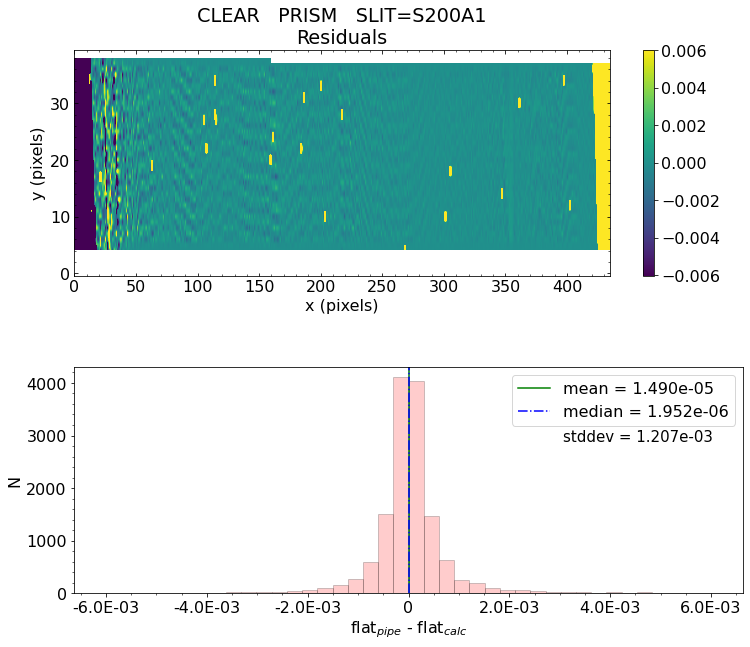


Working with slit: S200A2
exp_type =  NRS_FIXEDSLIT
SCI ext =  2
 Subwindow origin:   px0=893   py0=1021
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -3.300e-06    median = -2.243e-06    stdev = 1.363e-03
    Maximum   AbsoluteFlat Difference = 5.924e-02
    Minimum   AbsoluteFlat Difference = -2.108e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 74%
                            ->  3xtheshold = 44%
                            ->  5xtheshold = 27%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS1_S200A2_histogram.png



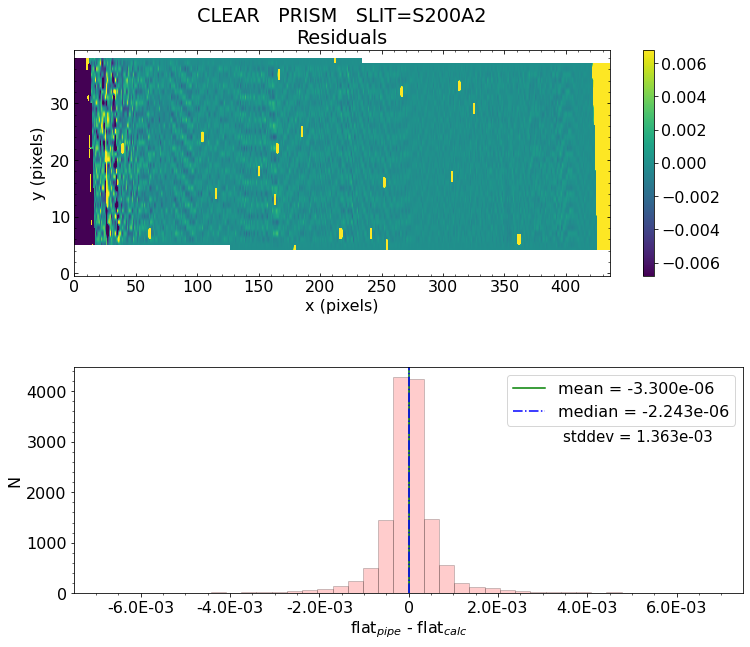


Working with slit: S400A1
exp_type =  NRS_FIXEDSLIT
SCI ext =  3
 Subwindow origin:   px0=1026   py0=980
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.962e-05    median = -6.283e-06    stdev = 1.964e-03
    Maximum   AbsoluteFlat Difference = 2.124e-02
    Minimum   AbsoluteFlat Difference = -3.407e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 84%
                            ->  3xtheshold = 65%
                            ->  5xtheshold = 51%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS1_S400A1_histogram.png



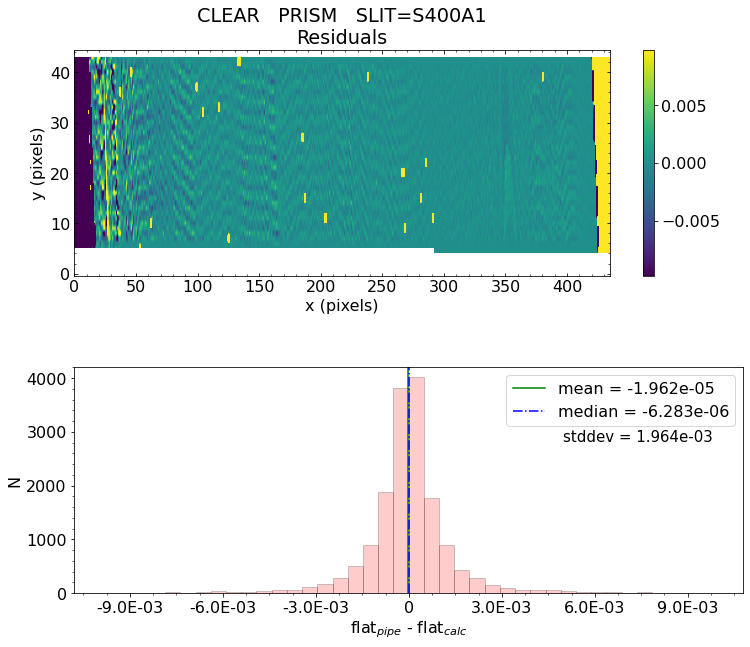


Working with slit: S1600A1
exp_type =  NRS_FIXEDSLIT
SCI ext =  4
 Subwindow origin:   px0=1057   py0=960
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 1.246e-04    median = 8.209e-05    stdev = 8.585e-03
    Maximum   AbsoluteFlat Difference = 9.924e-02
    Minimum   AbsoluteFlat Difference = -9.109e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 97%
                            ->  3xtheshold = 91%
                            ->  5xtheshold = 86%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS1_S1600A1_histogram.png



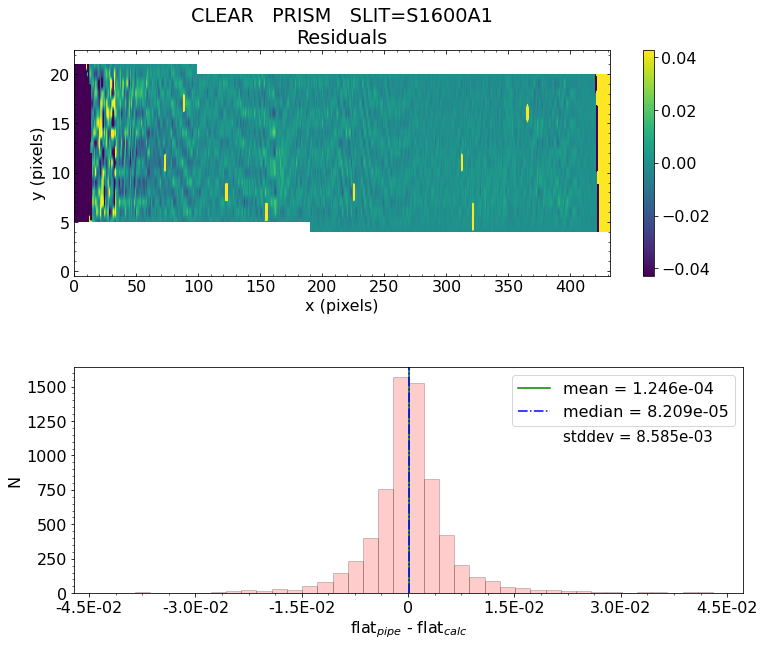


 *** Final result for flat_field test will be reported as PASSED *** 

('* Script flattest_fs.py took ', '5.569894564151764 minutes to finish.')
Did flat_field validation test passed?  All slits PASSED flat_field test. 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_prism_nrs1_interpolatedflat.fits', fd=46, position=999360, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs1_f_01.03.fits', fd=47, position=680480640, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_FS_sflat_PRISM_OPAQUE_FLAT5_nrs1_f_01.01.fits', fd=48, position=50791680, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9

Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_prism_nrs2_uncal.fits


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stdatamodels/validate.py:34: ValidationWarning: While validating meta.instrument.fixed_slit the following error occurred:
'FULL' is not one of ['S200A1', 'S200A2', 'S200B1', 'S400A1', 'S1600A1', 'NONE']

Failed validating 'enum' in schema:
    OrderedDict([('title', 'Name of fixed slit aperture used'),
                 ('type', 'string'),
                 ('enum',
                  ['S200A1',
                   'S200A2',
                   'S200B1',
                   'S400A1',
                   'S1600A1',
                   'NONE']),
                 ('fits_keyword', 'FXD_SLIT'),
                 ('blend_table', True)])

On instance:
    'FULL'
  warnings.warn(errmsg, ValidationWarning)


2021-06-03 23:13:57,243 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-03 23:13:57,262 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-03 23:13:57,264 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-03 23:13:57,265 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-03 23:13:57,266 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-03 23:13:57,268 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-03 23:13:57,269 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-03 23:13:57,270 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-03 23:13:57,272 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-03 23:13:57,273 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-03 23:13:57,274 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-03 23:13:57,275 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-03 23:13:57,277 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-03 23:13:57,278 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-03 23:13:57,279 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-03 23:13:57,281 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-03 23:13:57,282 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-03 23:13:57,283 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='fs_prism_nrs1_interpolatedflat.fits' mode='rb' closefd=True>
  gc.collect()
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_prism_nrs2_uncal.fits' mode='rb' closefd=True>
  gc.collect()
2021-06-03 23:13:57,524 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_prism_nrs2_uncal.fits',).


2021-06-03 23:13:57,534 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-03 23:13:57,654 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'fs_prism_nrs2_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-03 23:13:57,667 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0087.fits'.


2021-06-03 23:13:57,670 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits'.


2021-06-03 23:13:57,674 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0021.fits'.


2021-06-03 23:13:57,677 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0011.fits'.


2021-06-03 23:13:57,681 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-03 23:13:57,682 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0017.fits'.


2021-06-03 23:13:57,685 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_refpix_0020.fits'.


2021-06-03 23:13:57,689 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-03 23:13:57,690 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-03 23:13:57,691 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0021.fits'.


2021-06-03 23:13:57,695 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0114.fits'.


2021-06-03 23:13:57,698 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-03 23:13:57,699 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-03 23:13:57,700 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-03 23:13:58,071 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:13:58,073 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:13:58,230 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-03 23:13:58,231 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-03 23:13:58,233 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-03 23:13:58,350 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:13:58,353 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:13:58,373 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0011.fits


2021-06-03 23:13:58,781 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-03 23:13:58,904 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:13:58,907 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:13:58,926 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0021.fits


2021-06-03 23:13:59,596 - stpipe.Detector1Pipeline.saturation - INFO - Detected 5379 saturated pixels


2021-06-03 23:13:59,624 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-03 23:13:59,653 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-03 23:13:59,794 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:13:59,797 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:13:59,798 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-03 23:13:59,800 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-03 23:13:59,914 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:13:59,916 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:13:59,935 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0114.fits


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stdatamodels/validate.py:34: ValidationWarning: While validating meta.exposure.readpatt the following error occurred:
'ALLIRS2' is not one of ['ACQ1', 'ACQ2', 'BRIGHT1', 'BRIGHT2', 'DEEP2', 'DEEP8', 'FAST', 'FASTGRPAVG', 'FASTGRPAVG8', 'FASTGRPAVG16', 'FASTGRPAVG32', 'FASTGRPAVG64', 'FASTR1', 'FASTR100', 'FGS', 'FGS60', 'FGS8370', 'FGS840', 'FGSRAPID', 'FINEGUIDE', 'ID', 'MEDIUM2', 'MEDIUM8', 'NIS', 'NISRAPID', 'NRS', 'NRSIRS2', 'NRSN16R4', 'NRSN32R8', 'NRSN8R2', 'NRSRAPID', 'NRSIRS2RAPID', 'NRSRAPIDD1', 'NRSRAPIDD2', 'NRSRAPIDD6', 'NRSSLOW', 'RAPID', 'SHALLOW2', 'SHALLOW4', 'SLOW', 'SLOWR1', 'TRACK', 'ANY', 'N/A']

Failed validating 'enum' in schema:
    OrderedDict([('title', 'Readout pattern'),
                 ('type', 'string'),
                 ('enum',
                  ['ACQ1',
                   'ACQ2',
                   'BRIGHT1',


2021-06-03 23:14:00,381 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-03 23:14:00,514 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:00,516 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-03 23:14:00,535 - stpipe.Detector1Pipeline.refpix - INFO - Using refpix reference file: /grp/crds/cache/references/jwst/jwst_nirspec_refpix_0020.fits


2021-06-03 23:14:14,945 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-03 23:14:15,202 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:15,204 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:14:15,224 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0021.fits


2021-06-03 23:14:15,985 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-03 23:14:16,136 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:16,138 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-03 23:14:16,195 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0087.fits


2021-06-03 23:14:20,887 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=4, nframes=1, groupgap=0


2021-06-03 23:14:20,889 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=65, nframes=1, groupgap=0


2021-06-03 23:14:21,629 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-03 23:14:22,504 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:22,506 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-03 23:14:22,539 - stpipe.Detector1Pipeline.jump - WARNING - Can not apply jump detection when NGROUPS<=4;


2021-06-03 23:14:22,541 - stpipe.Detector1Pipeline.jump - WARNING - Jump step will be skipped


2021-06-03 23:14:22,686 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-03 23:14:22,824 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 4, 3200, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:22,827 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-03 23:14:22,933 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0017.fits


2021-06-03 23:14:22,980 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits


2021-06-03 23:14:23,034 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-03 23:14:23,035 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2021-06-03 23:14:34,874 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 4


2021-06-03 23:14:34,876 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:1091: RuntimeWarning: divide by zero encountered in true_divide
  var_p2 = 1/(s_inv_var_p3.sum(axis=0))
2021-06-03 23:14:35,007 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-03 23:14:35,145 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:35,148 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:14:35,205 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:14:35,207 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:14:35,210 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:14:35,331 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:35,334 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:14:35,396 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:14:35,397 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:14:35,401 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:14:35,402 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-03 23:14:35,404 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-03 23:14:35,413 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-03 23:14:35,542 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<ImageModel(2048, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:35,545 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-03 23:14:35,721 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.0332140289247036 deg


2021-06-03 23:14:35,722 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3367482721805573 deg


2021-06-03 23:14:35,724 - stpipe.AssignWcsStep - INFO - theta_y correction: -1.0907214098475986e-05 deg


2021-06-03 23:14:35,725 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:14:35,926 - stpipe.AssignWcsStep - INFO - Removing slit S200A1 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:14:35,968 - stpipe.AssignWcsStep - INFO - Removing slit S200A2 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:14:36,008 - stpipe.AssignWcsStep - INFO - Removing slit S400A1 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:14:36,048 - stpipe.AssignWcsStep - INFO - Removing slit S1600A1 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:14:36,088 - stpipe.AssignWcsStep - INFO - Slits projected on detector NRS2: ['S200B1']


2021-06-03 23:14:36,088 - stpipe.AssignWcsStep - INFO - Computing WCS for 1 open slitlets


2021-06-03 23:14:36,117 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.0332140289247036 deg


2021-06-03 23:14:36,118 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3367482721805573 deg


2021-06-03 23:14:36,118 - stpipe.AssignWcsStep - INFO - theta_y correction: -1.0907214098475986e-05 deg


2021-06-03 23:14:36,119 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:14:36,128 - stpipe.AssignWcsStep - INFO - SPORDER= 0, wrange=[6e-07, 5.3e-06]


2021-06-03 23:14:36,248 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 1


2021-06-03 23:14:36,249 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 2


2021-06-03 23:14:36,250 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 3


2021-06-03 23:14:36,251 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 4


2021-06-03 23:14:36,252 - stpipe.AssignWcsStep - INFO - There are 1 open slits in quadrant 5


2021-06-03 23:14:36,399 - stpipe.AssignWcsStep - INFO - Created a NIRSPEC nrs_fixedslit pipeline with references {'distortion': None, 'filteroffset': None, 'specwcs': None, 'regions': None, 'wavelengthrange': '/grp/crds/cache/references/jwst/jwst_nirspec_wavelengthrange_0004.asdf', 'camera': '/grp/crds/cache/references/jwst/jwst_nirspec_camera_0004.asdf', 'collimator': '/grp/crds/cache/references/jwst/jwst_nirspec_collimator_0004.asdf', 'disperser': '/grp/crds/cache/references/jwst/jwst_nirspec_disperser_0034.asdf', 'fore': '/grp/crds/cache/references/jwst/jwst_nirspec_fore_0028.asdf', 'fpa': '/grp/crds/cache/references/jwst/jwst_nirspec_fpa_0005.asdf', 'msa': '/grp/crds/cache/references/jwst/jwst_nirspec_msa_0005.asdf', 'ote': '/grp/crds/cache/references/jwst/jwst_nirspec_ote_0005.asdf', 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2021-06-03 23:14:36,521 - stpipe.AssignWcsStep - INFO - COMPLETED assign_wcs


2021-06-03 23:14:36,530 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep done


2021-06-03 23:14:36,541 - stpipe.Extract2dStep - INFO - Extract2dStep instance created.


2021-06-03 23:14:36,681 - stpipe.Extract2dStep - INFO - Step Extract2dStep running with args (<ImageModel(2048, 2048) from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:36,684 - stpipe.Extract2dStep - INFO - Step Extract2dStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'slit_name': None, 'extract_orders': None, 'tsgrism_extract_height': None, 'wfss_extract_half_height': 5, 'grism_objects': None, 'mmag_extract': 99.0}


2021-06-03 23:14:36,703 - stpipe.Extract2dStep - INFO - EXP_TYPE is NRS_FIXEDSLIT


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/utils.py:72: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  indx = np.asarray(np.floor(np.asarray(value) + 0.5), dtype=np.int)
2021-06-03 23:14:36,848 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S200B1


2021-06-03 23:14:36,849 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 440 864


2021-06-03 23:14:36,850 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 918 962


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


2021-06-03 23:14:36,984 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:14:36,996 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.238745821 -45.653926065 156.237887188 -45.653118339 156.237822146 -45.653151380 156.238680762 -45.653959111


2021-06-03 23:14:36,998 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.238745821 -45.653926065 156.237887188 -45.653118339 156.237822146 -45.653151380 156.238680762 -45.653959111


2021-06-03 23:14:37,034 - stpipe.Extract2dStep - INFO - Step Extract2dStep done


2021-06-03 23:14:37,047 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.


2021-06-03 23:14:37,185 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep running with args (<MultiSlitModel from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:37,188 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:14:37,196 - stpipe.SourceTypeStep - INFO - Input EXP_TYPE is NRS_FIXEDSLIT


2021-06-03 23:14:37,197 - stpipe.SourceTypeStep - INFO - Input SRCTYAPT = UNKNOWN


2021-06-03 23:14:37,198 - stpipe.SourceTypeStep - INFO - Input source type is unknown; setting default SRCTYPE = POINT


2021-06-03 23:14:37,200 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep done


2021-06-03 23:14:37,214 - stpipe.WavecorrStep - INFO - WavecorrStep instance created.


2021-06-03 23:14:37,328 - stpipe.WavecorrStep - INFO - Step WavecorrStep running with args (<MultiSlitModel from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:37,331 - stpipe.WavecorrStep - INFO - Step WavecorrStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:14:37,361 - stpipe.WavecorrStep - INFO - Using WAVECORR reference file /grp/crds/cache/references/jwst/jwst_nirspec_wavecorr_0001.asdf


2021-06-03 23:14:37,538 - stpipe.WavecorrStep - WARNING - Primary slit name not found in input


2021-06-03 23:14:37,540 - stpipe.WavecorrStep - WARNING - Skipping wavecorr correction


2021-06-03 23:14:37,543 - stpipe.WavecorrStep - INFO - Step WavecorrStep done


2021-06-03 23:14:37,554 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.


2021-06-03 23:14:37,675 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<MultiSlitModel from fs_prism_nrs2_uncal.fits>,).


2021-06-03 23:14:37,677 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': True, 'user_supplied_flat': None, 'inverse': False}


2021-06-03 23:14:47,590 - stpipe.FlatFieldStep - INFO - Working on slit S200B1


2021-06-03 23:14:51,846 - stpipe.FlatFieldStep - INFO - Saved model in fs_prism_nrs2_interpolatedflat.fits


2021-06-03 23:14:51,847 - stpipe.FlatFieldStep - INFO - Interpolated flat written to "fs_prism_nrs2_interpolatedflat.fits".


2021-06-03 23:14:51,851 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep done


Running flat field test for FS...
Filename: fs_prism_nrs2_interpolatedflat.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     280   ()      
  1  SCI           1 ImageHDU        14   (424, 44)   float32   
  2  DQ            1 ImageHDU        11   (424, 44)   int32 (rescales to uint32)   
  3  ERR           1 ImageHDU         9   (424, 44)   float32   
  4  WAVELENGTH    1 ImageHDU         9   (424, 44)   float32   
  5  ASDF          1 BinTableHDU     11   1R x 1C   [96250B]   


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


flat_field_file  -->     Grating:PRISM   Filter:CLEAR   LAMP:LINE4
Using D-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs2_f_01.03.fits
Using S-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_FS_sflat_PRISM_OPAQUE_FLAT5_nrs2_f_01.01.fits
 * S-Flat-Field file does not have extensions for slits 200A1, 200A2, 400A, or 1600A, trying with 200B
Using F-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_FS_fflat_CLEAR_01.01.fits
Now looping through the slits. This may take a while... 

Working with slit: S200B1
exp_type =  NRS_FIXEDSLIT
SCI ext =  1
 Subwindow origin:   px0=441   py0=919
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 1.670e-06    median = -2.495e-07    stdev = 1.192e-03
    Maximum   AbsoluteFlat Difference = 8.731e-02
    Minimum   AbsoluteFlat Difference = -1.558e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 68%
                            ->  3xtheshold = 37%
                            ->  5xtheshold = 22%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS2_S200B1_histogram.png



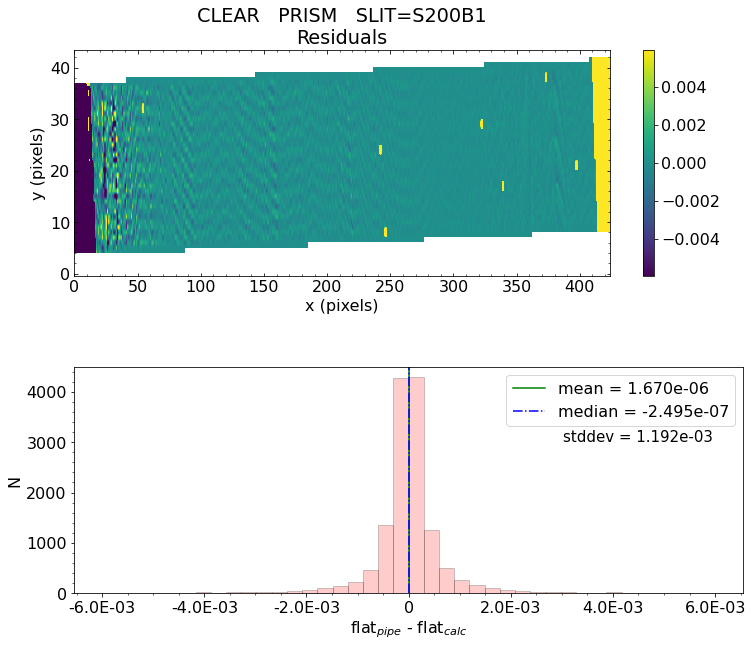


 *** Final result for flat_field test will be reported as PASSED *** 

('* Script flattest_fs.py took ', '1.5298736890157063 minutes to finish.')
Did flat_field validation test passed?  All slits PASSED flat_field test. 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_prism_nrs2_interpolatedflat.fits', fd=49, position=100800, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs2_f_01.03.fits', fd=50, position=680480640, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_FS_sflat_PRISM_OPAQUE_FLAT5_nrs2_f_01.01.fits', fd=58, position=50463360, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw

Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_fullframe_g395h_f290lp_nrs1_uncal.fits


2021-06-03 23:16:25,562 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-03 23:16:25,579 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-03 23:16:25,581 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-03 23:16:25,582 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-03 23:16:25,584 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-03 23:16:25,585 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-03 23:16:25,587 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-03 23:16:25,589 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-03 23:16:25,590 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-03 23:16:25,591 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-03 23:16:25,593 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-03 23:16:25,594 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-03 23:16:25,595 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-03 23:16:25,597 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-03 23:16:25,598 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-03 23:16:25,600 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-03 23:16:25,601 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-03 23:16:25,603 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='fs_prism_nrs2_interpolatedflat.fits' mode='rb' closefd=True>
  gc.collect()
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_fullframe_g395h_f290lp_nrs1_uncal.fits' mode='rb' closefd=True>
  gc.collect()


2021-06-03 23:16:25,946 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_fullframe_g395h_f290lp_nrs1_uncal.fits',).


2021-06-03 23:16:25,957 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-03 23:16:26,195 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'fs_fullframe_g395h_f290lp_nrs1_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-03 23:16:26,208 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0086.fits'.


2021-06-03 23:16:26,210 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits'.


2021-06-03 23:16:26,211 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0018.fits'.


2021-06-03 23:16:26,213 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0010.fits'.


2021-06-03 23:16:26,215 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-03 23:16:26,215 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0018.fits'.


2021-06-03 23:16:26,216 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_refpix_0022.fits'.


2021-06-03 23:16:26,218 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-03 23:16:26,218 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-03 23:16:26,219 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0020.fits'.


2021-06-03 23:16:26,220 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0113.fits'.


2021-06-03 23:16:26,222 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-03 23:16:26,223 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-03 23:16:26,223 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-03 23:16:26,979 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:16:26,981 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:16:27,206 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-03 23:16:27,208 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-03 23:16:27,209 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-03 23:16:27,440 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:16:27,442 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:16:27,464 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0010.fits


2021-06-03 23:16:28,075 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-03 23:16:28,307 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:16:28,309 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:16:28,330 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0020.fits


2021-06-03 23:16:29,374 - stpipe.Detector1Pipeline.saturation - INFO - Detected 11377 saturated pixels


2021-06-03 23:16:29,461 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-03 23:16:29,495 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-03 23:16:29,775 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:16:29,777 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:16:29,778 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-03 23:16:29,780 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-03 23:16:30,020 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:16:30,022 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:16:30,047 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0113.fits


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stdatamodels/validate.py:34: ValidationWarning: While validating meta.exposure.readpatt the following error occurred:
'ALLIRS2' is not one of ['ACQ1', 'ACQ2', 'BRIGHT1', 'BRIGHT2', 'DEEP2', 'DEEP8', 'FAST', 'FASTGRPAVG', 'FASTGRPAVG8', 'FASTGRPAVG16', 'FASTGRPAVG32', 'FASTGRPAVG64', 'FASTR1', 'FASTR100', 'FGS', 'FGS60', 'FGS8370', 'FGS840', 'FGSRAPID', 'FINEGUIDE', 'ID', 'MEDIUM2', 'MEDIUM8', 'NIS', 'NISRAPID', 'NRS', 'NRSIRS2', 'NRSN16R4', 'NRSN32R8', 'NRSN8R2', 'NRSRAPID', 'NRSIRS2RAPID', 'NRSRAPIDD1', 'NRSRAPIDD2', 'NRSRAPIDD6', 'NRSSLOW', 'RAPID', 'SHALLOW2', 'SHALLOW4', 'SLOW', 'SLOWR1', 'TRACK', 'ANY', 'N/A']

Failed validating 'enum' in schema:
    OrderedDict([('title', 'Readout pattern'),
                 ('type', 'string'),
                 ('enum',
                  ['ACQ1',
                   'ACQ2',
                   'BRIGHT1',


2021-06-03 23:16:30,671 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-03 23:16:30,917 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:16:30,919 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-03 23:16:30,940 - stpipe.Detector1Pipeline.refpix - INFO - Using refpix reference file: /grp/crds/cache/references/jwst/jwst_nirspec_refpix_0022.fits


2021-06-03 23:16:55,589 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-03 23:16:55,936 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:16:55,938 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:16:55,959 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0018.fits


2021-06-03 23:16:57,043 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-03 23:16:57,185 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:16:57,187 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-03 23:16:57,290 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0086.fits


2021-06-03 23:17:02,296 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=7, nframes=1, groupgap=0


2021-06-03 23:17:02,297 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=65, nframes=1, groupgap=0


2021-06-03 23:17:03,162 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-03 23:17:04,037 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:17:04,040 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-03 23:17:04,094 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 4 sigma


2021-06-03 23:17:04,173 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits


2021-06-03 23:17:04,323 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0018.fits


2021-06-03 23:17:04,374 - stpipe.Detector1Pipeline.jump - INFO - Found 32 possible cores to use for jump detection 


2021-06-03 23:17:04,807 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2021-06-03 23:17:05,109 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2021-06-03 23:17:06,575 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier Two-point found 88509 pixels with at least one CR


2021-06-03 23:17:09,221 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 4.41222 sec


2021-06-03 23:17:09,224 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 5.129254


2021-06-03 23:17:09,228 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-03 23:17:09,367 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:17:09,370 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-03 23:17:09,507 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0018.fits


2021-06-03 23:17:09,563 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits


2021-06-03 23:17:09,621 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-03 23:17:09,622 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:872: RuntimeWarning: invalid value encountered in multiply
  var_p4[num_int,:,:,:] *= ( segs_4[num_int,:,:,:] > 0)


2021-06-03 23:17:42,906 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 7


2021-06-03 23:17:42,908 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


2021-06-03 23:17:43,095 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-03 23:17:43,260 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:17:43,263 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:17:43,343 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:17:43,344 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:17:43,347 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:17:43,456 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:17:43,458 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:17:43,524 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:17:43,525 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:17:43,528 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:17:43,530 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-03 23:17:43,531 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-03 23:17:43,545 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-03 23:17:43,656 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<ImageModel(2048, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:17:43,658 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-03 23:17:43,833 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.1448970586061478 deg


2021-06-03 23:17:43,834 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3232757747173309 deg


2021-06-03 23:17:43,836 - stpipe.AssignWcsStep - INFO - theta_y correction: -3.766823889842878e-13 deg


2021-06-03 23:17:43,838 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:17:44,094 - stpipe.AssignWcsStep - INFO - Removing slit S200B1 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:17:44,098 - stpipe.AssignWcsStep - INFO - Slits projected on detector NRS1: ['S200A1', 'S200A2', 'S400A1', 'S1600A1']


2021-06-03 23:17:44,099 - stpipe.AssignWcsStep - INFO - Computing WCS for 4 open slitlets


2021-06-03 23:17:44,131 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.1448970586061478 deg


2021-06-03 23:17:44,132 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3232757747173309 deg


2021-06-03 23:17:44,134 - stpipe.AssignWcsStep - INFO - theta_y correction: -3.766823889842878e-13 deg


2021-06-03 23:17:44,136 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:17:44,155 - stpipe.AssignWcsStep - INFO - SPORDER= -1, wrange=[2.87e-06, 5.27e-06]


2021-06-03 23:17:44,279 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 1


2021-06-03 23:17:44,280 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 2


2021-06-03 23:17:44,281 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 3


2021-06-03 23:17:44,281 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 4


2021-06-03 23:17:44,282 - stpipe.AssignWcsStep - INFO - There are 4 open slits in quadrant 5


2021-06-03 23:17:44,451 - stpipe.AssignWcsStep - INFO - Created a NIRSPEC nrs_fixedslit pipeline with references {'distortion': None, 'filteroffset': None, 'specwcs': None, 'regions': None, 'wavelengthrange': '/grp/crds/cache/references/jwst/jwst_nirspec_wavelengthrange_0004.asdf', 'camera': '/grp/crds/cache/references/jwst/jwst_nirspec_camera_0004.asdf', 'collimator': '/grp/crds/cache/references/jwst/jwst_nirspec_collimator_0004.asdf', 'disperser': '/grp/crds/cache/references/jwst/jwst_nirspec_disperser_0035.asdf', 'fore': '/grp/crds/cache/references/jwst/jwst_nirspec_fore_0022.asdf', 'fpa': '/grp/crds/cache/references/jwst/jwst_nirspec_fpa_0005.asdf', 'msa': '/grp/crds/cache/references/jwst/jwst_nirspec_msa_0005.asdf', 'ote': '/grp/crds/cache/references/jwst/jwst_nirspec_ote_0005.asdf', 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2021-06-03 23:17:44,695 - stpipe.AssignWcsStep - INFO - COMPLETED assign_wcs


2021-06-03 23:17:44,702 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep done


2021-06-03 23:17:44,712 - stpipe.Extract2dStep - INFO - Extract2dStep instance created.


2021-06-03 23:17:44,866 - stpipe.Extract2dStep - INFO - Step Extract2dStep running with args (<ImageModel(2048, 2048) from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:17:44,869 - stpipe.Extract2dStep - INFO - Step Extract2dStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'slit_name': None, 'extract_orders': None, 'tsgrism_extract_height': None, 'wfss_extract_half_height': 5, 'grism_objects': None, 'mmag_extract': 99.0}


2021-06-03 23:17:44,885 - stpipe.Extract2dStep - INFO - EXP_TYPE is NRS_FIXEDSLIT


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/utils.py:72: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  indx = np.asarray(np.floor(np.asarray(value) + 0.5), dtype=np.int)
2021-06-03 23:17:45,048 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S200A1


2021-06-03 23:17:45,050 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 823 2048


2021-06-03 23:17:45,051 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1060 1122


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)
2021-06-03 23:17:45,226 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:17:45,235 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.191685737 -45.682908511 156.190837415 -45.682092120 156.190771015 -45.682126390 156.191619323 -45.682942792


2021-06-03 23:17:45,235 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.191685737 -45.682908511 156.190837415 -45.682092120 156.190771015 -45.682126390 156.191619323 -45.682942792


2021-06-03 23:17:45,385 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S200A2


2021-06-03 23:17:45,387 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 633 2048


2021-06-03 23:17:45,388 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1023 1081


2021-06-03 23:17:45,560 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:17:45,570 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.184519149 -45.685298792 156.183675453 -45.684484578 156.183609578 -45.684518640 156.184453260 -45.685332865


2021-06-03 23:17:45,570 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.184519149 -45.685298792 156.183675453 -45.684484578 156.183609578 -45.684518640 156.184453260 -45.685332865


2021-06-03 23:17:45,857 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S400A1


2021-06-03 23:17:45,858 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 751 2048


2021-06-03 23:17:45,858 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 983 1049


2021-06-03 23:17:46,037 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:17:46,049 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.187759056 -45.682331806 156.186793281 -45.681401531 156.186663358 -45.681468621 156.187629101 -45.682398919


2021-06-03 23:17:46,050 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.187759056 -45.682331806 156.186793281 -45.681401531 156.186663358 -45.681468621 156.187629101 -45.682398919


2021-06-03 23:17:46,200 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S1600A1


2021-06-03 23:17:46,201 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 774 2048


2021-06-03 23:17:46,202 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 964 1006


2021-06-03 23:17:46,351 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:17:46,361 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.187720636 -45.680802803 156.187307671 -45.680405209 156.186792650 -45.680671077 156.187205560 -45.681068709


2021-06-03 23:17:46,361 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.187720636 -45.680802803 156.187307671 -45.680405209 156.186792650 -45.680671077 156.187205560 -45.681068709


2021-06-03 23:17:46,488 - stpipe.Extract2dStep - INFO - Step Extract2dStep done


2021-06-03 23:17:46,508 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.


2021-06-03 23:17:46,652 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep running with args (<MultiSlitModel from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:17:46,654 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:17:46,661 - stpipe.SourceTypeStep - INFO - Input EXP_TYPE is NRS_FIXEDSLIT


2021-06-03 23:17:46,662 - stpipe.SourceTypeStep - INFO - Input SRCTYAPT = UNKNOWN


2021-06-03 23:17:46,663 - stpipe.SourceTypeStep - INFO - Input source type is unknown; setting default SRCTYPE = POINT


2021-06-03 23:17:46,667 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep done


2021-06-03 23:17:46,682 - stpipe.WavecorrStep - INFO - WavecorrStep instance created.


2021-06-03 23:17:46,796 - stpipe.WavecorrStep - INFO - Step WavecorrStep running with args (<MultiSlitModel from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:17:46,798 - stpipe.WavecorrStep - INFO - Step WavecorrStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:17:46,825 - stpipe.WavecorrStep - INFO - Using WAVECORR reference file /grp/crds/cache/references/jwst/jwst_nirspec_wavecorr_0001.asdf


2021-06-03 23:17:47,309 - stpipe.WavecorrStep - INFO - Detected a POINT source type in slit S200A1


2021-06-03 23:17:47,312 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-03 23:17:47,550 - stpipe.WavecorrStep - INFO - Using wavelength zero-point correction for aperture S200A1


2021-06-03 23:17:47,564 - stpipe.WavecorrStep - INFO - Step WavecorrStep done


2021-06-03 23:17:47,581 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.


2021-06-03 23:17:47,724 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<MultiSlitModel from fs_fullframe_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-03 23:17:47,727 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': True, 'user_supplied_flat': None, 'inverse': False}


2021-06-03 23:17:50,181 - stpipe.FlatFieldStep - INFO - Working on slit S200A1


2021-06-03 23:17:50,184 - stpipe.FlatFieldStep - INFO - Creating wavelength array from WCS for slit S200A1


2021-06-03 23:18:09,765 - stpipe.FlatFieldStep - INFO - Working on slit S200A2


2021-06-03 23:18:21,241 - stpipe.FlatFieldStep - INFO - Working on slit S400A1


2021-06-03 23:18:33,170 - stpipe.FlatFieldStep - INFO - Working on slit S1600A1


2021-06-03 23:18:38,629 - stpipe.FlatFieldStep - INFO - Saved model in fs_fullframe_g395h_f290lp_nrs1_interpolatedflat.fits


2021-06-03 23:18:38,630 - stpipe.FlatFieldStep - INFO - Interpolated flat written to "fs_fullframe_g395h_f290lp_nrs1_interpolatedflat.fits".


2021-06-03 23:18:38,634 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep done


Running flat field test for FS...
Filename: fs_fullframe_g395h_f290lp_nrs1_interpolatedflat.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     281   ()      
  1  SCI           1 ImageHDU        14   (1225, 62)   float32   
  2  DQ            1 ImageHDU        11   (1225, 62)   int32 (rescales to uint32)   
  3  ERR           1 ImageHDU         9   (1225, 62)   float32   
  4  WAVELENGTH    1 ImageHDU         9   (1225, 62)   float32   
  5  SCI           2 ImageHDU        14   (1415, 58)   float32   
  6  DQ            2 ImageHDU        11   (1415, 58)   int32 (rescales to uint32)   
  7  ERR           2 ImageHDU         9   (1415, 58)   float32   
  8  WAVELENGTH    2 ImageHDU         9   (1415, 58)   float32   
  9  SCI           3 ImageHDU        14   (1297, 66)   float32   
 10  DQ            3 ImageHDU        11   (1297, 66)   int32 (rescales to uint32)   
 11  ERR           3 ImageHDU         9   (1297, 66)   float32   
 12  WA

/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


flat_field_file  -->     Grating:G395H   Filter:F290LP   LAMP:LINE3
Using D-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs1_f_01.03.fits
Using S-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_FS_sflat_G395H_OPAQUE_FLAT3_nrs1_f_01.01.fits
Using F-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_FS_fflat_F290LP_01.01.fits
Now looping through the slits. This may take a while... 

Working with slit: S200A1
exp_type =  NRS_FIXEDSLIT
SCI ext =  1
 Subwindow origin:   px0=824   py0=1061
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -2.103e-07    median = 3.119e-07    stdev = 3.852e-04
    Maximum   AbsoluteFlat Difference = 5.274e-03
    Minimum   AbsoluteFlat Difference = -4.921e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 65%
                            ->  3xtheshold = 33%
                            ->  5xtheshold = 16%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS1_S200A1_histogram.png



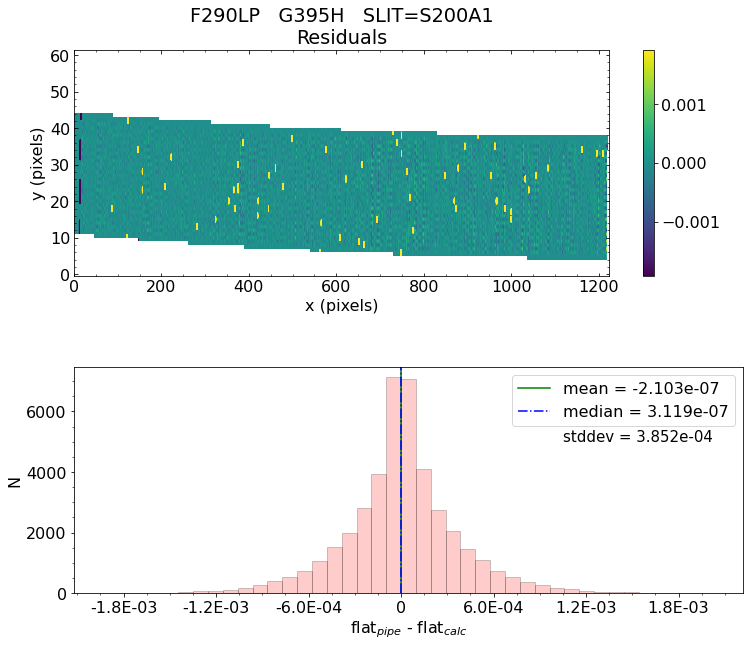


Working with slit: S200A2
exp_type =  NRS_FIXEDSLIT
SCI ext =  2
 Subwindow origin:   px0=634   py0=1024
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 1.875e-07    median = -3.308e-07    stdev = 3.867e-04
    Maximum   AbsoluteFlat Difference = 2.880e-03
    Minimum   AbsoluteFlat Difference = -3.248e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 66%
                            ->  3xtheshold = 34%
                            ->  5xtheshold = 17%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS1_S200A2_histogram.png



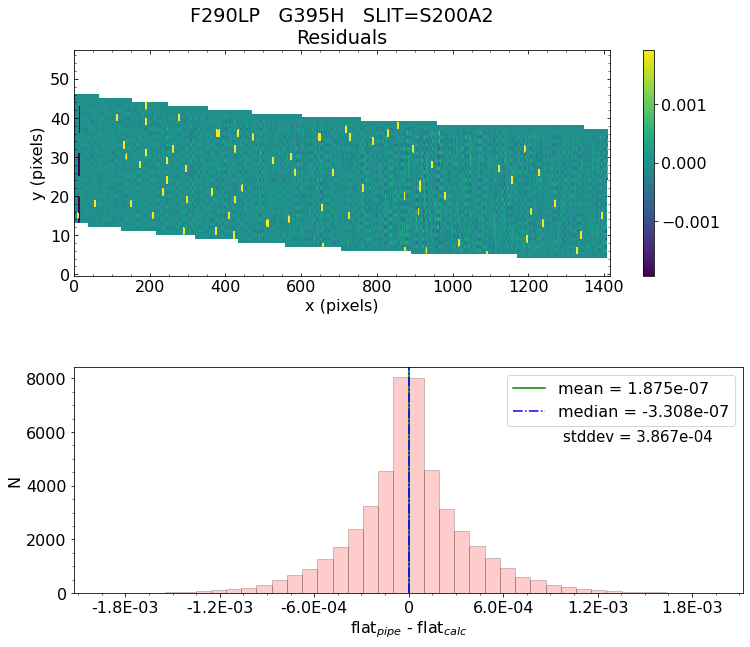


Working with slit: S400A1
exp_type =  NRS_FIXEDSLIT
SCI ext =  3
 Subwindow origin:   px0=752   py0=984
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 1.170e-07    median = 2.408e-08    stdev = 7.861e-04
    Maximum   AbsoluteFlat Difference = 1.080e-02
    Minimum   AbsoluteFlat Difference = -5.366e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 79%
                            ->  3xtheshold = 56%
                            ->  5xtheshold = 40%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS1_S400A1_histogram.png



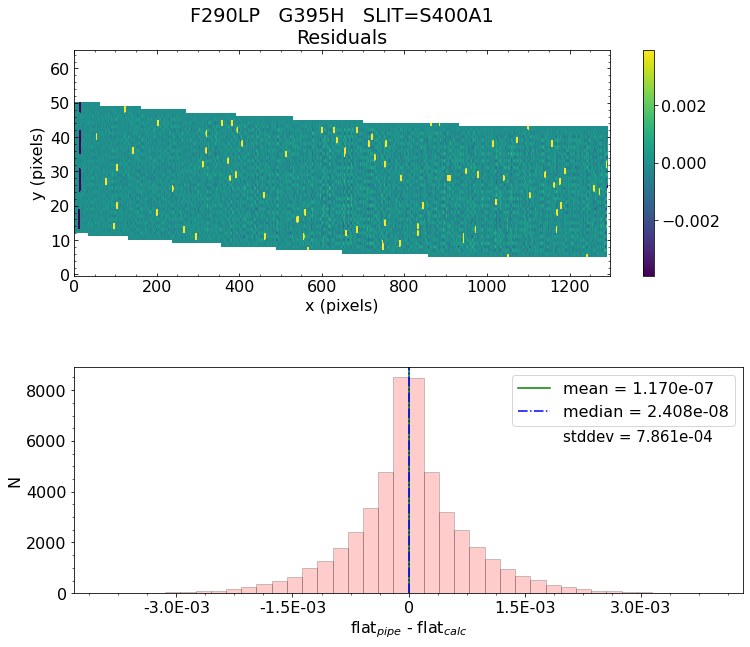


Working with slit: S1600A1
exp_type =  NRS_FIXEDSLIT
SCI ext =  4
 Subwindow origin:   px0=775   py0=965
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 3.006e-05    median = 2.431e-07    stdev = 5.980e-03
    Maximum   AbsoluteFlat Difference = 3.195e-02
    Minimum   AbsoluteFlat Difference = -3.510e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 97%
                            ->  3xtheshold = 92%
                            ->  5xtheshold = 88%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS1_S1600A1_histogram.png



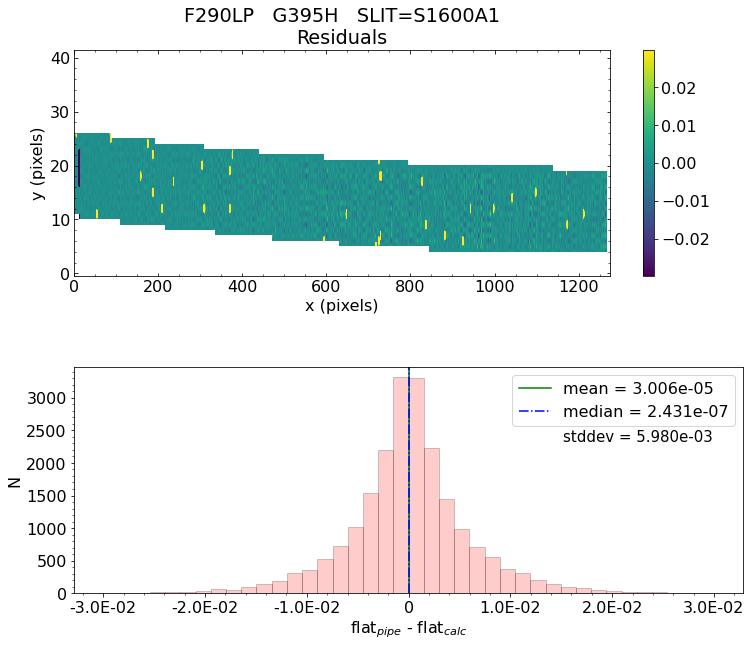


 *** Final result for flat_field test will be reported as PASSED *** 

('* Script flattest_fs.py took ', '2.984737785657247 minutes to finish.')
Did flat_field validation test passed?  All slits PASSED flat_field test. 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_fullframe_g395h_f290lp_nrs1_interpolatedflat.fits', fd=49, position=4181760, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs1_f_01.03.fits', fd=50, position=680480640, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_FS_sflat_G395H_OPAQUE_FLAT3_nrs1_f_01.01.fits', fd=58, position=50964480, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelesco

Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_fullframe_g395h_f290lp_nrs2_uncal.fits


2021-06-03 23:21:39,659 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-03 23:21:39,688 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-03 23:21:39,691 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-03 23:21:39,693 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-03 23:21:39,694 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-03 23:21:39,696 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-03 23:21:39,697 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-03 23:21:39,699 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-03 23:21:39,700 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-03 23:21:39,702 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-03 23:21:39,703 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-03 23:21:39,706 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-03 23:21:39,708 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-03 23:21:39,711 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-03 23:21:39,714 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-03 23:21:39,716 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-03 23:21:39,720 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-03 23:21:39,721 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='fs_fullframe_g395h_f290lp_nrs1_interpolatedflat.fits' mode='rb' closefd=True>
  gc.collect()
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_fullframe_g395h_f290lp_nrs2_uncal.fits' mode='rb' closefd=True>
  gc.collect()


2021-06-03 23:21:39,929 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/fs_fullframe_g395h_f290lp_nrs2_uncal.fits',).


2021-06-03 23:21:39,939 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-03 23:21:40,102 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'fs_fullframe_g395h_f290lp_nrs2_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-03 23:21:40,114 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0087.fits'.


2021-06-03 23:21:40,117 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits'.


2021-06-03 23:21:40,119 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0021.fits'.


2021-06-03 23:21:40,121 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0011.fits'.


2021-06-03 23:21:40,125 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-03 23:21:40,126 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0017.fits'.


2021-06-03 23:21:40,128 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_refpix_0020.fits'.


2021-06-03 23:21:40,130 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-03 23:21:40,131 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-03 23:21:40,132 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0021.fits'.


2021-06-03 23:21:40,134 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0114.fits'.


2021-06-03 23:21:40,137 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-03 23:21:40,137 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-03 23:21:40,138 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-03 23:21:40,711 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:21:40,713 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:21:40,910 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-03 23:21:40,911 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-03 23:21:40,913 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-03 23:21:41,044 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:21:41,046 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:21:41,066 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0011.fits


2021-06-03 23:21:41,623 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-03 23:21:41,750 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:21:41,752 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:21:41,775 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0021.fits


2021-06-03 23:21:42,625 - stpipe.Detector1Pipeline.saturation - INFO - Detected 6420 saturated pixels


2021-06-03 23:21:42,699 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-03 23:21:42,722 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-03 23:21:42,854 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:21:42,856 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:21:42,857 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-03 23:21:42,858 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-03 23:21:42,982 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:21:42,984 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:21:43,008 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0114.fits


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stdatamodels/validate.py:34: ValidationWarning: While validating meta.exposure.readpatt the following error occurred:
'ALLIRS2' is not one of ['ACQ1', 'ACQ2', 'BRIGHT1', 'BRIGHT2', 'DEEP2', 'DEEP8', 'FAST', 'FASTGRPAVG', 'FASTGRPAVG8', 'FASTGRPAVG16', 'FASTGRPAVG32', 'FASTGRPAVG64', 'FASTR1', 'FASTR100', 'FGS', 'FGS60', 'FGS8370', 'FGS840', 'FGSRAPID', 'FINEGUIDE', 'ID', 'MEDIUM2', 'MEDIUM8', 'NIS', 'NISRAPID', 'NRS', 'NRSIRS2', 'NRSN16R4', 'NRSN32R8', 'NRSN8R2', 'NRSRAPID', 'NRSIRS2RAPID', 'NRSRAPIDD1', 'NRSRAPIDD2', 'NRSRAPIDD6', 'NRSSLOW', 'RAPID', 'SHALLOW2', 'SHALLOW4', 'SLOW', 'SLOWR1', 'TRACK', 'ANY', 'N/A']

Failed validating 'enum' in schema:
    OrderedDict([('title', 'Readout pattern'),
                 ('type', 'string'),
                 ('enum',
                  ['ACQ1',
                   'ACQ2',
                   'BRIGHT1',


2021-06-03 23:21:43,454 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-03 23:21:43,596 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:21:43,599 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-03 23:21:43,618 - stpipe.Detector1Pipeline.refpix - INFO - Using refpix reference file: /grp/crds/cache/references/jwst/jwst_nirspec_refpix_0020.fits


2021-06-03 23:22:09,787 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-03 23:22:10,047 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:22:10,050 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:22:10,071 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0021.fits


2021-06-03 23:22:10,973 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-03 23:22:11,114 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:22:11,116 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-03 23:22:11,211 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0087.fits


2021-06-03 23:22:16,144 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=7, nframes=1, groupgap=0


2021-06-03 23:22:16,145 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=65, nframes=1, groupgap=0


2021-06-03 23:22:16,705 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-03 23:22:17,644 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:22:17,646 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-03 23:22:17,695 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 4 sigma


2021-06-03 23:22:17,746 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits


2021-06-03 23:22:17,838 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0017.fits


2021-06-03 23:22:17,884 - stpipe.Detector1Pipeline.jump - INFO - Found 32 possible cores to use for jump detection 


2021-06-03 23:22:18,261 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2021-06-03 23:22:18,552 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2021-06-03 23:22:20,021 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier Two-point found 47875 pixels with at least one CR


2021-06-03 23:22:21,515 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 3.25293 sec


2021-06-03 23:22:21,518 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 3.823136


2021-06-03 23:22:21,521 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-03 23:22:21,649 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 7, 3200, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:22:21,651 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-03 23:22:21,803 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0017.fits


2021-06-03 23:22:21,845 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits


2021-06-03 23:22:21,884 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-03 23:22:21,886 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:872: RuntimeWarning: invalid value encountered in multiply
  var_p4[num_int,:,:,:] *= ( segs_4[num_int,:,:,:] > 0)


2021-06-03 23:22:55,287 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 7


2021-06-03 23:22:55,289 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


2021-06-03 23:22:55,464 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-03 23:22:55,682 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:22:55,684 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:22:55,756 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:22:55,757 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:22:55,760 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:22:55,887 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:22:55,890 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:22:55,948 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:22:55,950 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:22:55,953 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:22:55,954 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-03 23:22:55,956 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-03 23:22:55,966 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-03 23:22:56,105 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<ImageModel(2048, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:22:56,107 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-03 23:22:56,277 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.1448970586061478 deg


2021-06-03 23:22:56,278 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3232757747173309 deg


2021-06-03 23:22:56,280 - stpipe.AssignWcsStep - INFO - theta_y correction: -3.766823889842878e-13 deg


2021-06-03 23:22:56,281 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:22:56,514 - stpipe.AssignWcsStep - INFO - Slits projected on detector NRS2: ['S200A1', 'S200A2', 'S400A1', 'S1600A1', 'S200B1']


2021-06-03 23:22:56,516 - stpipe.AssignWcsStep - INFO - Computing WCS for 5 open slitlets


2021-06-03 23:22:56,544 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.1448970586061478 deg


2021-06-03 23:22:56,544 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3232757747173309 deg


2021-06-03 23:22:56,546 - stpipe.AssignWcsStep - INFO - theta_y correction: -3.766823889842878e-13 deg


2021-06-03 23:22:56,548 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:22:56,557 - stpipe.AssignWcsStep - INFO - SPORDER= -1, wrange=[2.87e-06, 5.27e-06]


2021-06-03 23:22:56,677 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 1


2021-06-03 23:22:56,678 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 2


2021-06-03 23:22:56,679 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 3


2021-06-03 23:22:56,680 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 4


2021-06-03 23:22:56,681 - stpipe.AssignWcsStep - INFO - There are 5 open slits in quadrant 5


2021-06-03 23:22:56,851 - stpipe.AssignWcsStep - INFO - Created a NIRSPEC nrs_fixedslit pipeline with references {'distortion': None, 'filteroffset': None, 'specwcs': None, 'regions': None, 'wavelengthrange': '/grp/crds/cache/references/jwst/jwst_nirspec_wavelengthrange_0004.asdf', 'camera': '/grp/crds/cache/references/jwst/jwst_nirspec_camera_0004.asdf', 'collimator': '/grp/crds/cache/references/jwst/jwst_nirspec_collimator_0004.asdf', 'disperser': '/grp/crds/cache/references/jwst/jwst_nirspec_disperser_0035.asdf', 'fore': '/grp/crds/cache/references/jwst/jwst_nirspec_fore_0022.asdf', 'fpa': '/grp/crds/cache/references/jwst/jwst_nirspec_fpa_0005.asdf', 'msa': '/grp/crds/cache/references/jwst/jwst_nirspec_msa_0005.asdf', 'ote': '/grp/crds/cache/references/jwst/jwst_nirspec_ote_0005.asdf', 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2021-06-03 23:22:57,021 - stpipe.AssignWcsStep - INFO - COMPLETED assign_wcs


2021-06-03 23:22:57,030 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep done


2021-06-03 23:22:57,040 - stpipe.Extract2dStep - INFO - Extract2dStep instance created.


2021-06-03 23:22:57,193 - stpipe.Extract2dStep - INFO - Step Extract2dStep running with args (<ImageModel(2048, 2048) from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:22:57,195 - stpipe.Extract2dStep - INFO - Step Extract2dStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'slit_name': None, 'extract_orders': None, 'tsgrism_extract_height': None, 'wfss_extract_half_height': 5, 'grism_objects': None, 'mmag_extract': 99.0}


2021-06-03 23:22:57,211 - stpipe.Extract2dStep - INFO - EXP_TYPE is NRS_FIXEDSLIT


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/utils.py:72: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  indx = np.asarray(np.floor(np.asarray(value) + 0.5), dtype=np.int)
2021-06-03 23:22:57,391 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S200A1


2021-06-03 23:22:57,392 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 2048


2021-06-03 23:22:57,392 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1060 1122


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


2021-06-03 23:22:57,600 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:22:57,609 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.191685737 -45.682908511 156.190837415 -45.682092120 156.190771015 -45.682126390 156.191619323 -45.682942792


2021-06-03 23:22:57,610 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.191685737 -45.682908511 156.190837415 -45.682092120 156.190771015 -45.682126390 156.191619323 -45.682942792


2021-06-03 23:22:57,770 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S200A2


2021-06-03 23:22:57,771 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 2048


2021-06-03 23:22:57,772 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1023 1081


2021-06-03 23:22:57,972 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:22:57,981 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.184519149 -45.685298792 156.183675453 -45.684484578 156.183609578 -45.684518640 156.184453260 -45.685332865


2021-06-03 23:22:57,983 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.184519149 -45.685298792 156.183675453 -45.684484578 156.183609578 -45.684518640 156.184453260 -45.685332865


2021-06-03 23:22:58,286 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S400A1


2021-06-03 23:22:58,288 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 2048


2021-06-03 23:22:58,288 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 984 1049


2021-06-03 23:22:58,501 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:22:58,510 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.187759056 -45.682331806 156.186793281 -45.681401531 156.186663358 -45.681468621 156.187629101 -45.682398919


2021-06-03 23:22:58,511 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.187759056 -45.682331806 156.186793281 -45.681401531 156.186663358 -45.681468621 156.187629101 -45.682398919


2021-06-03 23:22:58,672 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S1600A1


2021-06-03 23:22:58,673 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 2048


2021-06-03 23:22:58,674 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 964 1006


2021-06-03 23:22:58,857 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:22:58,866 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.187720636 -45.680802803 156.187307671 -45.680405209 156.186792650 -45.680671077 156.187205560 -45.681068709


2021-06-03 23:22:58,866 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.187720636 -45.680802803 156.187307671 -45.680405209 156.186792650 -45.680671077 156.187205560 -45.681068709


2021-06-03 23:22:59,025 - stpipe.Extract2dStep - INFO - Name of subarray extracted: S200B1


2021-06-03 23:22:59,026 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 140 2048


2021-06-03 23:22:59,027 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 925 1037


2021-06-03 23:22:59,295 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:22:59,304 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.238745821 -45.653926065 156.237887188 -45.653118339 156.237822146 -45.653151380 156.238680762 -45.653959111


2021-06-03 23:22:59,305 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.238745821 -45.653926065 156.237887188 -45.653118339 156.237822146 -45.653151380 156.238680762 -45.653959111


2021-06-03 23:22:59,457 - stpipe.Extract2dStep - INFO - Step Extract2dStep done


2021-06-03 23:22:59,568 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.


2021-06-03 23:22:59,731 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep running with args (<MultiSlitModel from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:22:59,734 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:22:59,742 - stpipe.SourceTypeStep - INFO - Input EXP_TYPE is NRS_FIXEDSLIT


2021-06-03 23:22:59,743 - stpipe.SourceTypeStep - INFO - Input SRCTYAPT = UNKNOWN


2021-06-03 23:22:59,744 - stpipe.SourceTypeStep - INFO - Input source type is unknown; setting default SRCTYPE = POINT


2021-06-03 23:22:59,749 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep done


2021-06-03 23:22:59,768 - stpipe.WavecorrStep - INFO - WavecorrStep instance created.


2021-06-03 23:22:59,893 - stpipe.WavecorrStep - INFO - Step WavecorrStep running with args (<MultiSlitModel from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:22:59,895 - stpipe.WavecorrStep - INFO - Step WavecorrStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:22:59,920 - stpipe.WavecorrStep - INFO - Using WAVECORR reference file /grp/crds/cache/references/jwst/jwst_nirspec_wavecorr_0001.asdf


2021-06-03 23:23:00,519 - stpipe.WavecorrStep - INFO - Detected a POINT source type in slit S200A1


2021-06-03 23:23:00,522 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-03 23:23:00,792 - stpipe.WavecorrStep - INFO - Using wavelength zero-point correction for aperture S200A1


2021-06-03 23:23:00,805 - stpipe.WavecorrStep - INFO - Step WavecorrStep done


2021-06-03 23:23:00,823 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.


2021-06-03 23:23:00,998 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<MultiSlitModel from fs_fullframe_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-03 23:23:01,000 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': True, 'user_supplied_flat': None, 'inverse': False}


2021-06-03 23:23:03,757 - stpipe.FlatFieldStep - INFO - Working on slit S200A1


2021-06-03 23:23:03,760 - stpipe.FlatFieldStep - INFO - Creating wavelength array from WCS for slit S200A1


2021-06-03 23:23:36,673 - stpipe.FlatFieldStep - INFO - Working on slit S200A2


2021-06-03 23:23:53,085 - stpipe.FlatFieldStep - INFO - Working on slit S400A1


2021-06-03 23:24:12,475 - stpipe.FlatFieldStep - INFO - Working on slit S1600A1


2021-06-03 23:24:20,995 - stpipe.FlatFieldStep - INFO - Working on slit S200B1


2021-06-03 23:24:37,796 - stpipe.FlatFieldStep - INFO - Saved model in fs_fullframe_g395h_f290lp_nrs2_interpolatedflat.fits


2021-06-03 23:24:37,797 - stpipe.FlatFieldStep - INFO - Interpolated flat written to "fs_fullframe_g395h_f290lp_nrs2_interpolatedflat.fits".


2021-06-03 23:24:37,800 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep done


Running flat field test for FS...
Filename: fs_fullframe_g395h_f290lp_nrs2_interpolatedflat.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     281   ()      
  1  SCI           1 ImageHDU        14   (2048, 62)   float32   
  2  DQ            1 ImageHDU        11   (2048, 62)   int32 (rescales to uint32)   
  3  ERR           1 ImageHDU         9   (2048, 62)   float32   
  4  WAVELENGTH    1 ImageHDU         9   (2048, 62)   float32   
  5  SCI           2 ImageHDU        14   (2048, 58)   float32   
  6  DQ            2 ImageHDU        11   (2048, 58)   int32 (rescales to uint32)   
  7  ERR           2 ImageHDU         9   (2048, 58)   float32   
  8  WAVELENGTH    2 ImageHDU         9   (2048, 58)   float32   
  9  SCI           3 ImageHDU        14   (2048, 65)   float32   
 10  DQ            3 ImageHDU        11   (2048, 65)   int32 (rescales to uint32)   
 11  ERR           3 ImageHDU         9   (2048, 65)   float32   
 12  WA

/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


flat_field_file  -->     Grating:G395H   Filter:F290LP   LAMP:LINE3
Using D-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs2_f_01.03.fits
Using S-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_FS_sflat_G395H_OPAQUE_FLAT3_nrs2_f_01.01.fits
Using F-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_FS_fflat_F290LP_01.01.fits
Now looping through the slits. This may take a while... 

Working with slit: S200A1
exp_type =  NRS_FIXEDSLIT
SCI ext =  1


 Subwindow origin:   px0=1   py0=1061
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 5.806e-07    median = -4.025e-08    stdev = 1.899e-04
    Maximum   AbsoluteFlat Difference = 1.695e-02
    Minimum   AbsoluteFlat Difference = -4.542e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 40%
                            ->  3xtheshold = 6%
                            ->  5xtheshold = 1%
 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS2_S200A1_histogram.png



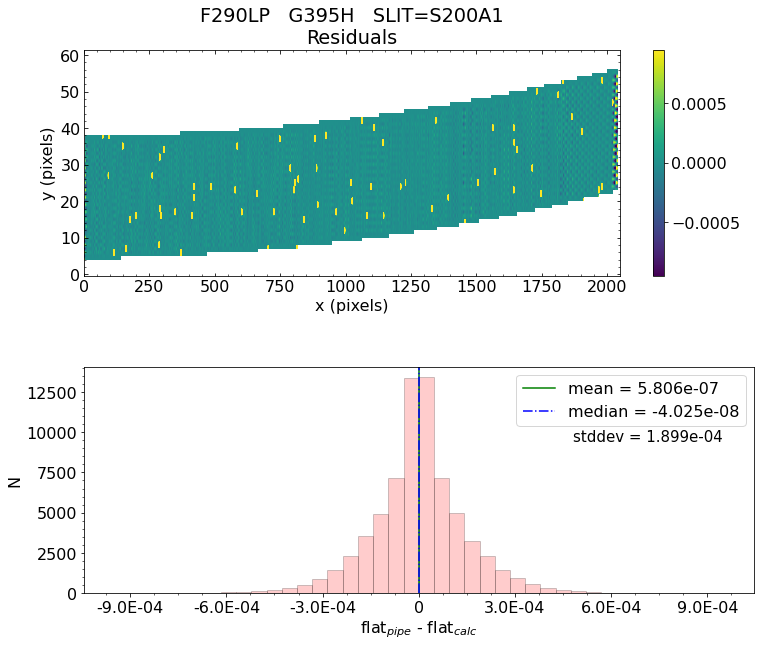


Working with slit: S200A2
exp_type =  NRS_FIXEDSLIT
SCI ext =  2
 Subwindow origin:   px0=1   py0=1024


 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 1.458e-06    median = -6.009e-08    stdev = 4.070e-04
    Maximum   AbsoluteFlat Difference = 9.938e-02
    Minimum   AbsoluteFlat Difference = -1.637e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 37%
                            ->  3xtheshold = 5%
                            ->  5xtheshold = 1%
 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS2_S200A2_histogram.png



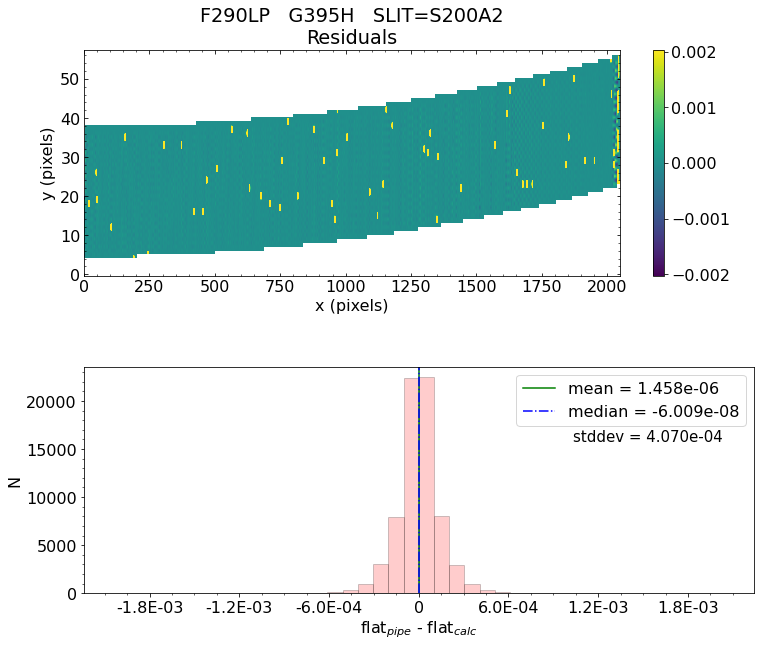


Working with slit: S400A1
exp_type =  NRS_FIXEDSLIT
SCI ext =  3
 Subwindow origin:   px0=1   py0=985
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 9.234e-07    median = -5.637e-08    stdev = 3.560e-04
    Maximum   AbsoluteFlat Difference = 4.536e-03
    Minimum   AbsoluteFlat Difference = -6.026e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 60%
                            ->  3xtheshold = 26%
                            ->  5xtheshold = 10%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!

 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS2_S400A1_histogram.png



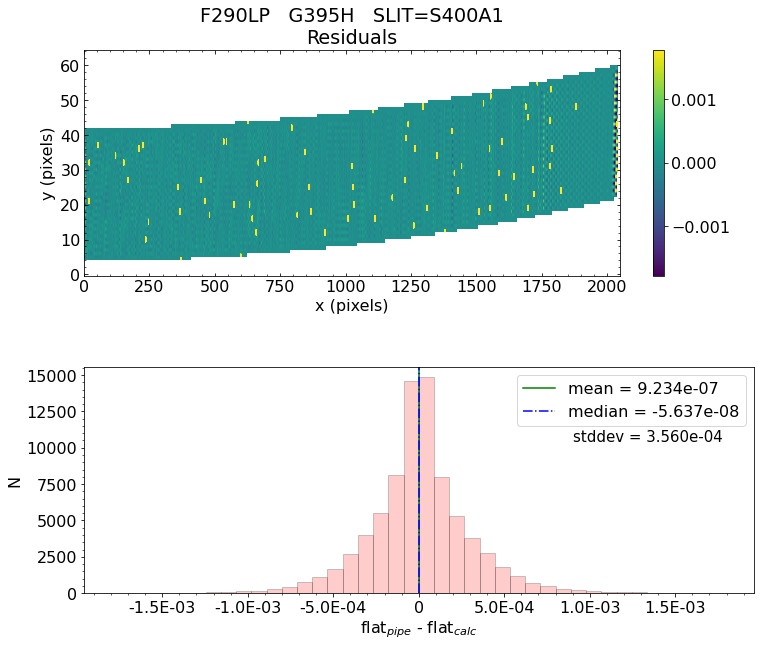


Working with slit: S1600A1
exp_type =  NRS_FIXEDSLIT
SCI ext =  4
 Subwindow origin:   px0=1   py0=965
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 5.116e-06    median = -7.235e-07    stdev = 2.355e-03
    Maximum   AbsoluteFlat Difference = 3.507e-02
    Minimum   AbsoluteFlat Difference = -3.697e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 91%
                            ->  3xtheshold = 79%
                            ->  5xtheshold = 69%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS2_S1600A1_histogram.png



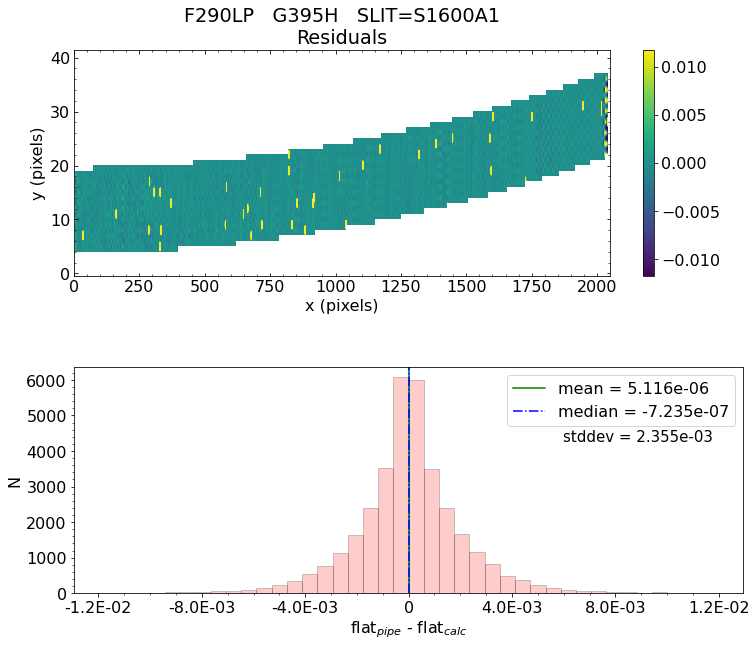


Working with slit: S200B1
exp_type =  NRS_FIXEDSLIT
SCI ext =  5


 Subwindow origin:   px0=141   py0=926
 Looping through the wavelengths... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 3.218e-07    median = 5.067e-08    stdev = 3.199e-04
    Maximum   AbsoluteFlat Difference = 8.327e-03
    Minimum   AbsoluteFlat Difference = -7.312e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 45%
                            ->  3xtheshold = 10%
                            ->  5xtheshold = 2%
 *** Result of the test: PASSED

No output_directory was provided. Figures will be saved in current working directory:
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/FS_flattest_NRS2_S200B1_histogram.png



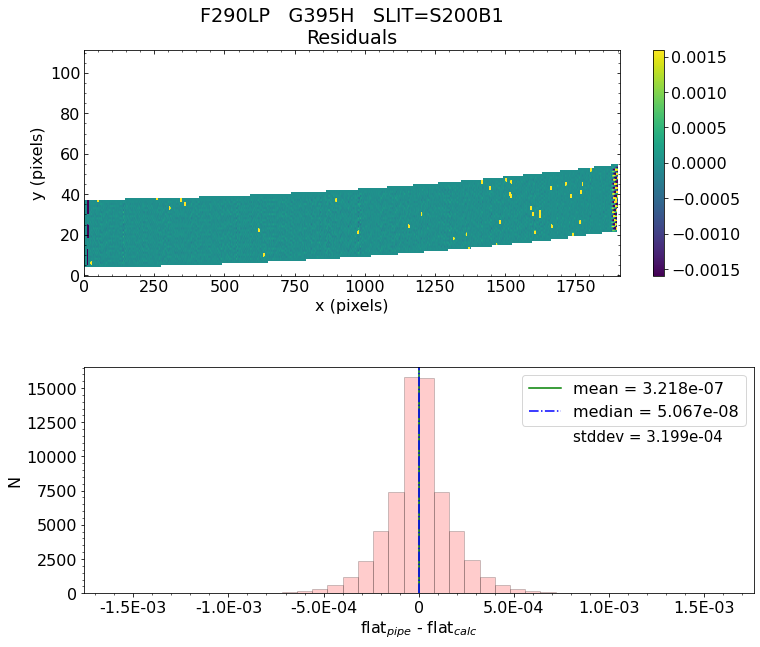


 *** Final result for flat_field test will be reported as PASSED *** 

('* Script flattest_fs.py took ', '5.860506268342336 minutes to finish.')
Did flat_field validation test passed?  All slits PASSED flat_field test. 


Testing files for detector:  nrs1


<ipython-input-1-5fd6a242850b>:74: ResourceWarning: unclosed file <_io.FileIO name='fs_fullframe_g395h_f290lp_nrs2_interpolatedflat.fits' mode='rb' closefd=True>
  result, result_msg, log_msgs = nptt.calwebb_spec2_pytests.auxiliary_code.flattest_fs.flattest(


Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_prism_nrs1_uncal.fits


2021-06-03 23:30:48,335 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-03 23:30:48,355 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-03 23:30:48,356 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-03 23:30:48,358 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-03 23:30:48,360 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-03 23:30:48,361 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-03 23:30:48,363 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-03 23:30:48,364 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-03 23:30:48,366 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-03 23:30:48,367 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-03 23:30:48,369 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-03 23:30:48,371 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-03 23:30:48,372 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-03 23:30:48,373 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-03 23:30:48,375 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-03 23:30:48,377 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-03 23:30:48,378 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-03 23:30:48,380 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_prism_nrs1_uncal.fits' mode='rb' closefd=True>
  gc.collect()
2021-06-03 23:30:48,561 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_prism_nrs1_uncal.fits',).


2021-06-03 23:30:48,572 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-03 23:30:48,696 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'mos_prism_nrs1_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-03 23:30:48,708 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0086.fits'.


2021-06-03 23:30:48,711 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits'.


2021-06-03 23:30:48,714 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0018.fits'.


2021-06-03 23:30:48,717 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0010.fits'.


2021-06-03 23:30:48,720 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-03 23:30:48,721 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0018.fits'.


2021-06-03 23:30:48,724 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_refpix_0022.fits'.


2021-06-03 23:30:48,727 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-03 23:30:48,728 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-03 23:30:48,728 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0020.fits'.


2021-06-03 23:30:48,732 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0113.fits'.


2021-06-03 23:30:48,734 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-03 23:30:48,735 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-03 23:30:48,736 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-03 23:30:49,036 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:30:49,038 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:30:49,130 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-03 23:30:49,131 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-03 23:30:49,133 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-03 23:30:49,271 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:30:49,273 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:30:49,293 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0010.fits


2021-06-03 23:30:49,582 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-03 23:30:49,727 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:30:49,730 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:30:49,749 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0020.fits


2021-06-03 23:30:50,213 - stpipe.Detector1Pipeline.saturation - INFO - Detected 9869 saturated pixels


2021-06-03 23:30:50,240 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-03 23:30:50,264 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-03 23:30:50,416 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:30:50,418 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:30:50,419 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-03 23:30:50,421 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-03 23:30:50,551 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:30:50,553 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:30:50,573 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0113.fits


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stdatamodels/validate.py:34: ValidationWarning: While validating meta.exposure.readpatt the following error occurred:
'ALLIRS2' is not one of ['ACQ1', 'ACQ2', 'BRIGHT1', 'BRIGHT2', 'DEEP2', 'DEEP8', 'FAST', 'FASTGRPAVG', 'FASTGRPAVG8', 'FASTGRPAVG16', 'FASTGRPAVG32', 'FASTGRPAVG64', 'FASTR1', 'FASTR100', 'FGS', 'FGS60', 'FGS8370', 'FGS840', 'FGSRAPID', 'FINEGUIDE', 'ID', 'MEDIUM2', 'MEDIUM8', 'NIS', 'NISRAPID', 'NRS', 'NRSIRS2', 'NRSN16R4', 'NRSN32R8', 'NRSN8R2', 'NRSRAPID', 'NRSIRS2RAPID', 'NRSRAPIDD1', 'NRSRAPIDD2', 'NRSRAPIDD6', 'NRSSLOW', 'RAPID', 'SHALLOW2', 'SHALLOW4', 'SLOW', 'SLOWR1', 'TRACK', 'ANY', 'N/A']

Failed validating 'enum' in schema:
    OrderedDict([('title', 'Readout pattern'),
                 ('type', 'string'),
                 ('enum',
                  ['ACQ1',
                   'ACQ2',
                   'BRIGHT1',


2021-06-03 23:30:50,904 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-03 23:30:51,046 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:30:51,048 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-03 23:30:51,067 - stpipe.Detector1Pipeline.refpix - INFO - Using refpix reference file: /grp/crds/cache/references/jwst/jwst_nirspec_refpix_0022.fits


2021-06-03 23:31:04,952 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-03 23:31:05,192 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:05,194 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:31:05,215 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0018.fits


2021-06-03 23:31:05,891 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-03 23:31:06,031 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:06,032 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-03 23:31:06,090 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0086.fits


2021-06-03 23:31:11,242 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=4, nframes=1, groupgap=0


2021-06-03 23:31:11,243 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=65, nframes=1, groupgap=0


2021-06-03 23:31:11,775 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-03 23:31:12,635 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:12,637 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-03 23:31:12,677 - stpipe.Detector1Pipeline.jump - WARNING - Can not apply jump detection when NGROUPS<=4;


2021-06-03 23:31:12,678 - stpipe.Detector1Pipeline.jump - WARNING - Jump step will be skipped


2021-06-03 23:31:12,777 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-03 23:31:12,912 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:12,914 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-03 23:31:13,022 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0018.fits


2021-06-03 23:31:13,071 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits


2021-06-03 23:31:13,112 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-03 23:31:13,113 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2021-06-03 23:31:24,559 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 4


2021-06-03 23:31:24,560 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:1091: RuntimeWarning: divide by zero encountered in true_divide
  var_p2 = 1/(s_inv_var_p3.sum(axis=0))
2021-06-03 23:31:24,689 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-03 23:31:24,833 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:24,836 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:31:24,899 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:31:24,900 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:31:24,903 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:31:25,037 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:25,039 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:31:25,099 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:31:25,101 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:31:25,104 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:31:25,105 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-03 23:31:25,107 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-03 23:31:25,116 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-03 23:31:25,262 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<ImageModel(2048, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:25,264 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-03 23:31:25,417 - stpipe.AssignWcsStep - INFO - Retrieving open MSA slitlets for msa_metadata_id = 1 and dither_index = 1


2021-06-03 23:31:25,451 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.0332140289247036 deg


2021-06-03 23:31:25,453 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3367482721805573 deg


2021-06-03 23:31:25,454 - stpipe.AssignWcsStep - INFO - theta_y correction: -1.0907214098475986e-05 deg


2021-06-03 23:31:25,456 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:31:25,677 - stpipe.AssignWcsStep - INFO - Slits projected on detector NRS1: [3, 4]


2021-06-03 23:31:25,678 - stpipe.AssignWcsStep - INFO - Computing WCS for 2 open slitlets


2021-06-03 23:31:25,707 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.0332140289247036 deg


2021-06-03 23:31:25,707 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3367482721805573 deg


2021-06-03 23:31:25,708 - stpipe.AssignWcsStep - INFO - theta_y correction: -1.0907214098475986e-05 deg


2021-06-03 23:31:25,709 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:31:25,719 - stpipe.AssignWcsStep - INFO - SPORDER= 0, wrange=[6e-07, 5.3e-06]


2021-06-03 23:31:25,837 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 1


2021-06-03 23:31:25,839 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 2


2021-06-03 23:31:25,840 - stpipe.AssignWcsStep - INFO - There are 1 open slits in quadrant 3


2021-06-03 23:31:25,850 - stpipe.AssignWcsStep - INFO - There are 1 open slits in quadrant 4


2021-06-03 23:31:25,862 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 5


2021-06-03 23:31:25,984 - stpipe.AssignWcsStep - INFO - Created a NIRSPEC nrs_msaspec pipeline with references {'distortion': None, 'filteroffset': None, 'specwcs': None, 'regions': None, 'wavelengthrange': '/grp/crds/cache/references/jwst/jwst_nirspec_wavelengthrange_0004.asdf', 'camera': '/grp/crds/cache/references/jwst/jwst_nirspec_camera_0004.asdf', 'collimator': '/grp/crds/cache/references/jwst/jwst_nirspec_collimator_0004.asdf', 'disperser': '/grp/crds/cache/references/jwst/jwst_nirspec_disperser_0034.asdf', 'fore': '/grp/crds/cache/references/jwst/jwst_nirspec_fore_0028.asdf', 'fpa': '/grp/crds/cache/references/jwst/jwst_nirspec_fpa_0005.asdf', 'msa': '/grp/crds/cache/references/jwst/jwst_nirspec_msa_0005.asdf', 'ote': '/grp/crds/cache/references/jwst/jwst_nirspec_ote_0005.asdf', 'ifupost': None, 'ifufore': None, 'ifuslicer': None, 'msametafile': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/V0030006000104_msa.fits'}


2021-06-03 23:31:26,127 - stpipe.AssignWcsStep - INFO - COMPLETED assign_wcs


2021-06-03 23:31:26,134 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep done


2021-06-03 23:31:26,144 - stpipe.MSAFlagOpenStep - INFO - MSAFlagOpenStep instance created.


2021-06-03 23:31:26,310 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep running with args (<ImageModel(2048, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:26,313 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:31:26,333 - stpipe.MSAFlagOpenStep - INFO - Using reference file /grp/crds/cache/references/jwst/jwst_nirspec_msaoper_0001.json


2021-06-03 23:31:26,334 - stpipe.JwstStep - INFO - JwstStep instance created.


2021-06-03 23:31:26,453 - stpipe.MSAFlagOpenStep - INFO - gwa_ytilt is 0.0332140289247036 deg


2021-06-03 23:31:26,454 - stpipe.MSAFlagOpenStep - INFO - gwa_xtilt is 0.3367482721805573 deg


2021-06-03 23:31:26,455 - stpipe.MSAFlagOpenStep - INFO - theta_y correction: -1.0907214098475986e-05 deg


2021-06-03 23:31:26,457 - stpipe.MSAFlagOpenStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:31:26,467 - stpipe.MSAFlagOpenStep - INFO - SPORDER= 0, wrange=[6e-07, 5.3e-06]


2021-06-03 23:31:26,589 - stpipe.MSAFlagOpenStep - INFO - There are 5 open slits in quadrant 1


2021-06-03 23:31:26,633 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 2


2021-06-03 23:31:26,662 - stpipe.MSAFlagOpenStep - INFO - There are 9 open slits in quadrant 3


2021-06-03 23:31:26,740 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 4


2021-06-03 23:31:26,767 - stpipe.MSAFlagOpenStep - INFO - There are 0 open slits in quadrant 5


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


2021-06-03 23:31:37,492 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep done


2021-06-03 23:31:37,502 - stpipe.Extract2dStep - INFO - Extract2dStep instance created.


2021-06-03 23:31:37,757 - stpipe.Extract2dStep - INFO - Step Extract2dStep running with args (<ImageModel(2048, 2048) from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:37,759 - stpipe.Extract2dStep - INFO - Step Extract2dStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'slit_name': None, 'extract_orders': None, 'tsgrism_extract_height': None, 'wfss_extract_half_height': 5, 'grism_objects': None, 'mmag_extract': 99.0}


2021-06-03 23:31:37,776 - stpipe.Extract2dStep - INFO - EXP_TYPE is NRS_MSASPEC


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/utils.py:72: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  indx = np.asarray(np.floor(np.asarray(value) + 0.5), dtype=np.int)
2021-06-03 23:31:37,942 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 3


2021-06-03 23:31:37,943 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1027 1464


2021-06-03 23:31:37,944 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1971 1983


2021-06-03 23:31:38,069 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:31:38,080 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.216281195 -45.702862740 156.216151591 -45.702738206 156.216089149 -45.702770462 156.216218751 -45.702894998


2021-06-03 23:31:38,081 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.216281195 -45.702862740 156.216151591 -45.702738206 156.216089149 -45.702770462 156.216218751 -45.702894998


2021-06-03 23:31:38,224 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 4


2021-06-03 23:31:38,225 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1275 1699


2021-06-03 23:31:38,225 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 32 43


2021-06-03 23:31:38,348 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:31:38,360 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.168120618 -45.657220874 156.167995139 -45.657100409 156.167933468 -45.657132147 156.168058946 -45.657252613


2021-06-03 23:31:38,361 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.168120618 -45.657220874 156.167995139 -45.657100409 156.167933468 -45.657132147 156.168058946 -45.657252613


2021-06-03 23:31:38,431 - stpipe.Extract2dStep - INFO - Step Extract2dStep done


2021-06-03 23:31:38,459 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.


2021-06-03 23:31:38,614 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep running with args (<MultiSlitModel from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:38,617 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:31:38,627 - stpipe.SourceTypeStep - INFO - Input EXP_TYPE is NRS_MSASPEC


2021-06-03 23:31:38,629 - stpipe.SourceTypeStep - INFO - source_id=3, stellarity=100.0000, type=POINT


2021-06-03 23:31:38,630 - stpipe.SourceTypeStep - INFO - source_id=4, stellarity=100.0000, type=POINT


2021-06-03 23:31:38,632 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep done


2021-06-03 23:31:38,646 - stpipe.WavecorrStep - INFO - WavecorrStep instance created.


2021-06-03 23:31:38,765 - stpipe.WavecorrStep - INFO - Step WavecorrStep running with args (<MultiSlitModel from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:38,767 - stpipe.WavecorrStep - INFO - Step WavecorrStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:31:38,790 - stpipe.WavecorrStep - INFO - Using WAVECORR reference file /grp/crds/cache/references/jwst/jwst_nirspec_wavecorr_0002.asdf


2021-06-03 23:31:39,068 - stpipe.WavecorrStep - INFO - Detected a POINT source type in slit 3


2021-06-03 23:31:39,135 - stpipe.WavecorrStep - INFO - Using wavelength zero-point correction for aperture MOS


2021-06-03 23:31:39,139 - stpipe.WavecorrStep - INFO - Detected a POINT source type in slit 4


2021-06-03 23:31:39,199 - stpipe.WavecorrStep - INFO - Using wavelength zero-point correction for aperture MOS


2021-06-03 23:31:39,204 - stpipe.WavecorrStep - INFO - Step WavecorrStep done


2021-06-03 23:31:39,218 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.


2021-06-03 23:31:39,365 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<MultiSlitModel from mos_prism_nrs1_uncal.fits>,).


2021-06-03 23:31:39,367 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': True, 'user_supplied_flat': None, 'inverse': False}


2021-06-03 23:32:03,960 - stpipe.FlatFieldStep - INFO - Working on slit 3


2021-06-03 23:32:04,653 - stpipe.FlatFieldStep - INFO - Working on slit 4


2021-06-03 23:32:05,668 - stpipe.FlatFieldStep - INFO - Saved model in mos_prism_nrs1_interpolatedflat.fits


2021-06-03 23:32:05,669 - stpipe.FlatFieldStep - INFO - Interpolated flat written to "mos_prism_nrs1_interpolatedflat.fits".


2021-06-03 23:32:05,674 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep done


Running flat field test for MOS...
Filename: mos_prism_nrs1_interpolatedflat.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     282   ()      
  1  SCI           1 ImageHDU        14   (437, 12)   float32   
  2  DQ            1 ImageHDU        11   (437, 12)   int32 (rescales to uint32)   
  3  ERR           1 ImageHDU         9   (437, 12)   float32   
  4  WAVELENGTH    1 ImageHDU         9   (437, 12)   float32   
  5  SCI           2 ImageHDU        14   (424, 11)   float32   
  6  DQ            2 ImageHDU        11   (424, 11)   int32 (rescales to uint32)   
  7  ERR           2 ImageHDU         9   (424, 11)   float32   
  8  WAVELENGTH    2 ImageHDU         9   (424, 11)   float32   
  9  ASDF          1 BinTableHDU     11   1R x 1C   [151422B]   


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


flat_field_file  -->     Grating:PRISM   Filter:CLEAR   LAMP:LINE4
Using D-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs1_f_01.03.fits
Using S-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_sflat_PRISM_OPAQUE_FLAT5_nrs1_f_01.01.fits
Using F-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_fflat_CLEAR_01.01.fits

Working with slit: 3
 Subwindow origin:   px0=1028   py0=1972
silt_id='3'   quad=3   row=185   col=13   slitlet_id='185_13'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.162e-03    median = 2.571e-05    stdev = 2.242e-02
    Maximum   AbsoluteFlat Difference = 9.550e-02
    Minimum   AbsoluteFlat Difference = -9.974e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 99%
                            ->  3xtheshold = 97%
                            ->  5xtheshold = 95%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


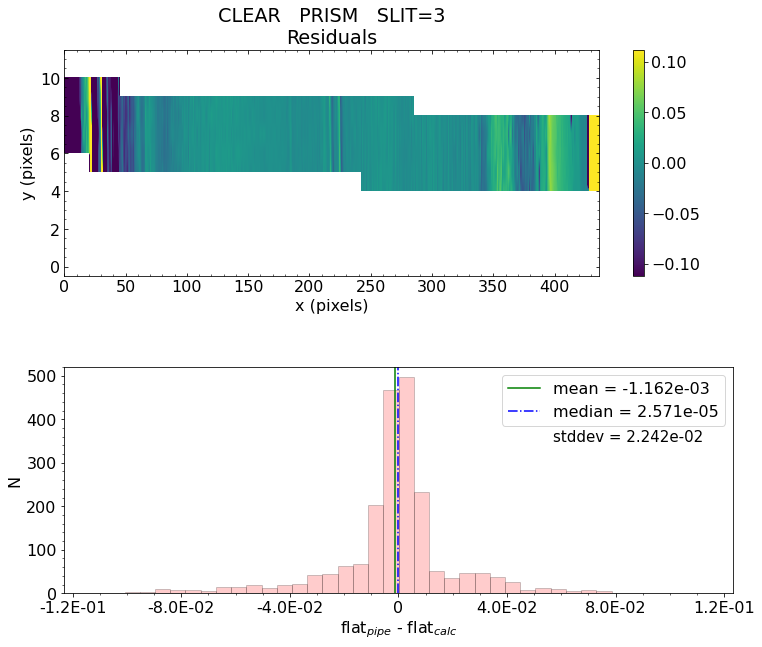

 *** Result of the test: PASSED


Working with slit: 4
 Subwindow origin:   px0=1276   py0=33
silt_id='4'   quad=4   row=190   col=158   slitlet_id='190_158'
Now looping through the pixels, this will take a while ... 


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/nirspec_pipe_testing_tool/calwebb_spec2_pytests/auxiliary_code/flattest_mos.py:527: RuntimeWarning: invalid value encountered in true_divide
  sff = int_tab/(last_sfv_wav - first_sfv_wav)


Calculating statistics... 

   Absolute Flat Difference  :   mean = -4.388e-04    median = 3.082e-05    stdev = 2.477e-02
    Maximum   AbsoluteFlat Difference = 9.768e-02
    Minimum   AbsoluteFlat Difference = -9.941e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 99%
                            ->  3xtheshold = 97%
                            ->  5xtheshold = 95%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


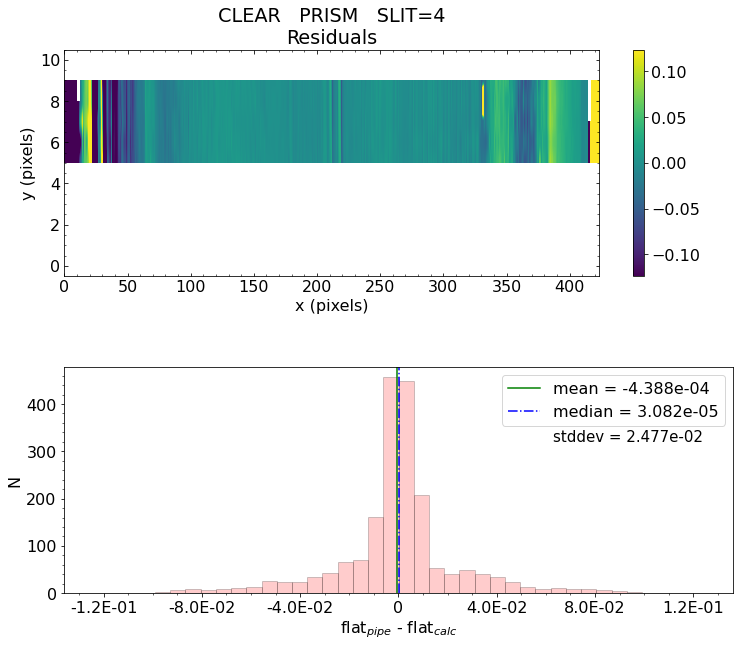

 *** Result of the test: PASSED


 *** Final result for flat_field test will be reported as PASSED *** 

('* Script flattest_mos.py took ', '29.12622618675232 seconds to finish.')
Did flat_field validation test passed?  All slitlets PASSED flat_field test. 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs1_f_01.03.fits', fd=50, position=680480640, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_sflat_PRISM_OPAQUE_FLAT5_nrs1_f_01.01.fits', fd=58, position=1258421760, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_fflat_CLEAR_01.01.fits', fd=59, position=299989440, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validatio

Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_prism_nrs2_uncal.fits


2021-06-03 23:32:51,856 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-03 23:32:51,875 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-03 23:32:51,876 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-03 23:32:51,878 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-03 23:32:51,879 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-03 23:32:51,880 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-03 23:32:51,881 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-03 23:32:51,883 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-03 23:32:51,884 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-03 23:32:51,885 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-03 23:32:51,886 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-03 23:32:51,888 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-03 23:32:51,889 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-03 23:32:51,890 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-03 23:32:51,891 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-03 23:32:51,893 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-03 23:32:51,894 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-03 23:32:51,895 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_prism_nrs2_uncal.fits' mode='rb' closefd=True>
  gc.collect()


2021-06-03 23:32:52,192 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_prism_nrs2_uncal.fits',).


2021-06-03 23:32:52,203 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-03 23:32:52,331 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'mos_prism_nrs2_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-03 23:32:52,342 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0087.fits'.


2021-06-03 23:32:52,345 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits'.


2021-06-03 23:32:52,348 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0021.fits'.


2021-06-03 23:32:52,352 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0011.fits'.


2021-06-03 23:32:52,355 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-03 23:32:52,356 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0017.fits'.


2021-06-03 23:32:52,360 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_refpix_0020.fits'.


2021-06-03 23:32:52,363 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-03 23:32:52,364 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-03 23:32:52,364 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0021.fits'.


2021-06-03 23:32:52,367 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0114.fits'.


2021-06-03 23:32:52,369 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-03 23:32:52,369 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-03 23:32:52,370 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-03 23:32:52,798 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:32:52,800 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:32:52,901 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-03 23:32:52,902 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-03 23:32:52,904 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-03 23:32:53,143 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:32:53,145 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:32:53,166 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0011.fits


2021-06-03 23:32:53,481 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-03 23:32:53,723 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:32:53,726 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:32:53,747 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0021.fits


2021-06-03 23:32:54,189 - stpipe.Detector1Pipeline.saturation - INFO - Detected 5379 saturated pixels


2021-06-03 23:32:54,217 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-03 23:32:54,237 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-03 23:32:54,376 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:32:54,379 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:32:54,379 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-03 23:32:54,381 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-03 23:32:54,497 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:32:54,499 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:32:54,519 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0114.fits


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stdatamodels/validate.py:34: ValidationWarning: While validating meta.exposure.readpatt the following error occurred:
'ALLIRS2' is not one of ['ACQ1', 'ACQ2', 'BRIGHT1', 'BRIGHT2', 'DEEP2', 'DEEP8', 'FAST', 'FASTGRPAVG', 'FASTGRPAVG8', 'FASTGRPAVG16', 'FASTGRPAVG32', 'FASTGRPAVG64', 'FASTR1', 'FASTR100', 'FGS', 'FGS60', 'FGS8370', 'FGS840', 'FGSRAPID', 'FINEGUIDE', 'ID', 'MEDIUM2', 'MEDIUM8', 'NIS', 'NISRAPID', 'NRS', 'NRSIRS2', 'NRSN16R4', 'NRSN32R8', 'NRSN8R2', 'NRSRAPID', 'NRSIRS2RAPID', 'NRSRAPIDD1', 'NRSRAPIDD2', 'NRSRAPIDD6', 'NRSSLOW', 'RAPID', 'SHALLOW2', 'SHALLOW4', 'SLOW', 'SLOWR1', 'TRACK', 'ANY', 'N/A']

Failed validating 'enum' in schema:
    OrderedDict([('title', 'Readout pattern'),
                 ('type', 'string'),
                 ('enum',
                  ['ACQ1',
                   'ACQ2',
                   'BRIGHT1',


2021-06-03 23:32:54,827 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-03 23:32:54,947 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:32:54,949 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-03 23:32:54,969 - stpipe.Detector1Pipeline.refpix - INFO - Using refpix reference file: /grp/crds/cache/references/jwst/jwst_nirspec_refpix_0020.fits


2021-06-03 23:33:10,101 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-03 23:33:10,345 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:33:10,347 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:33:10,375 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0021.fits


2021-06-03 23:33:10,978 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-03 23:33:11,093 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:33:11,094 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-03 23:33:11,154 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0087.fits


2021-06-03 23:33:16,157 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=4, nframes=1, groupgap=0


2021-06-03 23:33:16,159 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=65, nframes=1, groupgap=0


2021-06-03 23:33:16,807 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-03 23:33:17,581 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:33:17,583 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-03 23:33:17,614 - stpipe.Detector1Pipeline.jump - WARNING - Can not apply jump detection when NGROUPS<=4;


2021-06-03 23:33:17,615 - stpipe.Detector1Pipeline.jump - WARNING - Jump step will be skipped


2021-06-03 23:33:17,702 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-03 23:33:17,820 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 4, 3200, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:33:17,822 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-03 23:33:17,916 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0017.fits


2021-06-03 23:33:17,960 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits


2021-06-03 23:33:18,003 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-03 23:33:18,004 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2021-06-03 23:33:30,708 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 4


2021-06-03 23:33:30,709 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:1091: RuntimeWarning: divide by zero encountered in true_divide
  var_p2 = 1/(s_inv_var_p3.sum(axis=0))
2021-06-03 23:33:30,844 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-03 23:33:30,963 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:33:30,966 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:33:31,024 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:33:31,025 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:33:31,027 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:33:31,142 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:33:31,144 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:33:31,205 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:33:31,206 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:33:31,209 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:33:31,211 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-03 23:33:31,212 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-03 23:33:31,222 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-03 23:33:31,341 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<ImageModel(2048, 2048) from mos_prism_nrs2_uncal.fits>,).


2021-06-03 23:33:31,344 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-03 23:33:31,489 - stpipe.AssignWcsStep - INFO - Retrieving open MSA slitlets for msa_metadata_id = 1 and dither_index = 1


2021-06-03 23:33:31,522 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.0332140289247036 deg


2021-06-03 23:33:31,523 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3367482721805573 deg


2021-06-03 23:33:31,525 - stpipe.AssignWcsStep - INFO - theta_y correction: -1.0907214098475986e-05 deg


2021-06-03 23:33:31,526 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:33:31,721 - stpipe.AssignWcsStep - INFO - Removing slit 3 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:33:31,766 - stpipe.AssignWcsStep - INFO - Removing slit 4 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:33:31,768 - stpipe.AssignWcsStep - INFO - Slits projected on detector NRS2: []


2021-06-03 23:33:31,768 - stpipe.AssignWcsStep - CRITICAL - No open slits fall on detector NRS2.


No open slits fall on detector  nrs2
Skipping test for this file. 

Did flat_field validation test passed?  skipped 


Testing files for detector:  nrs1


Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_g140m_line1_NRS1_uncal.fits


2021-06-03 23:33:46,965 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-03 23:33:46,982 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-03 23:33:46,984 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-03 23:33:46,985 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-03 23:33:46,987 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-03 23:33:46,988 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-03 23:33:46,990 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-03 23:33:46,991 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-03 23:33:46,992 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-03 23:33:46,994 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-03 23:33:46,995 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-03 23:33:46,997 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-03 23:33:46,999 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-03 23:33:47,001 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-03 23:33:47,005 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-03 23:33:47,006 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-03 23:33:47,008 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-03 23:33:47,010 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_g140m_line1_NRS1_uncal.fits' mode='rb' closefd=True>
  gc.collect()
2021-06-03 23:33:47,128 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_g140m_line1_NRS1_uncal.fits',).


2021-06-03 23:33:47,138 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-03 23:33:47,255 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'mos_g140m_line1_NRS1_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-03 23:33:47,264 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0140.fits'.


2021-06-03 23:33:47,266 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits'.


2021-06-03 23:33:47,268 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0019.fits'.


2021-06-03 23:33:47,270 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0024.fits'.


2021-06-03 23:33:47,273 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-03 23:33:47,274 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0019.fits'.


2021-06-03 23:33:47,276 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2021-06-03 23:33:47,277 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-03 23:33:47,277 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-03 23:33:47,278 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0023.fits'.


2021-06-03 23:33:47,281 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0087.fits'.


2021-06-03 23:33:47,283 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-03 23:33:47,284 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-03 23:33:47,285 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-03 23:33:47,551 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:33:47,553 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:33:47,645 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-03 23:33:47,646 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-03 23:33:47,648 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-03 23:33:47,761 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:33:47,764 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:33:47,783 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0024.fits


2021-06-03 23:33:47,992 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-03 23:33:48,106 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:33:48,109 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:33:48,128 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0023.fits


2021-06-03 23:33:48,531 - stpipe.Detector1Pipeline.saturation - INFO - Detected 58922 saturated pixels


2021-06-03 23:33:48,556 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-03 23:33:48,565 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-03 23:33:48,693 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:33:48,695 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:33:48,696 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-03 23:33:48,697 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-03 23:33:48,823 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:33:48,825 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:33:48,847 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0087.fits


2021-06-03 23:33:49,107 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-03 23:33:49,225 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:33:49,227 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-03 23:33:49,235 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2021-06-03 23:33:49,236 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2021-06-03 23:33:49,237 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2021-06-03 23:33:49,238 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.000000


2021-06-03 23:33:49,239 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = True


2021-06-03 23:33:54,212 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-03 23:33:54,325 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:33:54,327 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:33:54,350 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0019.fits


2021-06-03 23:33:55,051 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-03 23:33:55,165 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:33:55,167 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-03 23:33:55,188 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0140.fits


2021-06-03 23:33:55,407 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=6, nframes=1, groupgap=0


2021-06-03 23:33:55,408 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=10, nframes=1, groupgap=0


2021-06-03 23:33:55,592 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-03 23:33:55,705 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:33:55,707 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-03 23:33:55,716 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 4 sigma


2021-06-03 23:33:55,727 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits


2021-06-03 23:33:55,779 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0019.fits


2021-06-03 23:33:55,821 - stpipe.Detector1Pipeline.jump - INFO - Found 32 possible cores to use for jump detection 


2021-06-03 23:33:56,017 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2021-06-03 23:33:56,258 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2021-06-03 23:33:57,649 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier Two-point found 64057 pixels with at least one CR


2021-06-03 23:34:00,025 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 4.00773 sec


2021-06-03 23:34:00,028 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 4.312706


2021-06-03 23:34:00,032 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-03 23:34:00,149 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:34:00,151 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-03 23:34:00,182 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0019.fits


2021-06-03 23:34:00,225 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits


2021-06-03 23:34:00,267 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-03 23:34:00,268 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:872: RuntimeWarning: invalid value encountered in multiply
  var_p4[num_int,:,:,:] *= ( segs_4[num_int,:,:,:] > 0)


2021-06-03 23:34:29,295 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 6


2021-06-03 23:34:29,296 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


2021-06-03 23:34:29,409 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-03 23:34:29,545 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:34:29,547 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:34:29,611 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:34:29,612 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:34:29,615 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:34:29,726 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:34:29,728 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:34:29,790 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:34:29,791 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:34:29,794 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:34:29,795 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-03 23:34:29,796 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-03 23:34:29,806 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-03 23:34:29,920 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<ImageModel(2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:34:29,922 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-03 23:34:30,079 - stpipe.AssignWcsStep - INFO - Retrieving open MSA slitlets for msa_metadata_id = 1 and dither_index = 1


2021-06-03 23:34:30,307 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.1260581910610199 deg


2021-06-03 23:34:30,308 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3316612243652344 deg


2021-06-03 23:34:30,310 - stpipe.AssignWcsStep - INFO - theta_y correction: 0.0002496099796717191 deg


2021-06-03 23:34:30,311 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:34:30,456 - stpipe.AssignWcsStep - INFO - Removing slit 6 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,471 - stpipe.AssignWcsStep - INFO - Removing slit 7 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,485 - stpipe.AssignWcsStep - INFO - Removing slit 8 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,500 - stpipe.AssignWcsStep - INFO - Removing slit 9 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,517 - stpipe.AssignWcsStep - INFO - Removing slit 10 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,531 - stpipe.AssignWcsStep - INFO - Removing slit 11 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,546 - stpipe.AssignWcsStep - INFO - Removing slit 14 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,560 - stpipe.AssignWcsStep - INFO - Removing slit 15 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,576 - stpipe.AssignWcsStep - INFO - Removing slit 16 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,590 - stpipe.AssignWcsStep - INFO - Removing slit 17 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,604 - stpipe.AssignWcsStep - INFO - Removing slit 18 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,618 - stpipe.AssignWcsStep - INFO - Removing slit 19 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,633 - stpipe.AssignWcsStep - INFO - Removing slit 21 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,646 - stpipe.AssignWcsStep - INFO - Removing slit 25 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,661 - stpipe.AssignWcsStep - INFO - Removing slit 26 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,675 - stpipe.AssignWcsStep - INFO - Removing slit 27 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,690 - stpipe.AssignWcsStep - INFO - Removing slit 29 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,705 - stpipe.AssignWcsStep - INFO - Removing slit 31 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,718 - stpipe.AssignWcsStep - INFO - Removing slit 32 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,733 - stpipe.AssignWcsStep - INFO - Removing slit 33 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,748 - stpipe.AssignWcsStep - INFO - Removing slit 35 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,764 - stpipe.AssignWcsStep - INFO - Removing slit 37 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,780 - stpipe.AssignWcsStep - INFO - Removing slit 38 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,794 - stpipe.AssignWcsStep - INFO - Removing slit 39 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,809 - stpipe.AssignWcsStep - INFO - Removing slit 41 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,848 - stpipe.AssignWcsStep - INFO - Removing slit 1 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,862 - stpipe.AssignWcsStep - INFO - Removing slit 2 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,876 - stpipe.AssignWcsStep - INFO - Removing slit 3 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,891 - stpipe.AssignWcsStep - INFO - Removing slit 4 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,905 - stpipe.AssignWcsStep - INFO - Removing slit 5 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,920 - stpipe.AssignWcsStep - INFO - Removing slit 12 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,935 - stpipe.AssignWcsStep - INFO - Removing slit 13 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,949 - stpipe.AssignWcsStep - INFO - Removing slit 20 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,963 - stpipe.AssignWcsStep - INFO - Removing slit 22 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,977 - stpipe.AssignWcsStep - INFO - Removing slit 23 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:30,993 - stpipe.AssignWcsStep - INFO - Removing slit 24 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:31,007 - stpipe.AssignWcsStep - INFO - Removing slit 28 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:31,021 - stpipe.AssignWcsStep - INFO - Removing slit 30 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:31,036 - stpipe.AssignWcsStep - INFO - Removing slit 34 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:31,051 - stpipe.AssignWcsStep - INFO - Removing slit 36 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:31,065 - stpipe.AssignWcsStep - INFO - Removing slit 40 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:34:31,376 - stpipe.AssignWcsStep - INFO - Slits projected on detector NRS1: [42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]


2021-06-03 23:34:31,377 - stpipe.AssignWcsStep - INFO - Computing WCS for 27 open slitlets


2021-06-03 23:34:31,406 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.1260581910610199 deg


2021-06-03 23:34:31,407 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3316612243652344 deg


2021-06-03 23:34:31,408 - stpipe.AssignWcsStep - INFO - theta_y correction: 0.0002496099796717191 deg


2021-06-03 23:34:31,410 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:34:31,423 - stpipe.AssignWcsStep - INFO - SPORDER= -1, wrange=[9.7e-07, 1.89e-06]


2021-06-03 23:34:31,545 - stpipe.AssignWcsStep - INFO - There are 2 open slits in quadrant 1


2021-06-03 23:34:31,567 - stpipe.AssignWcsStep - INFO - There are 11 open slits in quadrant 2


2021-06-03 23:34:31,664 - stpipe.AssignWcsStep - INFO - There are 4 open slits in quadrant 3


2021-06-03 23:34:31,700 - stpipe.AssignWcsStep - INFO - There are 10 open slits in quadrant 4


2021-06-03 23:34:31,943 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 5


2021-06-03 23:34:32,081 - stpipe.AssignWcsStep - INFO - Created a NIRSPEC nrs_msaspec pipeline with references {'distortion': None, 'filteroffset': None, 'specwcs': None, 'regions': None, 'wavelengthrange': '/grp/crds/cache/references/jwst/jwst_nirspec_wavelengthrange_0004.asdf', 'camera': '/grp/crds/cache/references/jwst/jwst_nirspec_camera_0004.asdf', 'collimator': '/grp/crds/cache/references/jwst/jwst_nirspec_collimator_0004.asdf', 'disperser': '/grp/crds/cache/references/jwst/jwst_nirspec_disperser_0032.asdf', 'fore': '/grp/crds/cache/references/jwst/jwst_nirspec_fore_0023.asdf', 'fpa': '/grp/crds/cache/references/jwst/jwst_nirspec_fpa_0005.asdf', 'msa': '/grp/crds/cache/references/jwst/jwst_nirspec_msa_0005.asdf', 'ote': '/grp/crds/cache/references/jwst/jwst_nirspec_ote_0005.asdf', 'ifupost': None, 'ifufore': None, 'ifuslicer': None, 'msametafile': 'V8460001000101_msa.fits'}


2021-06-03 23:34:32,500 - stpipe.AssignWcsStep - INFO - COMPLETED assign_wcs


2021-06-03 23:34:32,508 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep done


2021-06-03 23:34:32,520 - stpipe.MSAFlagOpenStep - INFO - MSAFlagOpenStep instance created.


2021-06-03 23:34:32,672 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep running with args (<ImageModel(2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:34:32,675 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:34:32,695 - stpipe.MSAFlagOpenStep - INFO - Using reference file /grp/crds/cache/references/jwst/jwst_nirspec_msaoper_0001.json


2021-06-03 23:34:32,697 - stpipe.JwstStep - INFO - JwstStep instance created.


2021-06-03 23:34:32,816 - stpipe.MSAFlagOpenStep - INFO - gwa_ytilt is 0.1260581910610199 deg


2021-06-03 23:34:32,817 - stpipe.MSAFlagOpenStep - INFO - gwa_xtilt is 0.3316612243652344 deg


2021-06-03 23:34:32,818 - stpipe.MSAFlagOpenStep - INFO - theta_y correction: 0.0002496099796717191 deg


2021-06-03 23:34:32,820 - stpipe.MSAFlagOpenStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:34:32,830 - stpipe.MSAFlagOpenStep - INFO - SPORDER= -1, wrange=[9.7e-07, 1.89e-06]


2021-06-03 23:34:32,954 - stpipe.MSAFlagOpenStep - INFO - There are 5 open slits in quadrant 1


2021-06-03 23:34:32,998 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 2


2021-06-03 23:34:33,027 - stpipe.MSAFlagOpenStep - INFO - There are 9 open slits in quadrant 3


2021-06-03 23:34:33,104 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 4


2021-06-03 23:34:33,132 - stpipe.MSAFlagOpenStep - INFO - There are 0 open slits in quadrant 5


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


2021-06-03 23:34:45,343 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep done


2021-06-03 23:34:45,354 - stpipe.Extract2dStep - INFO - Extract2dStep instance created.


2021-06-03 23:34:45,843 - stpipe.Extract2dStep - INFO - Step Extract2dStep running with args (<ImageModel(2048, 2048) from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:34:45,846 - stpipe.Extract2dStep - INFO - Step Extract2dStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'slit_name': None, 'extract_orders': None, 'tsgrism_extract_height': None, 'wfss_extract_half_height': 5, 'grism_objects': None, 'mmag_extract': 99.0}


2021-06-03 23:34:45,866 - stpipe.Extract2dStep - INFO - EXP_TYPE is NRS_MSASPEC


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/utils.py:72: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  indx = np.asarray(np.floor(np.asarray(value) + 0.5), dtype=np.int)
2021-06-03 23:34:46,367 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 53


2021-06-03 23:34:46,368 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1542 2048


2021-06-03 23:34:46,369 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1315 1329


2021-06-03 23:34:46,498 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:46,510 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.226123221 -45.673642180 156.225994086 -45.673519691 156.225931834 -45.673551545 156.226060967 -45.673674035


2021-06-03 23:34:46,511 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.226123221 -45.673642180 156.225994086 -45.673519691 156.225931834 -45.673551545 156.226060967 -45.673674035


2021-06-03 23:34:47,350 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 54


2021-06-03 23:34:47,351 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1542 2048


2021-06-03 23:34:47,352 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1305 1319


2021-06-03 23:34:47,483 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:47,495 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.225872406 -45.673404272 156.225743296 -45.673281804 156.225681049 -45.673313656 156.225810156 -45.673436124


2021-06-03 23:34:47,495 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.225872406 -45.673404272 156.225743296 -45.673281804 156.225681049 -45.673313656 156.225810156 -45.673436124


2021-06-03 23:34:48,357 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 42


2021-06-03 23:34:48,358 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 2018 2048


2021-06-03 23:34:48,359 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 545 562


2021-06-03 23:34:48,485 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:48,496 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.223646010 -45.647128995 156.223518121 -45.647008321 156.223456024 -45.647039957 156.223583911 -45.647160632


2021-06-03 23:34:48,497 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.223646010 -45.647128995 156.223518121 -45.647008321 156.223456024 -45.647039957 156.223583911 -45.647160632


2021-06-03 23:34:49,395 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 43


2021-06-03 23:34:49,396 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1970 2048


2021-06-03 23:34:49,397 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 414 430


2021-06-03 23:34:49,524 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:49,534 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.218966486 -45.644829601 156.218838959 -45.644709141 156.218776943 -45.644740759 156.218904467 -45.644861220


2021-06-03 23:34:49,535 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.218966486 -45.644829601 156.218838959 -45.644709141 156.218776943 -45.644740759 156.218904467 -45.644861220


2021-06-03 23:34:50,020 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 44


2021-06-03 23:34:50,022 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1969 2048


2021-06-03 23:34:50,022 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 404 420


2021-06-03 23:34:50,566 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:50,577 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.218718991 -45.644595818 156.218591488 -45.644475376 156.218529475 -45.644506992 156.218656977 -45.644627436


2021-06-03 23:34:50,578 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.218718991 -45.644595818 156.218591488 -45.644475376 156.218529475 -45.644506992 156.218656977 -45.644627436


2021-06-03 23:34:51,082 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 45


2021-06-03 23:34:51,083 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1908 2048


2021-06-03 23:34:51,083 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 530 546


2021-06-03 23:34:51,209 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:51,220 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.219673020 -45.648613077 156.219545303 -45.648492383 156.219483265 -45.648524021 156.219610979 -45.648644716


2021-06-03 23:34:51,220 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.219673020 -45.648613077 156.219545303 -45.648492383 156.219483265 -45.648524021 156.219610979 -45.648644716


2021-06-03 23:34:52,100 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 46


2021-06-03 23:34:52,101 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1882 2048


2021-06-03 23:34:52,102 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 202 218


2021-06-03 23:34:52,229 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:52,239 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.211127421 -45.641279813 156.211000463 -45.641159678 156.210938572 -45.641191268 156.211065527 -45.641311404


2021-06-03 23:34:52,240 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.211127421 -45.641279813 156.211000463 -45.641159678 156.210938572 -45.641191268 156.211065527 -45.641311404


2021-06-03 23:34:53,132 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 47


2021-06-03 23:34:53,133 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1815 2048


2021-06-03 23:34:53,133 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 566 581


2021-06-03 23:34:53,267 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:53,277 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.217456055 -45.651006881 156.217328370 -45.650886079 156.217266356 -45.650917729 156.217394038 -45.651038531


2021-06-03 23:34:53,278 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.217456055 -45.651006881 156.217328370 -45.650886079 156.217266356 -45.650917729 156.217394038 -45.651038531


2021-06-03 23:34:53,737 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 48


2021-06-03 23:34:53,738 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1815 2048


2021-06-03 23:34:53,739 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 561 576


2021-06-03 23:34:53,855 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:53,867 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.217332149 -45.650889654 156.217204477 -45.650768862 156.217142464 -45.650800511 156.217270135 -45.650921304


2021-06-03 23:34:53,868 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.217332149 -45.650889654 156.217204477 -45.650768862 156.217142464 -45.650800511 156.217270135 -45.650921304


2021-06-03 23:34:54,559 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 49


2021-06-03 23:34:54,561 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1791 2048


2021-06-03 23:34:54,562 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 631 646


2021-06-03 23:34:54,679 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:54,689 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.218210913 -45.652969013 156.218083107 -45.652848076 156.218021073 -45.652879740 156.218148877 -45.653000678


2021-06-03 23:34:54,690 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.218210913 -45.652969013 156.218083107 -45.652848076 156.218021073 -45.652879740 156.218148877 -45.653000678


2021-06-03 23:34:55,359 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 50


2021-06-03 23:34:55,360 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1774 2048


2021-06-03 23:34:55,361 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 238 253


2021-06-03 23:34:55,481 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:55,490 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.208399869 -45.643929179 156.208272959 -45.643808942 156.208211096 -45.643840541 156.208338005 -45.643960778


2021-06-03 23:34:55,491 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.208399869 -45.643929179 156.208272959 -45.643808942 156.208211096 -45.643840541 156.208338005 -45.643960778


2021-06-03 23:34:55,939 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 51


2021-06-03 23:34:55,941 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1759 2048


2021-06-03 23:34:55,942 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 430 445


2021-06-03 23:34:56,059 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:56,070 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.212403238 -45.648718689 156.212275928 -45.648598111 156.212213993 -45.648629742 156.212341301 -45.648750320


2021-06-03 23:34:56,071 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.212403238 -45.648718689 156.212275928 -45.648598111 156.212213993 -45.648629742 156.212341301 -45.648750320


2021-06-03 23:34:56,761 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 52


2021-06-03 23:34:56,762 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1722 2048


2021-06-03 23:34:56,763 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 803 817


2021-06-03 23:34:56,889 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:56,900 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.219947139 -45.658234585 156.219819020 -45.658113276 156.219756938 -45.658144979 156.219885055 -45.658266289


2021-06-03 23:34:56,900 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.219947139 -45.658234585 156.219819020 -45.658113276 156.219756938 -45.658144979 156.219885055 -45.658266289


2021-06-03 23:34:57,616 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 55


2021-06-03 23:34:57,619 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 1022 2048


2021-06-03 23:34:57,619 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1415 1430


2021-06-03 23:34:57,748 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:57,761 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.211226719 -45.684941334 156.211098073 -45.684818233 156.211035880 -45.684850241 156.211164524 -45.684973343


2021-06-03 23:34:57,762 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.211226719 -45.684941334 156.211098073 -45.684818233 156.211035880 -45.684850241 156.211164524 -45.684973343


2021-06-03 23:34:58,230 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 65


2021-06-03 23:34:58,231 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 427 1893


2021-06-03 23:34:58,232 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1251 1273


2021-06-03 23:34:58,445 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:58,455 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.187669449 -45.691221095 156.187541886 -45.691097893 156.187479754 -45.691130071 156.187607315 -45.691253274


2021-06-03 23:34:58,456 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.187669449 -45.691221095 156.187541886 -45.691097893 156.187479754 -45.691130071 156.187607315 -45.691253274


2021-06-03 23:34:59,546 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 66


2021-06-03 23:34:59,548 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 426 1892


2021-06-03 23:34:59,549 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1452 1474


2021-06-03 23:34:59,699 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:34:59,708 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.192290190 -45.696194513 156.192162195 -45.696070854 156.192099979 -45.696103094 156.192227972 -45.696226755


2021-06-03 23:34:59,709 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.192290190 -45.696194513 156.192162195 -45.696070854 156.192099979 -45.696103094 156.192227972 -45.696226755


2021-06-03 23:35:00,210 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 68


2021-06-03 23:35:00,212 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 375 1842


2021-06-03 23:35:00,212 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1476 1499


2021-06-03 23:35:00,515 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:35:00,528 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.191192483 -45.697686513 156.191064493 -45.697562756 156.191002259 -45.697595026 156.191130247 -45.697718784


2021-06-03 23:35:00,529 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.191192483 -45.697686513 156.191064493 -45.697562756 156.191002259 -45.697595026 156.191130247 -45.697718784


2021-06-03 23:35:01,525 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 56


2021-06-03 23:35:01,526 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 872 2048


2021-06-03 23:35:01,526 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 768 783


2021-06-03 23:35:01,656 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:35:01,666 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.191122501 -45.671742959 156.190995485 -45.671621176 156.190933579 -45.671653049 156.191060593 -45.671774833


2021-06-03 23:35:01,667 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.191122501 -45.671742959 156.190995485 -45.671621176 156.190933579 -45.671653049 156.191060593 -45.671774833


2021-06-03 23:35:02,393 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 57


2021-06-03 23:35:02,395 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 805 2048


2021-06-03 23:35:02,396 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 354 370


2021-06-03 23:35:02,529 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:35:02,540 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.179343124 -45.662963603 156.179216994 -45.662842617 156.179155236 -45.662874401 156.179281365 -45.662995389


2021-06-03 23:35:02,541 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.179343124 -45.662963603 156.179216994 -45.662842617 156.179155236 -45.662874401 156.179281365 -45.662995389


2021-06-03 23:35:03,014 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 58


2021-06-03 23:35:03,015 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 731 2048


2021-06-03 23:35:03,016 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 258 274


2021-06-03 23:35:03,148 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:35:03,158 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.174716949 -45.661919476 156.174591057 -45.661798624 156.174529324 -45.661830406 156.174655215 -45.661951259


2021-06-03 23:35:03,159 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.174716949 -45.661919476 156.174591057 -45.661798624 156.174529324 -45.661830406 156.174655215 -45.661951259


2021-06-03 23:35:03,932 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 59


2021-06-03 23:35:03,933 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 658 2048


2021-06-03 23:35:03,933 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 71 88


2021-06-03 23:35:04,074 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:35:04,086 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.167987333 -45.658726530 156.167861814 -45.658605973 156.167800128 -45.658637729 156.167925645 -45.658758288


2021-06-03 23:35:04,087 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.167987333 -45.658726530 156.167861814 -45.658605973 156.167800128 -45.658637729 156.167925645 -45.658758288


2021-06-03 23:35:04,557 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 60


2021-06-03 23:35:04,558 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 641 2048


2021-06-03 23:35:04,559 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 681 699


2021-06-03 23:35:04,696 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:35:04,706 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.181507045 -45.673611447 156.181380443 -45.673489678 156.181318559 -45.673521602 156.181445158 -45.673643373


2021-06-03 23:35:04,707 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.181507045 -45.673611447 156.181380443 -45.673489678 156.181318559 -45.673521602 156.181445158 -45.673643373


2021-06-03 23:35:05,481 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 61


2021-06-03 23:35:05,482 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 620 2048


2021-06-03 23:35:05,482 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 822 840


2021-06-03 23:35:05,620 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:35:05,630 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.184095390 -45.677365774 156.183968526 -45.677243686 156.183906587 -45.677275659 156.184033450 -45.677397747


2021-06-03 23:35:05,631 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.184095390 -45.677365774 156.183968526 -45.677243686 156.183906587 -45.677275659 156.184033450 -45.677397747


2021-06-03 23:35:06,110 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 62


2021-06-03 23:35:06,111 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 570 2032


2021-06-03 23:35:06,112 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 510 528


2021-06-03 23:35:06,249 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:35:06,259 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.175200333 -45.670700849 156.175074128 -45.670579384 156.175012293 -45.670611285 156.175138497 -45.670732752


2021-06-03 23:35:06,260 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.175200333 -45.670700849 156.175074128 -45.670579384 156.175012293 -45.670611285 156.175138497 -45.670732752


2021-06-03 23:35:07,027 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 63


2021-06-03 23:35:07,029 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 454 1915


2021-06-03 23:35:07,029 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 181 200


2021-06-03 23:35:07,168 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:35:07,178 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.163846800 -45.664818400 156.163721256 -45.664697497 156.163659498 -45.664729348 156.163785040 -45.664850252


2021-06-03 23:35:07,179 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.163846800 -45.664818400 156.163721256 -45.664697497 156.163659498 -45.664729348 156.163785040 -45.664850252


2021-06-03 23:35:07,641 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 64


2021-06-03 23:35:07,642 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 454 1915


2021-06-03 23:35:07,643 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 176 195


2021-06-03 23:35:07,783 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:35:07,793 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.163724974 -45.664701077 156.163599439 -45.664580184 156.163537682 -45.664612033 156.163663216 -45.664732928


2021-06-03 23:35:07,794 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.163724974 -45.664701077 156.163599439 -45.664580184 156.163537682 -45.664612033 156.163663216 -45.664732928


2021-06-03 23:35:08,539 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 67


2021-06-03 23:35:08,540 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 328 1789


2021-06-03 23:35:08,541 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 130 150


2021-06-03 23:35:08,679 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:35:08,688 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.158533940 -45.665758025 156.158408563 -45.665637125 156.158346784 -45.665669007 156.158472159 -45.665789909


2021-06-03 23:35:08,689 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.158533940 -45.665758025 156.158408563 -45.665637125 156.158346784 -45.665669007 156.158472159 -45.665789909


2021-06-03 23:35:09,551 - stpipe.Extract2dStep - INFO - Step Extract2dStep done


2021-06-03 23:35:11,822 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.


2021-06-03 23:35:12,157 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep running with args (<MultiSlitModel from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:35:12,160 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:35:12,167 - stpipe.SourceTypeStep - INFO - Input EXP_TYPE is NRS_MSASPEC


2021-06-03 23:35:12,168 - stpipe.SourceTypeStep - INFO - source_id=53, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,169 - stpipe.SourceTypeStep - INFO - source_id=54, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,170 - stpipe.SourceTypeStep - INFO - source_id=42, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,171 - stpipe.SourceTypeStep - INFO - source_id=43, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,172 - stpipe.SourceTypeStep - INFO - source_id=44, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,173 - stpipe.SourceTypeStep - INFO - source_id=45, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,174 - stpipe.SourceTypeStep - INFO - source_id=46, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,175 - stpipe.SourceTypeStep - INFO - source_id=47, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,176 - stpipe.SourceTypeStep - INFO - source_id=48, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,177 - stpipe.SourceTypeStep - INFO - source_id=49, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,177 - stpipe.SourceTypeStep - INFO - source_id=50, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,178 - stpipe.SourceTypeStep - INFO - source_id=51, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,179 - stpipe.SourceTypeStep - INFO - source_id=52, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,180 - stpipe.SourceTypeStep - INFO - source_id=55, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,181 - stpipe.SourceTypeStep - INFO - source_id=65, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,182 - stpipe.SourceTypeStep - INFO - source_id=66, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,183 - stpipe.SourceTypeStep - INFO - source_id=68, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,184 - stpipe.SourceTypeStep - INFO - source_id=56, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,185 - stpipe.SourceTypeStep - INFO - source_id=57, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,186 - stpipe.SourceTypeStep - INFO - source_id=58, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,186 - stpipe.SourceTypeStep - INFO - source_id=59, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,187 - stpipe.SourceTypeStep - INFO - source_id=60, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,188 - stpipe.SourceTypeStep - INFO - source_id=61, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,189 - stpipe.SourceTypeStep - INFO - source_id=62, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,190 - stpipe.SourceTypeStep - INFO - source_id=63, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,191 - stpipe.SourceTypeStep - INFO - source_id=64, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,192 - stpipe.SourceTypeStep - INFO - source_id=67, stellarity=0.0000, type=EXTENDED


2021-06-03 23:35:12,193 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep done


2021-06-03 23:35:12,261 - stpipe.WavecorrStep - INFO - WavecorrStep instance created.


2021-06-03 23:35:12,495 - stpipe.WavecorrStep - INFO - Step WavecorrStep running with args (<MultiSlitModel from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:35:12,496 - stpipe.WavecorrStep - INFO - Step WavecorrStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:35:12,560 - stpipe.WavecorrStep - INFO - Using WAVECORR reference file /grp/crds/cache/references/jwst/jwst_nirspec_wavecorr_0002.asdf


2021-06-03 23:35:16,278 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 53


2021-06-03 23:35:16,280 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 54


2021-06-03 23:35:16,281 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 42


2021-06-03 23:35:16,281 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 43


2021-06-03 23:35:16,282 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 44


2021-06-03 23:35:16,282 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 45


2021-06-03 23:35:16,283 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 46


2021-06-03 23:35:16,284 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 47


2021-06-03 23:35:16,284 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 48


2021-06-03 23:35:16,285 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 49


2021-06-03 23:35:16,285 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 50


2021-06-03 23:35:16,286 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 51


2021-06-03 23:35:16,286 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 52


2021-06-03 23:35:16,287 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 55


2021-06-03 23:35:16,288 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 65


2021-06-03 23:35:16,288 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 66


2021-06-03 23:35:16,289 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 68


2021-06-03 23:35:16,289 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 56


2021-06-03 23:35:16,290 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 57


2021-06-03 23:35:16,290 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 58


2021-06-03 23:35:16,291 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 59


2021-06-03 23:35:16,291 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 60


2021-06-03 23:35:16,291 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 61


2021-06-03 23:35:16,292 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 62


2021-06-03 23:35:16,292 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 63


2021-06-03 23:35:16,292 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 64


2021-06-03 23:35:16,293 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 67


2021-06-03 23:35:16,296 - stpipe.WavecorrStep - INFO - Step WavecorrStep done


2021-06-03 23:35:16,353 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.


2021-06-03 23:35:16,782 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<MultiSlitModel from mos_g140m_line1_NRS1_uncal.fits>,).


2021-06-03 23:35:16,785 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': True, 'user_supplied_flat': None, 'inverse': False}


2021-06-03 23:35:38,854 - stpipe.FlatFieldStep - INFO - Working on slit 53


2021-06-03 23:35:39,635 - stpipe.FlatFieldStep - INFO - Working on slit 54


2021-06-03 23:35:40,410 - stpipe.FlatFieldStep - INFO - Working on slit 42


2021-06-03 23:35:40,540 - stpipe.FlatFieldStep - INFO - Working on slit 43


2021-06-03 23:35:40,741 - stpipe.FlatFieldStep - INFO - Working on slit 44


2021-06-03 23:35:40,935 - stpipe.FlatFieldStep - INFO - Working on slit 45


2021-06-03 23:35:41,225 - stpipe.FlatFieldStep - INFO - Working on slit 46


2021-06-03 23:35:41,569 - stpipe.FlatFieldStep - INFO - Working on slit 47


2021-06-03 23:35:41,976 - stpipe.FlatFieldStep - INFO - Working on slit 48


2021-06-03 23:35:42,375 - stpipe.FlatFieldStep - INFO - Working on slit 49


2021-06-03 23:35:42,818 - stpipe.FlatFieldStep - INFO - Working on slit 50


2021-06-03 23:35:43,282 - stpipe.FlatFieldStep - INFO - Working on slit 51


2021-06-03 23:35:43,760 - stpipe.FlatFieldStep - INFO - Working on slit 52


2021-06-03 23:35:44,275 - stpipe.FlatFieldStep - INFO - Working on slit 55


2021-06-03 23:35:45,782 - stpipe.FlatFieldStep - INFO - Working on slit 65


2021-06-03 23:35:47,938 - stpipe.FlatFieldStep - INFO - Working on slit 66


2021-06-03 23:35:50,048 - stpipe.FlatFieldStep - INFO - Working on slit 68


2021-06-03 23:35:52,181 - stpipe.FlatFieldStep - INFO - Working on slit 56


2021-06-03 23:35:53,767 - stpipe.FlatFieldStep - INFO - Working on slit 57


2021-06-03 23:35:55,593 - stpipe.FlatFieldStep - INFO - Working on slit 58


2021-06-03 23:35:57,488 - stpipe.FlatFieldStep - INFO - Working on slit 59


2021-06-03 23:35:59,559 - stpipe.FlatFieldStep - INFO - Working on slit 60


2021-06-03 23:36:01,531 - stpipe.FlatFieldStep - INFO - Working on slit 61


2021-06-03 23:36:04,376 - stpipe.FlatFieldStep - INFO - Working on slit 62


2021-06-03 23:36:06,553 - stpipe.FlatFieldStep - INFO - Working on slit 63


2021-06-03 23:36:08,671 - stpipe.FlatFieldStep - INFO - Working on slit 64


2021-06-03 23:36:10,822 - stpipe.FlatFieldStep - INFO - Working on slit 67


2021-06-03 23:36:18,042 - stpipe.FlatFieldStep - INFO - Saved model in mos_g140m_line1_NRS1_interpolatedflat.fits


2021-06-03 23:36:18,043 - stpipe.FlatFieldStep - INFO - Interpolated flat written to "mos_g140m_line1_NRS1_interpolatedflat.fits".


2021-06-03 23:36:18,046 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep done


Running flat field test for MOS...
Filename: mos_g140m_line1_NRS1_interpolatedflat.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     278   ()      
  1  SCI           1 ImageHDU        14   (506, 14)   float32   
  2  DQ            1 ImageHDU        11   (506, 14)   int32 (rescales to uint32)   
  3  ERR           1 ImageHDU         9   (506, 14)   float32   
  4  WAVELENGTH    1 ImageHDU         9   (506, 14)   float32   
  5  SCI           2 ImageHDU        14   (506, 14)   float32   
  6  DQ            2 ImageHDU        11   (506, 14)   int32 (rescales to uint32)   
  7  ERR           2 ImageHDU         9   (506, 14)   float32   
  8  WAVELENGTH    2 ImageHDU         9   (506, 14)   float32   
  9  SCI           3 ImageHDU        14   (30, 17)   float32   
 10  DQ            3 ImageHDU        11   (30, 17)   int32 (rescales to uint32)   
 11  ERR           3 ImageHDU         9   (30, 17)   float32   
 12  WAVELENGTH    3 ImageHDU 

/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


flat_field_file  -->     Grating:G140M   Filter:F100LP   LAMP:LINE1
Using D-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs1_f_01.03.fits
Using S-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_sflat_G140M_OPAQUE_FLAT1_nrs1_f_01.01.fits
Using F-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_fflat_F100LP_01.01.fits

Working with slit: 53
 Subwindow origin:   px0=1543   py0=1316
silt_id='53'   quad=1   row=330   col=144   slitlet_id='330_144'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -8.977e-07    median = -2.935e-07    stdev = 3.880e-04
    Maximum   AbsoluteFlat Difference = 3.160e-03
    Minimum   AbsoluteFlat Difference = -3.029e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 57%
                            ->  3xtheshold = 19%
                            ->  5xtheshold = 8%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!

Making histogram plot for this slitlet...


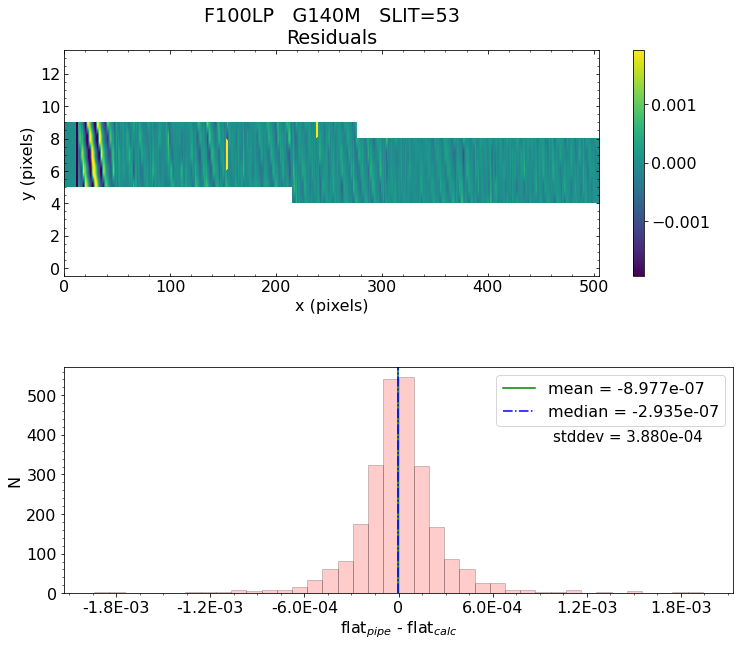

 *** Result of the test: PASSED


Working with slit: 54
 Subwindow origin:   px0=1543   py0=1306
silt_id='54'   quad=1   row=330   col=146   slitlet_id='330_146'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -3.191e-06    median = -6.318e-08    stdev = 3.936e-04
    Maximum   AbsoluteFlat Difference = 3.336e-03
    Minimum   AbsoluteFlat Difference = -3.099e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 56%
                            ->  3xtheshold = 19%
                            ->  5xtheshold = 8%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!

Making histogram plot for this slitlet...


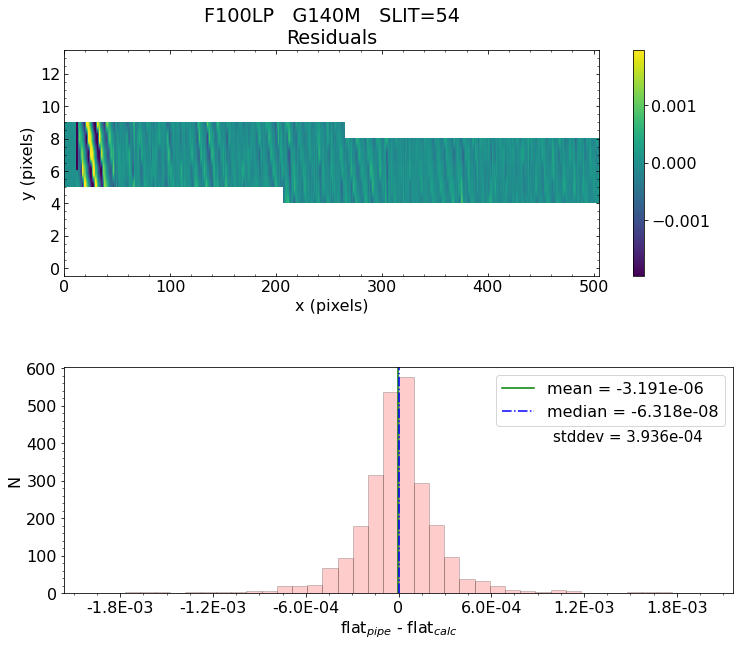

 *** Result of the test: PASSED


Working with slit: 42
 Subwindow origin:   px0=2019   py0=546
silt_id='42'   quad=2   row=138   col=56   slitlet_id='138_56'
Now looping through the pixels, this will take a while ... 
Calculating statistics... 

   Absolute Flat Difference  :   mean = 6.178e-05    median = 2.610e-07    stdev = 1.122e-03
    Maximum   AbsoluteFlat Difference = 2.895e-03
    Minimum   AbsoluteFlat Difference = -3.130e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 53%
                            ->  3xtheshold = 47%
                            ->  5xtheshold = 41%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


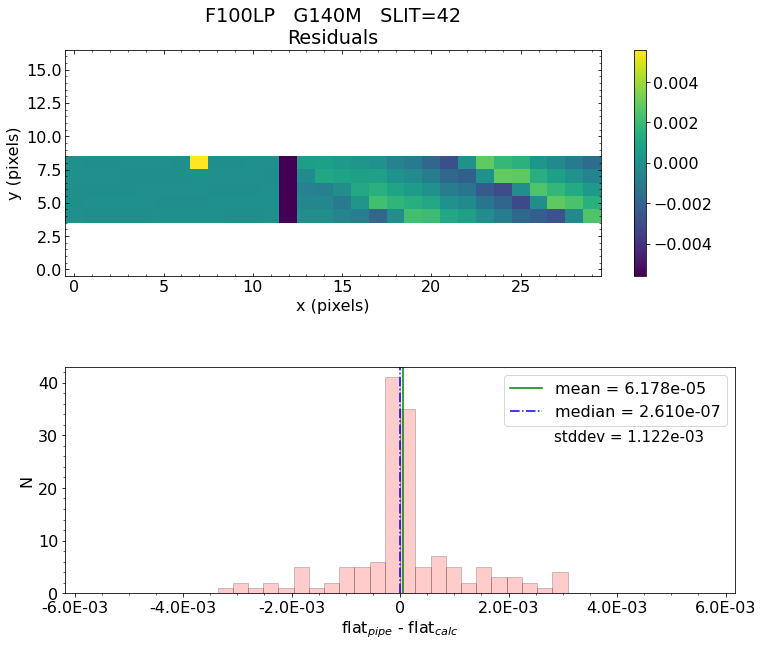

 *** Result of the test: PASSED


Working with slit: 43
 Subwindow origin:   px0=1971   py0=415
silt_id='43'   quad=2   row=155   col=82   slitlet_id='155_82'
Now looping through the pixels, this will take a while ... 


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/nirspec_pipe_testing_tool/calwebb_spec2_pytests/auxiliary_code/flattest_mos.py:527: RuntimeWarning: invalid value encountered in true_divide
  sff = int_tab/(last_sfv_wav - first_sfv_wav)


Calculating statistics... 

   Absolute Flat Difference  :   mean = -2.058e-05    median = 4.416e-07    stdev = 9.017e-04
    Maximum   AbsoluteFlat Difference = 3.212e-03
    Minimum   AbsoluteFlat Difference = -3.460e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 68%
                            ->  3xtheshold = 44%
                            ->  5xtheshold = 33%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


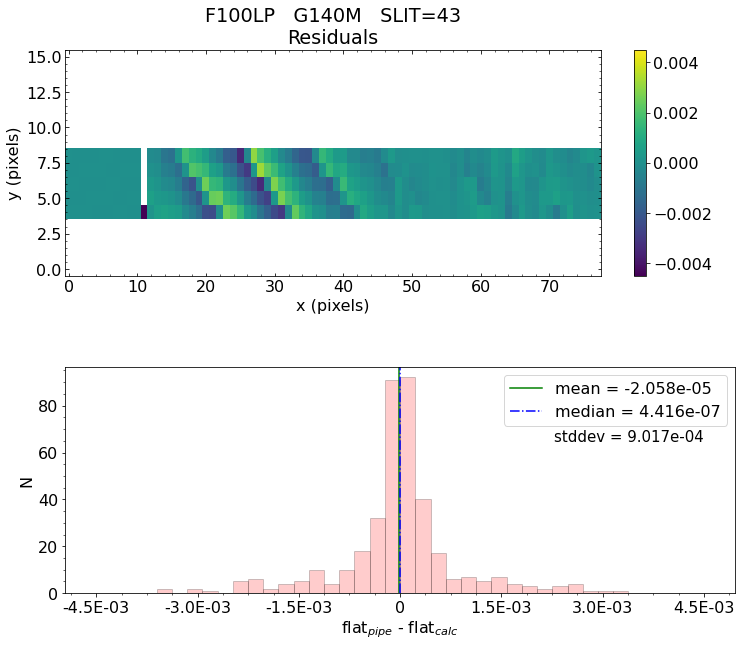

 *** Result of the test: PASSED


Working with slit: 44
 Subwindow origin:   px0=1970   py0=405
silt_id='44'   quad=2   row=155   col=84   slitlet_id='155_84'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -3.009e-05    median = 2.126e-07    stdev = 9.025e-04
    Maximum   AbsoluteFlat Difference = 3.116e-03
    Minimum   AbsoluteFlat Difference = -3.211e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 66%
                            ->  3xtheshold = 43%
                            ->  5xtheshold = 32%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


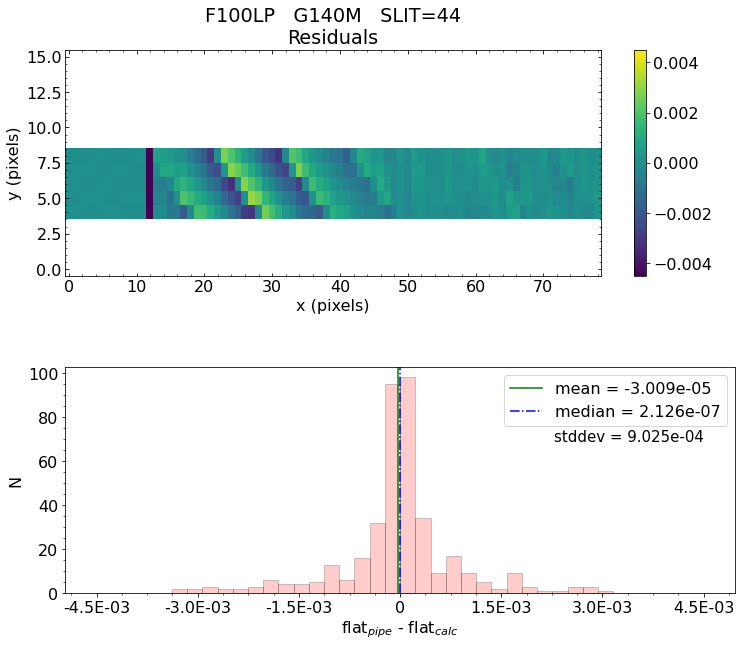

 *** Result of the test: PASSED


Working with slit: 45
 Subwindow origin:   px0=1909   py0=531
silt_id='45'   quad=2   row=180   col=59   slitlet_id='180_59'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 4.402e-06    median = 4.331e-06    stdev = 6.892e-04
    Maximum   AbsoluteFlat Difference = 3.197e-03
    Minimum   AbsoluteFlat Difference = -3.299e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 62%
                            ->  3xtheshold = 32%
                            ->  5xtheshold = 22%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


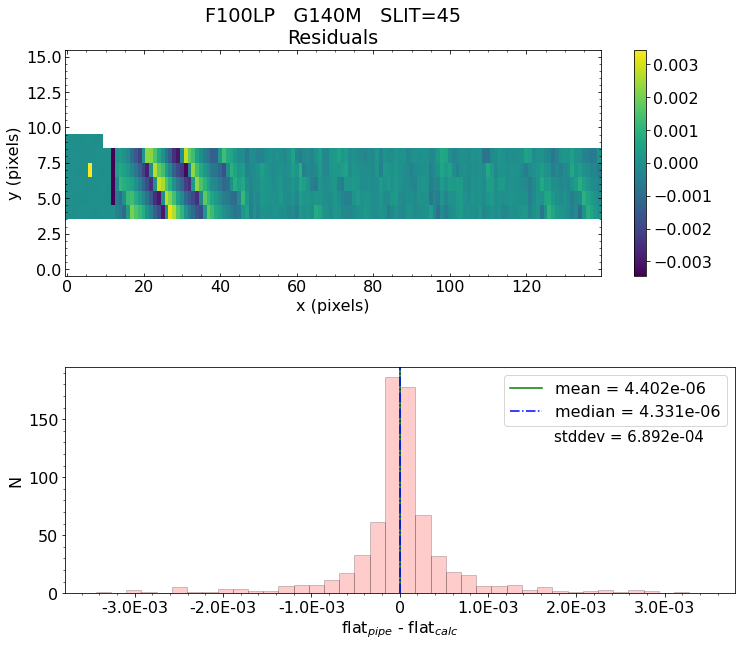

 *** Result of the test: PASSED


Working with slit: 46
 Subwindow origin:   px0=1883   py0=203
silt_id='46'   quad=2   row=186   col=124   slitlet_id='186_124'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -2.432e-06    median = -1.163e-06    stdev = 6.599e-04
    Maximum   AbsoluteFlat Difference = 3.507e-03
    Minimum   AbsoluteFlat Difference = -3.441e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 64%
                            ->  3xtheshold = 34%
                            ->  5xtheshold = 21%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


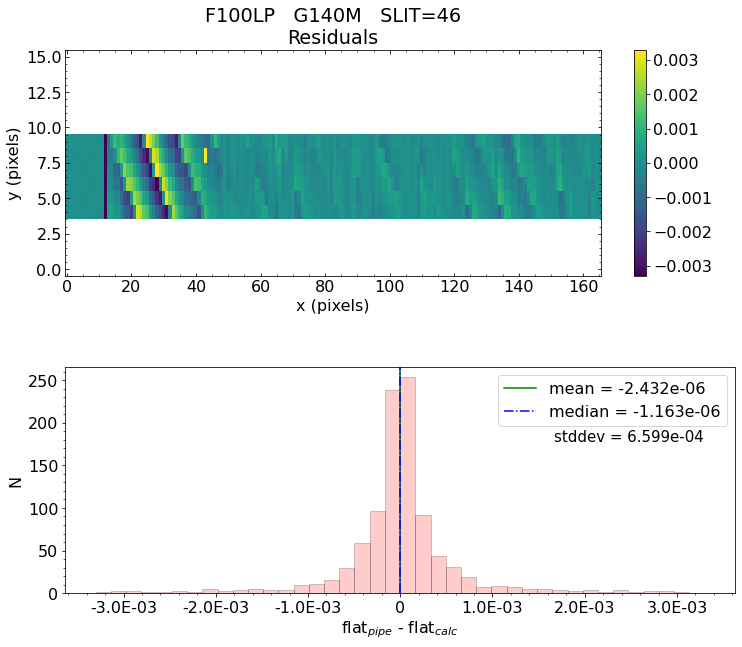

 *** Result of the test: PASSED


Working with slit: 47
 Subwindow origin:   px0=1816   py0=567
silt_id='47'   quad=2   row=216   col=52   slitlet_id='216_52'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -3.312e-06    median = 2.203e-06    stdev = 5.587e-04
    Maximum   AbsoluteFlat Difference = 3.331e-03
    Minimum   AbsoluteFlat Difference = -3.108e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 63%
                            ->  3xtheshold = 31%
                            ->  5xtheshold = 16%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


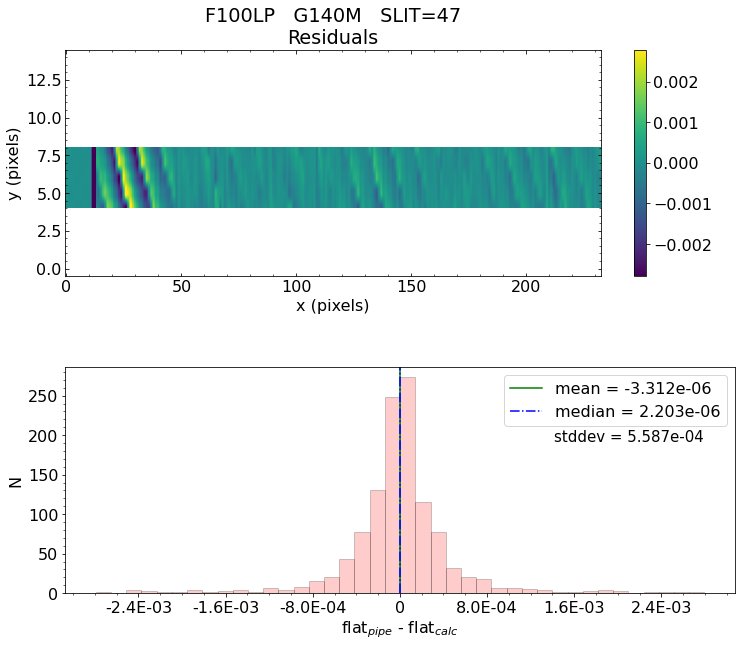

 *** Result of the test: PASSED


Working with slit: 48
 Subwindow origin:   px0=1816   py0=562
silt_id='48'   quad=2   row=216   col=53   slitlet_id='216_53'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 2.535e-06    median = 5.171e-06    stdev = 5.615e-04
    Maximum   AbsoluteFlat Difference = 3.132e-03
    Minimum   AbsoluteFlat Difference = -3.578e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 62%
                            ->  3xtheshold = 31%
                            ->  5xtheshold = 16%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


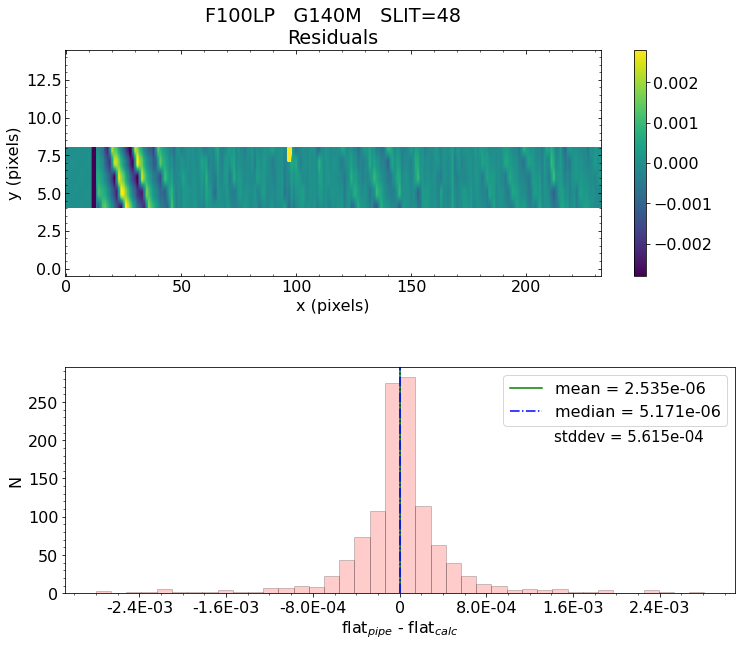

 *** Result of the test: PASSED


Working with slit: 49
 Subwindow origin:   px0=1792   py0=632
silt_id='49'   quad=2   row=226   col=39   slitlet_id='226_39'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -7.313e-06    median = -1.515e-06    stdev = 5.203e-04
    Maximum   AbsoluteFlat Difference = 2.991e-03
    Minimum   AbsoluteFlat Difference = -3.641e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 63%
                            ->  3xtheshold = 28%
                            ->  5xtheshold = 14%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


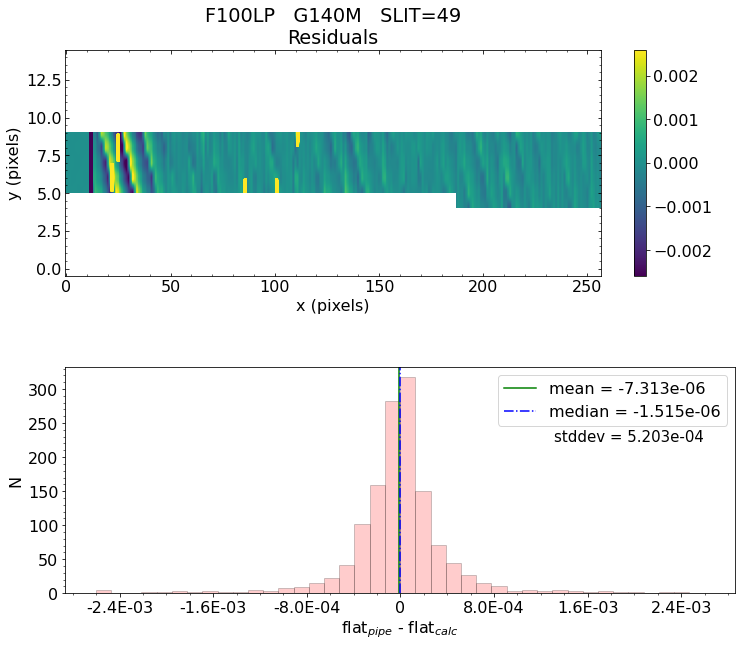

 *** Result of the test: PASSED


Working with slit: 50
 Subwindow origin:   px0=1775   py0=239
silt_id='50'   quad=2   row=228   col=117   slitlet_id='228_117'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.084e-06    median = -2.613e-06    stdev = 5.591e-04
    Maximum   AbsoluteFlat Difference = 3.405e-03
    Minimum   AbsoluteFlat Difference = -3.156e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 64%
                            ->  3xtheshold = 30%
                            ->  5xtheshold = 16%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


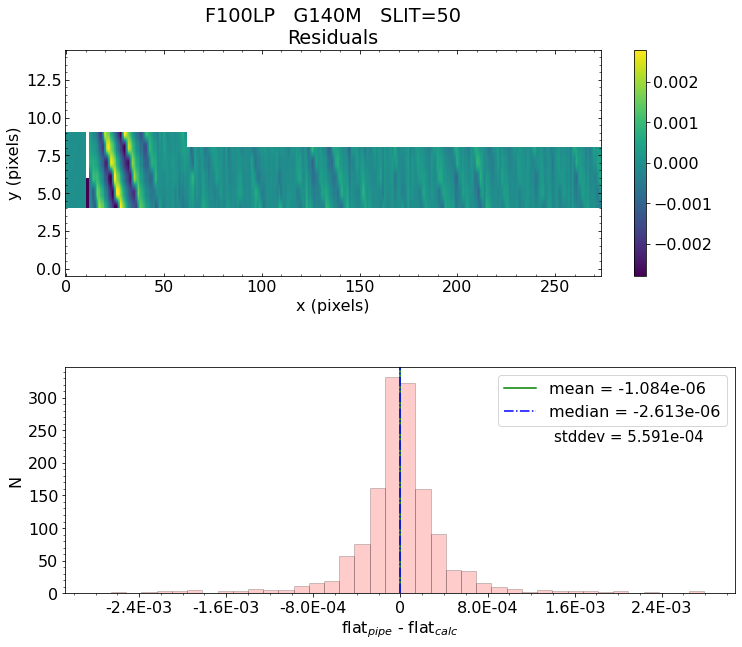

 *** Result of the test: PASSED


Working with slit: 51
 Subwindow origin:   px0=1760   py0=431
silt_id='51'   quad=2   row=236   col=79   slitlet_id='236_79'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -2.492e-06    median = -2.024e-07    stdev = 5.109e-04
    Maximum   AbsoluteFlat Difference = 3.030e-03
    Minimum   AbsoluteFlat Difference = -3.411e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 62%
                            ->  3xtheshold = 28%
                            ->  5xtheshold = 14%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


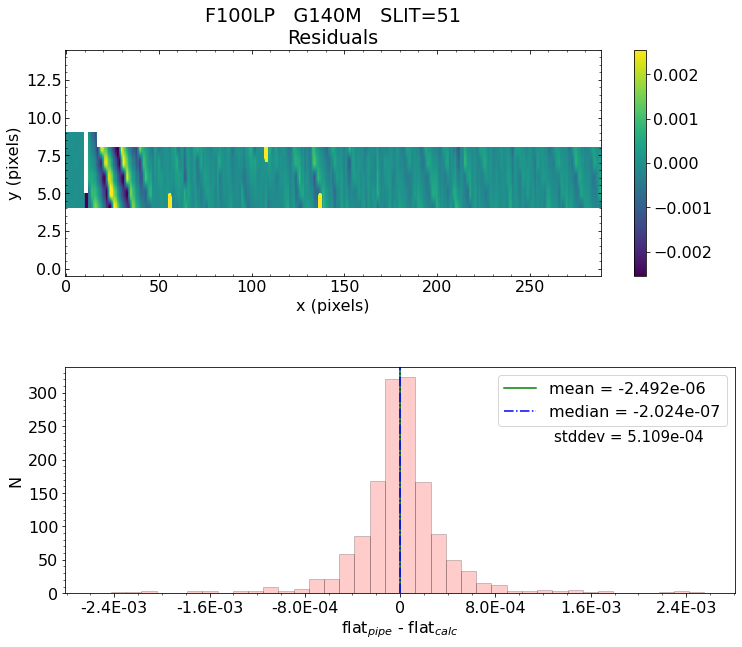

 *** Result of the test: PASSED


Working with slit: 52
 Subwindow origin:   px0=1723   py0=804
silt_id='52'   quad=2   row=255   col=5   slitlet_id='255_5'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -6.027e-06    median = -6.395e-07    stdev = 4.645e-04
    Maximum   AbsoluteFlat Difference = 3.024e-03
    Minimum   AbsoluteFlat Difference = -3.256e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 60%
                            ->  3xtheshold = 25%
                            ->  5xtheshold = 12%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making histogram plot for this slitlet...


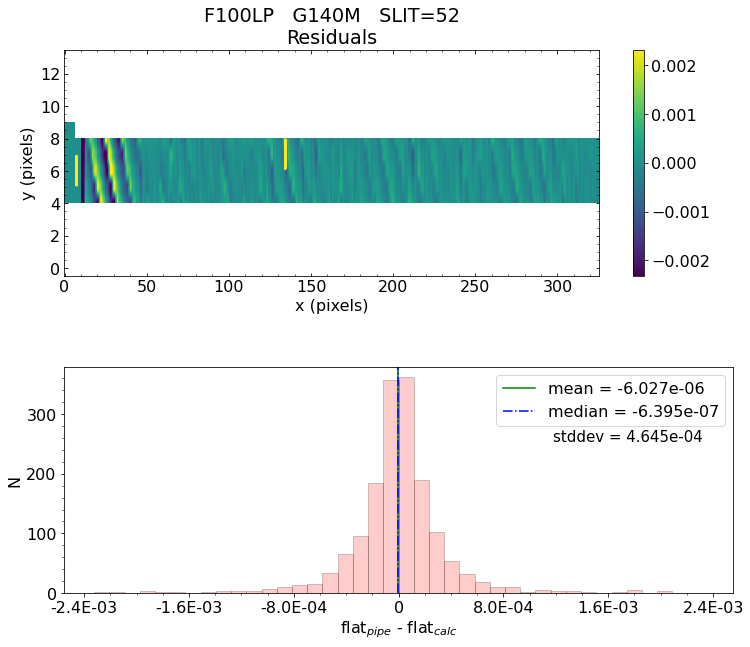

 *** Result of the test: PASSED


Working with slit: 55
 Subwindow origin:   px0=1023   py0=1416
silt_id='55'   quad=3   row=82   col=124   slitlet_id='82_124'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.712e-06    median = -1.278e-06    stdev = 2.924e-04
    Maximum   AbsoluteFlat Difference = 2.817e-03
    Minimum   AbsoluteFlat Difference = -3.275e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 47%
                            ->  3xtheshold = 11%
                            ->  5xtheshold = 4%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!

Making histogram plot for this slitlet...


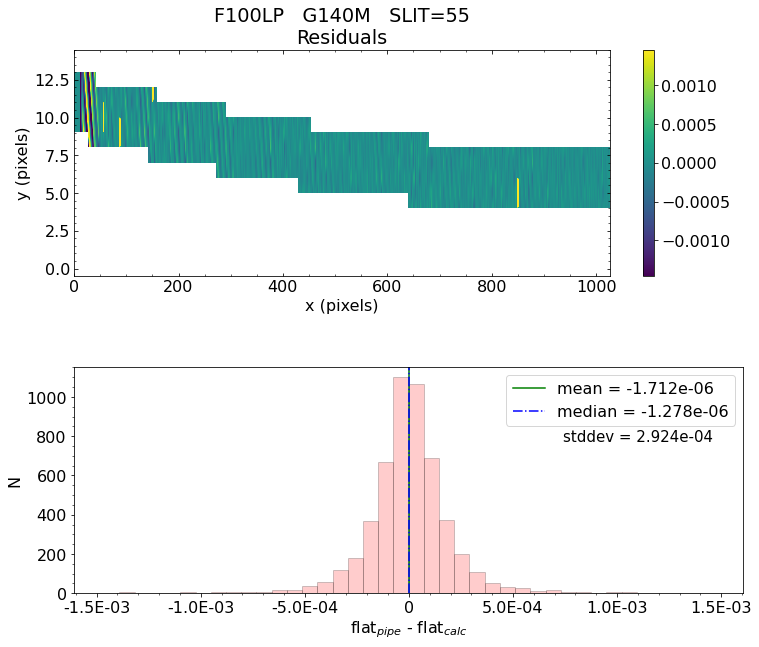

 *** Result of the test: PASSED


Working with slit: 65
 Subwindow origin:   px0=428   py0=1252
silt_id='65'   quad=3   row=310   col=156   slitlet_id='310_156'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 7.258e-07    median = 3.305e-08    stdev = 2.606e-04
    Maximum   AbsoluteFlat Difference = 3.521e-03
    Minimum   AbsoluteFlat Difference = -3.369e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 43%
                            ->  3xtheshold = 9%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


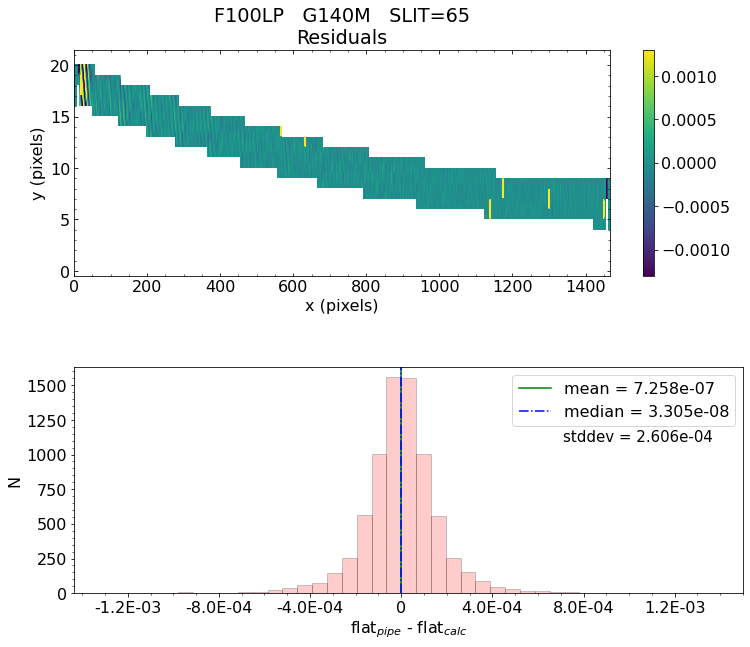

 *** Result of the test: PASSED


Working with slit: 66
 Subwindow origin:   px0=427   py0=1453
silt_id='66'   quad=3   row=314   col=116   slitlet_id='314_116'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 5.087e-08    median = 2.711e-07    stdev = 2.596e-04
    Maximum   AbsoluteFlat Difference = 2.925e-03
    Minimum   AbsoluteFlat Difference = -3.568e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 42%
                            ->  3xtheshold = 8%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


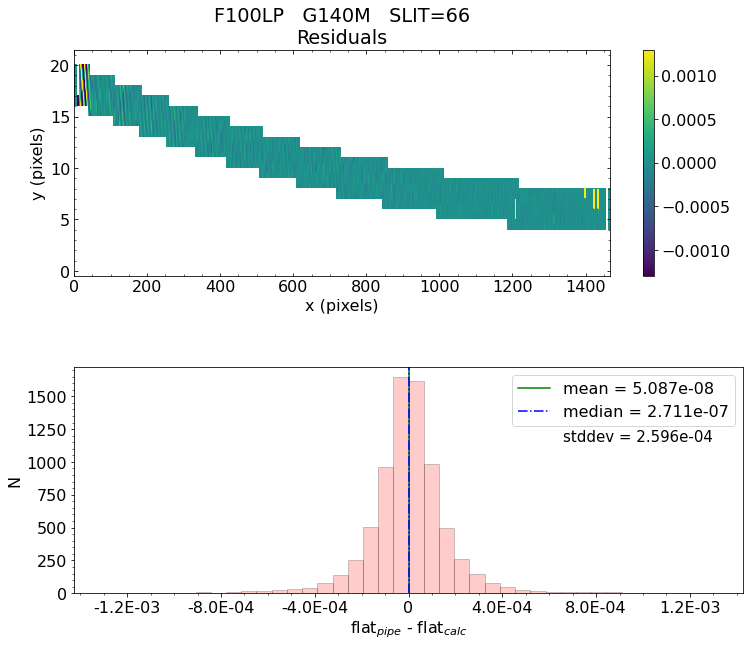

 *** Result of the test: PASSED


Working with slit: 68
 Subwindow origin:   px0=376   py0=1477
silt_id='68'   quad=3   row=334   col=111   slitlet_id='334_111'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.918e-06    median = -3.851e-07    stdev = 2.591e-04
    Maximum   AbsoluteFlat Difference = 2.790e-03
    Minimum   AbsoluteFlat Difference = -3.444e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 43%
                            ->  3xtheshold = 8%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


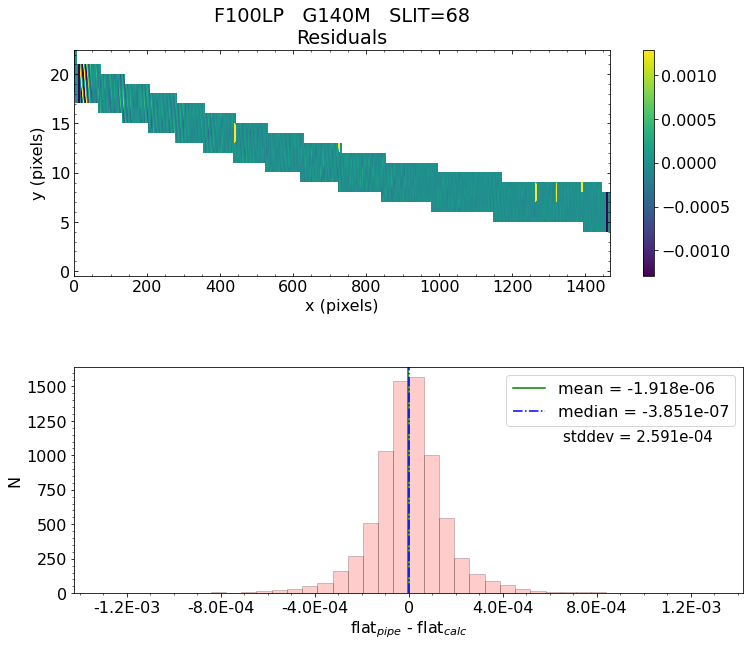

 *** Result of the test: PASSED


Working with slit: 56
 Subwindow origin:   px0=873   py0=769
silt_id='56'   quad=4   row=130   col=12   slitlet_id='130_12'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -3.948e-06    median = -3.402e-07    stdev = 2.819e-04
    Maximum   AbsoluteFlat Difference = 2.920e-03
    Minimum   AbsoluteFlat Difference = -3.276e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 47%
                            ->  3xtheshold = 11%
                            ->  5xtheshold = 4%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!

Making histogram plot for this slitlet...


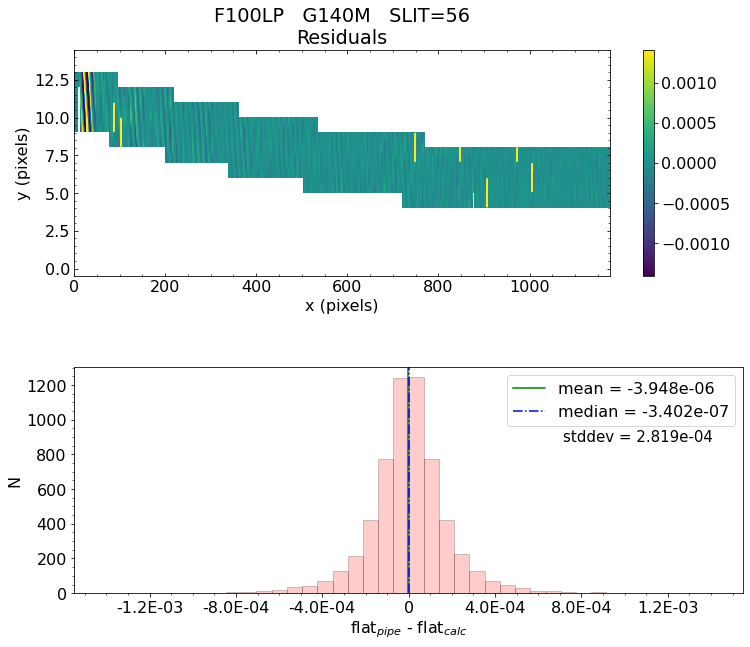

 *** Result of the test: PASSED


Working with slit: 57


 Subwindow origin:   px0=806   py0=355
silt_id='57'   quad=4   row=150   col=94   slitlet_id='150_94'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.176e-06    median = -8.547e-07    stdev = 2.862e-04
    Maximum   AbsoluteFlat Difference = 3.463e-03
    Minimum   AbsoluteFlat Difference = -3.578e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 46%
                            ->  3xtheshold = 10%
                            ->  5xtheshold = 4%
Making histogram plot for this slitlet...


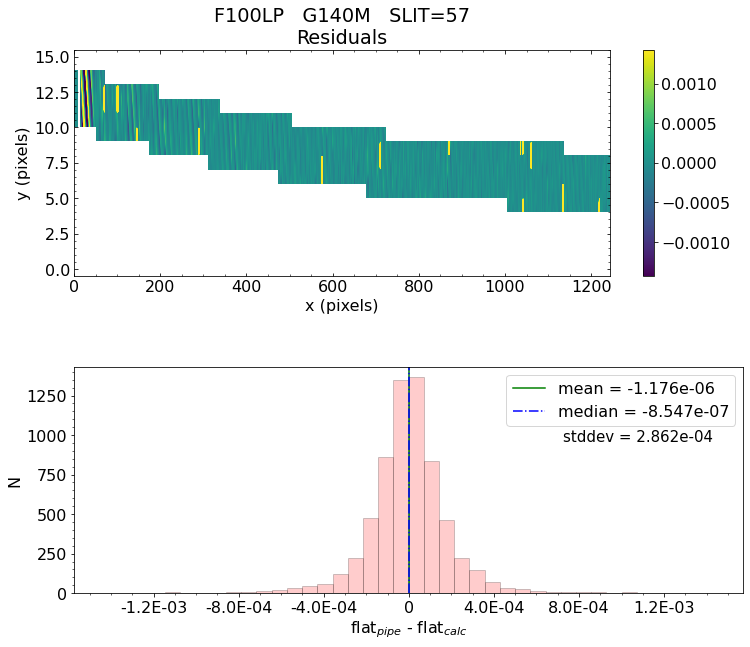

 *** Result of the test: PASSED


Working with slit: 58
 Subwindow origin:   px0=732   py0=259
silt_id='58'   quad=4   row=177   col=113   slitlet_id='177_113'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.126e-06    median = -1.079e-06    stdev = 2.839e-04
    Maximum   AbsoluteFlat Difference = 4.031e-03
    Minimum   AbsoluteFlat Difference = -3.660e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 46%
                            ->  3xtheshold = 10%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


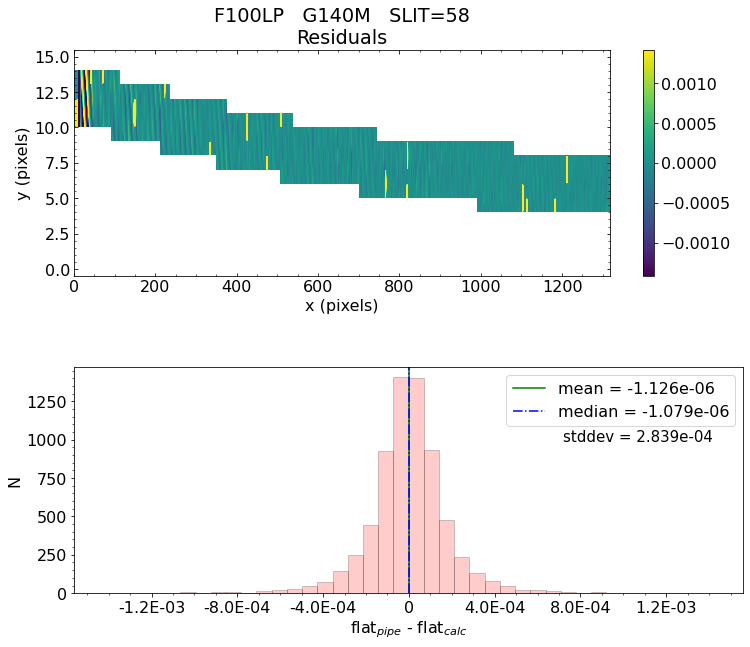

 *** Result of the test: PASSED


Working with slit: 59
 Subwindow origin:   px0=659   py0=72
silt_id='59'   quad=4   row=203   col=150   slitlet_id='203_150'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 1.470e-06    median = 6.050e-07    stdev = 2.819e-04
    Maximum   AbsoluteFlat Difference = 3.525e-03
    Minimum   AbsoluteFlat Difference = -3.111e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 45%
                            ->  3xtheshold = 10%
                            ->  5xtheshold = 4%
Making histogram plot for this slitlet...


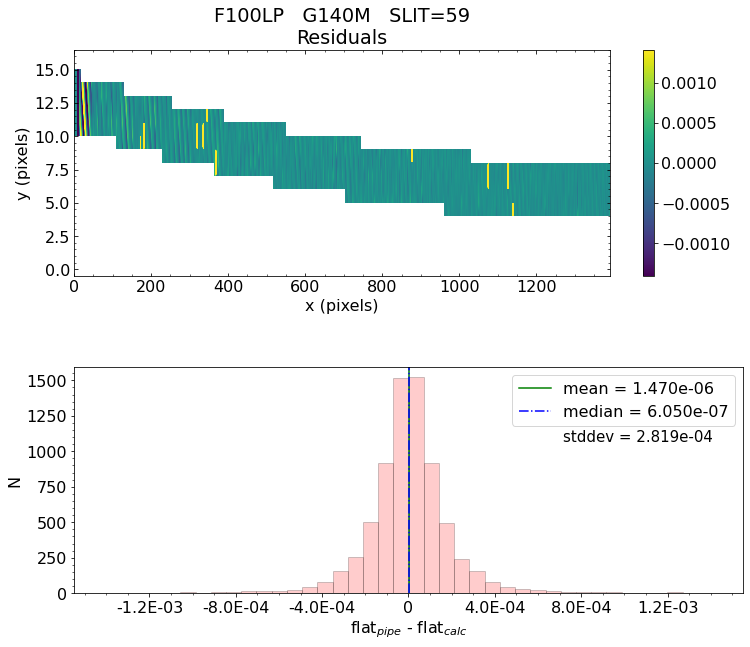

 *** Result of the test: PASSED


Working with slit: 60
 Subwindow origin:   px0=642   py0=682
silt_id='60'   quad=4   row=218   col=29   slitlet_id='218_29'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -9.855e-07    median = -1.076e-06    stdev = 2.818e-04
    Maximum   AbsoluteFlat Difference = 3.695e-03
    Minimum   AbsoluteFlat Difference = -3.349e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 45%
                            ->  3xtheshold = 10%
                            ->  5xtheshold = 4%
Making histogram plot for this slitlet...


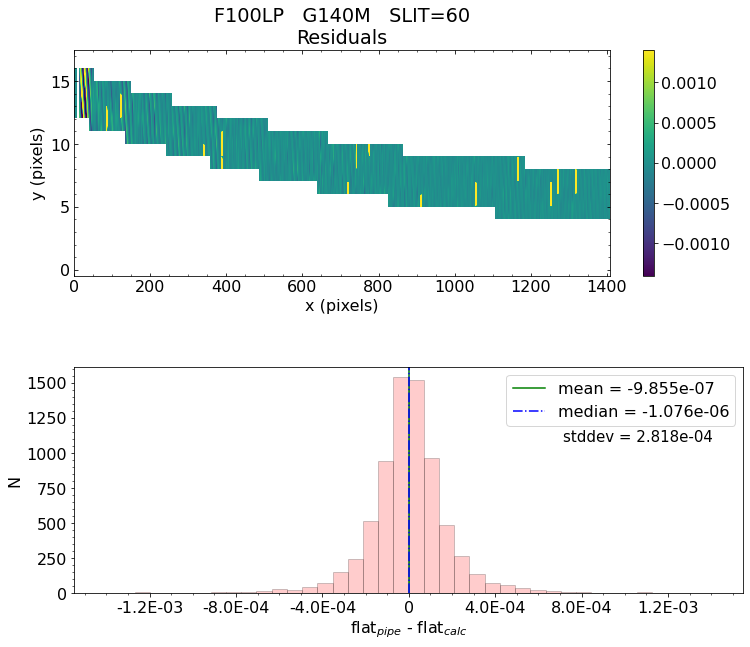

 *** Result of the test: PASSED


Working with slit: 61
 Subwindow origin:   px0=621   py0=823
silt_id='61'   quad=4   row=228   col=1   slitlet_id='228_1'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -2.516e-07    median = -8.560e-07    stdev = 2.707e-04
    Maximum   AbsoluteFlat Difference = 3.385e-03
    Minimum   AbsoluteFlat Difference = -3.442e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 44%
                            ->  3xtheshold = 10%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


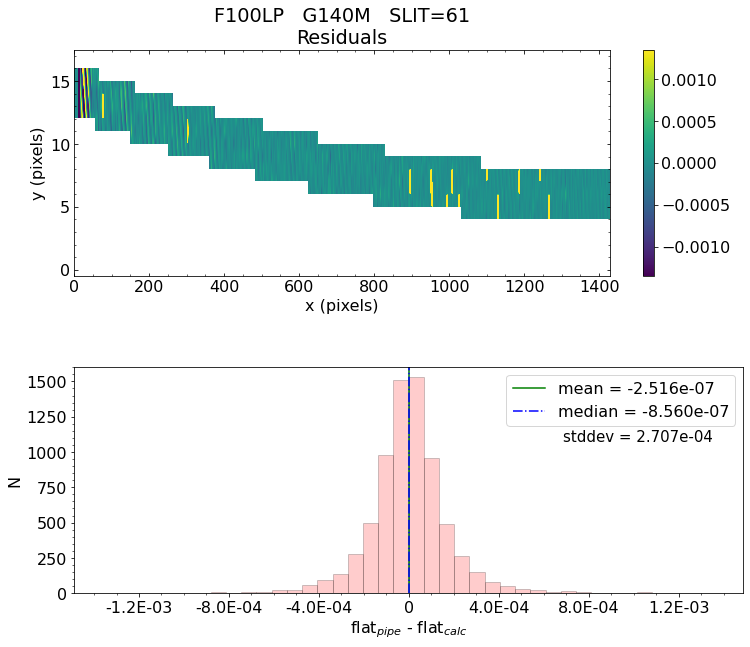

 *** Result of the test: PASSED


Working with slit: 62
 Subwindow origin:   px0=571   py0=511
silt_id='62'   quad=4   row=243   col=63   slitlet_id='243_63'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 9.825e-07    median = -1.237e-07    stdev = 2.749e-04
    Maximum   AbsoluteFlat Difference = 3.040e-03
    Minimum   AbsoluteFlat Difference = -3.424e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 44%
                            ->  3xtheshold = 9%
                            ->  5xtheshold = 4%
Making histogram plot for this slitlet...


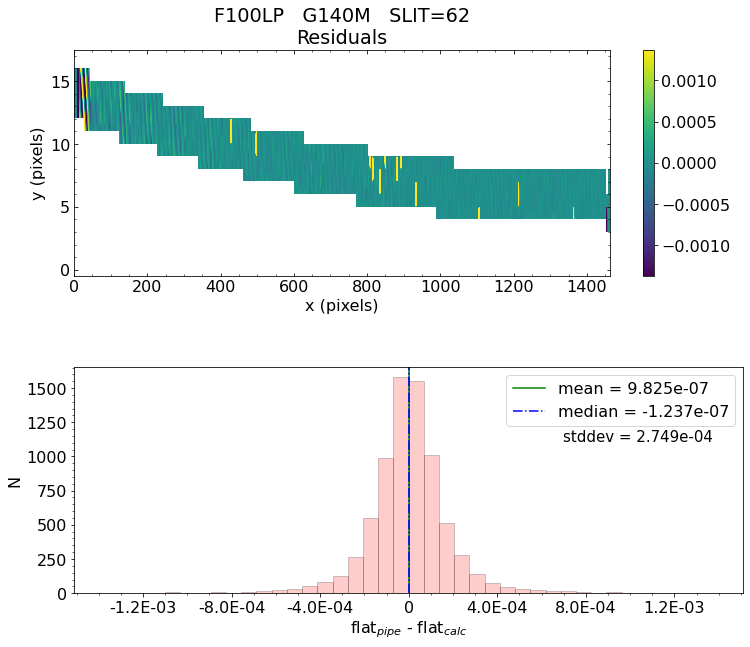

 *** Result of the test: PASSED


Working with slit: 63
 Subwindow origin:   px0=455   py0=182
silt_id='63'   quad=4   row=283   col=128   slitlet_id='283_128'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 2.434e-06    median = -1.413e-07    stdev = 2.637e-04
    Maximum   AbsoluteFlat Difference = 3.251e-03
    Minimum   AbsoluteFlat Difference = -3.270e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 45%
                            ->  3xtheshold = 9%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


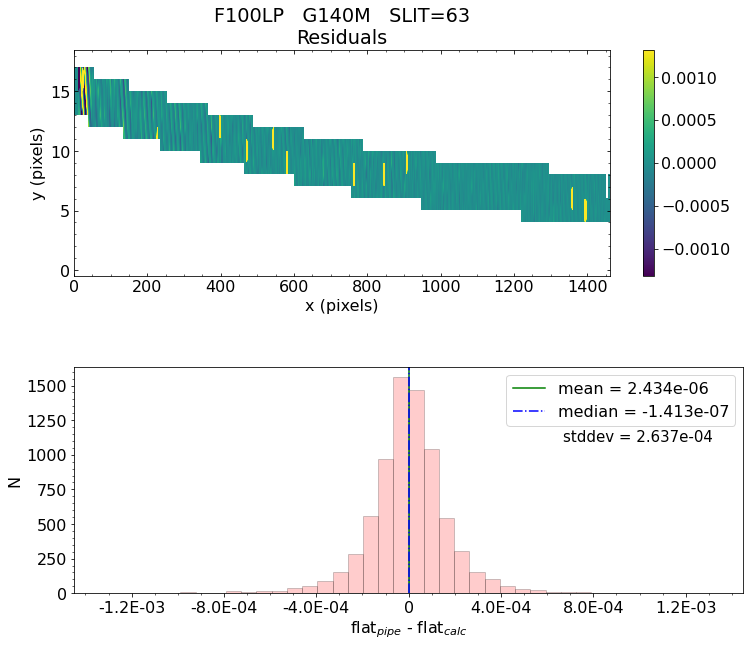

 *** Result of the test: PASSED


Working with slit: 64
 Subwindow origin:   px0=455   py0=177
silt_id='64'   quad=4   row=283   col=129   slitlet_id='283_129'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.588e-06    median = 6.770e-07    stdev = 2.666e-04
    Maximum   AbsoluteFlat Difference = 3.242e-03
    Minimum   AbsoluteFlat Difference = -3.409e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 43%
                            ->  3xtheshold = 9%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


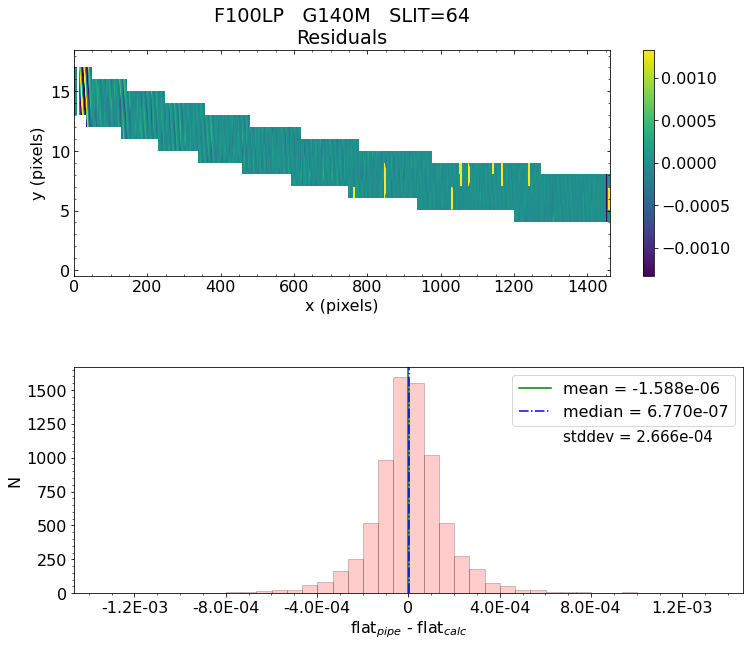

 *** Result of the test: PASSED


Working with slit: 67
 Subwindow origin:   px0=329   py0=131
silt_id='67'   quad=4   row=331   col=138   slitlet_id='331_138'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 3.444e-07    median = 5.367e-07    stdev = 2.700e-04
    Maximum   AbsoluteFlat Difference = 3.332e-03
    Minimum   AbsoluteFlat Difference = -3.099e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 45%
                            ->  3xtheshold = 10%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


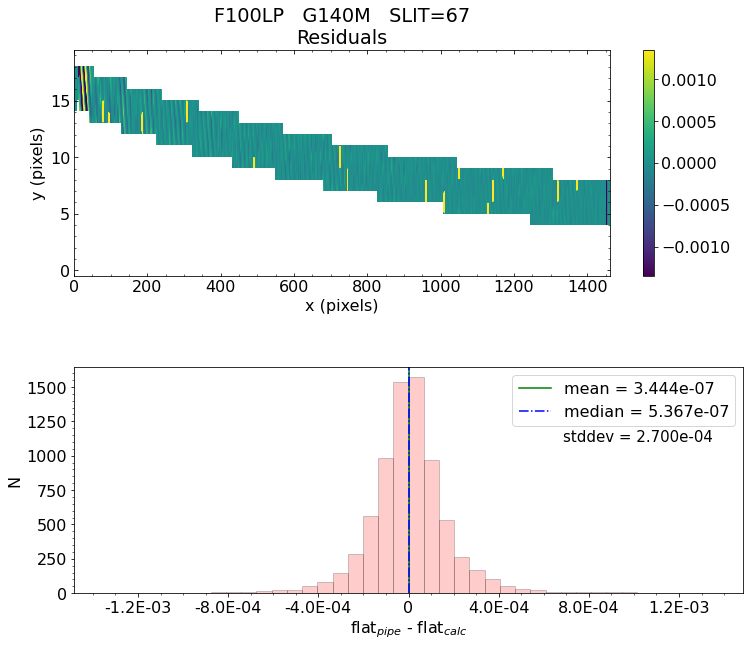

 *** Result of the test: PASSED


 *** Final result for flat_field test will be reported as PASSED *** 

('* Script flattest_mos.py took ', '2.3480581680933637 minutes to finish.')
Did flat_field validation test passed?  All slitlets PASSED flat_field test. 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs1_f_01.03.fits', fd=50, position=680480640, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_sflat_G140M_OPAQUE_FLAT1_nrs1_f_01.01.fits', fd=58, position=1006715520, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_fflat_F100LP_01.01.fits', fd=59, position=299989440, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validat

Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_g140m_line1_NRS2_uncal.fits


2021-06-03 23:38:54,590 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-03 23:38:54,607 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-03 23:38:54,610 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-03 23:38:54,611 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-03 23:38:54,613 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-03 23:38:54,614 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-03 23:38:54,616 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-03 23:38:54,618 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-03 23:38:54,619 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-03 23:38:54,621 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-03 23:38:54,623 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-03 23:38:54,625 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-03 23:38:54,627 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-03 23:38:54,629 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-03 23:38:54,631 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-03 23:38:54,633 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-03 23:38:54,635 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-03 23:38:54,637 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_g140m_line1_NRS2_uncal.fits' mode='rb' closefd=True>
  gc.collect()


2021-06-03 23:38:55,065 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/mos_g140m_line1_NRS2_uncal.fits',).


2021-06-03 23:38:55,075 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-03 23:38:55,186 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'mos_g140m_line1_NRS2_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-03 23:38:55,197 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0143.fits'.


2021-06-03 23:38:55,199 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits'.


2021-06-03 23:38:55,202 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0020.fits'.


2021-06-03 23:38:55,204 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0025.fits'.


2021-06-03 23:38:55,206 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-03 23:38:55,207 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0016.fits'.


2021-06-03 23:38:55,208 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2021-06-03 23:38:55,209 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-03 23:38:55,210 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-03 23:38:55,211 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0022.fits'.


2021-06-03 23:38:55,213 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0104.fits'.


2021-06-03 23:38:55,215 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-03 23:38:55,216 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-03 23:38:55,216 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-03 23:38:55,733 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:38:55,735 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:38:55,888 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-03 23:38:55,889 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-03 23:38:55,892 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-03 23:38:56,234 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:38:56,237 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:38:56,257 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0025.fits


2021-06-03 23:38:56,565 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-03 23:38:56,920 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:38:56,922 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:38:56,945 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0022.fits


2021-06-03 23:38:57,437 - stpipe.Detector1Pipeline.saturation - INFO - Detected 83201 saturated pixels


2021-06-03 23:38:57,468 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-03 23:38:57,483 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-03 23:38:57,822 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:38:57,824 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:38:57,825 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-03 23:38:57,827 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-03 23:38:58,144 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:38:58,146 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:38:58,170 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0104.fits


2021-06-03 23:38:58,478 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-03 23:38:58,821 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:38:58,823 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-03 23:38:58,831 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2021-06-03 23:38:58,832 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2021-06-03 23:38:58,833 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2021-06-03 23:38:58,834 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.000000


2021-06-03 23:38:58,835 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = True


2021-06-03 23:39:02,327 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-03 23:39:02,732 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:39:02,734 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:39:02,756 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0020.fits


2021-06-03 23:39:03,777 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-03 23:39:04,105 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:39:04,107 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-03 23:39:04,126 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0143.fits


2021-06-03 23:39:04,398 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=6, nframes=1, groupgap=0


2021-06-03 23:39:04,399 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=10, nframes=1, groupgap=0


2021-06-03 23:39:04,661 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-03 23:39:04,983 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:39:04,986 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-03 23:39:04,995 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 4 sigma


2021-06-03 23:39:05,007 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits


2021-06-03 23:39:05,071 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0016.fits


2021-06-03 23:39:05,128 - stpipe.Detector1Pipeline.jump - INFO - Found 32 possible cores to use for jump detection 


2021-06-03 23:39:05,389 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2021-06-03 23:39:05,660 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2021-06-03 23:39:07,469 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier Two-point found 63824 pixels with at least one CR


2021-06-03 23:39:10,277 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 4.88623 sec


2021-06-03 23:39:10,284 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 5.288521


2021-06-03 23:39:10,289 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-03 23:39:10,688 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 6, 2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:39:10,690 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-03 23:39:10,721 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0016.fits


2021-06-03 23:39:10,779 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits


2021-06-03 23:39:10,835 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-03 23:39:10,836 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:872: RuntimeWarning: invalid value encountered in multiply
  var_p4[num_int,:,:,:] *= ( segs_4[num_int,:,:,:] > 0)


2021-06-03 23:39:37,293 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 6


2021-06-03 23:39:37,294 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


2021-06-03 23:39:37,415 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-03 23:39:38,136 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:39:38,138 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:39:38,210 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:39:38,211 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:39:38,213 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:39:38,907 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:39:38,909 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:39:38,986 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:39:38,987 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:39:38,989 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:39:38,991 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-03 23:39:38,992 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-03 23:39:39,002 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-03 23:39:39,712 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<ImageModel(2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:39:39,714 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-03 23:39:39,888 - stpipe.AssignWcsStep - INFO - Retrieving open MSA slitlets for msa_metadata_id = 1 and dither_index = 1


2021-06-03 23:39:40,119 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.1260581910610199 deg


2021-06-03 23:39:40,120 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3316612243652344 deg


2021-06-03 23:39:40,121 - stpipe.AssignWcsStep - INFO - theta_y correction: 0.0002496099796717191 deg


2021-06-03 23:39:40,122 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:39:41,020 - stpipe.AssignWcsStep - INFO - Removing slit 65 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:39:41,035 - stpipe.AssignWcsStep - INFO - Removing slit 66 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:39:41,049 - stpipe.AssignWcsStep - INFO - Removing slit 68 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:39:41,090 - stpipe.AssignWcsStep - INFO - Removing slit 58 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:39:41,105 - stpipe.AssignWcsStep - INFO - Removing slit 59 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:39:41,119 - stpipe.AssignWcsStep - INFO - Removing slit 60 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:39:41,134 - stpipe.AssignWcsStep - INFO - Removing slit 61 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:39:41,151 - stpipe.AssignWcsStep - INFO - Removing slit 62 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:39:41,166 - stpipe.AssignWcsStep - INFO - Removing slit 63 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:39:41,180 - stpipe.AssignWcsStep - INFO - Removing slit 64 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:39:41,196 - stpipe.AssignWcsStep - INFO - Removing slit 67 from the list of open slits because the WCS bounding_box is completely outside the detector.


2021-06-03 23:39:41,197 - stpipe.AssignWcsStep - INFO - Slits projected on detector NRS2: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]


2021-06-03 23:39:41,198 - stpipe.AssignWcsStep - INFO - Computing WCS for 57 open slitlets


2021-06-03 23:39:41,230 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.1260581910610199 deg


2021-06-03 23:39:41,231 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3316612243652344 deg


2021-06-03 23:39:41,231 - stpipe.AssignWcsStep - INFO - theta_y correction: 0.0002496099796717191 deg


2021-06-03 23:39:41,233 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:39:41,243 - stpipe.AssignWcsStep - INFO - SPORDER= -1, wrange=[9.7e-07, 1.89e-06]


2021-06-03 23:39:41,375 - stpipe.AssignWcsStep - INFO - There are 27 open slits in quadrant 1


2021-06-03 23:39:41,628 - stpipe.AssignWcsStep - INFO - There are 27 open slits in quadrant 2


2021-06-03 23:39:41,865 - stpipe.AssignWcsStep - INFO - There are 1 open slits in quadrant 3


2021-06-03 23:39:41,876 - stpipe.AssignWcsStep - INFO - There are 2 open slits in quadrant 4


2021-06-03 23:39:41,895 - stpipe.AssignWcsStep - INFO - There are 0 open slits in quadrant 5


2021-06-03 23:39:42,064 - stpipe.AssignWcsStep - INFO - Created a NIRSPEC nrs_msaspec pipeline with references {'distortion': None, 'filteroffset': None, 'specwcs': None, 'regions': None, 'wavelengthrange': '/grp/crds/cache/references/jwst/jwst_nirspec_wavelengthrange_0004.asdf', 'camera': '/grp/crds/cache/references/jwst/jwst_nirspec_camera_0004.asdf', 'collimator': '/grp/crds/cache/references/jwst/jwst_nirspec_collimator_0004.asdf', 'disperser': '/grp/crds/cache/references/jwst/jwst_nirspec_disperser_0032.asdf', 'fore': '/grp/crds/cache/references/jwst/jwst_nirspec_fore_0023.asdf', 'fpa': '/grp/crds/cache/references/jwst/jwst_nirspec_fpa_0005.asdf', 'msa': '/grp/crds/cache/references/jwst/jwst_nirspec_msa_0005.asdf', 'ote': '/grp/crds/cache/references/jwst/jwst_nirspec_ote_0005.asdf', 'ifupost': None, 'ifufore': None, 'ifuslicer': None, 'msametafile': 'V8460001000101_msa.fits'}


2021-06-03 23:39:43,683 - stpipe.AssignWcsStep - INFO - COMPLETED assign_wcs


2021-06-03 23:39:43,693 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep done


2021-06-03 23:39:43,711 - stpipe.MSAFlagOpenStep - INFO - MSAFlagOpenStep instance created.


2021-06-03 23:39:44,399 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep running with args (<ImageModel(2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:39:44,402 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:39:44,421 - stpipe.MSAFlagOpenStep - INFO - Using reference file /grp/crds/cache/references/jwst/jwst_nirspec_msaoper_0001.json


2021-06-03 23:39:44,422 - stpipe.JwstStep - INFO - JwstStep instance created.


2021-06-03 23:39:44,552 - stpipe.MSAFlagOpenStep - INFO - gwa_ytilt is 0.1260581910610199 deg


2021-06-03 23:39:44,553 - stpipe.MSAFlagOpenStep - INFO - gwa_xtilt is 0.3316612243652344 deg


2021-06-03 23:39:44,554 - stpipe.MSAFlagOpenStep - INFO - theta_y correction: 0.0002496099796717191 deg


2021-06-03 23:39:44,555 - stpipe.MSAFlagOpenStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:39:44,565 - stpipe.MSAFlagOpenStep - INFO - SPORDER= -1, wrange=[9.7e-07, 1.89e-06]


2021-06-03 23:39:44,691 - stpipe.MSAFlagOpenStep - INFO - There are 5 open slits in quadrant 1


2021-06-03 23:39:44,737 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 2


2021-06-03 23:39:44,766 - stpipe.MSAFlagOpenStep - INFO - There are 9 open slits in quadrant 3


2021-06-03 23:39:44,847 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 4


2021-06-03 23:39:44,875 - stpipe.MSAFlagOpenStep - INFO - There are 0 open slits in quadrant 5


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


2021-06-03 23:39:57,812 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep done


2021-06-03 23:39:57,824 - stpipe.Extract2dStep - INFO - Extract2dStep instance created.


2021-06-03 23:39:58,285 - stpipe.Extract2dStep - INFO - Step Extract2dStep running with args (<ImageModel(2048, 2048) from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:39:58,288 - stpipe.Extract2dStep - INFO - Step Extract2dStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'slit_name': None, 'extract_orders': None, 'tsgrism_extract_height': None, 'wfss_extract_half_height': 5, 'grism_objects': None, 'mmag_extract': 99.0}


2021-06-03 23:39:58,310 - stpipe.Extract2dStep - INFO - EXP_TYPE is NRS_MSASPEC


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/utils.py:72: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  indx = np.asarray(np.floor(np.asarray(value) + 0.5), dtype=np.int)
2021-06-03 23:39:59,195 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 6


2021-06-03 23:39:59,196 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 138 1619


2021-06-03 23:39:59,197 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1761 1785


2021-06-03 23:39:59,351 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:39:59,360 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.263159350 -45.671304678 156.263027991 -45.671181725 156.262965146 -45.671213584 156.263096502 -45.671336538


2021-06-03 23:39:59,361 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.263159350 -45.671304678 156.263027991 -45.671181725 156.262965146 -45.671213584 156.263096502 -45.671336538


2021-06-03 23:40:00,590 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 7


2021-06-03 23:40:00,592 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 138 1619


2021-06-03 23:40:00,592 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1756 1780


2021-06-03 23:40:00,738 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:00,746 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.263031777 -45.671185268 156.262900430 -45.671062325 156.262837587 -45.671094183 156.262968931 -45.671217127


2021-06-03 23:40:00,747 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.263031777 -45.671185268 156.262900430 -45.671062325 156.262837587 -45.671094183 156.262968931 -45.671217127


2021-06-03 23:40:02,004 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 8


2021-06-03 23:40:02,005 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 137 1618


2021-06-03 23:40:02,006 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1806 1830


2021-06-03 23:40:02,157 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:02,166 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.264221225 -45.672423837 156.264089757 -45.672300789 156.264026890 -45.672332658 156.264158355 -45.672455707


2021-06-03 23:40:02,166 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.264221225 -45.672423837 156.264089757 -45.672300789 156.264026890 -45.672332658 156.264158355 -45.672455707


2021-06-03 23:40:03,415 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 9


2021-06-03 23:40:03,416 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 137 1618


2021-06-03 23:40:03,416 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1801 1825


2021-06-03 23:40:03,560 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:03,569 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.264093546 -45.672304335 156.263962090 -45.672181297 156.263899225 -45.672213165 156.264030678 -45.672336204


2021-06-03 23:40:03,570 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.264093546 -45.672304335 156.263962090 -45.672181297 156.263899225 -45.672213165 156.264030678 -45.672336204


2021-06-03 23:40:04,838 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 10


2021-06-03 23:40:04,839 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 137 1618


2021-06-03 23:40:04,840 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1796 1820


2021-06-03 23:40:05,009 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:05,022 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.263965879 -45.672184843 156.263834436 -45.672061816 156.263771574 -45.672093683 156.263903014 -45.672216711


2021-06-03 23:40:05,023 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.263965879 -45.672184843 156.263834436 -45.672061816 156.263771574 -45.672093683 156.263903014 -45.672216711


2021-06-03 23:40:05,933 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 11


2021-06-03 23:40:05,934 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 136 1617


2021-06-03 23:40:05,935 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1836 1860


2021-06-03 23:40:06,077 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:06,086 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.264900700 -45.673185083 156.264769161 -45.673061972 156.264706280 -45.673093849 156.264837816 -45.673216961


2021-06-03 23:40:06,086 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.264900700 -45.673185083 156.264769161 -45.673061972 156.264706280 -45.673093849 156.264837816 -45.673216961


2021-06-03 23:40:07,406 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 14


2021-06-03 23:40:07,407 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 104 1582


2021-06-03 23:40:07,408 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1221 1243


2021-06-03 23:40:07,549 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:07,558 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.249021000 -45.658685479 156.248891047 -45.658563629 156.248828487 -45.658595378 156.248958437 -45.658717230


2021-06-03 23:40:07,559 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.249021000 -45.658685479 156.248891047 -45.658563629 156.248828487 -45.658595378 156.248958437 -45.658717230


2021-06-03 23:40:08,820 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 15


2021-06-03 23:40:08,821 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 122 1604


2021-06-03 23:40:08,821 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1886 1910


2021-06-03 23:40:08,963 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:08,971 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.265657550 -45.674645528 156.265525910 -45.674522304 156.265463012 -45.674554193 156.265594650 -45.674677417


2021-06-03 23:40:08,972 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.265657550 -45.674645528 156.265525910 -45.674522304 156.265463012 -45.674554193 156.265594650 -45.674677417


2021-06-03 23:40:10,297 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 16


2021-06-03 23:40:10,298 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 117 1598


2021-06-03 23:40:10,299 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1821 1845


2021-06-03 23:40:10,504 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:10,514 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.263909649 -45.673134588 156.263778173 -45.673011497 156.263715311 -45.673043371 156.263846784 -45.673166463


2021-06-03 23:40:10,515 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.263909649 -45.673134588 156.263778173 -45.673011497 156.263715311 -45.673043371 156.263846784 -45.673166463


2021-06-03 23:40:11,374 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 17


2021-06-03 23:40:11,375 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 115 1597


2021-06-03 23:40:11,376 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1851 1875


2021-06-03 23:40:11,519 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:11,528 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.264589177 -45.673896098 156.264457630 -45.673772943 156.264394753 -45.673804824 156.264526298 -45.673927980


2021-06-03 23:40:11,529 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.264589177 -45.673896098 156.264457630 -45.673772943 156.264394753 -45.673804824 156.264526298 -45.673927980


2021-06-03 23:40:12,820 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 18


2021-06-03 23:40:12,821 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 115 1597


2021-06-03 23:40:12,822 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1846 1870


2021-06-03 23:40:12,976 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:12,985 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.264461421 -45.673776492 156.264329887 -45.673653347 156.264267013 -45.673685227 156.264398544 -45.673808373


2021-06-03 23:40:12,986 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.264461421 -45.673776492 156.264329887 -45.673653347 156.264267013 -45.673685227 156.264398544 -45.673808373


2021-06-03 23:40:14,284 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 19


2021-06-03 23:40:14,286 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 93 1571


2021-06-03 23:40:14,286 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1336 1358


2021-06-03 23:40:14,438 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:14,448 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.251408362 -45.661673296 156.251278132 -45.661551203 156.251215522 -45.661582975 156.251345749 -45.661705069


2021-06-03 23:40:14,448 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.251408362 -45.661673296 156.251278132 -45.661551203 156.251215522 -45.661582975 156.251345749 -45.661705069


2021-06-03 23:40:15,321 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 21


2021-06-03 23:40:15,322 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 89 1568


2021-06-03 23:40:15,322 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1381 1403


2021-06-03 23:40:15,462 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:15,470 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.252374207 -45.662828704 156.252243867 -45.662706516 156.252181238 -45.662738296 156.252311575 -45.662860485


2021-06-03 23:40:15,471 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.252374207 -45.662828704 156.252243867 -45.662706516 156.252181238 -45.662738296 156.252311575 -45.662860485


2021-06-03 23:40:16,836 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 25


2021-06-03 23:40:16,838 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 70 1547


2021-06-03 23:40:16,838 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1276 1298


2021-06-03 23:40:16,979 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:16,987 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.249200048 -45.660601994 156.249070003 -45.660480012 156.249007436 -45.660511773 156.249137478 -45.660633755


2021-06-03 23:40:16,988 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.249200048 -45.660601994 156.249070003 -45.660480012 156.249007436 -45.660511773 156.249137478 -45.660633755


2021-06-03 23:40:18,279 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 26


2021-06-03 23:40:18,280 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 65 1544


2021-06-03 23:40:18,280 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1562 1584


2021-06-03 23:40:18,418 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:18,428 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.255900113 -45.667634746 156.255769353 -45.667512168 156.255706649 -45.667543987 156.255837406 -45.667666566


2021-06-03 23:40:18,428 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.255900113 -45.667634746 156.255769353 -45.667512168 156.255706649 -45.667543987 156.255837406 -45.667666566


2021-06-03 23:40:19,744 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 27


2021-06-03 23:40:19,745 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 31 1507


2021-06-03 23:40:19,746 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1201 1222


2021-06-03 23:40:19,886 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:19,895 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.246097982 -45.659439921 156.245968181 -45.659318074 156.245905674 -45.659349821 156.246035471 -45.659471670


2021-06-03 23:40:19,896 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.246097982 -45.659439921 156.245968181 -45.659318074 156.245905674 -45.659349821 156.246035471 -45.659471670


2021-06-03 23:40:20,763 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 29


2021-06-03 23:40:20,764 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 22 1503


2021-06-03 23:40:20,765 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1867 1889


2021-06-03 23:40:20,922 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:20,931 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.261846987 -45.675840555 156.261715536 -45.675717309 156.261652705 -45.675749201 156.261784154 -45.675872448


2021-06-03 23:40:20,932 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.261846987 -45.675840555 156.261715536 -45.675717309 156.261652705 -45.675749201 156.261784154 -45.675872448


2021-06-03 23:40:22,329 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 31


2021-06-03 23:40:22,330 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1464


2021-06-03 23:40:22,331 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1367 1388


2021-06-03 23:40:22,474 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:22,482 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.248622769 -45.664184605 156.248492610 -45.664062392 156.248430047 -45.664094174 156.248560203 -45.664216388


2021-06-03 23:40:22,483 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.248622769 -45.664184605 156.248492610 -45.664062392 156.248430047 -45.664094174 156.248560203 -45.664216388


2021-06-03 23:40:23,345 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 32


2021-06-03 23:40:23,346 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1432


2021-06-03 23:40:23,347 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1352 1372


2021-06-03 23:40:23,974 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:23,983 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.247206881 -45.664355302 156.247076805 -45.664233103 156.247014266 -45.664264884 156.247144339 -45.664387085


2021-06-03 23:40:23,984 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.247206881 -45.664355302 156.247076805 -45.664233103 156.247014266 -45.664264884 156.247144339 -45.664387085


2021-06-03 23:40:24,860 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 33


2021-06-03 23:40:24,861 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1418


2021-06-03 23:40:24,862 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1272 1292


2021-06-03 23:40:25,002 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:25,013 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.244841867 -45.662633161 156.244712012 -45.662511121 156.244649520 -45.662542887 156.244779372 -45.662664928


2021-06-03 23:40:25,014 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.244841867 -45.662633161 156.244712012 -45.662511121 156.244649520 -45.662542887 156.244779372 -45.662664928


2021-06-03 23:40:26,369 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 35


2021-06-03 23:40:26,370 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1428


2021-06-03 23:40:26,370 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1722 1743


2021-06-03 23:40:26,515 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:26,525 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.255896650 -45.673517700 156.255765657 -45.673394713 156.255702938 -45.673426578 156.255833929 -45.673549566


2021-06-03 23:40:26,526 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.255896650 -45.673517700 156.255765657 -45.673394713 156.255702938 -45.673426578 156.255833929 -45.673549566


2021-06-03 23:40:27,918 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 37


2021-06-03 23:40:27,919 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1412


2021-06-03 23:40:27,920 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1663 1683


2021-06-03 23:40:28,060 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:28,071 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.253937935 -45.672305027 156.253807112 -45.672182158 156.253744431 -45.672214010 156.253875252 -45.672336880


2021-06-03 23:40:28,072 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.253937935 -45.672305027 156.253807112 -45.672182158 156.253744431 -45.672214010 156.253875252 -45.672336880


2021-06-03 23:40:28,970 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 38


2021-06-03 23:40:28,971 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1404


2021-06-03 23:40:28,972 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1603 1623


2021-06-03 23:40:29,112 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:29,123 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.252241050 -45.670961715 156.252110387 -45.670838969 156.252047741 -45.670870808 156.252178401 -45.670993555


2021-06-03 23:40:29,124 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.252241050 -45.670961715 156.252110387 -45.670838969 156.252047741 -45.670870808 156.252178401 -45.670993555


2021-06-03 23:40:30,582 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 39


2021-06-03 23:40:30,583 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1385


2021-06-03 23:40:30,584 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1242 1262


2021-06-03 23:40:30,725 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:30,736 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.243049984 -45.662448591 156.242920250 -45.662326596 156.242857790 -45.662358358 156.242987521 -45.662480354


2021-06-03 23:40:30,736 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.243049984 -45.662448591 156.242920250 -45.662326596 156.242857790 -45.662358358 156.242987521 -45.662480354


2021-06-03 23:40:31,630 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 41


2021-06-03 23:40:31,631 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1393


2021-06-03 23:40:31,631 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1768 1788


2021-06-03 23:40:31,768 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:31,779 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.255829101 -45.675209536 156.255698046 -45.675086431 156.255635323 -45.675118310 156.255766375 -45.675241415


2021-06-03 23:40:31,779 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.255829101 -45.675209536 156.255698046 -45.675086431 156.255635323 -45.675118310 156.255766375 -45.675241415


2021-06-03 23:40:33,215 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 53


2021-06-03 23:40:33,216 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 819


2021-06-03 23:40:33,217 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1315 1329


2021-06-03 23:40:33,345 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:33,354 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.226123221 -45.673642180 156.225994086 -45.673519691 156.225931834 -45.673551545 156.226060967 -45.673674035


2021-06-03 23:40:33,355 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.226123221 -45.673642180 156.225994086 -45.673519691 156.225931834 -45.673551545 156.226060967 -45.673674035


2021-06-03 23:40:34,776 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 54


2021-06-03 23:40:34,777 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 819


2021-06-03 23:40:34,778 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1305 1319


2021-06-03 23:40:34,907 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:34,918 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.225872406 -45.673404272 156.225743296 -45.673281804 156.225681049 -45.673313656 156.225810156 -45.673436124


2021-06-03 23:40:34,919 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.225872406 -45.673404272 156.225743296 -45.673281804 156.225681049 -45.673313656 156.225810156 -45.673436124


2021-06-03 23:40:35,803 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 1


2021-06-03 23:40:35,804 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 118 1591


2021-06-03 23:40:35,805 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 33 52


2021-06-03 23:40:35,942 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:35,952 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.221266819 -45.630196596 156.221139727 -45.630076839 156.221077689 -45.630108429 156.221204778 -45.630228186


2021-06-03 23:40:35,953 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.221266819 -45.630196596 156.221139727 -45.630076839 156.221077689 -45.630108429 156.221204778 -45.630228186


2021-06-03 23:40:37,448 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 2


2021-06-03 23:40:37,449 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 124 1598


2021-06-03 23:40:37,450 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 331 351


2021-06-03 23:40:37,591 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:37,601 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.228476955 -45.637109572 156.228349188 -45.636989367 156.228287022 -45.637020983 156.228414786 -45.637141189


2021-06-03 23:40:37,601 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.228476955 -45.637109572 156.228349188 -45.636989367 156.228287022 -45.637020983 156.228414786 -45.637141189


2021-06-03 23:40:38,466 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 3


2021-06-03 23:40:38,467 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 116 1589


2021-06-03 23:40:38,468 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 54 73


2021-06-03 23:40:38,604 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:38,613 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.221674541 -45.630705151 156.221547408 -45.630585366 156.221485363 -45.630616957 156.221612493 -45.630736743


2021-06-03 23:40:38,614 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.221674541 -45.630705151 156.221547408 -45.630585366 156.221485363 -45.630616957 156.221612493 -45.630736743


2021-06-03 23:40:40,028 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 4


2021-06-03 23:40:40,029 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 111 1584


2021-06-03 23:40:40,030 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 160 179


2021-06-03 23:40:40,178 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:40,190 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.224010549 -45.633278787 156.223883188 -45.633158845 156.223821102 -45.633190445 156.223948460 -45.633310387


2021-06-03 23:40:40,191 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.224010549 -45.633278787 156.223883188 -45.633158845 156.223821102 -45.633190445 156.223948460 -45.633310387


2021-06-03 23:40:41,634 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 5


2021-06-03 23:40:41,635 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 99 1573


2021-06-03 23:40:41,635 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 306 326


2021-06-03 23:40:41,773 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:41,782 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.227084510 -45.636919416 156.226956832 -45.636799245 156.226894691 -45.636830857 156.227022367 -45.636951029


2021-06-03 23:40:41,783 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.227084510 -45.636919416 156.226956832 -45.636799245 156.226894691 -45.636830857 156.227022367 -45.636951029


2021-06-03 23:40:42,657 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 12


2021-06-03 23:40:42,659 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 91 1566


2021-06-03 23:40:42,659 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 483 503


2021-06-03 23:40:42,806 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:42,815 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.230998580 -45.641224458 156.230870498 -45.641103991 156.230808285 -45.641135623 156.230936364 -45.641256090


2021-06-03 23:40:42,816 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.230998580 -45.641224458 156.230870498 -45.641103991 156.230808285 -45.641135623 156.230936364 -45.641256090


2021-06-03 23:40:44,248 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 13


2021-06-03 23:40:44,249 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 80 1553


2021-06-03 23:40:44,250 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 94 113


2021-06-03 23:40:44,393 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:44,403 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.221461889 -45.632246282 156.221334710 -45.632126430 156.221272668 -45.632158022 156.221399846 -45.632277874


2021-06-03 23:40:44,404 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.221461889 -45.632246282 156.221334710 -45.632126430 156.221272668 -45.632158022 156.221399846 -45.632277874


2021-06-03 23:40:45,283 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 20


2021-06-03 23:40:45,284 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 76 1551


2021-06-03 23:40:45,285 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 750 770


2021-06-03 23:40:45,427 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:45,436 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.236828252 -45.647826217 156.236699542 -45.647705266 156.236637217 -45.647736933 156.236765924 -45.647857884


2021-06-03 23:40:45,437 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.236828252 -45.647826217 156.236699542 -45.647705266 156.236637217 -45.647736933 156.236765924 -45.647857884


2021-06-03 23:40:46,849 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 22


2021-06-03 23:40:46,851 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 68 1542


2021-06-03 23:40:46,852 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 644 664


2021-06-03 23:40:46,989 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:47,000 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.234035860 -45.645450737 156.233907420 -45.645329977 156.233845148 -45.645361628 156.233973585 -45.645482389


2021-06-03 23:40:47,001 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.234035860 -45.645450737 156.233907420 -45.645329977 156.233845148 -45.645361628 156.233973585 -45.645482389


2021-06-03 23:40:48,383 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 23


2021-06-03 23:40:48,385 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 52 1525


2021-06-03 23:40:48,386 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 115 133


2021-06-03 23:40:48,521 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:48,533 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.221012951 -45.633191592 156.220885760 -45.633071703 156.220823726 -45.633103294 156.220950915 -45.633223183


2021-06-03 23:40:48,534 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.221012951 -45.633191592 156.220885760 -45.633071703 156.220823726 -45.633103294 156.220950915 -45.633223183


2021-06-03 23:40:49,402 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 24


2021-06-03 23:40:49,403 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 69 1545


2021-06-03 23:40:49,404 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 785 805


2021-06-03 23:40:49,545 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:49,556 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.237444560 -45.648779316 156.237315772 -45.648658296 156.237253434 -45.648689968 156.237382219 -45.648810988


2021-06-03 23:40:49,558 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.237444560 -45.648779316 156.237315772 -45.648658296 156.237253434 -45.648689968 156.237382219 -45.648810988


2021-06-03 23:40:51,011 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 28


2021-06-03 23:40:51,013 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 11 1485


2021-06-03 23:40:51,013 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 660 679


2021-06-03 23:40:51,151 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:51,162 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.232517711 -45.646764241 156.232389309 -45.646643431 156.232327062 -45.646675084 156.232455462 -45.646795894


2021-06-03 23:40:51,163 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.232517711 -45.646764241 156.232389309 -45.646643431 156.232327062 -45.646675084 156.232455462 -45.646795894


2021-06-03 23:40:52,022 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 30


2021-06-03 23:40:52,024 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1457


2021-06-03 23:40:52,024 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 700 719


2021-06-03 23:40:52,163 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:52,173 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.232568977 -45.648183467 156.232440513 -45.648062572 156.232378263 -45.648094230 156.232506725 -45.648215126


2021-06-03 23:40:52,175 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.232568977 -45.648183467 156.232440513 -45.648062572 156.232378263 -45.648094230 156.232506725 -45.648215126


2021-06-03 23:40:54,262 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 34


2021-06-03 23:40:54,264 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1394


2021-06-03 23:40:54,265 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 715 734


2021-06-03 23:40:54,409 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:54,420 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.230879662 -45.649585075 156.230751242 -45.649464125 156.230689019 -45.649495787 156.230817437 -45.649616737


2021-06-03 23:40:54,422 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.230879662 -45.649585075 156.230751242 -45.649464125 156.230689019 -45.649495787 156.230817437 -45.649616737


2021-06-03 23:40:55,365 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 36


2021-06-03 23:40:55,367 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1377


2021-06-03 23:40:55,368 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 449 466


2021-06-03 23:40:55,506 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:55,517 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.224033871 -45.643507774 156.223906106 -45.643387302 156.223844011 -45.643418924 156.223971774 -45.643539396


2021-06-03 23:40:55,518 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.224033871 -45.643507774 156.223906106 -45.643387302 156.223844011 -45.643418924 156.223971774 -45.643539396


2021-06-03 23:40:57,649 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 40


2021-06-03 23:40:57,651 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1343


2021-06-03 23:40:57,652 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 217 234


2021-06-03 23:40:57,794 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:40:57,806 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.217486084 -45.638574970 156.217358883 -45.638454874 156.217296902 -45.638486467 156.217424102 -45.638606563


2021-06-03 23:40:57,807 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.217486084 -45.638574970 156.217358883 -45.638454874 156.217296902 -45.638486467 156.217424102 -45.638606563


2021-06-03 23:40:59,870 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 42


2021-06-03 23:40:59,871 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1296


2021-06-03 23:40:59,871 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 545 562


2021-06-03 23:41:00,008 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:00,019 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.223646010 -45.647128995 156.223518121 -45.647008321 156.223456024 -45.647039957 156.223583911 -45.647160632


2021-06-03 23:41:00,019 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.223646010 -45.647128995 156.223518121 -45.647008321 156.223456024 -45.647039957 156.223583911 -45.647160632


2021-06-03 23:41:00,969 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 43


2021-06-03 23:41:00,970 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1246


2021-06-03 23:41:00,971 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 414 430


2021-06-03 23:41:01,108 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:01,120 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.218966486 -45.644829601 156.218838959 -45.644709141 156.218776943 -45.644740759 156.218904467 -45.644861220


2021-06-03 23:41:01,121 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.218966486 -45.644829601 156.218838959 -45.644709141 156.218776943 -45.644740759 156.218904467 -45.644861220


2021-06-03 23:41:03,292 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 44


2021-06-03 23:41:03,294 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1246


2021-06-03 23:41:03,295 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 404 420


2021-06-03 23:41:03,432 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:03,444 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.218718991 -45.644595818 156.218591488 -45.644475376 156.218529475 -45.644506992 156.218656977 -45.644627436


2021-06-03 23:41:03,445 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.218718991 -45.644595818 156.218591488 -45.644475376 156.218529475 -45.644506992 156.218656977 -45.644627436


2021-06-03 23:41:04,394 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 45


2021-06-03 23:41:04,396 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1185


2021-06-03 23:41:04,397 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 530 546


2021-06-03 23:41:04,535 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:04,548 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.219673020 -45.648613077 156.219545303 -45.648492383 156.219483265 -45.648524021 156.219610979 -45.648644716


2021-06-03 23:41:04,549 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.219673020 -45.648613077 156.219545303 -45.648492383 156.219483265 -45.648524021 156.219610979 -45.648644716


2021-06-03 23:41:06,715 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 46


2021-06-03 23:41:06,717 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1158


2021-06-03 23:41:06,718 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 202 218


2021-06-03 23:41:06,855 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:06,867 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.211127421 -45.641279813 156.211000463 -45.641159678 156.210938572 -45.641191268 156.211065527 -45.641311404


2021-06-03 23:41:06,869 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.211127421 -45.641279813 156.211000463 -45.641159678 156.210938572 -45.641191268 156.211065527 -45.641311404


2021-06-03 23:41:07,824 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 47


2021-06-03 23:41:07,825 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1091


2021-06-03 23:41:07,826 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 566 581


2021-06-03 23:41:07,962 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:07,975 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.217456055 -45.651006881 156.217328370 -45.650886079 156.217266356 -45.650917729 156.217394038 -45.651038531


2021-06-03 23:41:07,976 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.217456055 -45.651006881 156.217328370 -45.650886079 156.217266356 -45.650917729 156.217394038 -45.651038531


2021-06-03 23:41:10,202 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 48


2021-06-03 23:41:10,204 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1091


2021-06-03 23:41:10,205 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 561 576


2021-06-03 23:41:10,345 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:10,356 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.217332149 -45.650889654 156.217204477 -45.650768862 156.217142464 -45.650800511 156.217270135 -45.650921304


2021-06-03 23:41:10,357 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.217332149 -45.650889654 156.217204477 -45.650768862 156.217142464 -45.650800511 156.217270135 -45.650921304


2021-06-03 23:41:11,312 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 49


2021-06-03 23:41:11,313 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1067


2021-06-03 23:41:11,314 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 632 647


2021-06-03 23:41:11,458 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:11,472 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.218210913 -45.652969013 156.218083107 -45.652848076 156.218021073 -45.652879740 156.218148877 -45.653000678


2021-06-03 23:41:11,473 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.218210913 -45.652969013 156.218083107 -45.652848076 156.218021073 -45.652879740 156.218148877 -45.653000678


2021-06-03 23:41:12,422 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 50


2021-06-03 23:41:12,424 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1048


2021-06-03 23:41:12,424 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 238 253


2021-06-03 23:41:13,860 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:13,872 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.208399869 -45.643929179 156.208272959 -45.643808942 156.208211096 -45.643840541 156.208338005 -45.643960778


2021-06-03 23:41:13,873 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.208399869 -45.643929179 156.208272959 -45.643808942 156.208211096 -45.643840541 156.208338005 -45.643960778


2021-06-03 23:41:14,820 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 51


2021-06-03 23:41:14,821 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 1034


2021-06-03 23:41:14,822 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 430 445


2021-06-03 23:41:14,962 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:14,974 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.212403238 -45.648718689 156.212275928 -45.648598111 156.212213993 -45.648629742 156.212341301 -45.648750320


2021-06-03 23:41:14,975 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.212403238 -45.648718689 156.212275928 -45.648598111 156.212213993 -45.648629742 156.212341301 -45.648750320


2021-06-03 23:41:17,217 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 52


2021-06-03 23:41:17,219 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 998


2021-06-03 23:41:17,220 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 803 817


2021-06-03 23:41:17,357 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:17,368 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.219947139 -45.658234585 156.219819020 -45.658113276 156.219756938 -45.658144979 156.219885055 -45.658266289


2021-06-03 23:41:17,369 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.219947139 -45.658234585 156.219819020 -45.658113276 156.219756938 -45.658144979 156.219885055 -45.658266289


2021-06-03 23:41:18,332 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 55


2021-06-03 23:41:18,333 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 297


2021-06-03 23:41:18,334 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 1415 1430


2021-06-03 23:41:18,466 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:18,477 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.211226719 -45.684941334 156.211098073 -45.684818233 156.211035880 -45.684850241 156.211164524 -45.684973343


2021-06-03 23:41:18,479 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.211226719 -45.684941334 156.211098073 -45.684818233 156.211035880 -45.684850241 156.211164524 -45.684973343


2021-06-03 23:41:20,666 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 56


2021-06-03 23:41:20,667 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 143


2021-06-03 23:41:20,668 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 768 783


2021-06-03 23:41:20,796 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:20,807 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.191122501 -45.671742959 156.190995485 -45.671621176 156.190933579 -45.671653049 156.191060593 -45.671774833


2021-06-03 23:41:20,808 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.191122501 -45.671742959 156.190995485 -45.671621176 156.190933579 -45.671653049 156.191060593 -45.671774833


2021-06-03 23:41:21,757 - stpipe.Extract2dStep - INFO - Name of subarray extracted: 57


2021-06-03 23:41:21,758 - stpipe.Extract2dStep - INFO - Subarray x-extents are: 0 74


2021-06-03 23:41:21,759 - stpipe.Extract2dStep - INFO - Subarray y-extents are: 354 370


2021-06-03 23:41:21,884 - stpipe.Extract2dStep - INFO - set slit_attributes completed


2021-06-03 23:41:21,895 - stpipe.Extract2dStep - INFO - Update S_REGION to POLYGON ICRS  156.179343124 -45.662963603 156.179216994 -45.662842617 156.179155236 -45.662874401 156.179281365 -45.662995389


2021-06-03 23:41:21,897 - stpipe.Extract2dStep - INFO - Updated S_REGION to POLYGON ICRS  156.179343124 -45.662963603 156.179216994 -45.662842617 156.179155236 -45.662874401 156.179281365 -45.662995389


2021-06-03 23:41:25,146 - stpipe.Extract2dStep - INFO - Step Extract2dStep done


2021-06-03 23:41:28,230 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.


2021-06-03 23:41:29,380 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep running with args (<MultiSlitModel from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:41:29,384 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:41:29,392 - stpipe.SourceTypeStep - INFO - Input EXP_TYPE is NRS_MSASPEC


2021-06-03 23:41:29,394 - stpipe.SourceTypeStep - INFO - source_id=6, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,395 - stpipe.SourceTypeStep - INFO - source_id=7, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,396 - stpipe.SourceTypeStep - INFO - source_id=8, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,398 - stpipe.SourceTypeStep - INFO - source_id=9, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,399 - stpipe.SourceTypeStep - INFO - source_id=10, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,400 - stpipe.SourceTypeStep - INFO - source_id=11, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,401 - stpipe.SourceTypeStep - INFO - source_id=14, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,402 - stpipe.SourceTypeStep - INFO - source_id=15, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,403 - stpipe.SourceTypeStep - INFO - source_id=16, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,405 - stpipe.SourceTypeStep - INFO - source_id=17, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,406 - stpipe.SourceTypeStep - INFO - source_id=18, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,407 - stpipe.SourceTypeStep - INFO - source_id=19, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,408 - stpipe.SourceTypeStep - INFO - source_id=21, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,409 - stpipe.SourceTypeStep - INFO - source_id=25, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,411 - stpipe.SourceTypeStep - INFO - source_id=26, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,412 - stpipe.SourceTypeStep - INFO - source_id=27, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,413 - stpipe.SourceTypeStep - INFO - source_id=29, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,414 - stpipe.SourceTypeStep - INFO - source_id=31, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,415 - stpipe.SourceTypeStep - INFO - source_id=32, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,416 - stpipe.SourceTypeStep - INFO - source_id=33, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,417 - stpipe.SourceTypeStep - INFO - source_id=35, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,418 - stpipe.SourceTypeStep - INFO - source_id=37, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,419 - stpipe.SourceTypeStep - INFO - source_id=38, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,421 - stpipe.SourceTypeStep - INFO - source_id=39, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,422 - stpipe.SourceTypeStep - INFO - source_id=41, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,423 - stpipe.SourceTypeStep - INFO - source_id=53, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,424 - stpipe.SourceTypeStep - INFO - source_id=54, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,425 - stpipe.SourceTypeStep - INFO - source_id=1, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,426 - stpipe.SourceTypeStep - INFO - source_id=2, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,427 - stpipe.SourceTypeStep - INFO - source_id=3, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,427 - stpipe.SourceTypeStep - INFO - source_id=4, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,428 - stpipe.SourceTypeStep - INFO - source_id=5, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,429 - stpipe.SourceTypeStep - INFO - source_id=12, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,430 - stpipe.SourceTypeStep - INFO - source_id=13, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,431 - stpipe.SourceTypeStep - INFO - source_id=20, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,432 - stpipe.SourceTypeStep - INFO - source_id=22, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,433 - stpipe.SourceTypeStep - INFO - source_id=23, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,434 - stpipe.SourceTypeStep - INFO - source_id=24, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,435 - stpipe.SourceTypeStep - INFO - source_id=28, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,436 - stpipe.SourceTypeStep - INFO - source_id=30, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,437 - stpipe.SourceTypeStep - INFO - source_id=34, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,438 - stpipe.SourceTypeStep - INFO - source_id=36, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,439 - stpipe.SourceTypeStep - INFO - source_id=40, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,440 - stpipe.SourceTypeStep - INFO - source_id=42, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,441 - stpipe.SourceTypeStep - INFO - source_id=43, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,443 - stpipe.SourceTypeStep - INFO - source_id=44, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,444 - stpipe.SourceTypeStep - INFO - source_id=45, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,445 - stpipe.SourceTypeStep - INFO - source_id=46, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,446 - stpipe.SourceTypeStep - INFO - source_id=47, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,447 - stpipe.SourceTypeStep - INFO - source_id=48, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,448 - stpipe.SourceTypeStep - INFO - source_id=49, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,449 - stpipe.SourceTypeStep - INFO - source_id=50, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,450 - stpipe.SourceTypeStep - INFO - source_id=51, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,451 - stpipe.SourceTypeStep - INFO - source_id=52, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,451 - stpipe.SourceTypeStep - INFO - source_id=55, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,452 - stpipe.SourceTypeStep - INFO - source_id=56, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,453 - stpipe.SourceTypeStep - INFO - source_id=57, stellarity=0.0000, type=EXTENDED


2021-06-03 23:41:29,455 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep done


2021-06-03 23:41:29,592 - stpipe.WavecorrStep - INFO - WavecorrStep instance created.


2021-06-03 23:41:30,719 - stpipe.WavecorrStep - INFO - Step WavecorrStep running with args (<MultiSlitModel from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:41:30,721 - stpipe.WavecorrStep - INFO - Step WavecorrStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:41:30,848 - stpipe.WavecorrStep - INFO - Using WAVECORR reference file /grp/crds/cache/references/jwst/jwst_nirspec_wavecorr_0002.asdf


2021-06-03 23:41:40,686 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 6


2021-06-03 23:41:40,688 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 7


2021-06-03 23:41:40,689 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 8


2021-06-03 23:41:40,691 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 9


2021-06-03 23:41:40,692 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 10


2021-06-03 23:41:40,693 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 11


2021-06-03 23:41:40,694 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 14


2021-06-03 23:41:40,695 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 15


2021-06-03 23:41:40,696 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 16


2021-06-03 23:41:40,696 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 17


2021-06-03 23:41:40,697 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 18


2021-06-03 23:41:40,698 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 19


2021-06-03 23:41:40,699 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 21


2021-06-03 23:41:40,700 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 25


2021-06-03 23:41:40,701 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 26


2021-06-03 23:41:40,701 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 27


2021-06-03 23:41:40,702 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 29


2021-06-03 23:41:40,703 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 31


2021-06-03 23:41:40,703 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 32


2021-06-03 23:41:40,704 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 33


2021-06-03 23:41:40,704 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 35


2021-06-03 23:41:40,705 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 37


2021-06-03 23:41:40,706 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 38


2021-06-03 23:41:40,706 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 39


2021-06-03 23:41:40,707 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 41


2021-06-03 23:41:40,707 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 53


2021-06-03 23:41:40,708 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 54


2021-06-03 23:41:40,708 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 1


2021-06-03 23:41:40,709 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 2


2021-06-03 23:41:40,709 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 3


2021-06-03 23:41:40,710 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 4


2021-06-03 23:41:40,710 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 5


2021-06-03 23:41:40,711 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 12


2021-06-03 23:41:40,711 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 13


2021-06-03 23:41:40,712 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 20


2021-06-03 23:41:40,712 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 22


2021-06-03 23:41:40,712 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 23


2021-06-03 23:41:40,713 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 24


2021-06-03 23:41:40,713 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 28


2021-06-03 23:41:40,714 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 30


2021-06-03 23:41:40,715 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 34


2021-06-03 23:41:40,716 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 36


2021-06-03 23:41:40,716 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 40


2021-06-03 23:41:40,717 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 42


2021-06-03 23:41:40,717 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 43


2021-06-03 23:41:40,718 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 44


2021-06-03 23:41:40,718 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 45


2021-06-03 23:41:40,718 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 46


2021-06-03 23:41:40,719 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 47


2021-06-03 23:41:40,719 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 48


2021-06-03 23:41:40,720 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 49


2021-06-03 23:41:40,720 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 50


2021-06-03 23:41:40,721 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 51


2021-06-03 23:41:40,721 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 52


2021-06-03 23:41:40,722 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 55


2021-06-03 23:41:40,722 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 56


2021-06-03 23:41:40,723 - stpipe.WavecorrStep - INFO - Detected a EXTENDED source type in slit 57


2021-06-03 23:41:40,725 - stpipe.WavecorrStep - INFO - Step WavecorrStep done


2021-06-03 23:41:40,834 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.


2021-06-03 23:41:42,651 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<MultiSlitModel from mos_g140m_line1_NRS2_uncal.fits>,).


2021-06-03 23:41:42,658 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': True, 'user_supplied_flat': None, 'inverse': False}


2021-06-03 23:42:09,852 - stpipe.FlatFieldStep - INFO - Working on slit 6


2021-06-03 23:42:11,888 - stpipe.FlatFieldStep - INFO - Working on slit 7


2021-06-03 23:42:13,947 - stpipe.FlatFieldStep - INFO - Working on slit 8


2021-06-03 23:42:16,055 - stpipe.FlatFieldStep - INFO - Working on slit 9


2021-06-03 23:42:18,073 - stpipe.FlatFieldStep - INFO - Working on slit 10


2021-06-03 23:42:20,107 - stpipe.FlatFieldStep - INFO - Working on slit 11


2021-06-03 23:42:22,155 - stpipe.FlatFieldStep - INFO - Working on slit 14


2021-06-03 23:42:24,242 - stpipe.FlatFieldStep - INFO - Working on slit 15


2021-06-03 23:42:26,257 - stpipe.FlatFieldStep - INFO - Working on slit 16


2021-06-03 23:42:28,273 - stpipe.FlatFieldStep - INFO - Working on slit 17


2021-06-03 23:42:30,351 - stpipe.FlatFieldStep - INFO - Working on slit 18


2021-06-03 23:42:32,342 - stpipe.FlatFieldStep - INFO - Working on slit 19


2021-06-03 23:42:34,337 - stpipe.FlatFieldStep - INFO - Working on slit 21


2021-06-03 23:42:36,384 - stpipe.FlatFieldStep - INFO - Working on slit 25


2021-06-03 23:42:38,468 - stpipe.FlatFieldStep - INFO - Working on slit 26


2021-06-03 23:42:40,492 - stpipe.FlatFieldStep - INFO - Working on slit 27


2021-06-03 23:42:42,640 - stpipe.FlatFieldStep - INFO - Working on slit 29


2021-06-03 23:42:44,704 - stpipe.FlatFieldStep - INFO - Working on slit 31


2021-06-03 23:42:46,827 - stpipe.FlatFieldStep - INFO - Working on slit 32


2021-06-03 23:42:48,876 - stpipe.FlatFieldStep - INFO - Working on slit 33


2021-06-03 23:42:50,936 - stpipe.FlatFieldStep - INFO - Working on slit 35


2021-06-03 23:42:52,962 - stpipe.FlatFieldStep - INFO - Working on slit 37


2021-06-03 23:42:54,951 - stpipe.FlatFieldStep - INFO - Working on slit 38


2021-06-03 23:42:56,905 - stpipe.FlatFieldStep - INFO - Working on slit 39


2021-06-03 23:42:58,776 - stpipe.FlatFieldStep - INFO - Working on slit 41


2021-06-03 23:43:00,776 - stpipe.FlatFieldStep - INFO - Working on slit 53


2021-06-03 23:43:03,265 - stpipe.FlatFieldStep - INFO - Working on slit 54


2021-06-03 23:43:04,447 - stpipe.FlatFieldStep - INFO - Working on slit 1


2021-06-03 23:43:06,554 - stpipe.FlatFieldStep - INFO - Working on slit 2


2021-06-03 23:43:08,691 - stpipe.FlatFieldStep - INFO - Working on slit 3


2021-06-03 23:43:10,647 - stpipe.FlatFieldStep - INFO - Working on slit 4


2021-06-03 23:43:12,726 - stpipe.FlatFieldStep - INFO - Working on slit 5


2021-06-03 23:43:14,839 - stpipe.FlatFieldStep - INFO - Working on slit 12


2021-06-03 23:43:16,952 - stpipe.FlatFieldStep - INFO - Working on slit 13


2021-06-03 23:43:19,099 - stpipe.FlatFieldStep - INFO - Working on slit 20


2021-06-03 23:43:21,201 - stpipe.FlatFieldStep - INFO - Working on slit 22


2021-06-03 23:43:23,300 - stpipe.FlatFieldStep - INFO - Working on slit 23


2021-06-03 23:43:25,374 - stpipe.FlatFieldStep - INFO - Working on slit 24


2021-06-03 23:43:27,379 - stpipe.FlatFieldStep - INFO - Working on slit 28


2021-06-03 23:43:29,329 - stpipe.FlatFieldStep - INFO - Working on slit 30


2021-06-03 23:43:31,318 - stpipe.FlatFieldStep - INFO - Working on slit 34


2021-06-03 23:43:33,294 - stpipe.FlatFieldStep - INFO - Working on slit 36


2021-06-03 23:43:35,200 - stpipe.FlatFieldStep - INFO - Working on slit 40


2021-06-03 23:43:37,089 - stpipe.FlatFieldStep - INFO - Working on slit 42


2021-06-03 23:43:38,908 - stpipe.FlatFieldStep - INFO - Working on slit 43


2021-06-03 23:43:40,646 - stpipe.FlatFieldStep - INFO - Working on slit 44


2021-06-03 23:43:42,365 - stpipe.FlatFieldStep - INFO - Working on slit 45


2021-06-03 23:43:44,070 - stpipe.FlatFieldStep - INFO - Working on slit 46


2021-06-03 23:43:45,718 - stpipe.FlatFieldStep - INFO - Working on slit 47


2021-06-03 23:43:47,268 - stpipe.FlatFieldStep - INFO - Working on slit 48


2021-06-03 23:43:48,836 - stpipe.FlatFieldStep - INFO - Working on slit 49


2021-06-03 23:43:50,353 - stpipe.FlatFieldStep - INFO - Working on slit 50


2021-06-03 23:43:51,813 - stpipe.FlatFieldStep - INFO - Working on slit 51


2021-06-03 23:43:53,299 - stpipe.FlatFieldStep - INFO - Working on slit 52


2021-06-03 23:43:54,723 - stpipe.FlatFieldStep - INFO - Working on slit 55


2021-06-03 23:43:55,202 - stpipe.FlatFieldStep - INFO - Working on slit 56


2021-06-03 23:43:55,492 - stpipe.FlatFieldStep - INFO - Working on slit 57


2021-06-03 23:44:07,295 - stpipe.FlatFieldStep - INFO - Saved model in mos_g140m_line1_NRS2_interpolatedflat.fits


2021-06-03 23:44:07,296 - stpipe.FlatFieldStep - INFO - Interpolated flat written to "mos_g140m_line1_NRS2_interpolatedflat.fits".


2021-06-03 23:44:07,304 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep done


Running flat field test for MOS...
Filename: mos_g140m_line1_NRS2_interpolatedflat.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     278   ()      
  1  SCI           1 ImageHDU        14   (1481, 24)   float32   
  2  DQ            1 ImageHDU        11   (1481, 24)   int32 (rescales to uint32)   
  3  ERR           1 ImageHDU         9   (1481, 24)   float32   
  4  WAVELENGTH    1 ImageHDU         9   (1481, 24)   float32   
  5  SCI           2 ImageHDU        14   (1481, 24)   float32   
  6  DQ            2 ImageHDU        11   (1481, 24)   int32 (rescales to uint32)   
  7  ERR           2 ImageHDU         9   (1481, 24)   float32   
  8  WAVELENGTH    2 ImageHDU         9   (1481, 24)   float32   
  9  SCI           3 ImageHDU        14   (1481, 24)   float32   
 10  DQ            3 ImageHDU        11   (1481, 24)   int32 (rescales to uint32)   
 11  ERR           3 ImageHDU         9   (1481, 24)   float32   
 12  WAVELENGTH 

flat_field_file  -->     Grating:G140M   Filter:F100LP   LAMP:LINE1
Using D-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs2_f_01.03.fits
Using S-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_sflat_G140M_OPAQUE_FLAT1_nrs2_f_01.01.fits
Using F-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_fflat_F100LP_01.01.fits

Working with slit: 6


 Subwindow origin:   px0=139   py0=1762
silt_id='6'   quad=1   row=33   col=54   slitlet_id='33_54'
Now looping through the pixels, this will take a while ... 


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/nirspec_pipe_testing_tool/calwebb_spec2_pytests/auxiliary_code/flattest_mos.py:527: RuntimeWarning: invalid value encountered in true_divide
  sff = int_tab/(last_sfv_wav - first_sfv_wav)


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.167e-06    median = -1.709e-07    stdev = 2.294e-04
    Maximum   AbsoluteFlat Difference = 3.117e-03
    Minimum   AbsoluteFlat Difference = -2.870e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


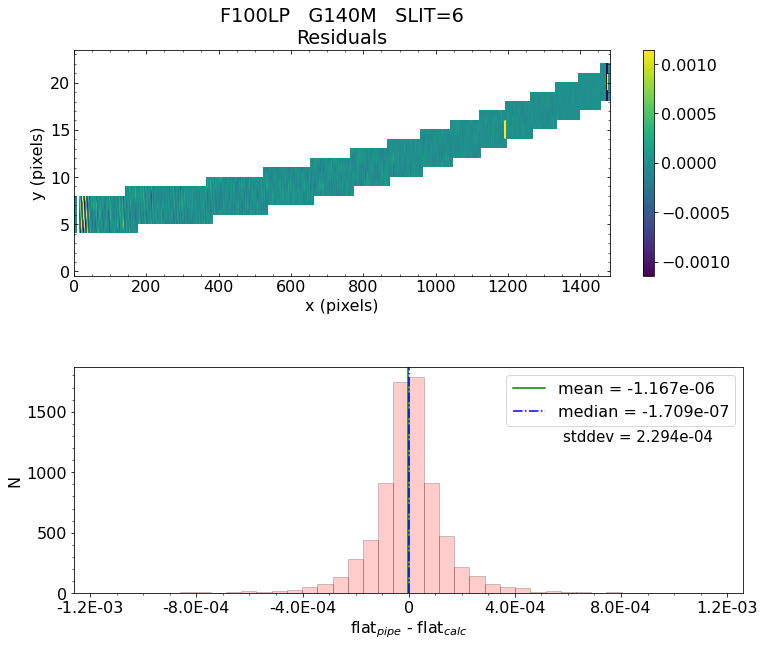

 *** Result of the test: PASSED


Working with slit: 7
 Subwindow origin:   px0=139   py0=1757
silt_id='7'   quad=1   row=33   col=55   slitlet_id='33_55'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -3.743e-08    median = -9.123e-08    stdev = 2.303e-04
    Maximum   AbsoluteFlat Difference = 3.098e-03
    Minimum   AbsoluteFlat Difference = -3.014e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


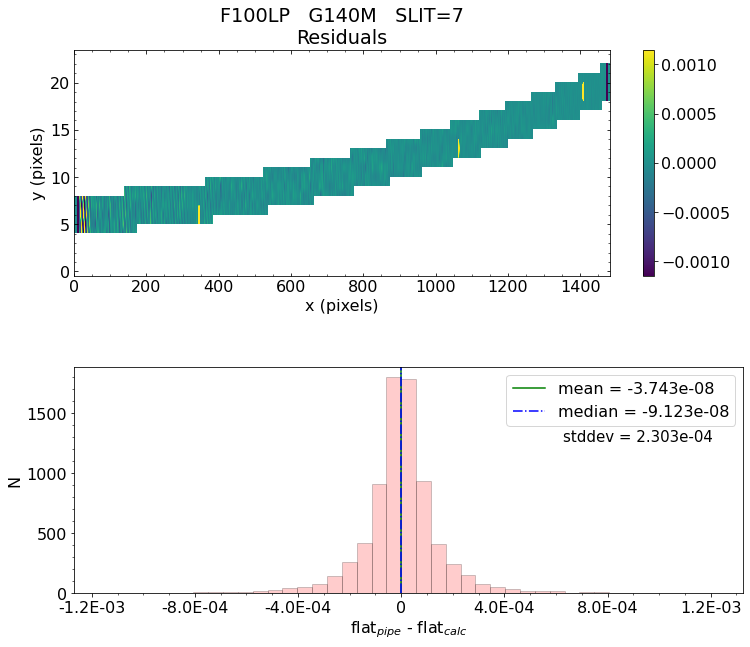

 *** Result of the test: PASSED


Working with slit: 8
 Subwindow origin:   px0=138   py0=1807
silt_id='8'   quad=1   row=34   col=45   slitlet_id='34_45'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.338e-06    median = 3.717e-07    stdev = 2.276e-04
    Maximum   AbsoluteFlat Difference = 2.700e-03
    Minimum   AbsoluteFlat Difference = -3.050e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


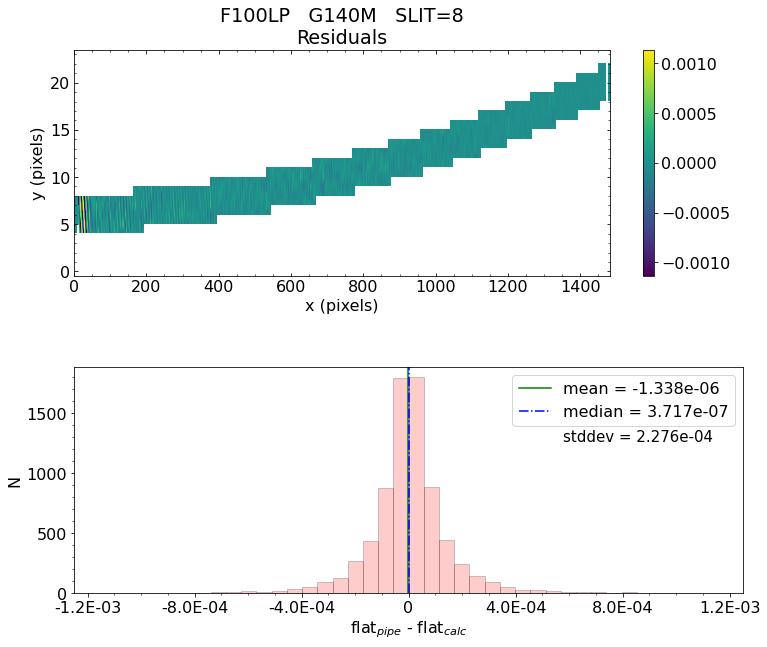

 *** Result of the test: PASSED


Working with slit: 9
 Subwindow origin:   px0=138   py0=1802
silt_id='9'   quad=1   row=34   col=46   slitlet_id='34_46'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -3.124e-07    median = 4.085e-07    stdev = 2.297e-04
    Maximum   AbsoluteFlat Difference = 3.185e-03
    Minimum   AbsoluteFlat Difference = -3.028e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


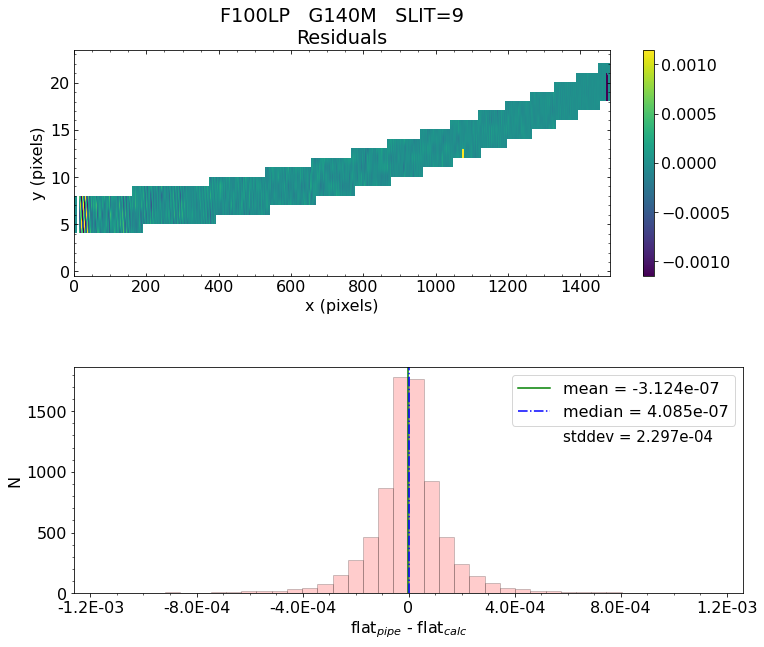

 *** Result of the test: PASSED


Working with slit: 10
 Subwindow origin:   px0=138   py0=1797
silt_id='10'   quad=1   row=34   col=47   slitlet_id='34_47'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -9.601e-07    median = -4.138e-07    stdev = 2.273e-04
    Maximum   AbsoluteFlat Difference = 3.207e-03
    Minimum   AbsoluteFlat Difference = -2.875e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


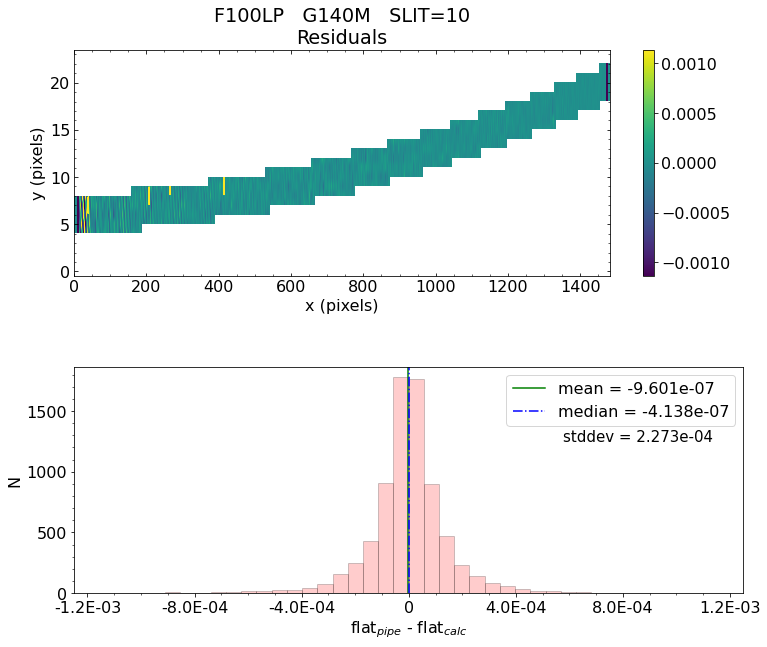

 *** Result of the test: PASSED


Working with slit: 11
 Subwindow origin:   px0=137   py0=1837
silt_id='11'   quad=1   row=35   col=39   slitlet_id='35_39'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -2.213e-06    median = -4.741e-07    stdev = 2.311e-04
    Maximum   AbsoluteFlat Difference = 2.901e-03
    Minimum   AbsoluteFlat Difference = -3.010e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


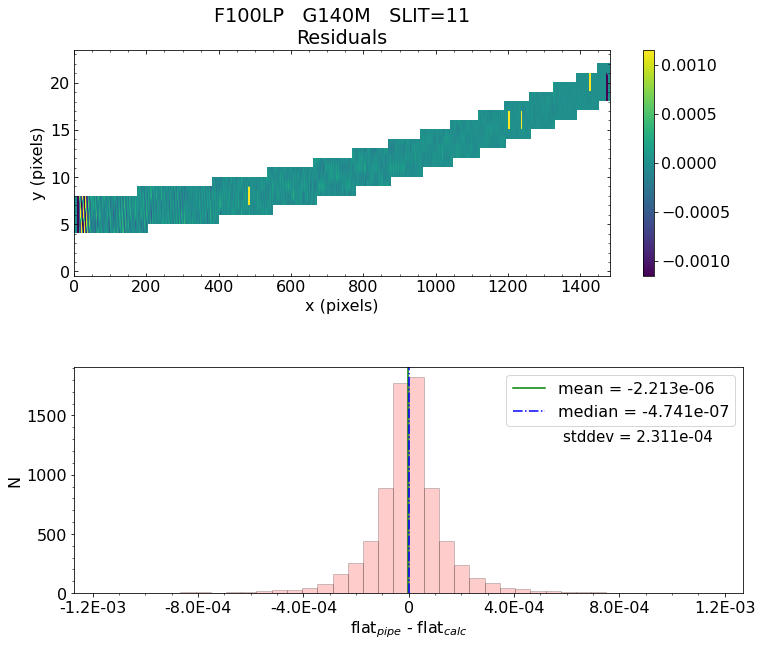

 *** Result of the test: PASSED


Working with slit: 14
 Subwindow origin:   px0=105   py0=1222
silt_id='14'   quad=1   row=38   col=162   slitlet_id='38_162'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.446e-06    median = -8.468e-08    stdev = 2.325e-04
    Maximum   AbsoluteFlat Difference = 2.871e-03
    Minimum   AbsoluteFlat Difference = -3.460e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 35%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


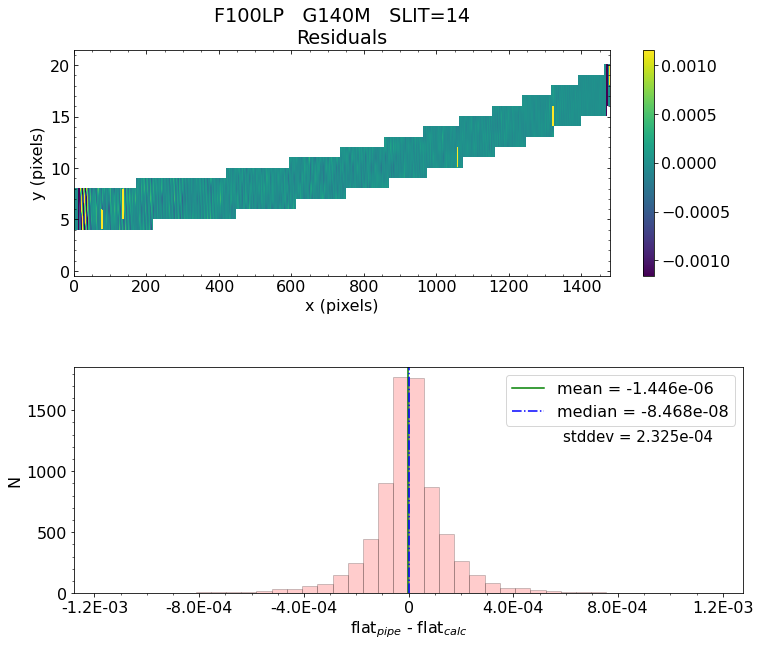

 *** Result of the test: PASSED


Working with slit: 15
 Subwindow origin:   px0=123   py0=1887
silt_id='15'   quad=1   row=41   col=29   slitlet_id='41_29'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.315e-06    median = -7.164e-07    stdev = 2.289e-04
    Maximum   AbsoluteFlat Difference = 2.885e-03
    Minimum   AbsoluteFlat Difference = -2.702e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


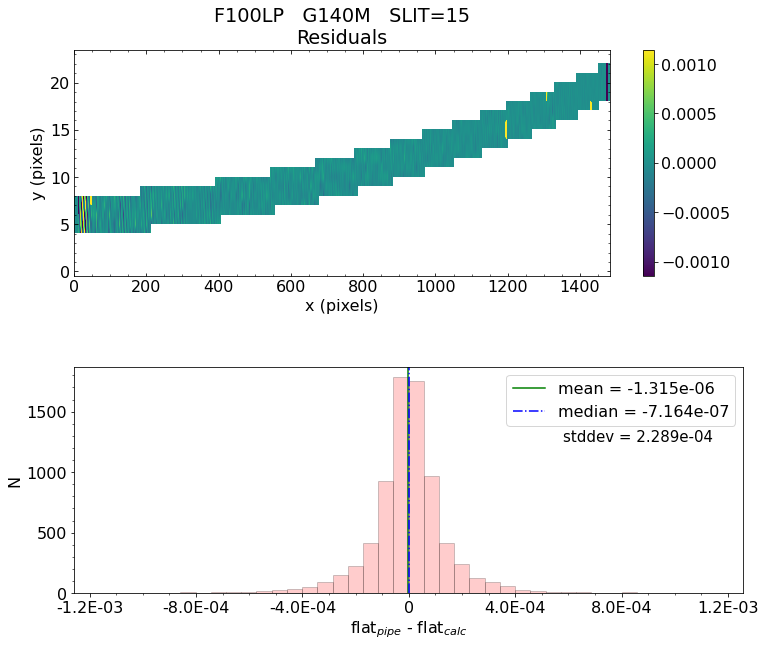

 *** Result of the test: PASSED


Working with slit: 16
 Subwindow origin:   px0=118   py0=1822
silt_id='16'   quad=1   row=42   col=42   slitlet_id='42_42'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 9.928e-07    median = -1.701e-07    stdev = 2.328e-04
    Maximum   AbsoluteFlat Difference = 3.084e-03
    Minimum   AbsoluteFlat Difference = -2.990e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


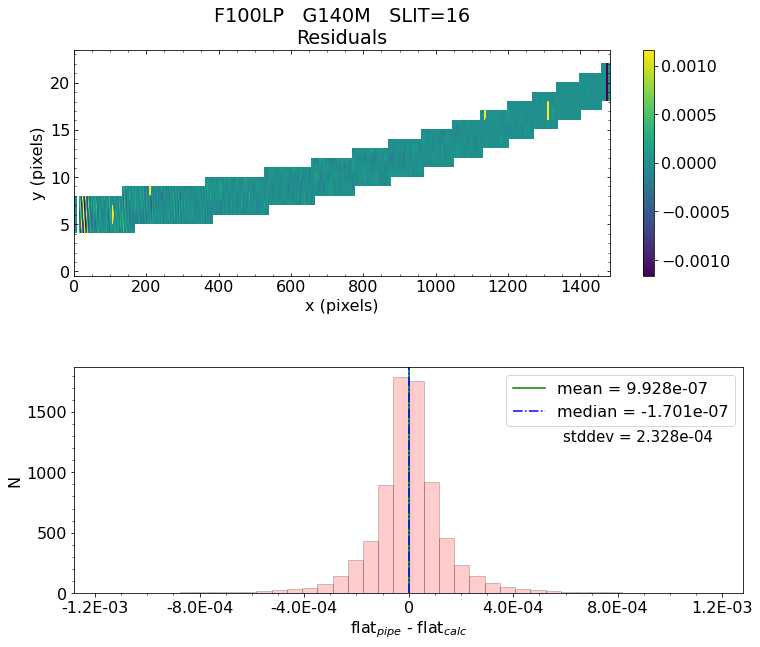

 *** Result of the test: PASSED


Working with slit: 17
 Subwindow origin:   px0=116   py0=1852
silt_id='17'   quad=1   row=43   col=36   slitlet_id='43_36'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 7.200e-07    median = 1.147e-07    stdev = 2.303e-04
    Maximum   AbsoluteFlat Difference = 3.146e-03
    Minimum   AbsoluteFlat Difference = -3.234e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


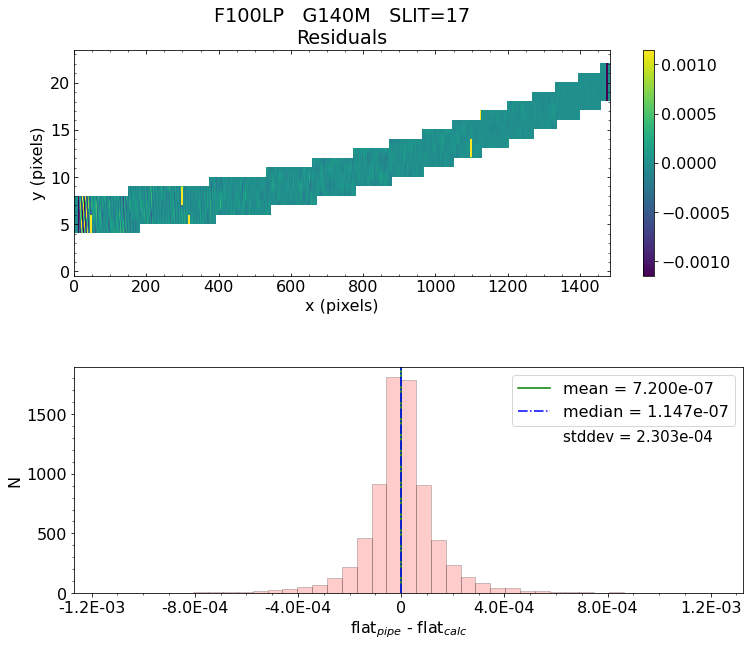

 *** Result of the test: PASSED


Working with slit: 18
 Subwindow origin:   px0=116   py0=1847
silt_id='18'   quad=1   row=43   col=37   slitlet_id='43_37'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 1.306e-06    median = 1.028e-07    stdev = 2.315e-04
    Maximum   AbsoluteFlat Difference = 3.241e-03
    Minimum   AbsoluteFlat Difference = -3.340e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


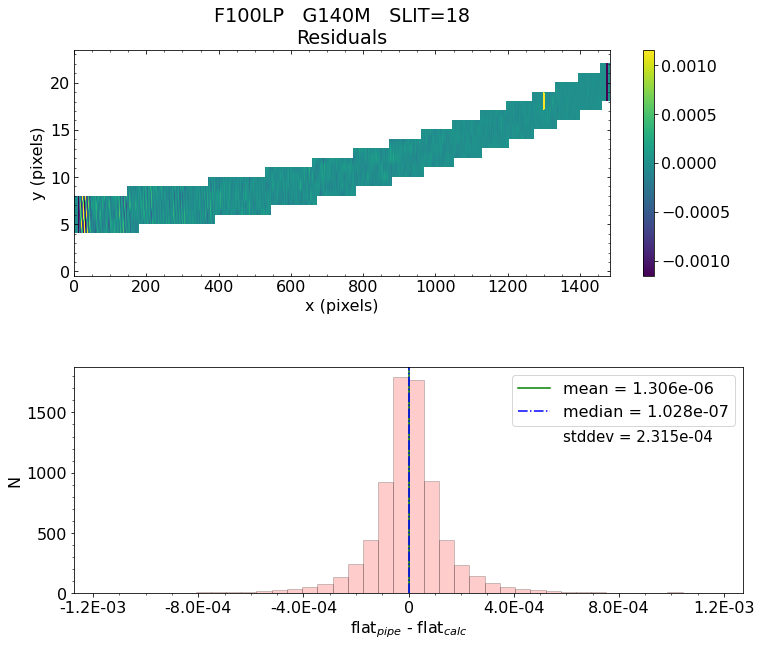

 *** Result of the test: PASSED


Working with slit: 19
 Subwindow origin:   px0=94   py0=1337
silt_id='19'   quad=1   row=44   col=139   slitlet_id='44_139'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 6.611e-07    median = -1.314e-06    stdev = 2.356e-04
    Maximum   AbsoluteFlat Difference = 3.085e-03
    Minimum   AbsoluteFlat Difference = -3.124e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 35%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


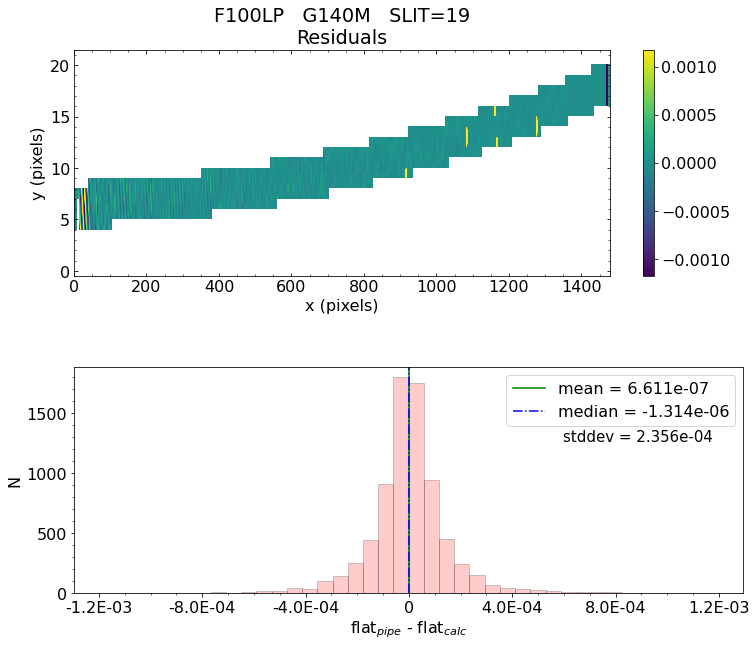

 *** Result of the test: PASSED


Working with slit: 21
 Subwindow origin:   px0=90   py0=1382
silt_id='21'   quad=1   row=46   col=130   slitlet_id='46_130'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 2.481e-07    median = -1.187e-08    stdev = 2.432e-04
    Maximum   AbsoluteFlat Difference = 2.855e-03
    Minimum   AbsoluteFlat Difference = -3.016e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 35%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


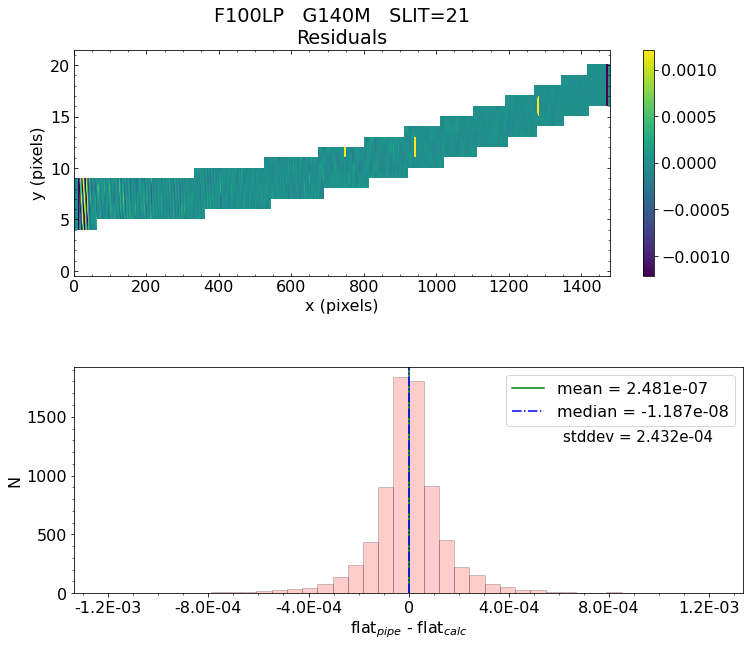

 *** Result of the test: PASSED


Working with slit: 25
 Subwindow origin:   px0=71   py0=1277
silt_id='25'   quad=1   row=52   col=151   slitlet_id='52_151'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -6.818e-07    median = -3.924e-07    stdev = 2.463e-04
    Maximum   AbsoluteFlat Difference = 3.495e-03
    Minimum   AbsoluteFlat Difference = -2.885e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 35%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


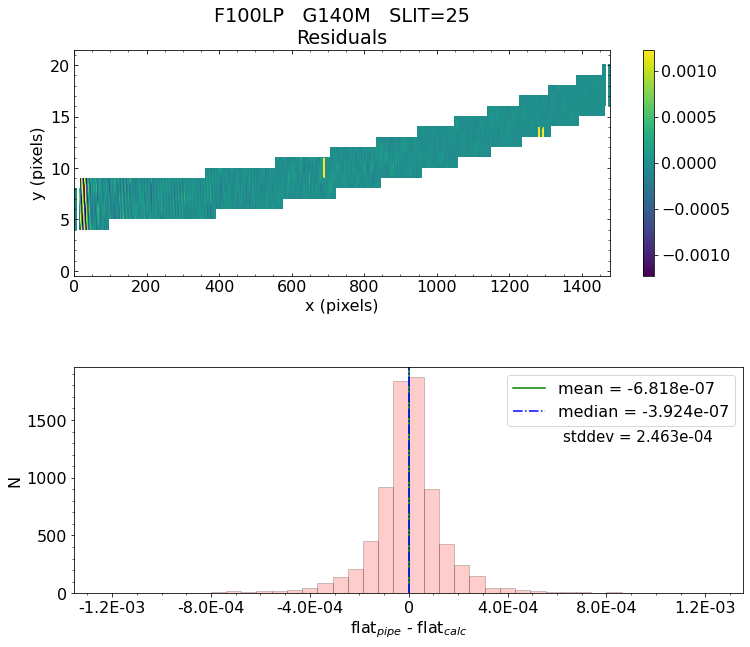

 *** Result of the test: PASSED


Working with slit: 26
 Subwindow origin:   px0=66   py0=1563
silt_id='26'   quad=1   row=58   col=94   slitlet_id='58_94'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -5.225e-07    median = -3.652e-07    stdev = 2.295e-04
    Maximum   AbsoluteFlat Difference = 3.283e-03
    Minimum   AbsoluteFlat Difference = -3.066e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


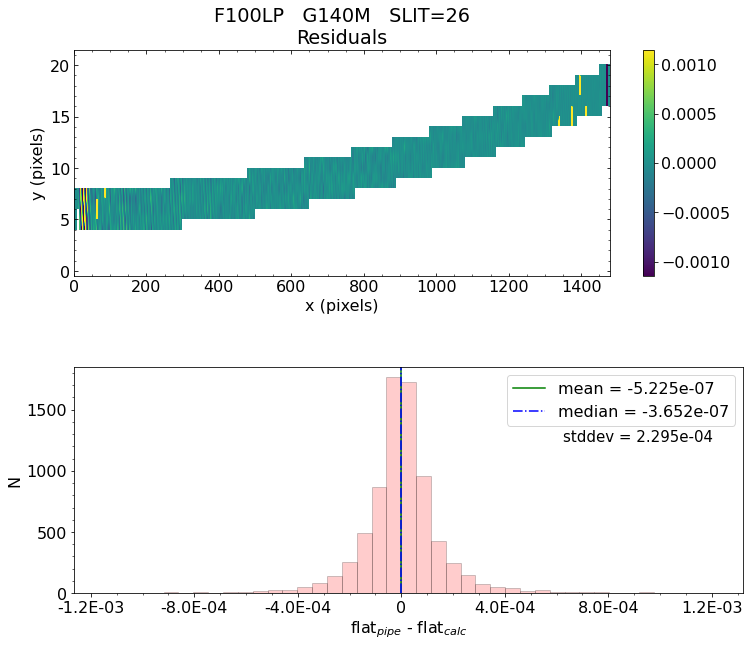

 *** Result of the test: PASSED


Working with slit: 27
 Subwindow origin:   px0=32   py0=1202
silt_id='27'   quad=1   row=66   col=166   slitlet_id='66_166'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -8.344e-08    median = 1.772e-07    stdev = 2.459e-04
    Maximum   AbsoluteFlat Difference = 2.915e-03
    Minimum   AbsoluteFlat Difference = -3.321e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


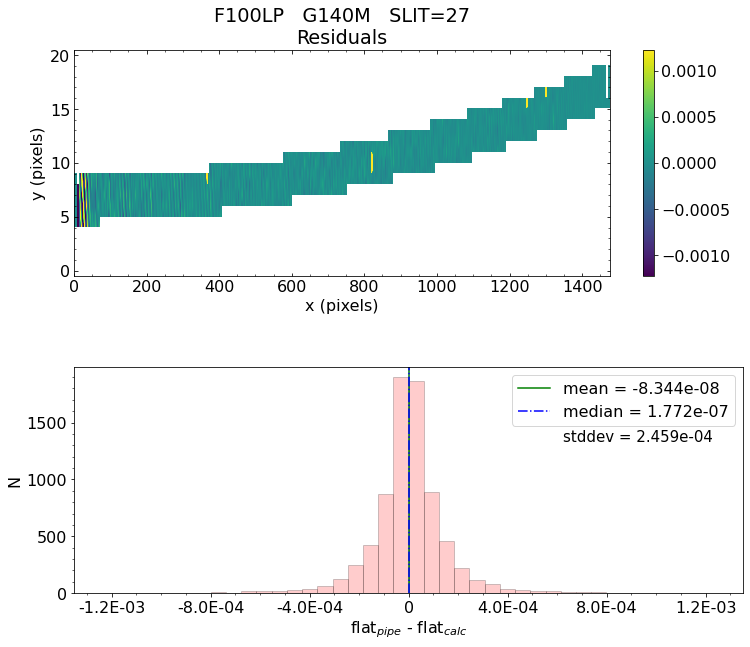

 *** Result of the test: PASSED


Working with slit: 29
 Subwindow origin:   px0=23   py0=1868
silt_id='29'   quad=1   row=79   col=33   slitlet_id='79_33'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 2.951e-08    median = -1.362e-07    stdev = 2.354e-04
    Maximum   AbsoluteFlat Difference = 3.288e-03
    Minimum   AbsoluteFlat Difference = -2.885e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


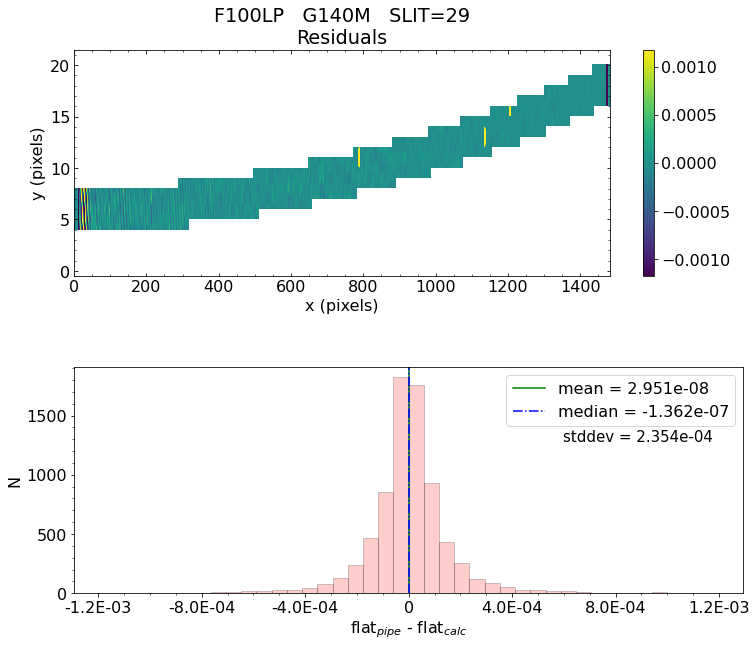

 *** Result of the test: PASSED


Working with slit: 31
 Subwindow origin:   px0=1   py0=1368
silt_id='31'   quad=1   row=85   col=133   slitlet_id='85_133'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -2.496e-06    median = -6.532e-07    stdev = 2.336e-04
    Maximum   AbsoluteFlat Difference = 3.134e-03
    Minimum   AbsoluteFlat Difference = -3.286e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


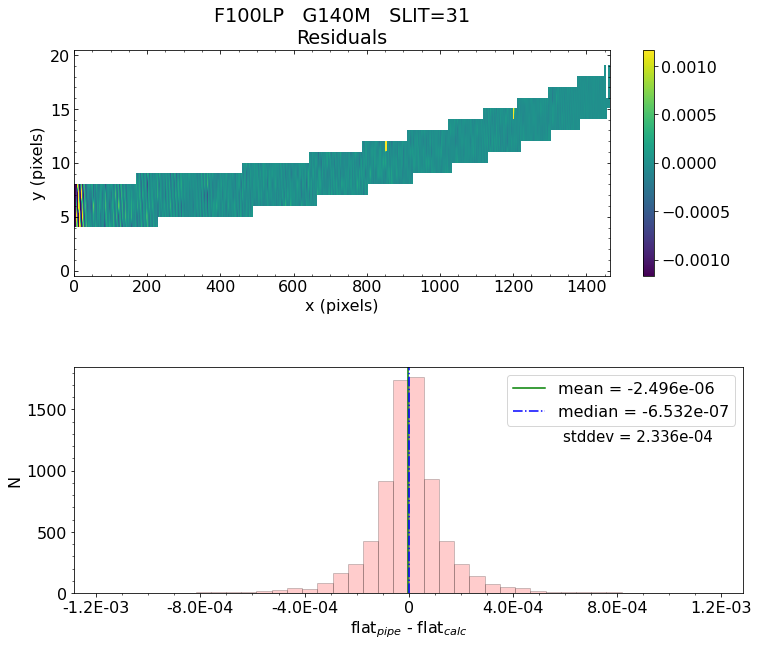

 *** Result of the test: PASSED


Working with slit: 32
 Subwindow origin:   px0=1   py0=1353
silt_id='32'   quad=1   row=97   col=136   slitlet_id='97_136'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.366e-06    median = -1.967e-07    stdev = 1.540e-04
    Maximum   AbsoluteFlat Difference = 1.041e-03
    Minimum   AbsoluteFlat Difference = -1.045e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 6%
                            ->  5xtheshold = 2%
Making histogram plot for this slitlet...


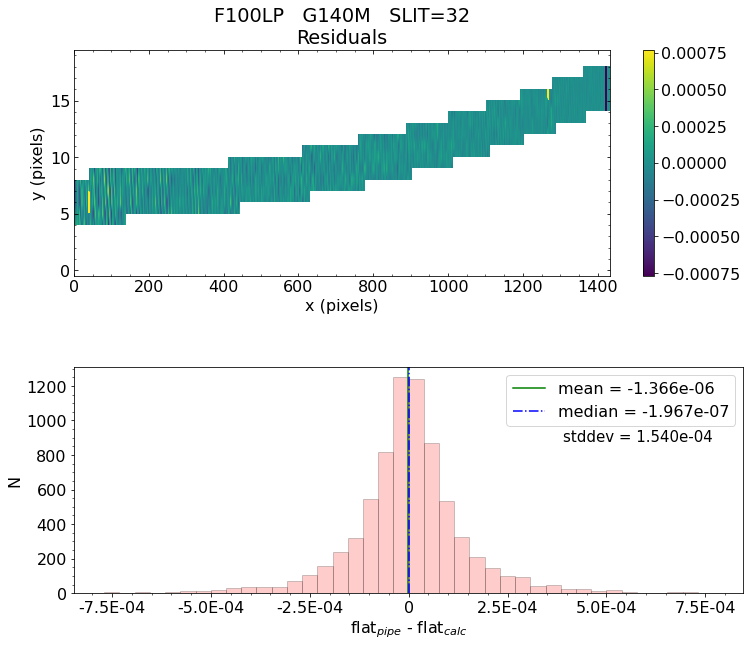

 *** Result of the test: PASSED


Working with slit: 33
 Subwindow origin:   px0=1   py0=1273
silt_id='33'   quad=1   row=101   col=152   slitlet_id='101_152'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 8.870e-07    median = -4.690e-07    stdev = 1.473e-04
    Maximum   AbsoluteFlat Difference = 1.200e-03
    Minimum   AbsoluteFlat Difference = -9.525e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 5%
                            ->  5xtheshold = 1%
Making histogram plot for this slitlet...


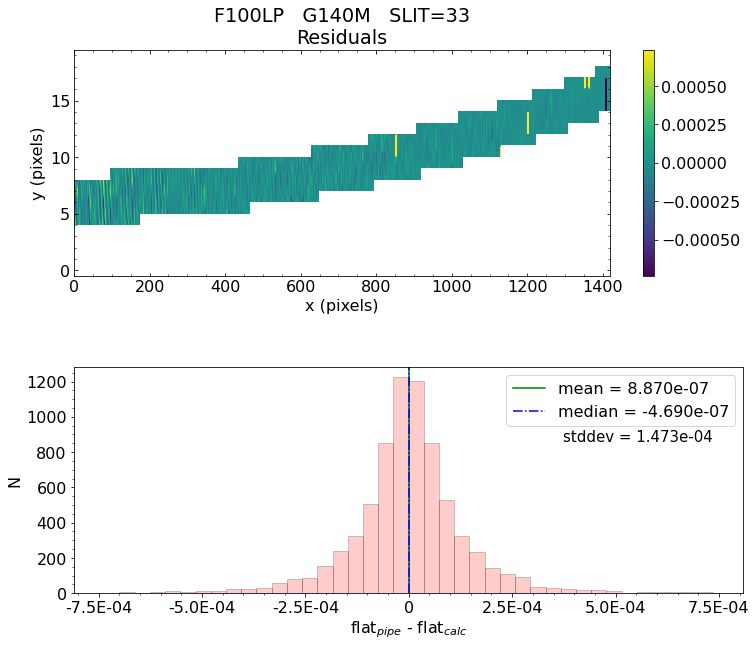

 *** Result of the test: PASSED


Working with slit: 35
 Subwindow origin:   px0=1   py0=1723
silt_id='35'   quad=1   row=105   col=62   slitlet_id='105_62'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 7.044e-07    median = 8.524e-07    stdev = 1.477e-04
    Maximum   AbsoluteFlat Difference = 9.801e-04
    Minimum   AbsoluteFlat Difference = -1.112e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 6%
                            ->  5xtheshold = 1%
Making histogram plot for this slitlet...


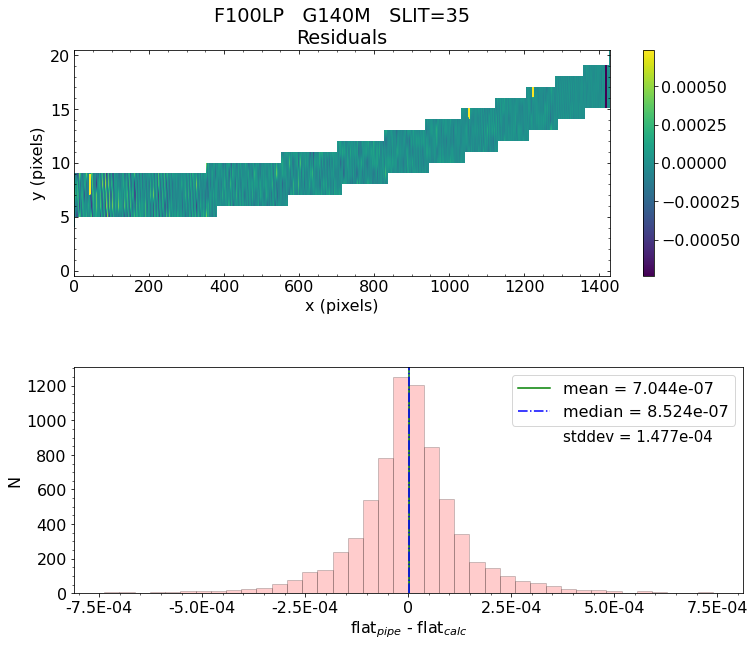

 *** Result of the test: PASSED


Working with slit: 37
 Subwindow origin:   px0=1   py0=1664
silt_id='37'   quad=1   row=110   col=74   slitlet_id='110_74'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.034e-06    median = -1.265e-06    stdev = 1.443e-04
    Maximum   AbsoluteFlat Difference = 1.144e-03
    Minimum   AbsoluteFlat Difference = -1.080e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 5%
                            ->  5xtheshold = 1%
Making histogram plot for this slitlet...


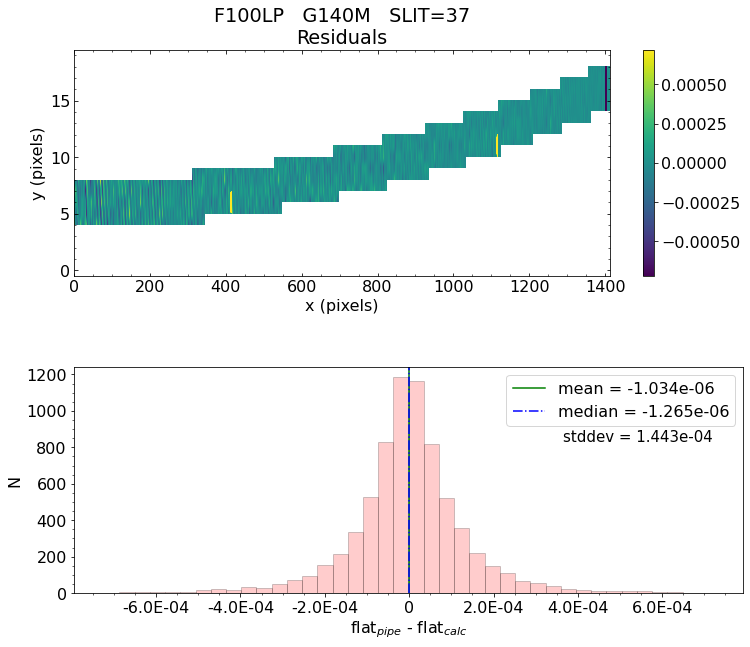

 *** Result of the test: PASSED


Working with slit: 38
 Subwindow origin:   px0=1   py0=1604
silt_id='38'   quad=1   row=112   col=86   slitlet_id='112_86'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 2.665e-09    median = 9.843e-09    stdev = 1.450e-04
    Maximum   AbsoluteFlat Difference = 1.370e-03
    Minimum   AbsoluteFlat Difference = -1.258e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 5%
                            ->  5xtheshold = 1%
Making histogram plot for this slitlet...


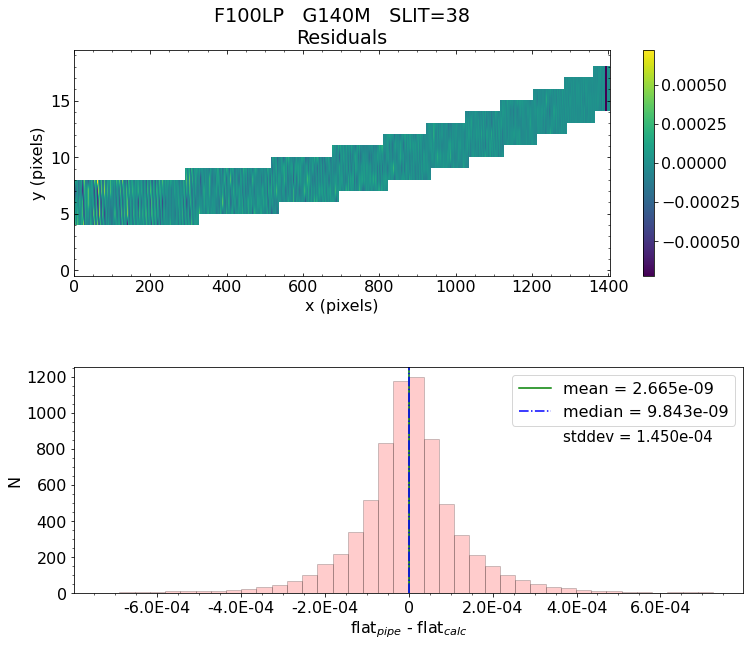

 *** Result of the test: PASSED


Working with slit: 39
 Subwindow origin:   px0=1   py0=1243
silt_id='39'   quad=1   row=113   col=158   slitlet_id='113_158'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 9.458e-07    median = 3.551e-07    stdev = 1.468e-04
    Maximum   AbsoluteFlat Difference = 1.172e-03
    Minimum   AbsoluteFlat Difference = -1.266e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 5%
                            ->  5xtheshold = 1%
Making histogram plot for this slitlet...


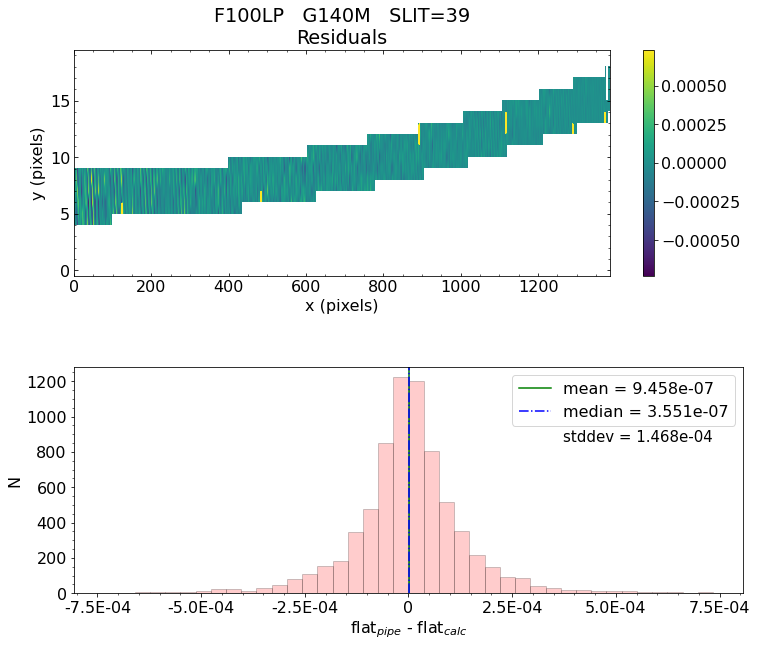

 *** Result of the test: PASSED


Working with slit: 41
 Subwindow origin:   px0=1   py0=1769
silt_id='41'   quad=1   row=119   col=53   slitlet_id='119_53'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 7.015e-07    median = 3.791e-08    stdev = 1.407e-04
    Maximum   AbsoluteFlat Difference = 1.066e-03
    Minimum   AbsoluteFlat Difference = -1.040e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 32%
                            ->  3xtheshold = 5%
                            ->  5xtheshold = 1%
Making histogram plot for this slitlet...


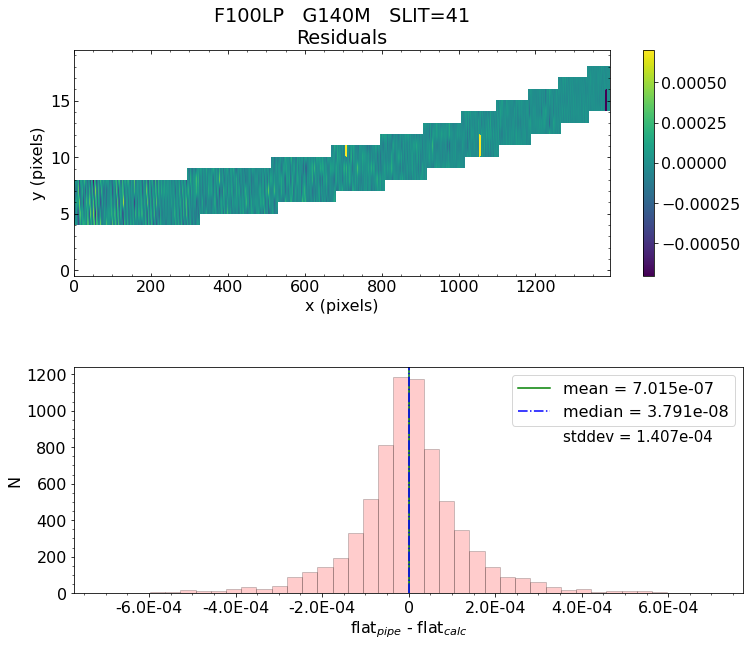

 *** Result of the test: PASSED


Working with slit: 53


 Subwindow origin:   px0=1   py0=1316
silt_id='53'   quad=1   row=330   col=144   slitlet_id='330_144'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 1.052e-06    median = 6.678e-07    stdev = 9.442e-05
    Maximum   AbsoluteFlat Difference = 4.570e-04
    Minimum   AbsoluteFlat Difference = -4.506e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 22%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


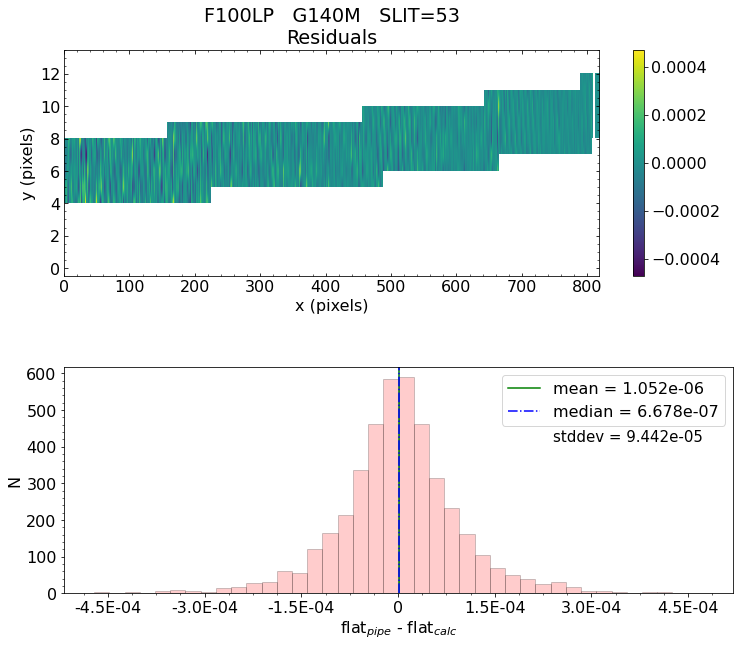

 *** Result of the test: PASSED


Working with slit: 54
 Subwindow origin:   px0=1   py0=1306
silt_id='54'   quad=1   row=330   col=146   slitlet_id='330_146'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 2.538e-07    median = -9.270e-08    stdev = 9.233e-05
    Maximum   AbsoluteFlat Difference = 5.143e-04
    Minimum   AbsoluteFlat Difference = -4.542e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 21%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


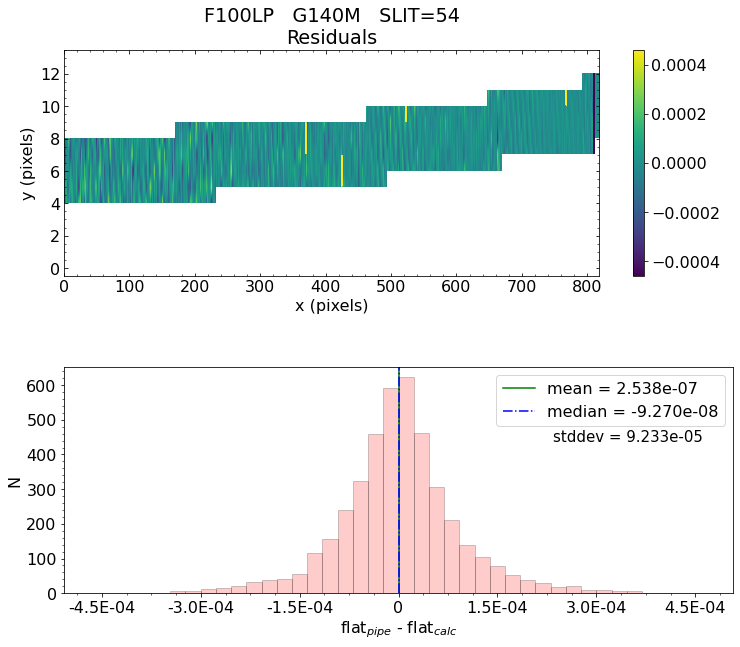

 *** Result of the test: PASSED


Working with slit: 1
 Subwindow origin:   px0=119   py0=34
silt_id='1'   quad=2   row=20   col=157   slitlet_id='20_157'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.460e-06    median = -4.517e-07    stdev = 2.291e-04
    Maximum   AbsoluteFlat Difference = 2.774e-03
    Minimum   AbsoluteFlat Difference = -3.272e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 6%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


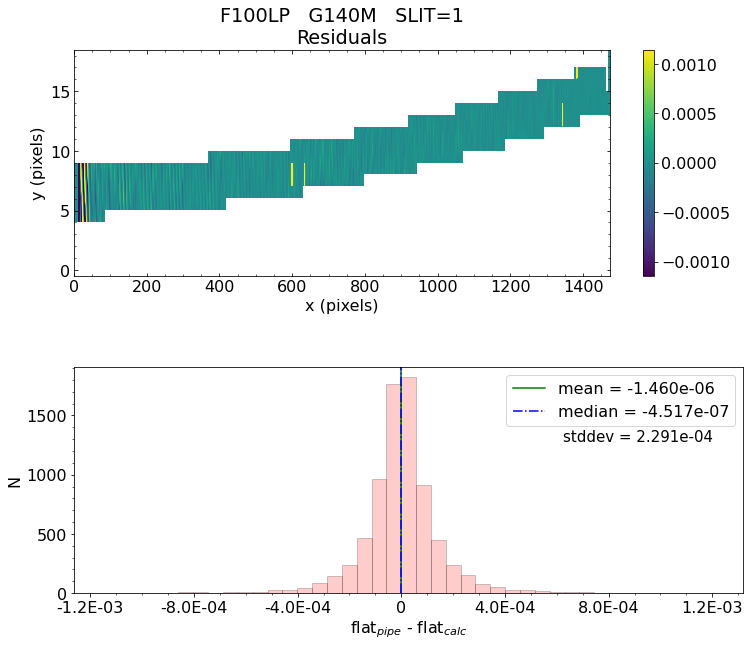

 *** Result of the test: PASSED


Working with slit: 2
 Subwindow origin:   px0=125   py0=332
silt_id='2'   quad=2   row=21   col=98   slitlet_id='21_98'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 1.653e-06    median = 3.920e-07    stdev = 2.247e-04
    Maximum   AbsoluteFlat Difference = 2.564e-03
    Minimum   AbsoluteFlat Difference = -2.500e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


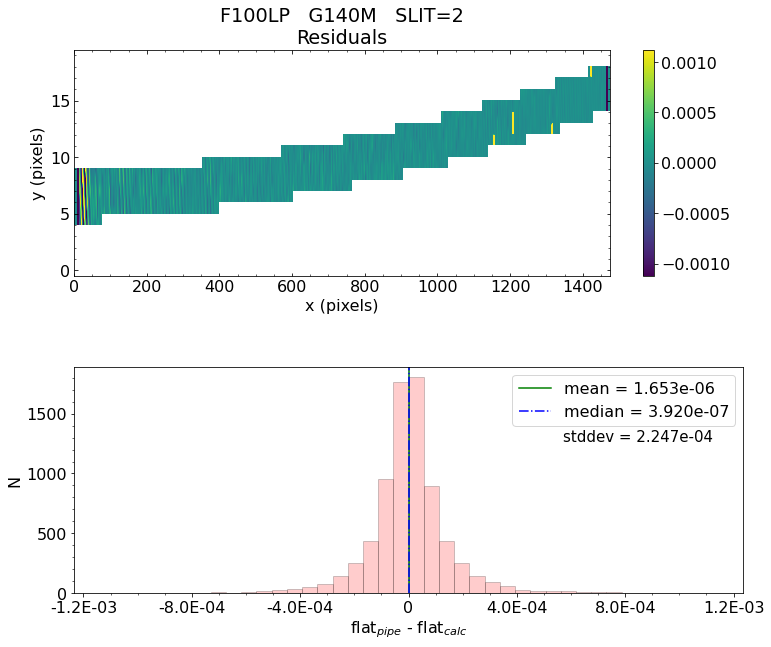

 *** Result of the test: PASSED


Working with slit: 3
 Subwindow origin:   px0=117   py0=55
silt_id='3'   quad=2   row=21   col=153   slitlet_id='21_153'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.952e-06    median = -7.805e-07    stdev = 2.169e-04
    Maximum   AbsoluteFlat Difference = 3.148e-03
    Minimum   AbsoluteFlat Difference = -3.153e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 6%
                            ->  5xtheshold = 2%
Making histogram plot for this slitlet...


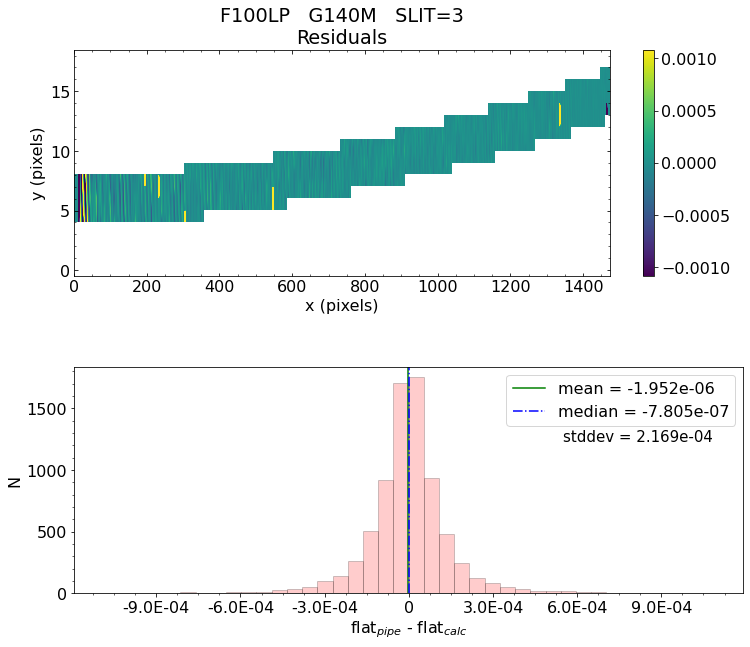

 *** Result of the test: PASSED


Working with slit: 4
 Subwindow origin:   px0=112   py0=161
silt_id='4'   quad=2   row=24   col=132   slitlet_id='24_132'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.874e-06    median = -2.281e-07    stdev = 2.161e-04
    Maximum   AbsoluteFlat Difference = 3.042e-03
    Minimum   AbsoluteFlat Difference = -3.084e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 6%
                            ->  5xtheshold = 2%
Making histogram plot for this slitlet...


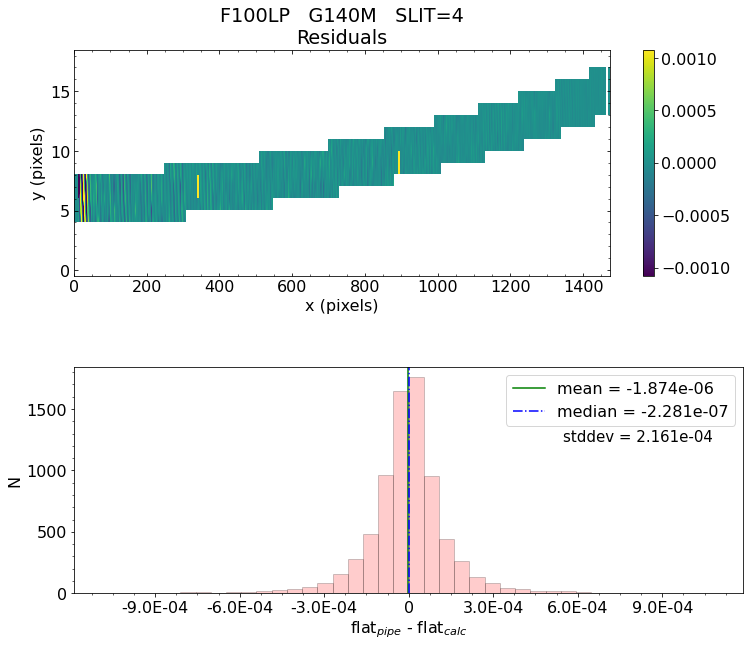

 *** Result of the test: PASSED


Working with slit: 5
 Subwindow origin:   px0=100   py0=307
silt_id='5'   quad=2   row=30   col=103   slitlet_id='30_103'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 9.283e-07    median = 6.648e-07    stdev = 2.249e-04
    Maximum   AbsoluteFlat Difference = 2.944e-03
    Minimum   AbsoluteFlat Difference = -2.999e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 6%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


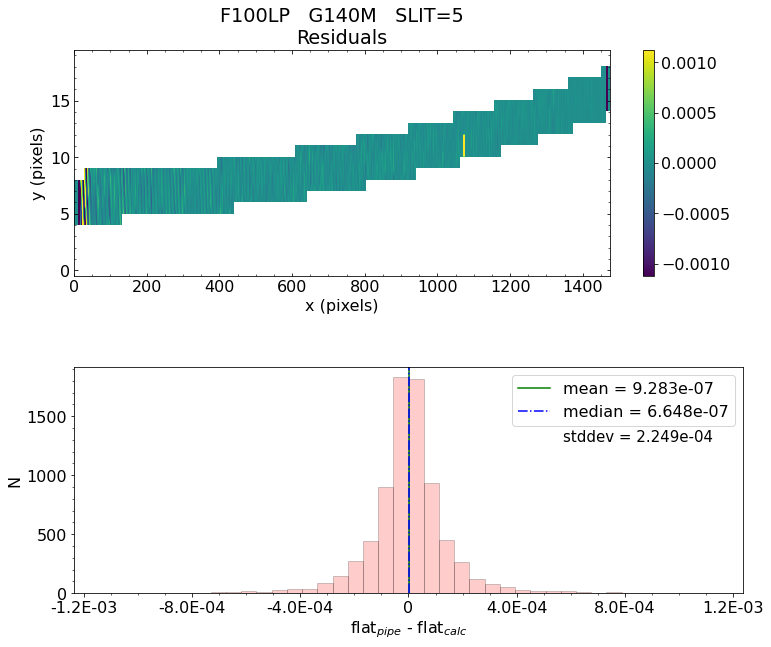

 *** Result of the test: PASSED


Working with slit: 12
 Subwindow origin:   px0=92   py0=484
silt_id='12'   quad=2   row=35   col=68   slitlet_id='35_68'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.230e-06    median = -4.578e-07    stdev = 2.164e-04
    Maximum   AbsoluteFlat Difference = 2.994e-03
    Minimum   AbsoluteFlat Difference = -2.829e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 6%
                            ->  5xtheshold = 2%
Making histogram plot for this slitlet...


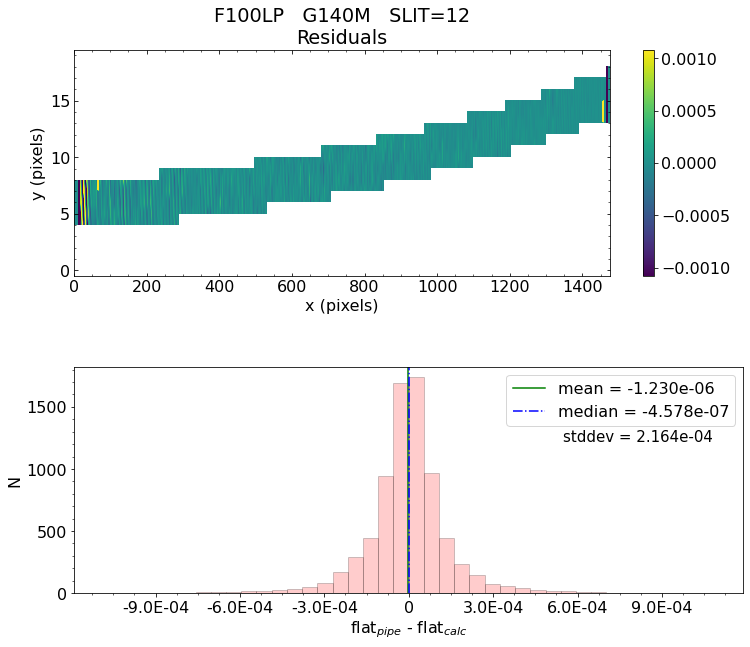

 *** Result of the test: PASSED


Working with slit: 13
 Subwindow origin:   px0=81   py0=95
silt_id='13'   quad=2   row=35   col=145   slitlet_id='35_145'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 6.295e-07    median = 3.614e-07    stdev = 2.217e-04
    Maximum   AbsoluteFlat Difference = 3.348e-03
    Minimum   AbsoluteFlat Difference = -3.281e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


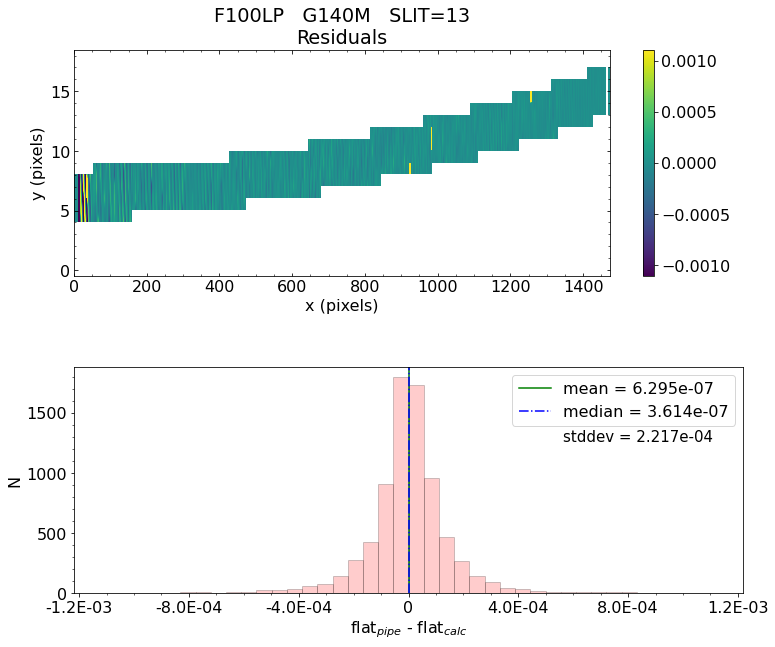

 *** Result of the test: PASSED


Working with slit: 20
 Subwindow origin:   px0=77   py0=751
silt_id='20'   quad=2   row=44   col=15   slitlet_id='44_15'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 3.679e-07    median = 1.707e-07    stdev = 2.210e-04
    Maximum   AbsoluteFlat Difference = 2.920e-03
    Minimum   AbsoluteFlat Difference = -2.975e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 3%
Making histogram plot for this slitlet...


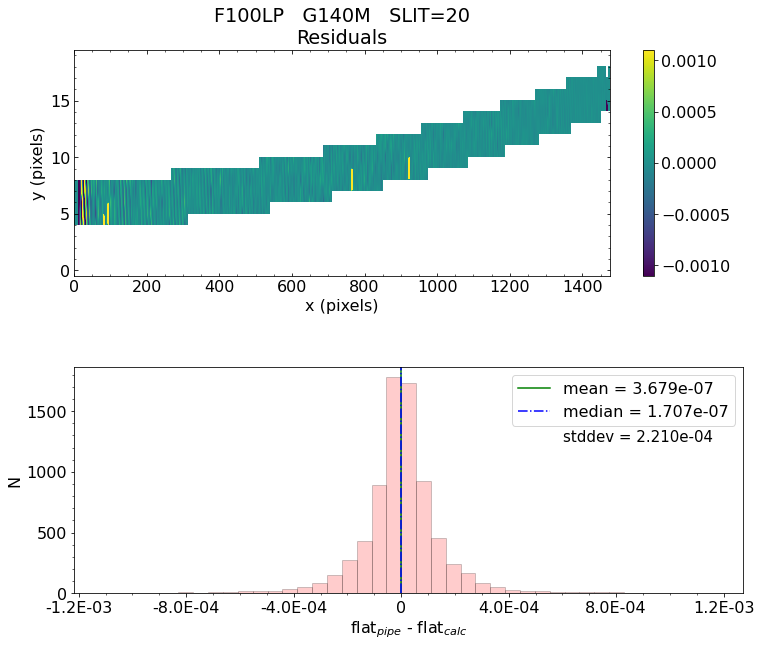

 *** Result of the test: PASSED


Working with slit: 22
 Subwindow origin:   px0=69   py0=645
silt_id='22'   quad=2   row=46   col=36   slitlet_id='46_36'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 6.708e-08    median = 1.166e-07    stdev = 2.220e-04
    Maximum   AbsoluteFlat Difference = 3.033e-03
    Minimum   AbsoluteFlat Difference = -3.126e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 2%
Making histogram plot for this slitlet...


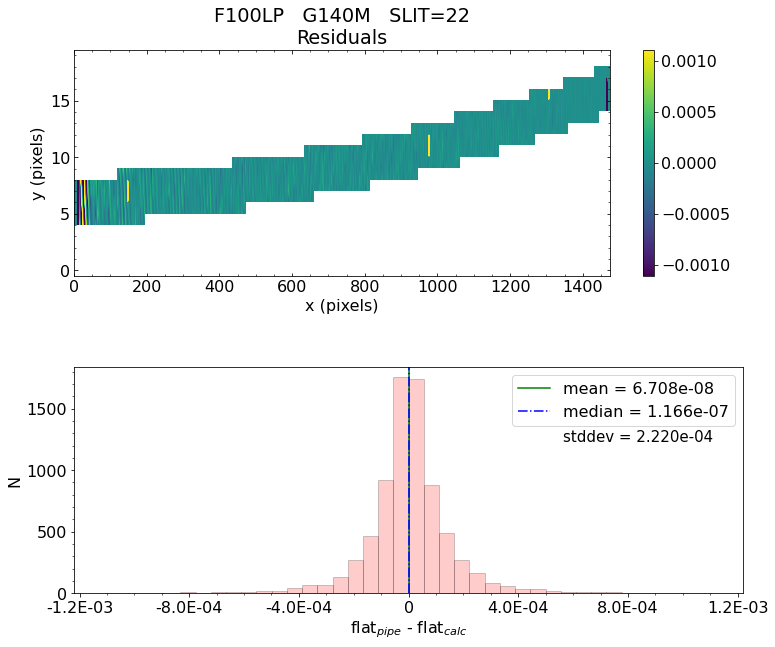

 *** Result of the test: PASSED


Working with slit: 23
 Subwindow origin:   px0=53   py0=116
silt_id='23'   quad=2   row=46   col=141   slitlet_id='46_141'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -3.925e-08    median = 2.818e-07    stdev = 2.170e-04
    Maximum   AbsoluteFlat Difference = 3.060e-03
    Minimum   AbsoluteFlat Difference = -2.956e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 6%
                            ->  5xtheshold = 2%
Making histogram plot for this slitlet...


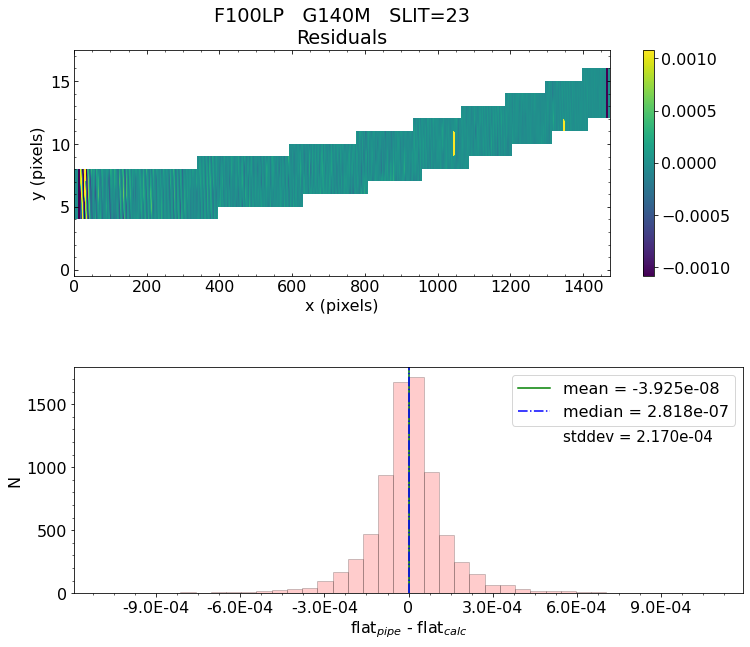

 *** Result of the test: PASSED


Working with slit: 24
 Subwindow origin:   px0=70   py0=786
silt_id='24'   quad=2   row=47   col=8   slitlet_id='47_8'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -4.871e-07    median = -4.722e-07    stdev = 2.219e-04
    Maximum   AbsoluteFlat Difference = 3.614e-03
    Minimum   AbsoluteFlat Difference = -3.106e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 33%
                            ->  3xtheshold = 6%
                            ->  5xtheshold = 2%
Making histogram plot for this slitlet...


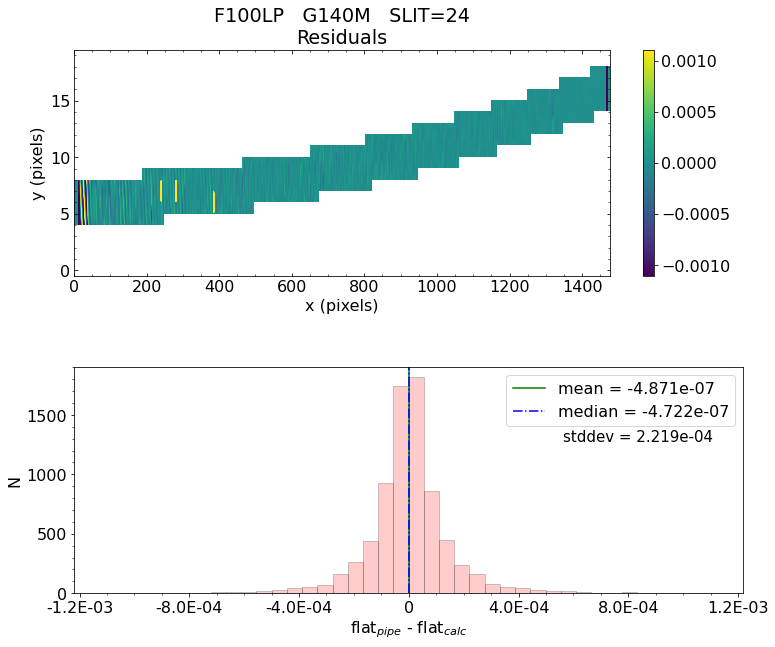

 *** Result of the test: PASSED


Working with slit: 28
 Subwindow origin:   px0=12   py0=661
silt_id='28'   quad=2   row=68   col=33   slitlet_id='68_33'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 4.190e-07    median = 1.081e-06    stdev = 2.242e-04
    Maximum   AbsoluteFlat Difference = 3.226e-03
    Minimum   AbsoluteFlat Difference = -3.083e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 2%
Making histogram plot for this slitlet...


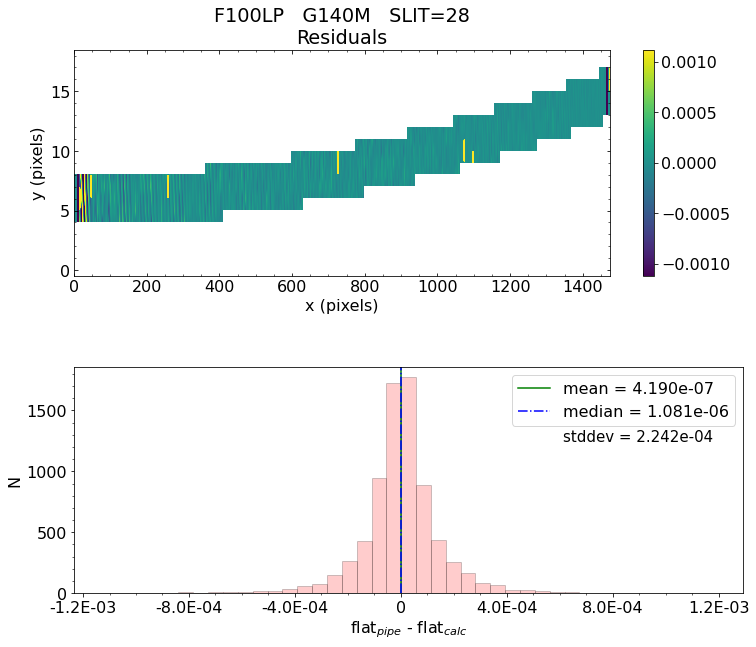

 *** Result of the test: PASSED


Working with slit: 30
 Subwindow origin:   px0=1   py0=701
silt_id='30'   quad=2   row=79   col=25   slitlet_id='79_25'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -9.394e-07    median = 7.435e-08    stdev = 2.173e-04
    Maximum   AbsoluteFlat Difference = 3.161e-03
    Minimum   AbsoluteFlat Difference = -3.211e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 34%
                            ->  3xtheshold = 6%
                            ->  5xtheshold = 2%
Making histogram plot for this slitlet...


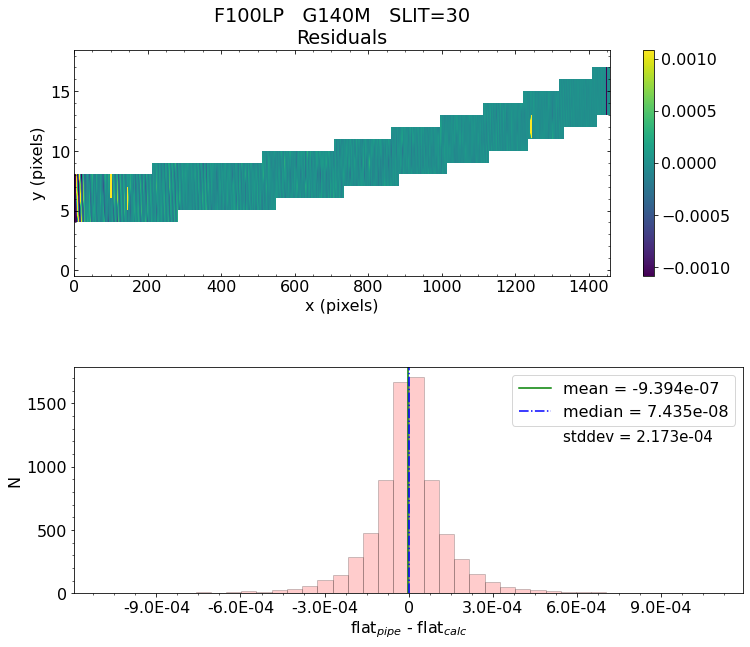

 *** Result of the test: PASSED


Working with slit: 34
 Subwindow origin:   px0=1   py0=716
silt_id='34'   quad=2   row=103   col=22   slitlet_id='103_22'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.708e-06    median = -6.923e-07    stdev = 1.403e-04
    Maximum   AbsoluteFlat Difference = 1.127e-03
    Minimum   AbsoluteFlat Difference = -1.185e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 32%
                            ->  3xtheshold = 5%
                            ->  5xtheshold = 1%
Making histogram plot for this slitlet...


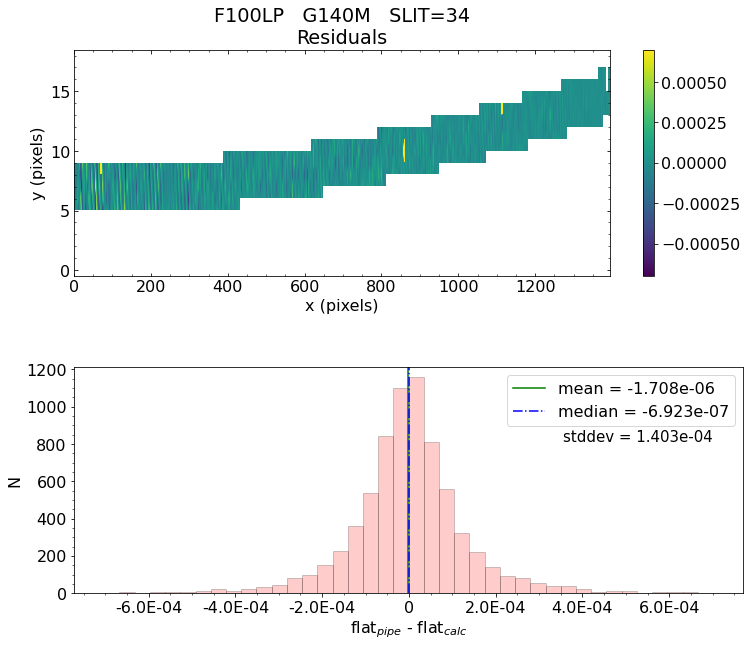

 *** Result of the test: PASSED


Working with slit: 36
 Subwindow origin:   px0=1   py0=450
silt_id='36'   quad=2   row=106   col=75   slitlet_id='106_75'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -2.510e-07    median = -5.203e-07    stdev = 1.326e-04
    Maximum   AbsoluteFlat Difference = 7.893e-04
    Minimum   AbsoluteFlat Difference = -9.772e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 31%
                            ->  3xtheshold = 4%
                            ->  5xtheshold = 1%
Making histogram plot for this slitlet...


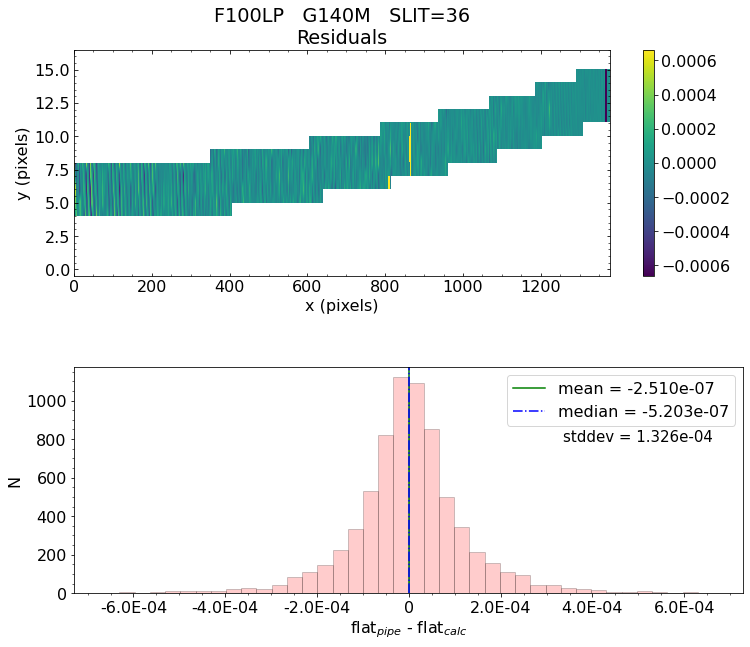

 *** Result of the test: PASSED


Working with slit: 40
 Subwindow origin:   px0=1   py0=218
silt_id='40'   quad=2   row=116   col=121   slitlet_id='116_121'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -5.100e-07    median = -1.208e-06    stdev = 1.308e-04
    Maximum   AbsoluteFlat Difference = 9.625e-04
    Minimum   AbsoluteFlat Difference = -7.700e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 30%
                            ->  3xtheshold = 4%
                            ->  5xtheshold = 1%
Making histogram plot for this slitlet...


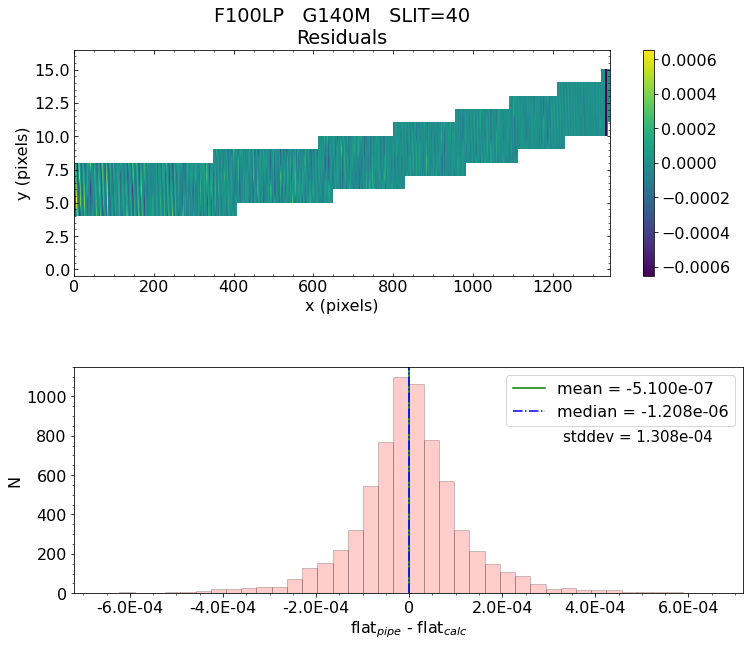

 *** Result of the test: PASSED


Working with slit: 42
 Subwindow origin:   px0=1   py0=546
silt_id='42'   quad=2   row=138   col=56   slitlet_id='138_56'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 2.014e-06    median = -4.196e-07    stdev = 1.234e-04
    Maximum   AbsoluteFlat Difference = 1.066e-03
    Minimum   AbsoluteFlat Difference = -8.083e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 29%
                            ->  3xtheshold = 3%
                            ->  5xtheshold = 1%
Making histogram plot for this slitlet...


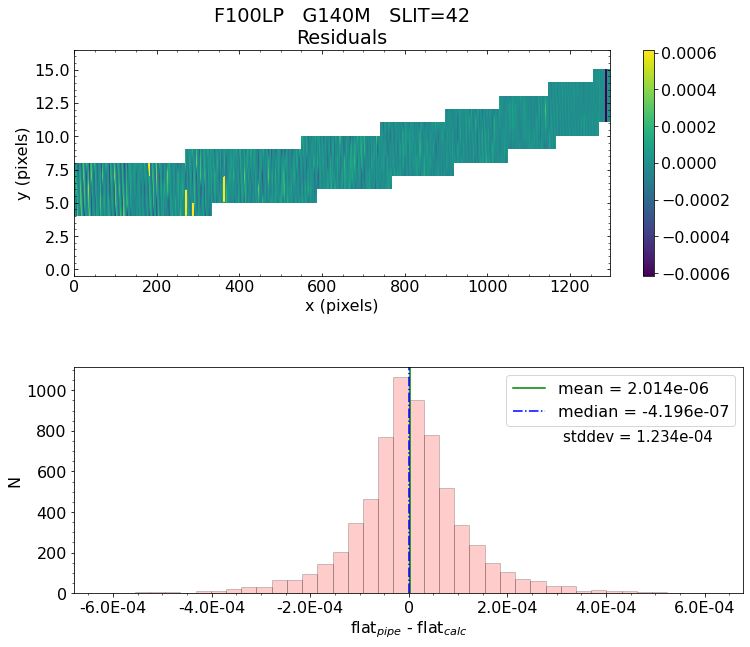

 *** Result of the test: PASSED


Working with slit: 43
 Subwindow origin:   px0=1   py0=415
silt_id='43'   quad=2   row=155   col=82   slitlet_id='155_82'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -2.637e-07    median = 3.676e-07    stdev = 1.159e-04
    Maximum   AbsoluteFlat Difference = 6.433e-04
    Minimum   AbsoluteFlat Difference = -7.721e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 28%
                            ->  3xtheshold = 3%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


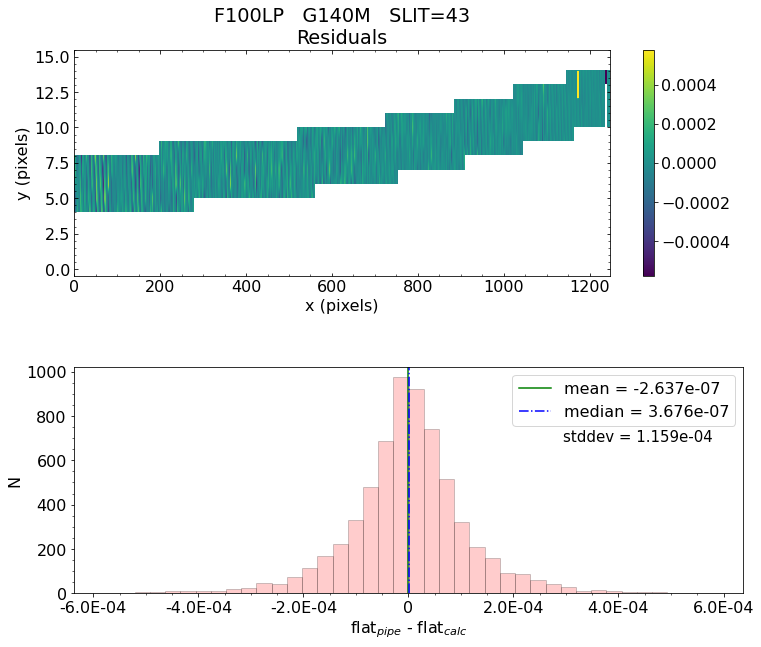

 *** Result of the test: PASSED


Working with slit: 44
 Subwindow origin:   px0=1   py0=405
silt_id='44'   quad=2   row=155   col=84   slitlet_id='155_84'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -7.043e-07    median = -4.557e-07    stdev = 1.156e-04
    Maximum   AbsoluteFlat Difference = 8.535e-04
    Minimum   AbsoluteFlat Difference = -8.189e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 28%
                            ->  3xtheshold = 2%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


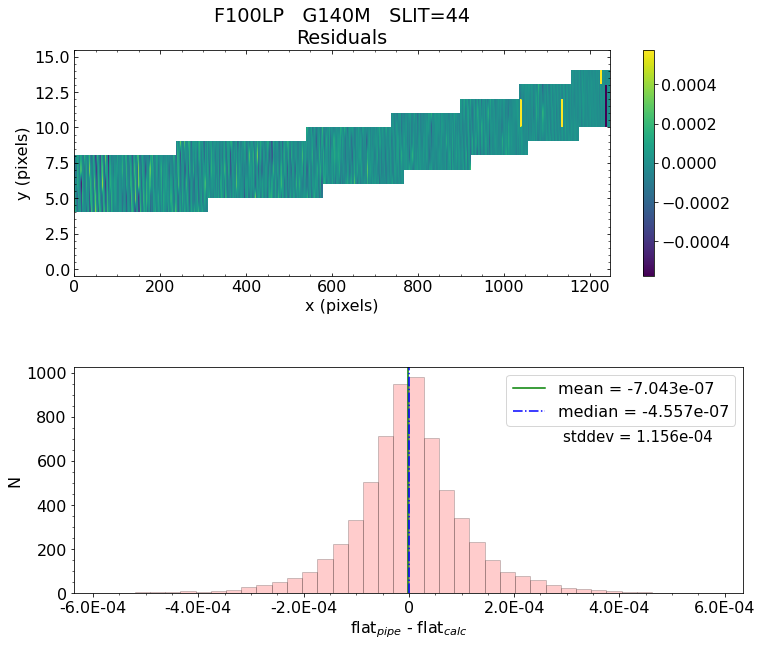

 *** Result of the test: PASSED


Working with slit: 45
 Subwindow origin:   px0=1   py0=531
silt_id='45'   quad=2   row=180   col=59   slitlet_id='180_59'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -2.508e-07    median = -6.537e-07    stdev = 1.119e-04
    Maximum   AbsoluteFlat Difference = 7.788e-04
    Minimum   AbsoluteFlat Difference = -8.520e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 27%
                            ->  3xtheshold = 2%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


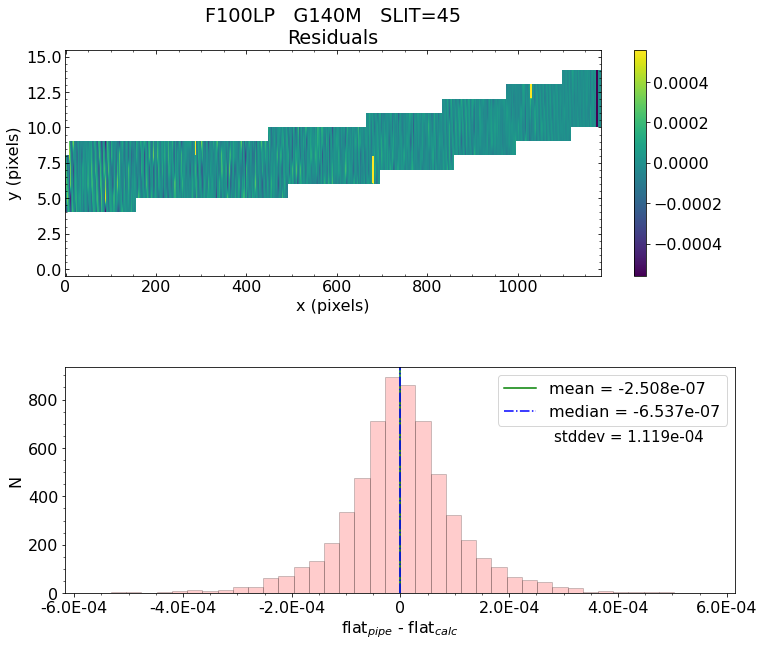

 *** Result of the test: PASSED


Working with slit: 46
 Subwindow origin:   px0=1   py0=203
silt_id='46'   quad=2   row=186   col=124   slitlet_id='186_124'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.962e-07    median = 3.201e-07    stdev = 1.076e-04
    Maximum   AbsoluteFlat Difference = 8.721e-04
    Minimum   AbsoluteFlat Difference = -7.647e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 27%
                            ->  3xtheshold = 2%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


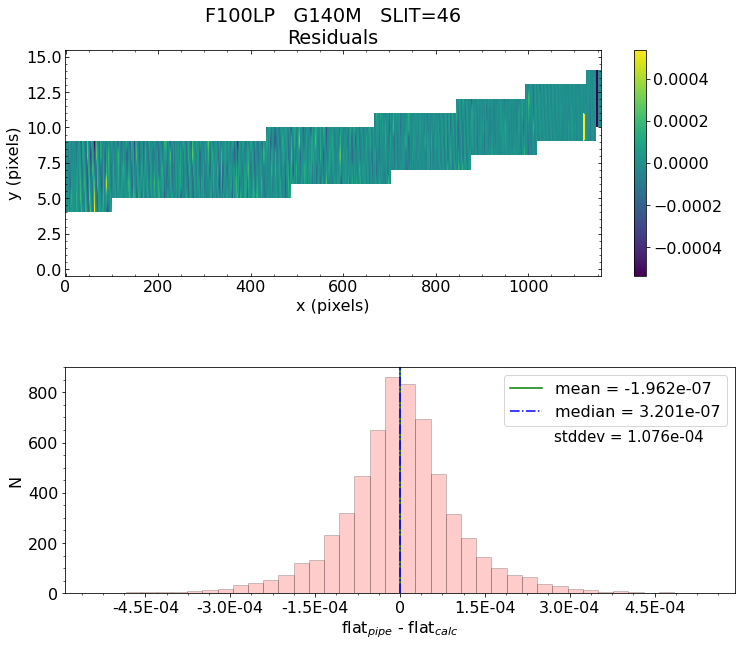

 *** Result of the test: PASSED


Working with slit: 47
 Subwindow origin:   px0=1   py0=567
silt_id='47'   quad=2   row=216   col=52   slitlet_id='216_52'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.014e-06    median = -5.019e-07    stdev = 1.043e-04
    Maximum   AbsoluteFlat Difference = 5.653e-04
    Minimum   AbsoluteFlat Difference = -6.140e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 26%
                            ->  3xtheshold = 2%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


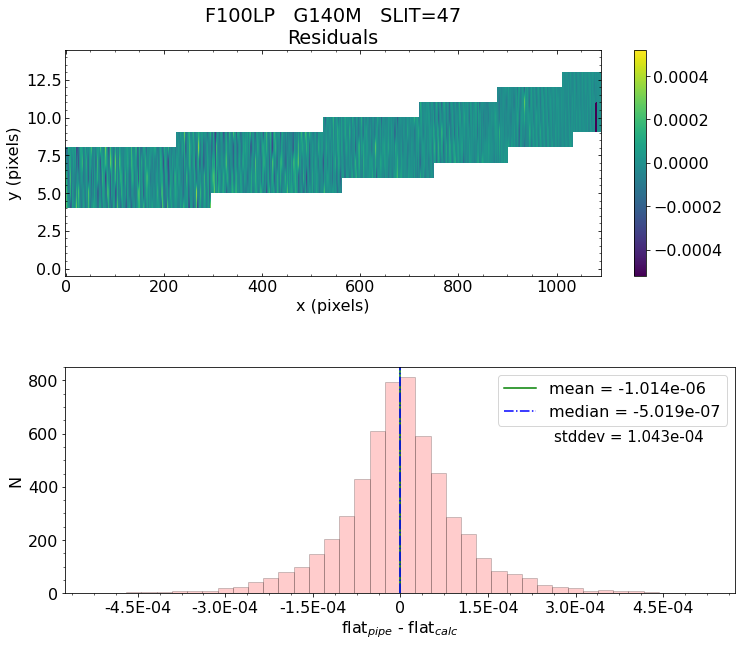

 *** Result of the test: PASSED


Working with slit: 48
 Subwindow origin:   px0=1   py0=562
silt_id='48'   quad=2   row=216   col=53   slitlet_id='216_53'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 2.653e-07    median = -2.793e-07    stdev = 1.039e-04
    Maximum   AbsoluteFlat Difference = 5.858e-04
    Minimum   AbsoluteFlat Difference = -4.755e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 2%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


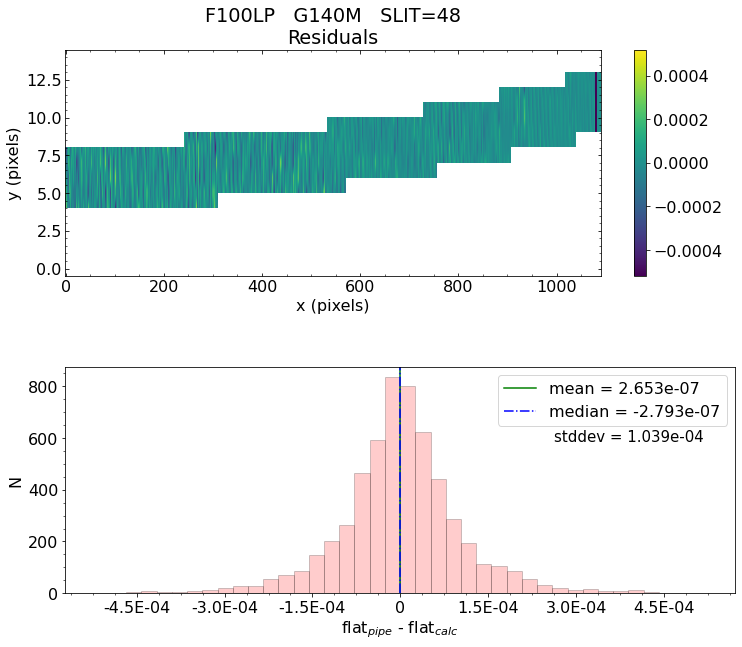

 *** Result of the test: PASSED


Working with slit: 49
 Subwindow origin:   px0=1   py0=633
silt_id='49'   quad=2   row=226   col=39   slitlet_id='226_39'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.128e-05    median = -1.805e-07    stdev = 8.076e-04
    Maximum   AbsoluteFlat Difference = 4.734e-04
    Minimum   AbsoluteFlat Difference = -5.937e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 2%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


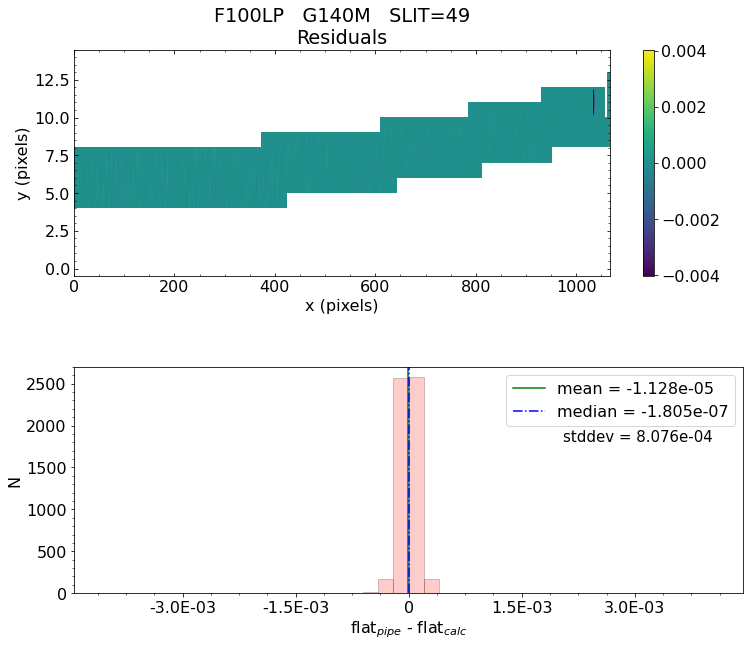

 *** Result of the test: PASSED


Working with slit: 50
 Subwindow origin:   px0=1   py0=239
silt_id='50'   quad=2   row=228   col=117   slitlet_id='228_117'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -7.065e-07    median = -8.914e-08    stdev = 1.028e-04
    Maximum   AbsoluteFlat Difference = 4.845e-04
    Minimum   AbsoluteFlat Difference = -5.073e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 2%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


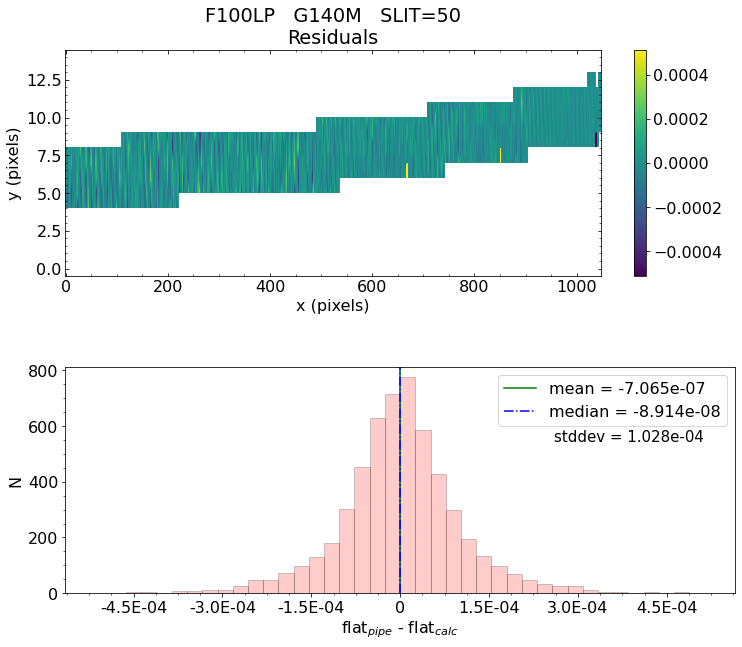

 *** Result of the test: PASSED


Working with slit: 51
 Subwindow origin:   px0=1   py0=431
silt_id='51'   quad=2   row=236   col=79   slitlet_id='236_79'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.565e-07    median = -6.203e-07    stdev = 1.024e-04
    Maximum   AbsoluteFlat Difference = 5.441e-04
    Minimum   AbsoluteFlat Difference = -5.250e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 2%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


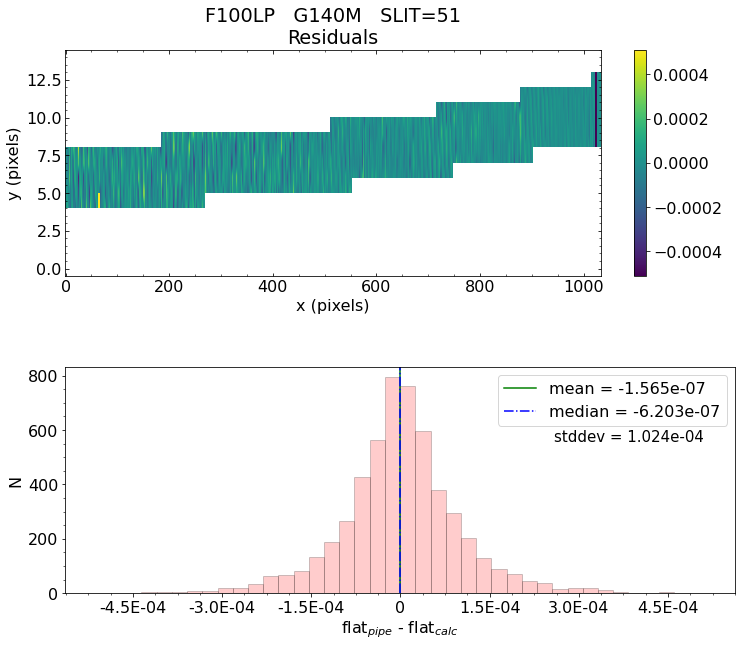

 *** Result of the test: PASSED


Working with slit: 52
 Subwindow origin:   px0=1   py0=804
silt_id='52'   quad=2   row=255   col=5   slitlet_id='255_5'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 1.208e-06    median = -7.420e-07    stdev = 1.012e-04
    Maximum   AbsoluteFlat Difference = 6.290e-04
    Minimum   AbsoluteFlat Difference = -6.241e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


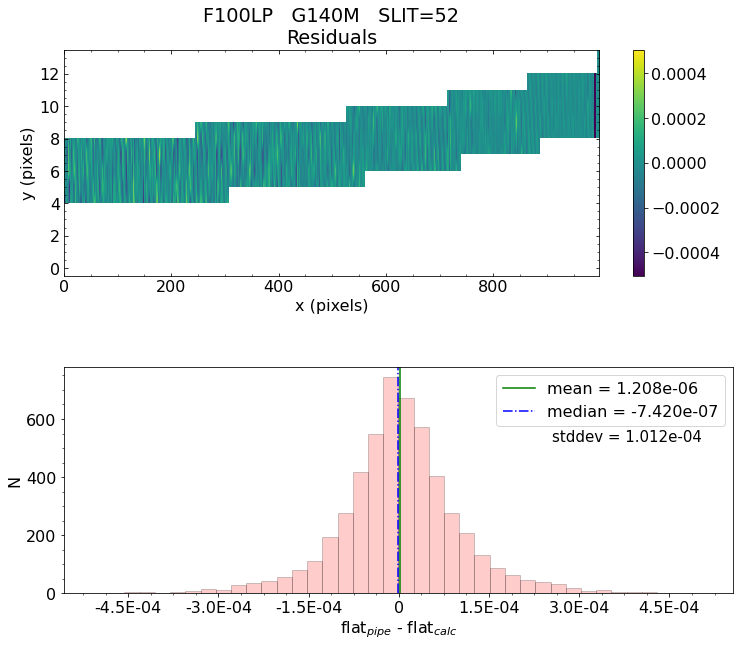

 *** Result of the test: PASSED


Working with slit: 55
 Subwindow origin:   px0=1   py0=1416
silt_id='55'   quad=3   row=82   col=124   slitlet_id='82_124'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -3.714e-07    median = -4.575e-08    stdev = 6.297e-05
    Maximum   AbsoluteFlat Difference = 3.558e-04
    Minimum   AbsoluteFlat Difference = -2.853e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 10%
                            ->  3xtheshold = 0%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


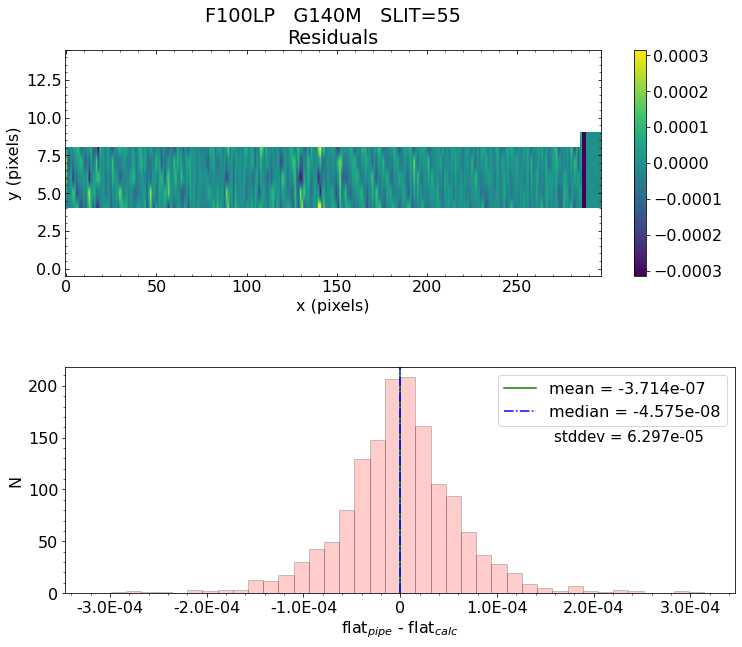

 *** Result of the test: PASSED


Working with slit: 56
 Subwindow origin:   px0=1   py0=769
silt_id='56'   quad=4   row=130   col=12   slitlet_id='130_12'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = -1.200e-06    median = -3.250e-07    stdev = 4.809e-05
    Maximum   AbsoluteFlat Difference = 1.652e-04
    Minimum   AbsoluteFlat Difference = -1.662e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 5%
                            ->  3xtheshold = 0%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


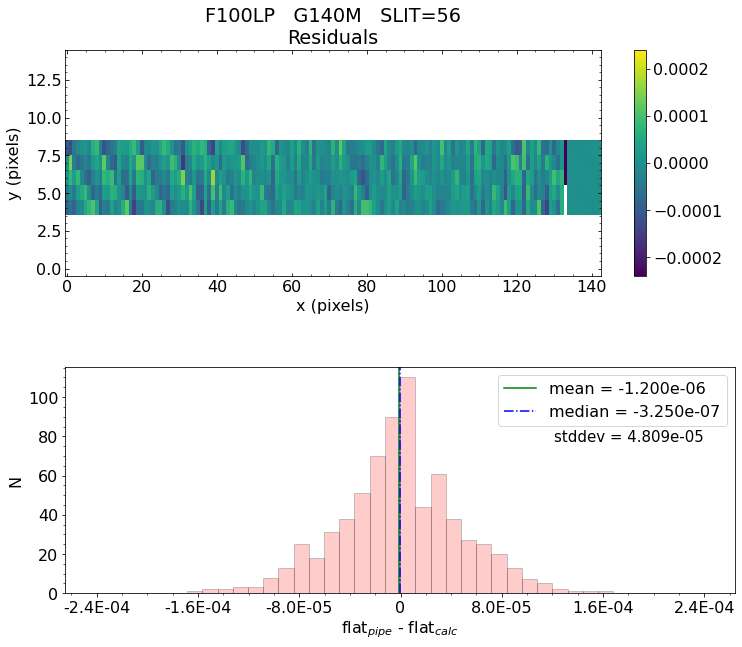

 *** Result of the test: PASSED


Working with slit: 57
 Subwindow origin:   px0=1   py0=355
silt_id='57'   quad=4   row=150   col=94   slitlet_id='150_94'
Now looping through the pixels, this will take a while ... 


Calculating statistics... 

   Absolute Flat Difference  :   mean = 2.433e-06    median = 1.212e-07    stdev = 4.345e-05
    Maximum   AbsoluteFlat Difference = 1.267e-04
    Minimum   AbsoluteFlat Difference = -1.617e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 3%
                            ->  3xtheshold = 0%
                            ->  5xtheshold = 0%
Making histogram plot for this slitlet...


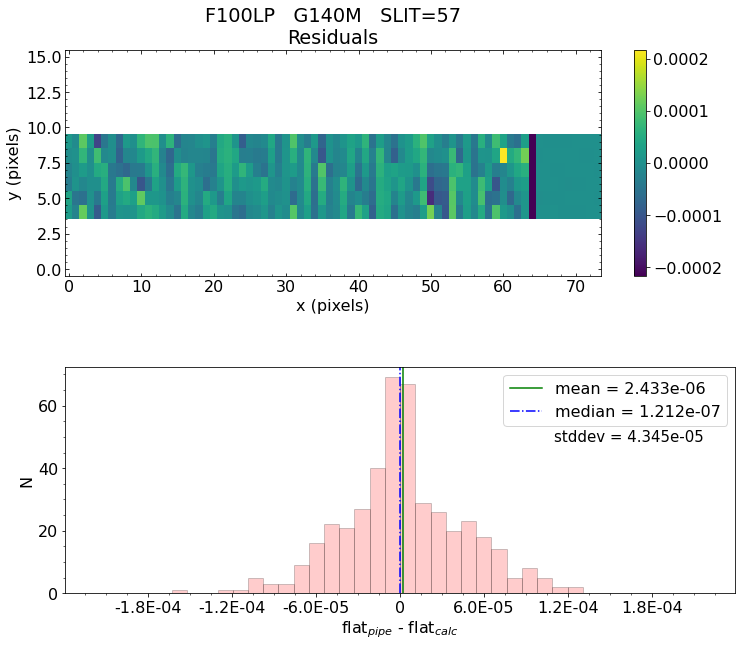

 *** Result of the test: PASSED


 *** Final result for flat_field test will be reported as PASSED *** 

('* Script flattest_mos.py took ', '7.649023159344991 minutes to finish.')
Did flat_field validation test passed?  All slitlets PASSED flat_field test. 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs2_f_01.03.fits', fd=50, position=680480640, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_sflat_G140M_OPAQUE_FLAT1_nrs2_f_01.01.fits', fd=58, position=1006715520, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_MOS_fflat_F100LP_01.01.fits', fd=59, position=299989440, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validati

Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_prism_nrs1_uncal.fits


2021-06-03 23:51:49,870 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-03 23:51:49,884 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-03 23:51:49,886 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-03 23:51:49,887 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-03 23:51:49,888 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-03 23:51:49,889 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-03 23:51:49,891 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-03 23:51:49,892 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-03 23:51:49,893 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-03 23:51:49,894 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-03 23:51:49,896 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-03 23:51:49,897 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-03 23:51:49,898 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-03 23:51:49,899 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-03 23:51:49,900 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-03 23:51:49,902 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-03 23:51:49,903 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-03 23:51:49,904 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_prism_nrs1_uncal.fits' mode='rb' closefd=True>
  gc.collect()
2021-06-03 23:51:50,577 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_prism_nrs1_uncal.fits',).


2021-06-03 23:51:50,587 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-03 23:51:50,738 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'ifu_prism_nrs1_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-03 23:51:50,746 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0140.fits'.


2021-06-03 23:51:50,748 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits'.


2021-06-03 23:51:50,750 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0018.fits'.


2021-06-03 23:51:50,752 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0024.fits'.


2021-06-03 23:51:50,753 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-03 23:51:50,754 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0019.fits'.


2021-06-03 23:51:50,757 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2021-06-03 23:51:50,757 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-03 23:51:50,758 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-03 23:51:50,758 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0020.fits'.


2021-06-03 23:51:50,760 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0087.fits'.


2021-06-03 23:51:50,762 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-03 23:51:50,762 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-03 23:51:50,763 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-03 23:51:51,731 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:51:51,732 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:51:51,906 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-03 23:51:51,907 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-03 23:51:51,909 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-03 23:51:52,543 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:51:52,544 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:51:52,564 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0024.fits


2021-06-03 23:51:53,023 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-03 23:51:53,657 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:51:53,659 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:51:53,678 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0020.fits


2021-06-03 23:51:54,276 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4320 saturated pixels


2021-06-03 23:51:54,311 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-03 23:51:54,321 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-03 23:51:54,977 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:51:54,979 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:51:54,980 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-03 23:51:54,981 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-03 23:51:55,612 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:51:55,614 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:51:55,634 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0087.fits


2021-06-03 23:51:56,095 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-03 23:51:56,761 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:51:56,763 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-03 23:51:56,772 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2021-06-03 23:51:56,772 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2021-06-03 23:51:56,773 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2021-06-03 23:51:56,773 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.000000


2021-06-03 23:51:56,774 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = True


2021-06-03 23:52:01,903 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-03 23:52:02,573 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:52:02,575 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:52:02,595 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0018.fits


2021-06-03 23:52:03,843 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-03 23:52:04,488 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:52:04,490 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-03 23:52:04,509 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0140.fits


2021-06-03 23:52:04,735 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=10, nframes=1, groupgap=0


2021-06-03 23:52:04,736 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=10, nframes=1, groupgap=0


2021-06-03 23:52:05,139 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-03 23:52:05,798 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:52:05,799 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-03 23:52:05,808 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 4 sigma


2021-06-03 23:52:05,819 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits


2021-06-03 23:52:05,875 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0019.fits


2021-06-03 23:52:05,920 - stpipe.Detector1Pipeline.jump - INFO - Found 32 possible cores to use for jump detection 


2021-06-03 23:52:06,201 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2021-06-03 23:52:06,590 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2021-06-03 23:52:08,796 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier Two-point found 37391 pixels with at least one CR


2021-06-03 23:52:09,979 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 3.77607 sec


2021-06-03 23:52:09,982 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 4.173920


2021-06-03 23:52:09,985 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-03 23:52:10,659 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:52:10,661 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-03 23:52:10,692 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0019.fits


2021-06-03 23:52:10,743 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0019.fits


2021-06-03 23:52:10,794 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-03 23:52:10,795 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:872: RuntimeWarning: invalid value encountered in multiply
  var_p4[num_int,:,:,:] *= ( segs_4[num_int,:,:,:] > 0)


2021-06-03 23:52:57,986 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 10


2021-06-03 23:52:57,987 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


2021-06-03 23:52:58,178 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-03 23:52:58,823 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<IFUImageModel(2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:52:58,825 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:52:58,895 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:52:58,896 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:52:58,899 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:52:59,527 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:52:59,528 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-03 23:52:59,593 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-03 23:52:59,594 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-03 23:52:59,597 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-03 23:52:59,598 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-03 23:52:59,599 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-03 23:52:59,609 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-03 23:53:00,245 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<IFUImageModel(2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:53:00,247 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-03 23:53:00,438 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.03312480077147484 deg


2021-06-03 23:53:00,439 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3411945700645447 deg


2021-06-03 23:53:00,439 - stpipe.AssignWcsStep - INFO - theta_y correction: -0.005294283663966503 deg


2021-06-03 23:53:00,441 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:53:04,081 - stpipe.AssignWcsStep - INFO - Created a NIRSPEC nrs_ifu pipeline with references {'distortion': None, 'filteroffset': None, 'specwcs': None, 'regions': None, 'wavelengthrange': '/grp/crds/cache/references/jwst/jwst_nirspec_wavelengthrange_0004.asdf', 'camera': '/grp/crds/cache/references/jwst/jwst_nirspec_camera_0004.asdf', 'collimator': '/grp/crds/cache/references/jwst/jwst_nirspec_collimator_0004.asdf', 'disperser': '/grp/crds/cache/references/jwst/jwst_nirspec_disperser_0034.asdf', 'fore': '/grp/crds/cache/references/jwst/jwst_nirspec_fore_0028.asdf', 'fpa': '/grp/crds/cache/references/jwst/jwst_nirspec_fpa_0005.asdf', 'msa': '/grp/crds/cache/references/jwst/jwst_nirspec_msa_0005.asdf', 'ote': '/grp/crds/cache/references/jwst/jwst_nirspec_ote_0005.asdf', 'ifupost': '/grp/crds/cache/references/jwst/jwst_nirspec_ifupost_0004.asdf', 'ifufore': '/grp/crds/cache/references/jwst/jwst_nirspec_ifufore_0003.asdf', 'ifuslicer': '/grp/crds/cache/references/jwst/jwst_n

/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


2021-06-03 23:54:12,656 - stpipe.AssignWcsStep - INFO - Update S_REGION to POLYGON ICRS  156.176998032 -45.687618307 156.178780407 -45.687618307 156.178780407 -45.686330486 156.176998032 -45.686330486


2021-06-03 23:54:12,657 - stpipe.AssignWcsStep - INFO - COMPLETED assign_wcs


2021-06-03 23:54:12,664 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep done


2021-06-03 23:54:12,676 - stpipe.MSAFlagOpenStep - INFO - MSAFlagOpenStep instance created.


2021-06-03 23:54:14,123 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep running with args (<IFUImageModel(2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:54:14,132 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:54:14,157 - stpipe.MSAFlagOpenStep - INFO - Using reference file /grp/crds/cache/references/jwst/jwst_nirspec_msaoper_0001.json


2021-06-03 23:54:14,158 - stpipe.JwstStep - INFO - JwstStep instance created.


2021-06-03 23:54:14,291 - stpipe.MSAFlagOpenStep - INFO - gwa_ytilt is 0.03312480077147484 deg


2021-06-03 23:54:14,292 - stpipe.MSAFlagOpenStep - INFO - gwa_xtilt is 0.3411945700645447 deg


2021-06-03 23:54:14,293 - stpipe.MSAFlagOpenStep - INFO - theta_y correction: -0.005294283663966503 deg


2021-06-03 23:54:14,294 - stpipe.MSAFlagOpenStep - INFO - theta_x correction: 0.0 deg


2021-06-03 23:54:14,304 - stpipe.MSAFlagOpenStep - INFO - SPORDER= 0, wrange=[6e-07, 5.3e-06]


2021-06-03 23:54:14,432 - stpipe.MSAFlagOpenStep - INFO - There are 5 open slits in quadrant 1


2021-06-03 23:54:14,479 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 2


2021-06-03 23:54:14,509 - stpipe.MSAFlagOpenStep - INFO - There are 9 open slits in quadrant 3


2021-06-03 23:54:14,595 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 4


2021-06-03 23:54:14,624 - stpipe.MSAFlagOpenStep - INFO - There are 0 open slits in quadrant 5


2021-06-03 23:54:28,974 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep done


2021-06-03 23:54:28,988 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.


2021-06-03 23:54:30,147 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep running with args (<IFUImageModel(2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:54:30,156 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:54:30,165 - stpipe.SourceTypeStep - INFO - Input EXP_TYPE is NRS_IFU


2021-06-03 23:54:30,165 - stpipe.SourceTypeStep - INFO - Input SRCTYAPT = UNKNOWN


2021-06-03 23:54:30,166 - stpipe.SourceTypeStep - INFO - Input source type is unknown; setting default SRCTYPE = EXTENDED


2021-06-03 23:54:30,168 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep done


2021-06-03 23:54:30,178 - stpipe.WavecorrStep - INFO - WavecorrStep instance created.


2021-06-03 23:54:30,699 - stpipe.WavecorrStep - INFO - Step WavecorrStep running with args (<IFUImageModel(2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:54:30,700 - stpipe.WavecorrStep - INFO - Step WavecorrStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-03 23:54:30,709 - stpipe.WavecorrStep - INFO - Skipping wavecorr correction for EXP_TYPE NRS_IFU


2021-06-03 23:54:30,710 - stpipe.WavecorrStep - INFO - Step WavecorrStep done


2021-06-03 23:54:30,720 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.


2021-06-03 23:54:31,245 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<IFUImageModel(2048, 2048) from ifu_prism_nrs1_uncal.fits>,).


2021-06-03 23:54:31,247 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': True, 'user_supplied_flat': None, 'inverse': False}


2021-06-03 23:57:20,090 - stpipe.FlatFieldStep - INFO - Saved model in ifu_prism_nrs1_interpolatedflat.fits


2021-06-03 23:57:20,093 - stpipe.FlatFieldStep - INFO - Interpolated flat written to "ifu_prism_nrs1_interpolatedflat.fits".


2021-06-03 23:57:20,096 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep done


Running flat field test for IFU...


flat_field_file  -->     Grating:PRISM   Filter:CLEAR   LAMP:NO_LAMP
Getting and reading the D-, S-, and F-flats for this specific IFU configuration... 
Using D-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs1_f_01.03.fits
Using S-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_IFU_sflat_PRISM_OPAQUE_FLAT5_nrs1_f_01.01.fits
Using F-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_IFU_fflat_CLEAR_01.01.fits

 Now looping through the slices, this may take some time... 

Working with slice: 00
 Subwindow origin:   px0=562   py0=780
 Looping through the wavelength, this may take a little time ... 


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/utils.py:72: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  indx = np.asarray(np.floor(np.asarray(value) + 0.5), dtype=np.i

Flat value differences for slice number: 00

   Absolute Flat Difference  :   mean = 4.399e-04    median = -1.236e-06    stdev = 1.180e-02
    Maximum   AbsoluteFlat Difference = 4.103e-01
    Minimum   AbsoluteFlat Difference = -8.209e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 60%
                            ->  3xtheshold = 22%
                            ->  5xtheshold = 10%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!

Making the plot for this slice...


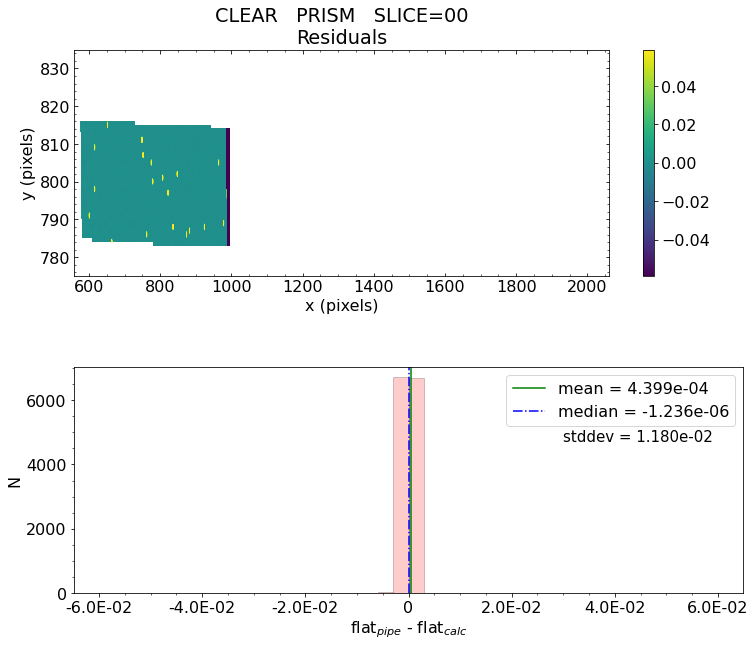

 *** Result of the test: PASSED


Working with slice: 01
 Subwindow origin:   px0=506   py0=1197
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 01

   Absolute Flat Difference  :   mean = 5.497e-04    median = 1.559e-06    stdev = 1.437e-02
    Maximum   AbsoluteFlat Difference = 5.024e-01
    Minimum   AbsoluteFlat Difference = -8.178e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 61%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


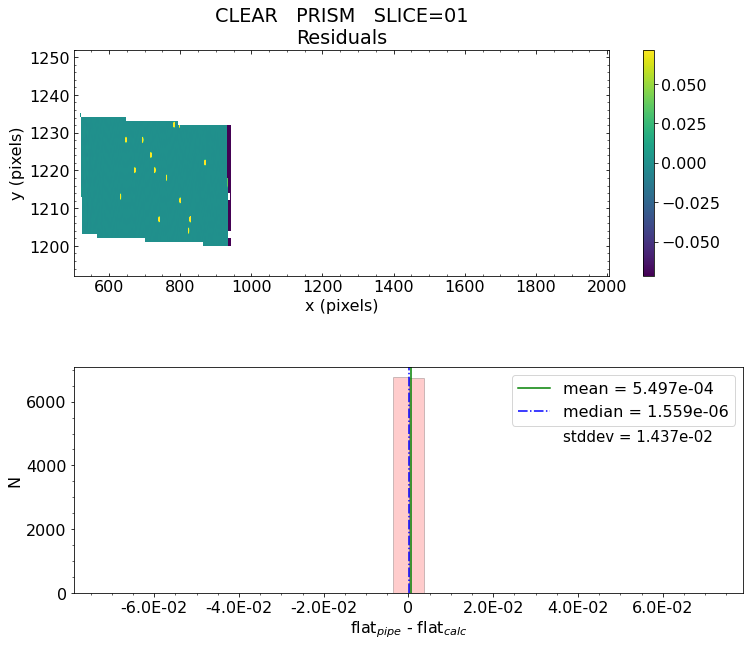

 *** Result of the test: PASSED


Working with slice: 02
 Subwindow origin:   px0=568   py0=730
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 02

   Absolute Flat Difference  :   mean = 5.392e-04    median = 5.428e-06    stdev = 1.296e-02
    Maximum   AbsoluteFlat Difference = 4.222e-01
    Minimum   AbsoluteFlat Difference = -8.054e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 61%
                            ->  3xtheshold = 23%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


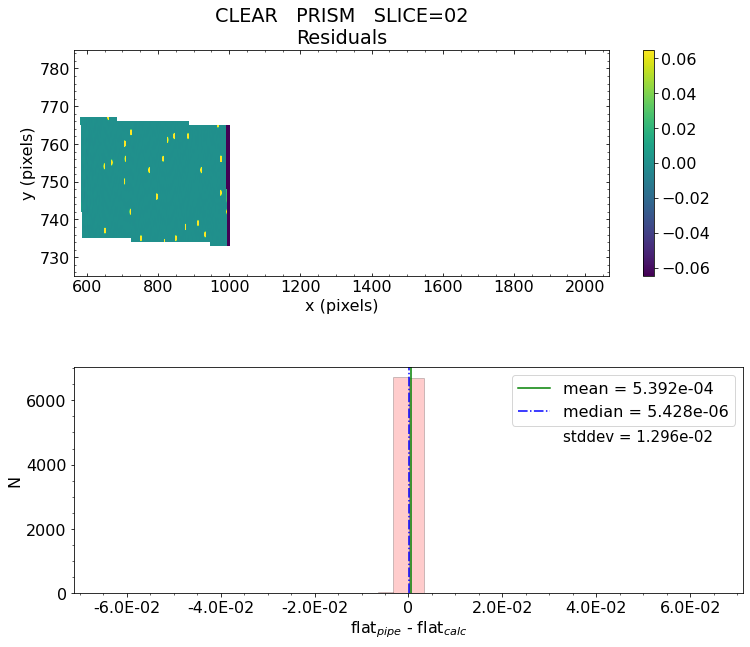

 *** Result of the test: PASSED


Working with slice: 03
 Subwindow origin:   px0=499   py0=1246
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 03

   Absolute Flat Difference  :   mean = 5.337e-04    median = 7.598e-07    stdev = 1.405e-02
    Maximum   AbsoluteFlat Difference = 4.636e-01
    Minimum   AbsoluteFlat Difference = -7.354e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 61%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


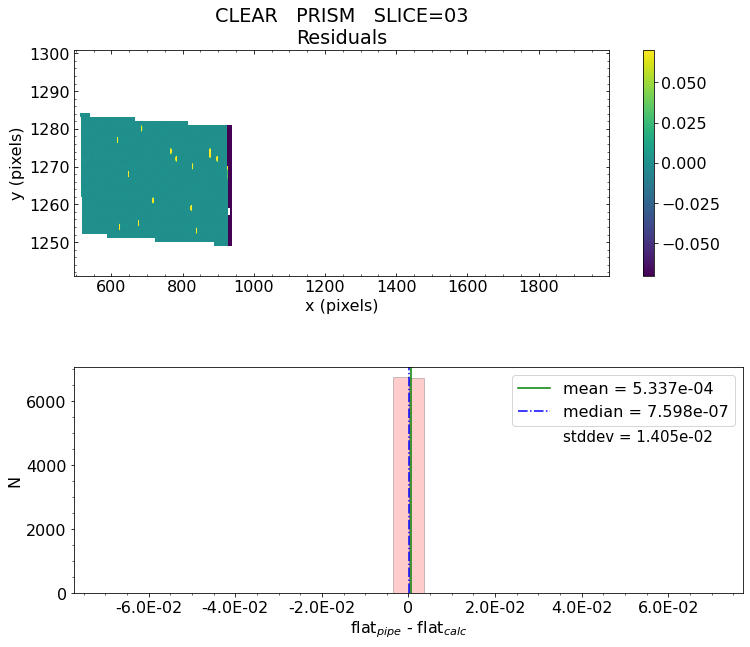

 *** Result of the test: PASSED


Working with slice: 04
 Subwindow origin:   px0=574   py0=681
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 04

   Absolute Flat Difference  :   mean = 4.418e-04    median = 9.397e-07    stdev = 1.130e-02
    Maximum   AbsoluteFlat Difference = 3.832e-01
    Minimum   AbsoluteFlat Difference = -1.048e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 61%
                            ->  3xtheshold = 23%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


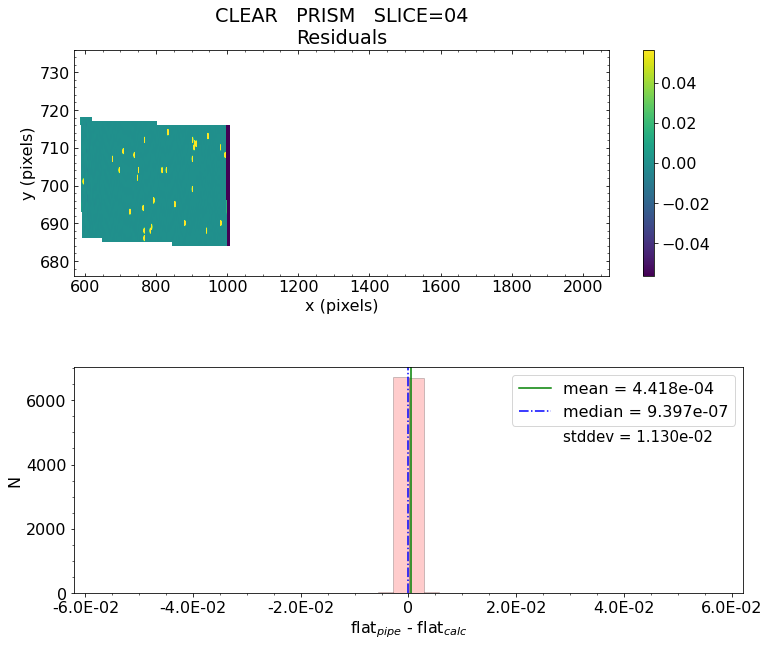

 *** Result of the test: PASSED


Working with slice: 05
 Subwindow origin:   px0=492   py0=1295
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 05

   Absolute Flat Difference  :   mean = 5.258e-04    median = 2.545e-06    stdev = 1.387e-02
    Maximum   AbsoluteFlat Difference = 4.976e-01
    Minimum   AbsoluteFlat Difference = -9.628e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 62%
                            ->  3xtheshold = 23%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


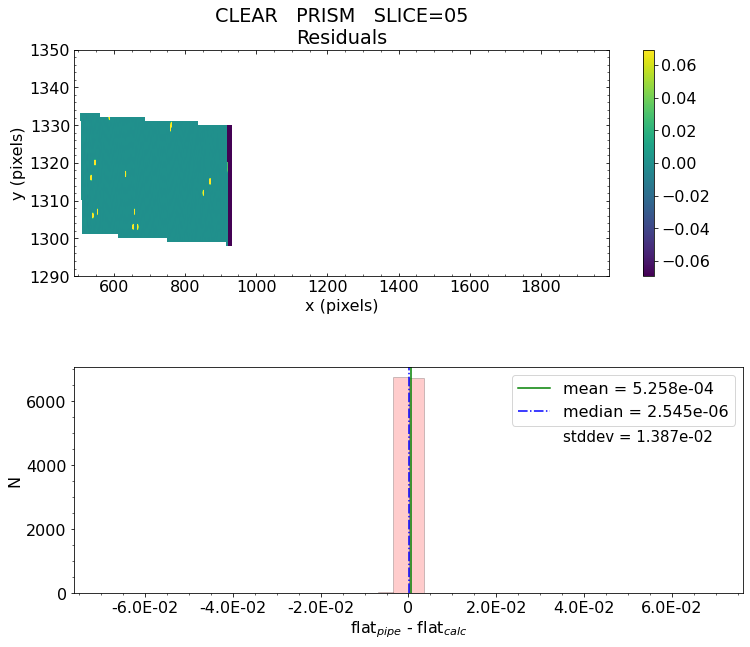

 *** Result of the test: PASSED


Working with slice: 06
 Subwindow origin:   px0=580   py0=632
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 06

   Absolute Flat Difference  :   mean = 4.203e-04    median = 1.316e-06    stdev = 1.111e-02
    Maximum   AbsoluteFlat Difference = 4.687e-01
    Minimum   AbsoluteFlat Difference = -9.827e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 60%
                            ->  3xtheshold = 22%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


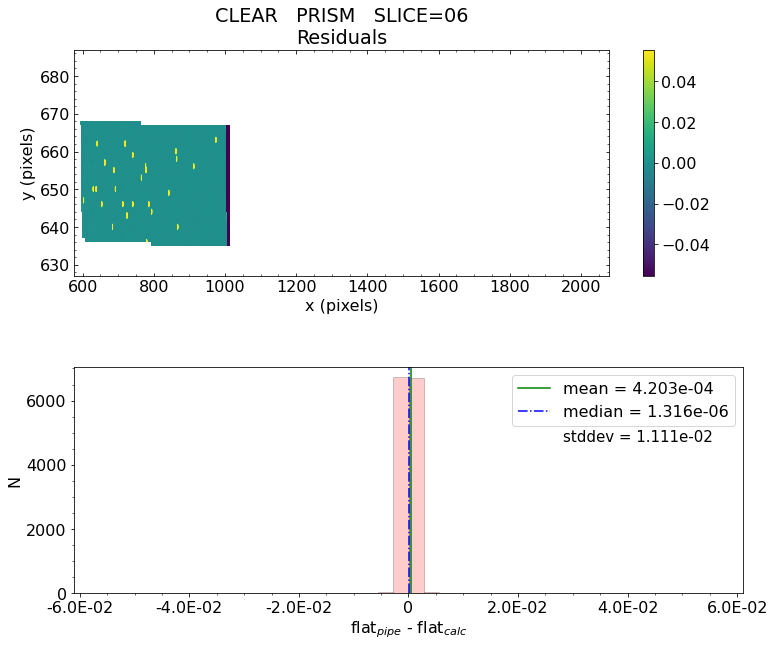

 *** Result of the test: PASSED


Working with slice: 07
 Subwindow origin:   px0=485   py0=1345
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 07

   Absolute Flat Difference  :   mean = 5.510e-04    median = 9.556e-07    stdev = 1.442e-02
    Maximum   AbsoluteFlat Difference = 5.002e-01
    Minimum   AbsoluteFlat Difference = -9.173e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 62%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


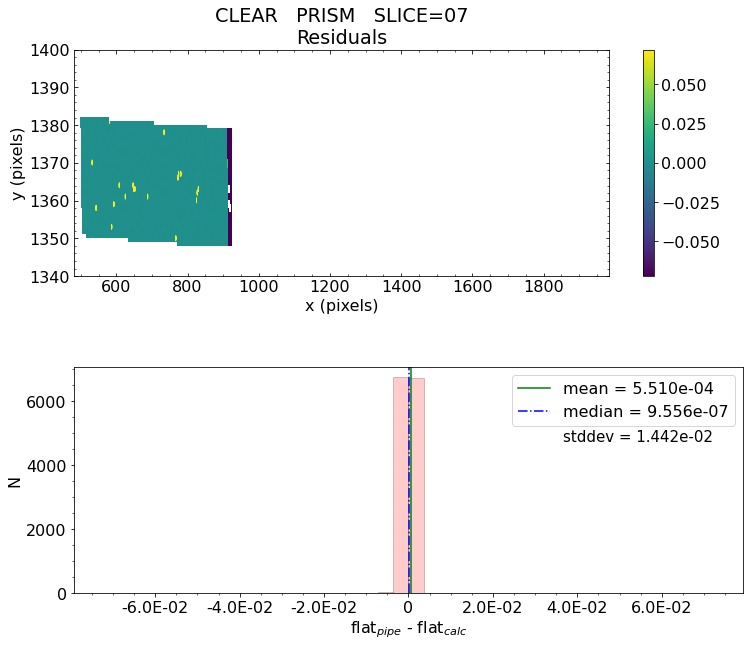

 *** Result of the test: PASSED


Working with slice: 08
 Subwindow origin:   px0=586   py0=582
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 08

   Absolute Flat Difference  :   mean = 5.069e-04    median = 1.509e-06    stdev = 1.209e-02
    Maximum   AbsoluteFlat Difference = 3.753e-01
    Minimum   AbsoluteFlat Difference = -8.025e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 61%
                            ->  3xtheshold = 23%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


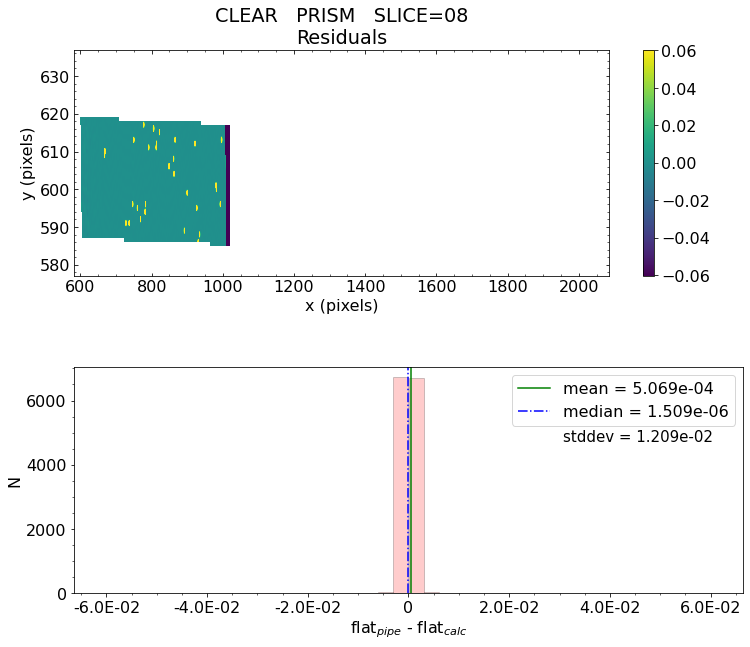

 *** Result of the test: PASSED


Working with slice: 09
 Subwindow origin:   px0=478   py0=1394
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 09

   Absolute Flat Difference  :   mean = 5.150e-04    median = 3.650e-06    stdev = 1.402e-02
    Maximum   AbsoluteFlat Difference = 4.908e-01
    Minimum   AbsoluteFlat Difference = -1.129e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 61%
                            ->  3xtheshold = 23%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


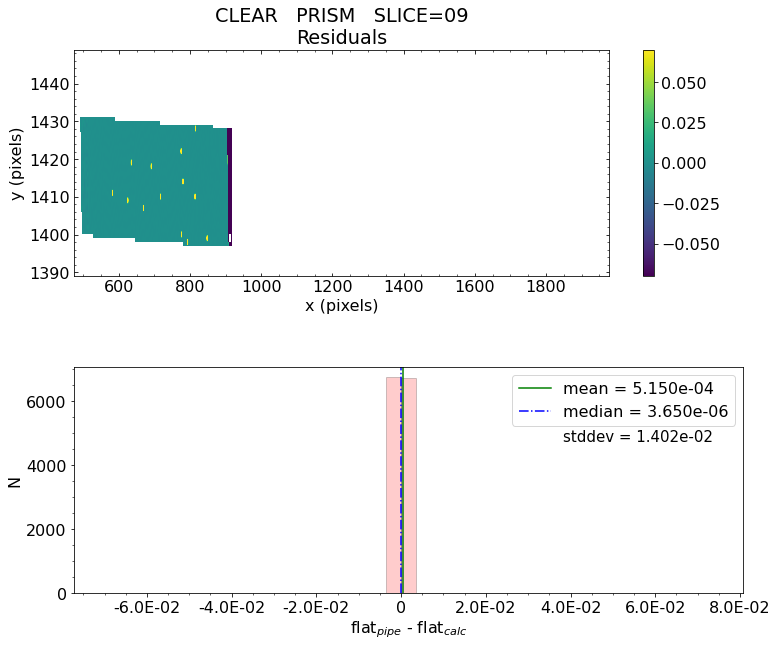

 *** Result of the test: PASSED


Working with slice: 10
 Subwindow origin:   px0=592   py0=533
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 10

   Absolute Flat Difference  :   mean = 4.279e-04    median = 1.833e-06    stdev = 1.093e-02
    Maximum   AbsoluteFlat Difference = 3.913e-01
    Minimum   AbsoluteFlat Difference = -1.228e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 60%
                            ->  3xtheshold = 22%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


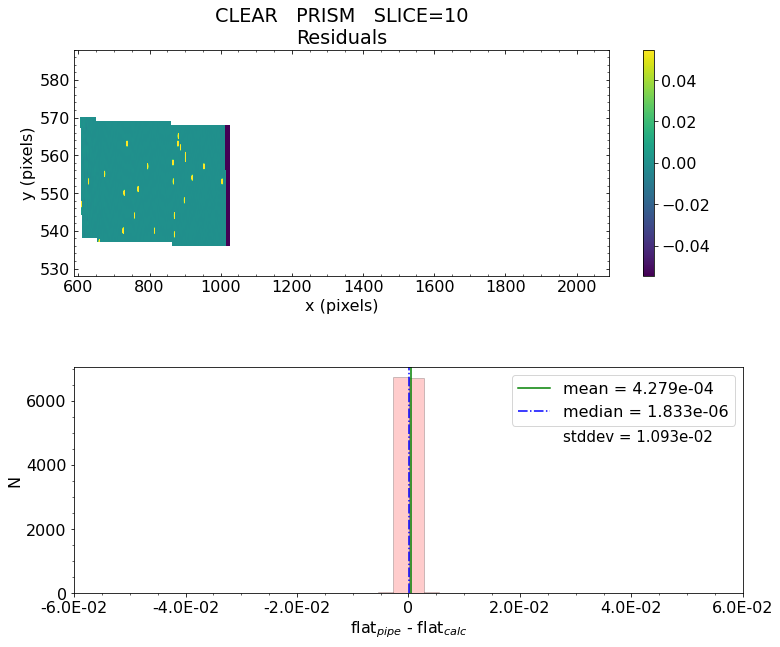

 *** Result of the test: PASSED


Working with slice: 11
 Subwindow origin:   px0=470   py0=1443
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 11

   Absolute Flat Difference  :   mean = 5.046e-04    median = 3.494e-06    stdev = 1.387e-02
    Maximum   AbsoluteFlat Difference = 4.866e-01
    Minimum   AbsoluteFlat Difference = -1.194e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 61%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 12%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


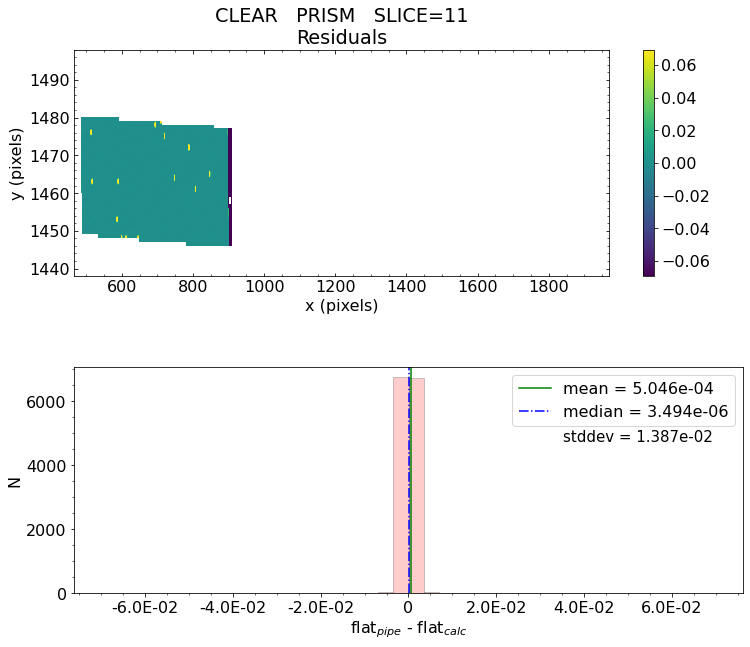

 *** Result of the test: PASSED


Working with slice: 12
 Subwindow origin:   px0=598   py0=484
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 12

   Absolute Flat Difference  :   mean = 4.585e-04    median = 4.425e-06    stdev = 1.110e-02
    Maximum   AbsoluteFlat Difference = 3.533e-01
    Minimum   AbsoluteFlat Difference = -1.426e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 60%
                            ->  3xtheshold = 23%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


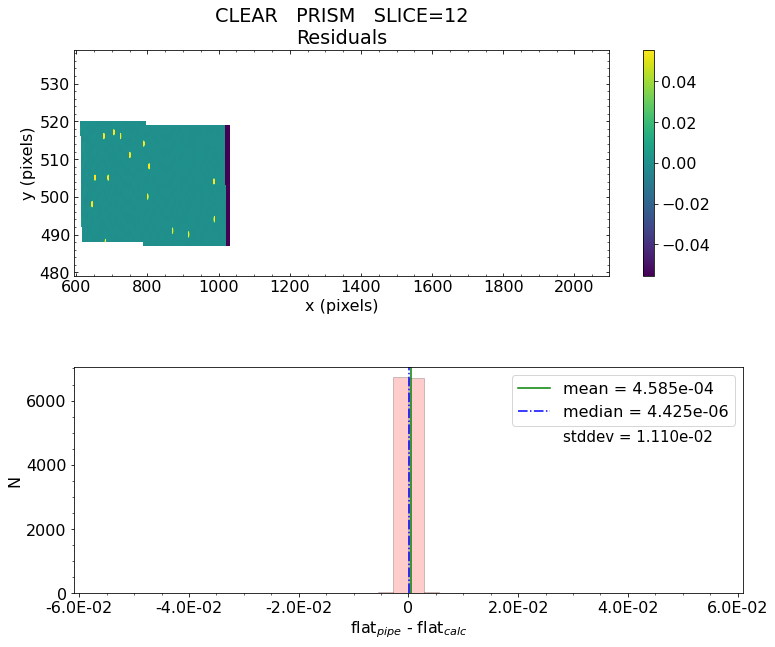

 *** Result of the test: PASSED


Working with slice: 13
 Subwindow origin:   px0=463   py0=1492
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 13

   Absolute Flat Difference  :   mean = 5.434e-04    median = 1.948e-06    stdev = 1.427e-02
    Maximum   AbsoluteFlat Difference = 5.157e-01
    Minimum   AbsoluteFlat Difference = -1.325e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 62%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 12%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


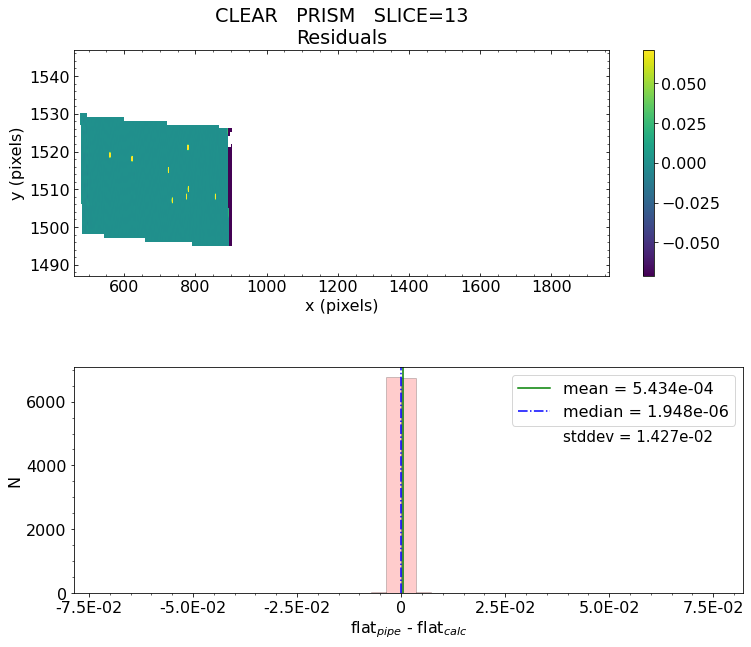

 *** Result of the test: PASSED


Working with slice: 14
 Subwindow origin:   px0=604   py0=434
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 14

   Absolute Flat Difference  :   mean = 3.893e-04    median = -1.099e-07    stdev = 9.772e-03
    Maximum   AbsoluteFlat Difference = 3.265e-01
    Minimum   AbsoluteFlat Difference = -8.879e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 59%
                            ->  3xtheshold = 22%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


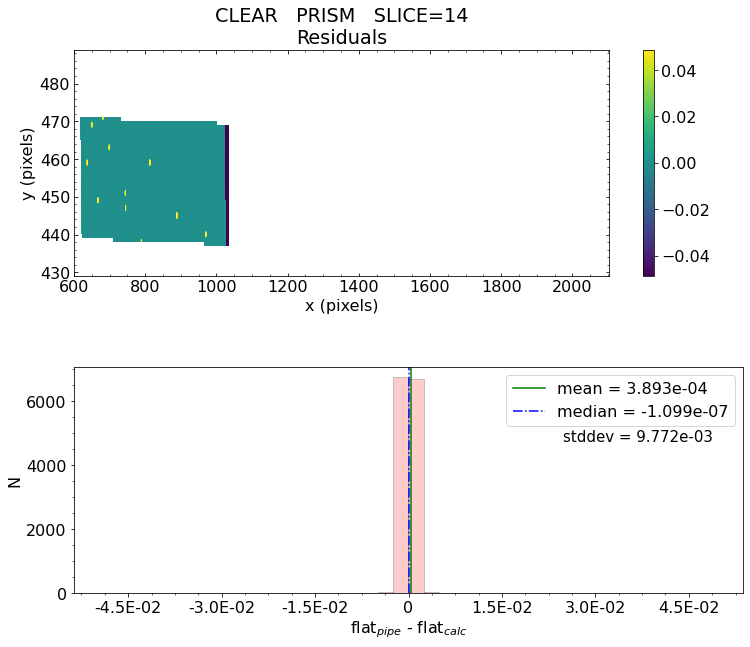

 *** Result of the test: PASSED


Working with slice: 15
 Subwindow origin:   px0=456   py0=1541
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 15

   Absolute Flat Difference  :   mean = 4.996e-04    median = 3.020e-06    stdev = 1.347e-02
    Maximum   AbsoluteFlat Difference = 4.821e-01
    Minimum   AbsoluteFlat Difference = -1.812e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 61%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


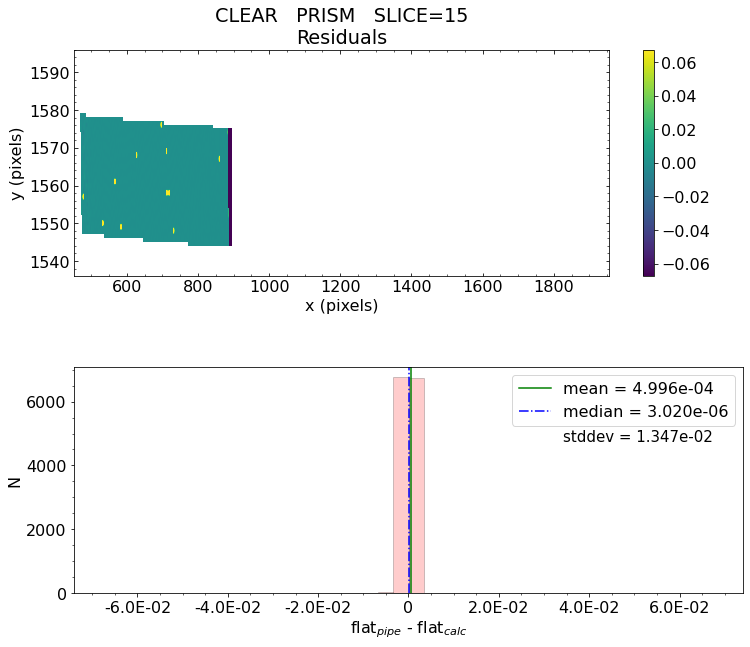

 *** Result of the test: PASSED


Working with slice: 16
 Subwindow origin:   px0=609   py0=385
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 16

   Absolute Flat Difference  :   mean = 4.162e-04    median = 2.894e-06    stdev = 9.933e-03
    Maximum   AbsoluteFlat Difference = 3.199e-01
    Minimum   AbsoluteFlat Difference = -1.015e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 60%
                            ->  3xtheshold = 22%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


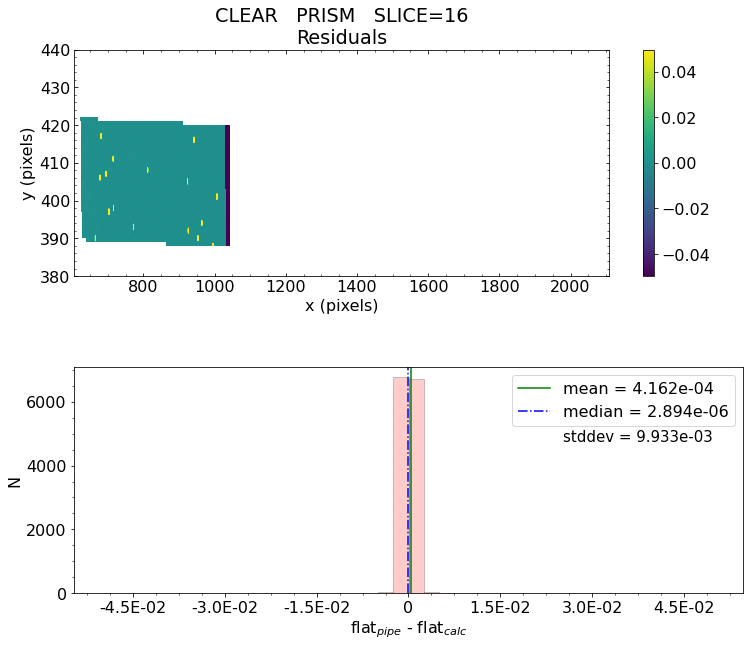

 *** Result of the test: PASSED


Working with slice: 17
 Subwindow origin:   px0=448   py0=1590
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 17

   Absolute Flat Difference  :   mean = 5.331e-04    median = 2.242e-06    stdev = 1.385e-02
    Maximum   AbsoluteFlat Difference = 4.789e-01
    Minimum   AbsoluteFlat Difference = -9.371e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 61%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 12%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


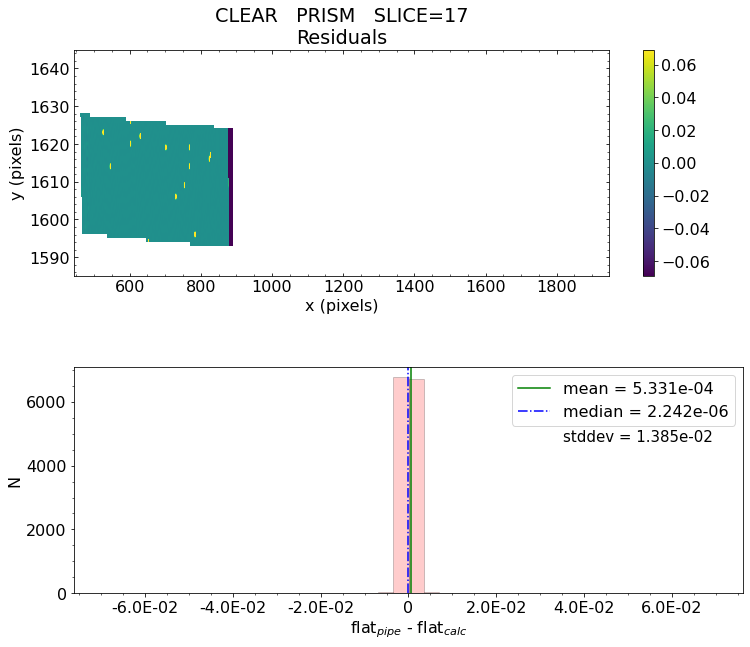

 *** Result of the test: PASSED


Working with slice: 18
 Subwindow origin:   px0=615   py0=336
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 18

   Absolute Flat Difference  :   mean = 3.429e-04    median = 3.918e-07    stdev = 8.902e-03
    Maximum   AbsoluteFlat Difference = 3.218e-01
    Minimum   AbsoluteFlat Difference = -9.723e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 59%
                            ->  3xtheshold = 21%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


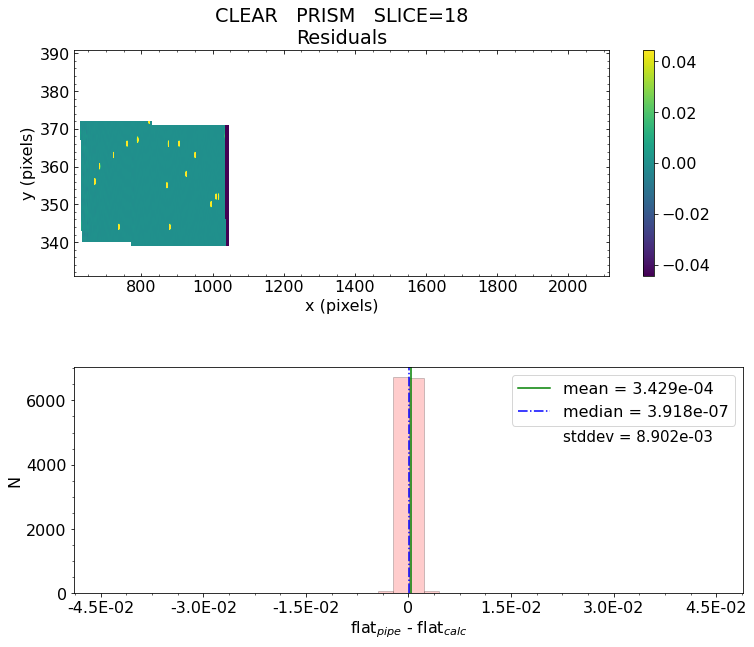

 *** Result of the test: PASSED


Working with slice: 19
 Subwindow origin:   px0=441   py0=1639
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 19

   Absolute Flat Difference  :   mean = 5.134e-04    median = -1.441e-06    stdev = 1.405e-02
    Maximum   AbsoluteFlat Difference = 4.968e-01
    Minimum   AbsoluteFlat Difference = -7.162e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 62%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


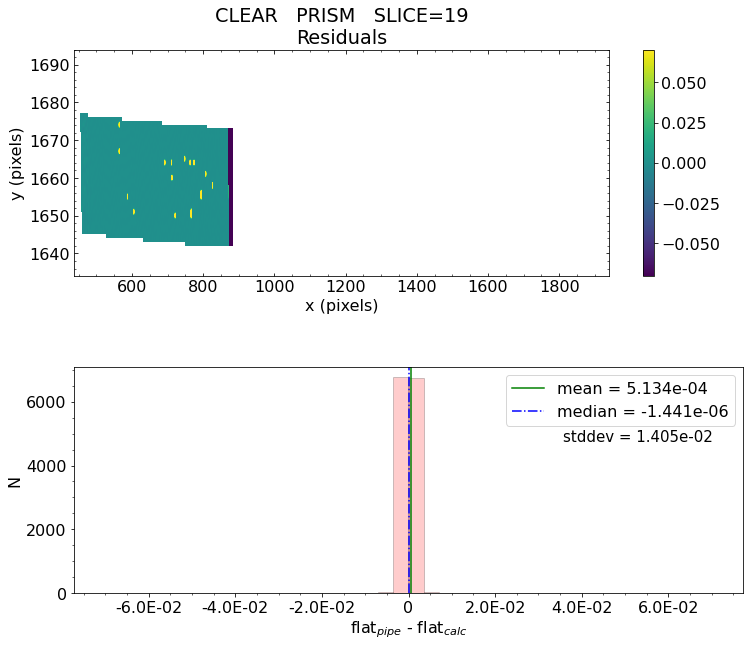

 *** Result of the test: PASSED


Working with slice: 20
 Subwindow origin:   px0=620   py0=286
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 20

   Absolute Flat Difference  :   mean = 3.888e-04    median = 9.787e-07    stdev = 9.694e-03
    Maximum   AbsoluteFlat Difference = 3.320e-01
    Minimum   AbsoluteFlat Difference = -1.161e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 58%
                            ->  3xtheshold = 21%
                            ->  5xtheshold = 10%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!

Making the plot for this slice...


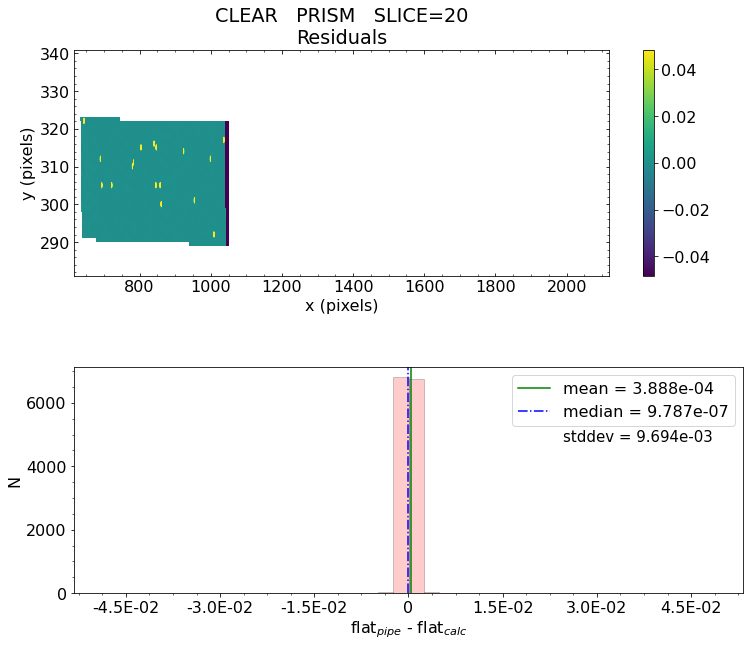

 *** Result of the test: PASSED


Working with slice: 21
 Subwindow origin:   px0=433   py0=1688
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 21

   Absolute Flat Difference  :   mean = 5.282e-04    median = 2.358e-06    stdev = 1.421e-02
    Maximum   AbsoluteFlat Difference = 4.832e-01
    Minimum   AbsoluteFlat Difference = -1.063e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 62%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 12%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


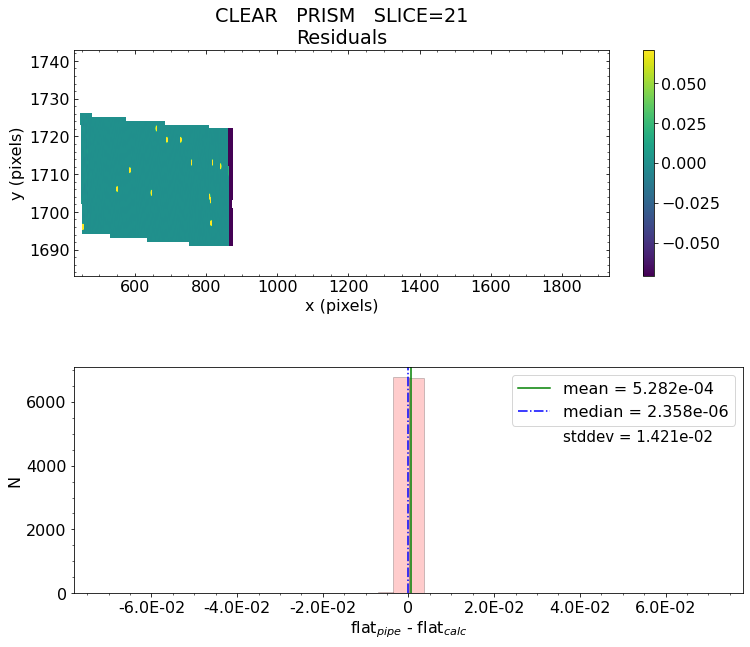

 *** Result of the test: PASSED


Working with slice: 22
 Subwindow origin:   px0=626   py0=237
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 22

   Absolute Flat Difference  :   mean = 4.491e-04    median = 8.085e-07    stdev = 1.146e-02
    Maximum   AbsoluteFlat Difference = 3.635e-01
    Minimum   AbsoluteFlat Difference = -4.442e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 58%
                            ->  3xtheshold = 21%
                            ->  5xtheshold = 10%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!

Making the plot for this slice...


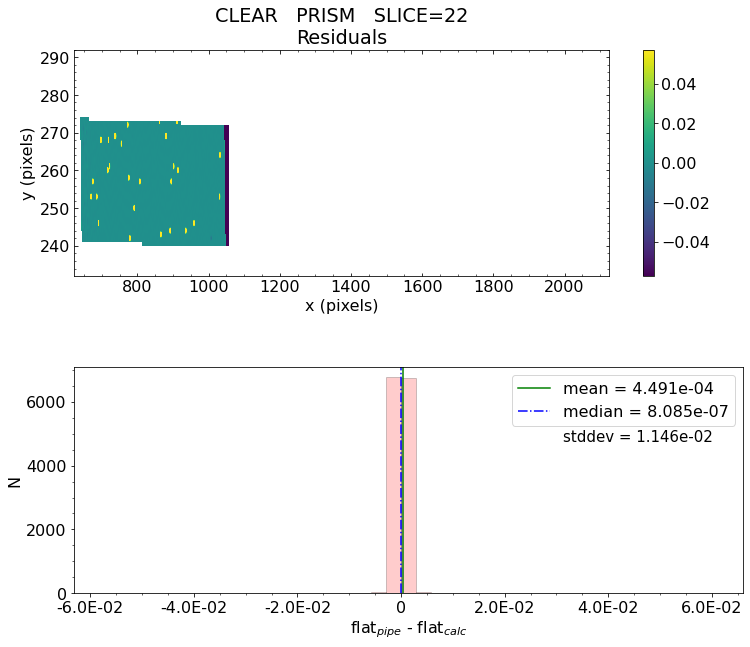

 *** Result of the test: PASSED


Working with slice: 23
 Subwindow origin:   px0=425   py0=1737
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 23

   Absolute Flat Difference  :   mean = 5.628e-04    median = 2.145e-06    stdev = 1.471e-02
    Maximum   AbsoluteFlat Difference = 5.054e-01
    Minimum   AbsoluteFlat Difference = -1.136e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 63%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


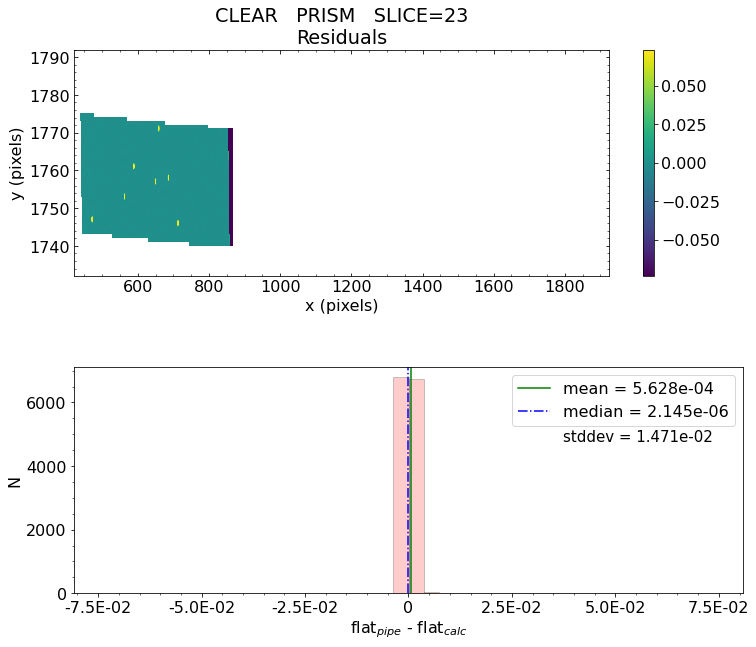

 *** Result of the test: PASSED


Working with slice: 24
 Subwindow origin:   px0=631   py0=187
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 24

   Absolute Flat Difference  :   mean = 4.288e-04    median = 2.904e-06    stdev = 1.111e-02
    Maximum   AbsoluteFlat Difference = 4.153e-01
    Minimum   AbsoluteFlat Difference = -1.016e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 58%
                            ->  3xtheshold = 20%
                            ->  5xtheshold = 10%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!

Making the plot for this slice...


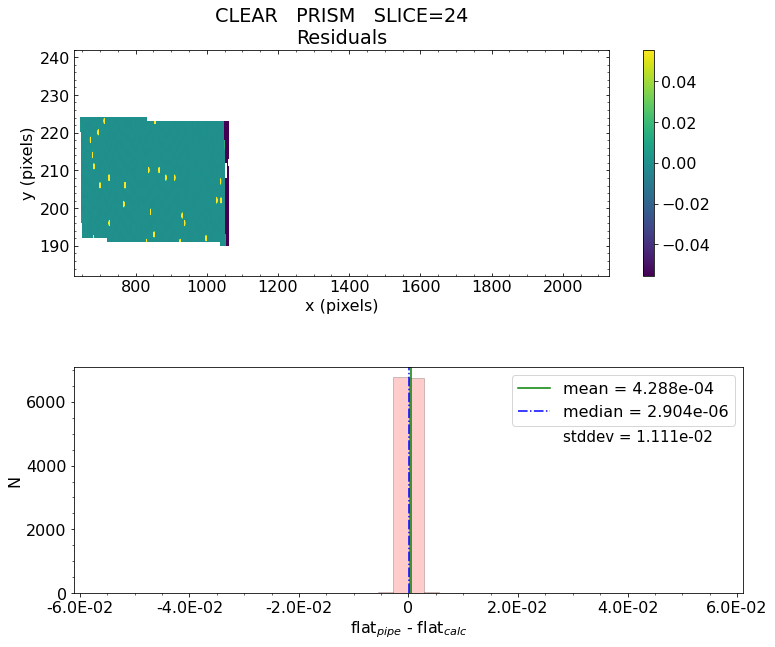

 *** Result of the test: PASSED


Working with slice: 25
 Subwindow origin:   px0=417   py0=1785
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 25

   Absolute Flat Difference  :   mean = 4.891e-04    median = 2.706e-06    stdev = 1.286e-02
    Maximum   AbsoluteFlat Difference = 4.402e-01
    Minimum   AbsoluteFlat Difference = -9.453e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 62%
                            ->  3xtheshold = 23%
                            ->  5xtheshold = 11%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


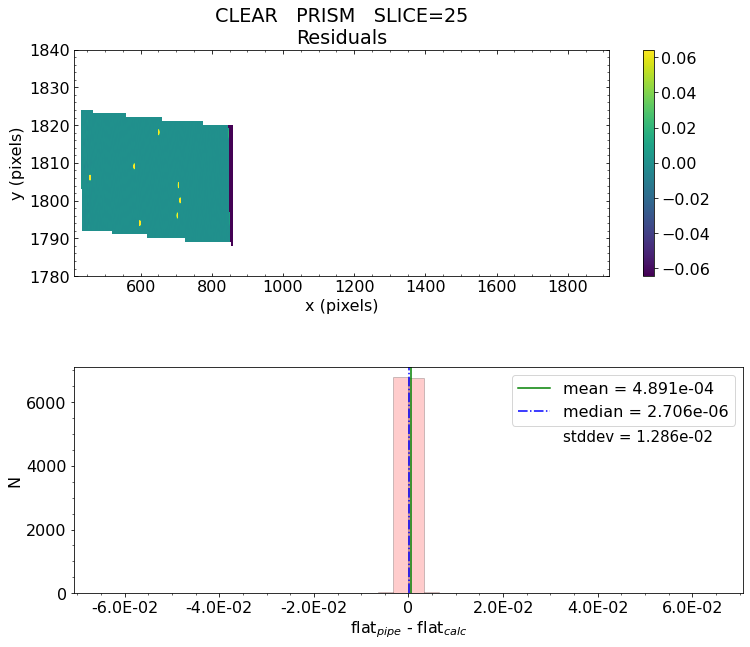

 *** Result of the test: PASSED


Working with slice: 26
 Subwindow origin:   px0=636   py0=138
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 26

   Absolute Flat Difference  :   mean = 4.232e-04    median = 9.655e-07    stdev = 1.083e-02
    Maximum   AbsoluteFlat Difference = 3.777e-01
    Minimum   AbsoluteFlat Difference = -1.013e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 59%
                            ->  3xtheshold = 20%
                            ->  5xtheshold = 10%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!

Making the plot for this slice...


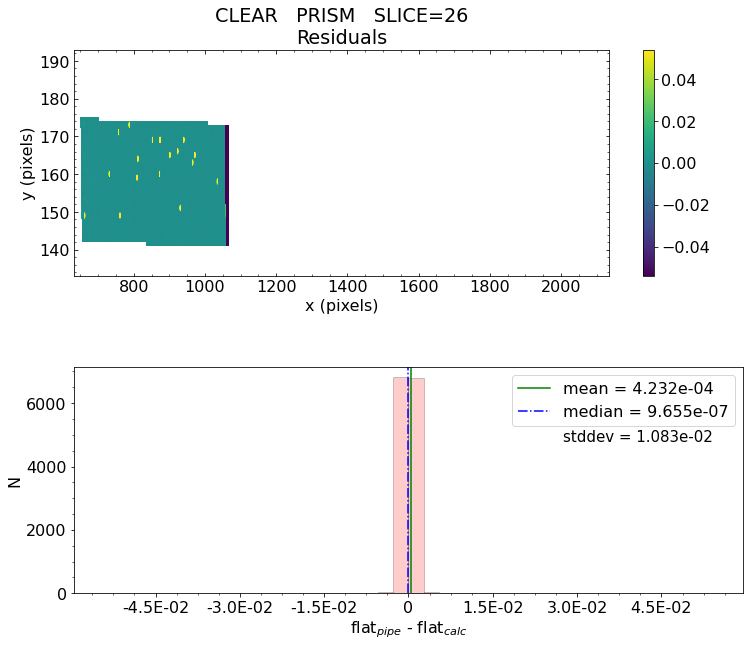

 *** Result of the test: PASSED


Working with slice: 27
 Subwindow origin:   px0=409   py0=1834
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 27

   Absolute Flat Difference  :   mean = 4.272e-04    median = -3.782e-09    stdev = 1.192e-02
    Maximum   AbsoluteFlat Difference = 4.255e-01
    Minimum   AbsoluteFlat Difference = -9.992e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 62%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 12%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


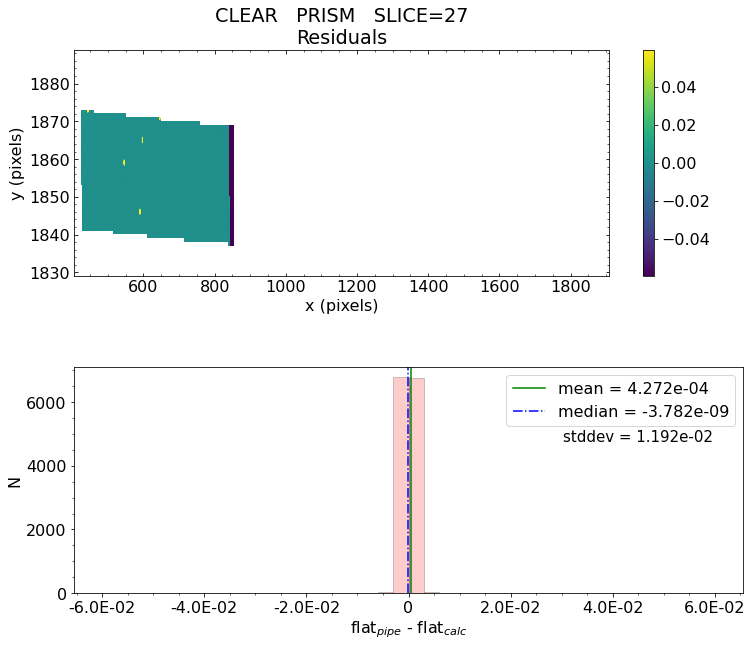

 *** Result of the test: PASSED


Working with slice: 28
 Subwindow origin:   px0=641   py0=88
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 28

   Absolute Flat Difference  :   mean = 4.298e-04    median = -6.644e-08    stdev = 1.061e-02
    Maximum   AbsoluteFlat Difference = 3.701e-01
    Minimum   AbsoluteFlat Difference = -9.064e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 57%
                            ->  3xtheshold = 19%
                            ->  5xtheshold = 10%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!

Making the plot for this slice...


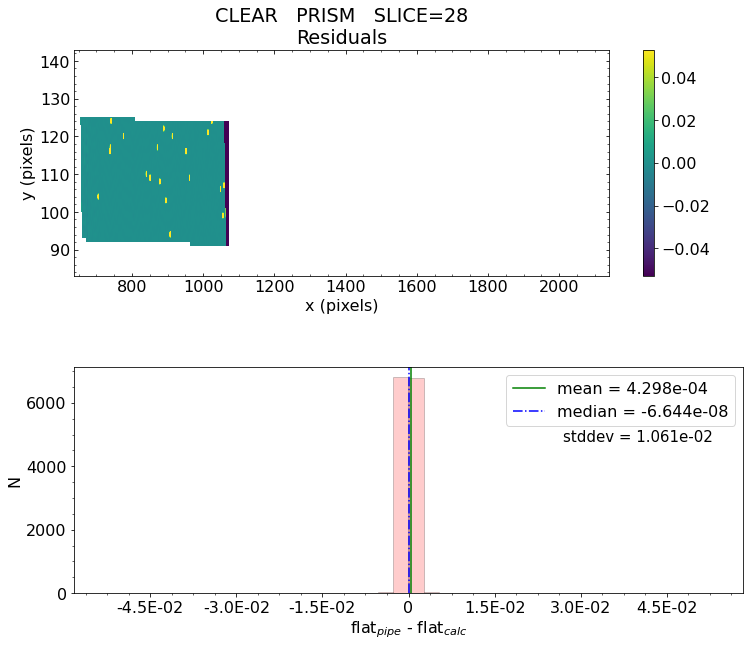

 *** Result of the test: PASSED


Working with slice: 29
 Subwindow origin:   px0=402   py0=1883
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 29

   Absolute Flat Difference  :   mean = 4.693e-04    median = 2.718e-06    stdev = 1.216e-02
    Maximum   AbsoluteFlat Difference = 4.182e-01
    Minimum   AbsoluteFlat Difference = -1.895e-02
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 63%
                            ->  3xtheshold = 24%
                            ->  5xtheshold = 12%

 *** WARNING: More than 10% of pixels have a median value greater than 3xthreshold!


 *** WARNING: More than 10% of pixels have a median value greater than 5xthreshold!

Making the plot for this slice...


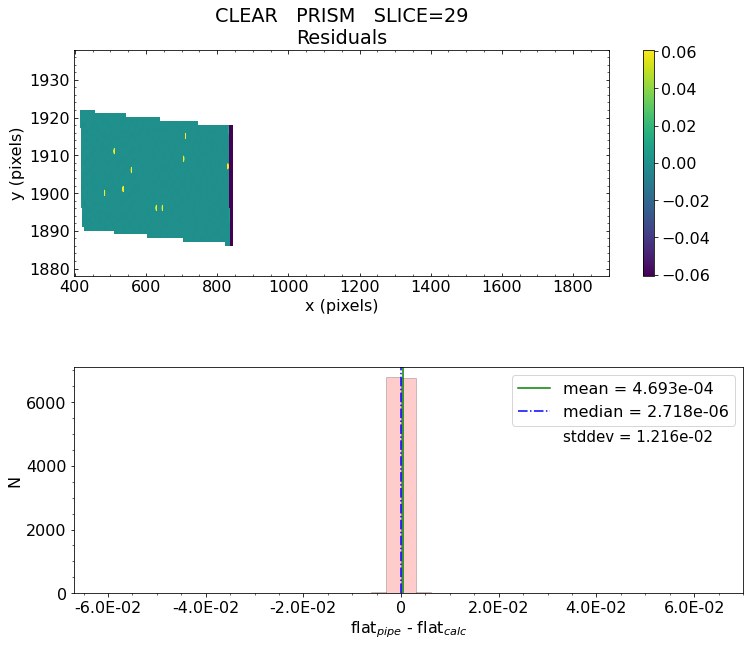

 *** Result of the test: PASSED


 *** Final result for flat_field test will be reported as PASSED *** 

('* Script flattest_ifu.py script took ', '45.916202326615654 minutes to finish.')
Did flat_field validation test passed?  All slices PASSED flat_field test. 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_prism_nrs1_interpolatedflat.fits', fd=47, position=16804800, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs1_f_01.03.fits', fd=48, position=680480640, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_IFU_sflat_PRISM_OPAQUE_FLAT5_nrs1_f_01.01.fits', fd=49, position=50463360, mode='r', flags=557056) 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_vali

Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_prism_nrs2_uncal.fits


2021-06-04 00:43:17,701 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-04 00:43:17,718 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-04 00:43:17,720 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-04 00:43:17,722 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-04 00:43:17,724 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-04 00:43:17,725 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-04 00:43:17,727 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-04 00:43:17,728 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-04 00:43:17,730 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-04 00:43:17,731 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-04 00:43:17,733 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-04 00:43:17,734 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-04 00:43:17,736 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-04 00:43:17,737 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-04 00:43:17,738 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-04 00:43:17,740 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-04 00:43:17,741 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-04 00:43:17,743 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_prism_nrs2_uncal.fits' mode='rb' closefd=True>
  gc.collect()
2021-06-04 00:43:19,193 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_prism_nrs2_uncal.fits',).


2021-06-04 00:43:19,211 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-04 00:43:19,379 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'ifu_prism_nrs2_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-04 00:43:19,390 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0143.fits'.


2021-06-04 00:43:19,393 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits'.


2021-06-04 00:43:19,395 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0021.fits'.


2021-06-04 00:43:19,397 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0025.fits'.


2021-06-04 00:43:19,399 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-04 00:43:19,400 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0016.fits'.


2021-06-04 00:43:19,402 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2021-06-04 00:43:19,403 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-04 00:43:19,404 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-04 00:43:19,406 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0021.fits'.


2021-06-04 00:43:19,409 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0104.fits'.


2021-06-04 00:43:19,411 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-04 00:43:19,411 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-04 00:43:19,412 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-04 00:43:20,415 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:43:20,418 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:43:20,613 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-04 00:43:20,616 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-04 00:43:20,621 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-04 00:43:21,154 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:43:21,160 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:43:21,183 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0025.fits


2021-06-04 00:43:21,669 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-04 00:43:22,076 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:43:22,079 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:43:22,099 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0021.fits


2021-06-04 00:43:22,890 - stpipe.Detector1Pipeline.saturation - INFO - Detected 2388 saturated pixels


2021-06-04 00:43:22,945 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-04 00:43:22,957 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-04 00:43:23,331 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:43:23,334 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:43:23,335 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-04 00:43:23,337 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-04 00:43:23,681 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:43:23,683 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:43:23,711 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0104.fits


2021-06-04 00:43:24,347 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-04 00:43:24,700 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:43:24,703 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-04 00:43:24,712 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2021-06-04 00:43:24,714 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2021-06-04 00:43:24,715 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2021-06-04 00:43:24,715 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.000000


2021-06-04 00:43:24,716 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = True


2021-06-04 00:43:31,462 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-04 00:43:31,931 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:43:31,934 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:43:31,958 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0021.fits


2021-06-04 00:43:33,635 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-04 00:43:33,985 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:43:33,987 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-04 00:43:34,009 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0143.fits


2021-06-04 00:43:34,235 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=10, nframes=1, groupgap=0


2021-06-04 00:43:34,237 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=10, nframes=1, groupgap=0


2021-06-04 00:43:34,741 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-04 00:43:35,132 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:43:35,135 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-04 00:43:35,145 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 4 sigma


2021-06-04 00:43:35,158 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits


2021-06-04 00:43:35,225 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0016.fits


2021-06-04 00:43:35,275 - stpipe.Detector1Pipeline.jump - INFO - Found 32 possible cores to use for jump detection 


2021-06-04 00:43:35,589 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2021-06-04 00:43:35,993 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2021-06-04 00:43:38,926 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier Two-point found 16206 pixels with at least one CR


2021-06-04 00:43:39,771 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 4.18091 sec


2021-06-04 00:43:39,775 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 4.630124


2021-06-04 00:43:39,779 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-04 00:43:40,315 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 10, 2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:43:40,317 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-04 00:43:40,357 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0016.fits


2021-06-04 00:43:40,417 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0018.fits


2021-06-04 00:43:40,467 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-04 00:43:40,468 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:872: RuntimeWarning: invalid value encountered in multiply
  var_p4[num_int,:,:,:] *= ( segs_4[num_int,:,:,:] > 0)


2021-06-04 00:44:28,989 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 10


2021-06-04 00:44:28,992 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


2021-06-04 00:44:29,188 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-04 00:44:29,795 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<IFUImageModel(2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:44:29,797 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:44:29,887 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-04 00:44:29,888 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-04 00:44:29,890 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-04 00:44:30,320 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:44:30,322 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:44:30,391 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2021-06-04 00:44:30,392 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2021-06-04 00:44:30,395 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-04 00:44:30,396 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-04 00:44:30,397 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-04 00:44:30,408 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-04 00:44:30,844 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<IFUImageModel(2048, 2048) from ifu_prism_nrs2_uncal.fits>,).


2021-06-04 00:44:30,846 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-04 00:44:31,006 - stpipe.AssignWcsStep - CRITICAL - No IFU slices fall on detector NRS2


No open slits fall on detector  nrs2
Skipping test for this file. 

Did flat_field validation test passed?  skipped 


Testing files for detector:  nrs1


Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_g395h_f290lp_nrs1_uncal.fits


2021-06-04 00:44:37,151 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-04 00:44:37,173 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-04 00:44:37,175 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-04 00:44:37,176 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-04 00:44:37,178 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-04 00:44:37,179 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-04 00:44:37,181 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-04 00:44:37,182 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-04 00:44:37,183 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-04 00:44:37,185 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-04 00:44:37,186 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-04 00:44:37,188 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-04 00:44:37,189 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-04 00:44:37,190 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-04 00:44:37,192 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-04 00:44:37,193 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-04 00:44:37,194 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-04 00:44:37,196 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_g395h_f290lp_nrs1_uncal.fits' mode='rb' closefd=True>
  gc.collect()
2021-06-04 00:44:37,733 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_g395h_f290lp_nrs1_uncal.fits',).


2021-06-04 00:44:37,745 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-04 00:44:38,013 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'ifu_g395h_f290lp_nrs1_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-04 00:44:38,031 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0088.fits'.


2021-06-04 00:44:38,034 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0023.fits'.


2021-06-04 00:44:38,036 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0022.fits'.


2021-06-04 00:44:38,038 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0010.fits'.


2021-06-04 00:44:38,040 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-04 00:44:38,040 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0018.fits'.


2021-06-04 00:44:38,042 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_refpix_0019.fits'.


2021-06-04 00:44:38,044 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-04 00:44:38,045 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-04 00:44:38,045 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0027.fits'.


2021-06-04 00:44:38,047 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0117.fits'.


2021-06-04 00:44:38,050 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-04 00:44:38,050 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-04 00:44:38,052 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-04 00:44:39,218 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:44:39,220 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:44:39,814 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-04 00:44:39,815 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-04 00:44:39,817 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-04 00:44:40,115 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:44:40,116 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:44:40,137 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0010.fits


2021-06-04 00:44:41,467 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-04 00:44:41,798 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:44:41,800 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:44:41,821 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0027.fits


2021-06-04 00:44:45,190 - stpipe.Detector1Pipeline.saturation - INFO - Detected 131958 saturated pixels


2021-06-04 00:44:45,392 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-04 00:44:45,412 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-04 00:44:45,775 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:44:45,777 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:44:45,778 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-04 00:44:45,780 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-04 00:44:46,066 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:44:46,068 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:44:46,090 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0117.fits


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stdatamodels/validate.py:34: ValidationWarning: While validating meta.exposure.readpatt the following error occurred:
'ALLIRS2' is not one of ['ACQ1', 'ACQ2', 'BRIGHT1', 'BRIGHT2', 'DEEP2', 'DEEP8', 'FAST', 'FASTGRPAVG', 'FASTGRPAVG8', 'FASTGRPAVG16', 'FASTGRPAVG32', 'FASTGRPAVG64', 'FASTR1', 'FASTR100', 'FGS', 'FGS60', 'FGS8370', 'FGS840', 'FGSRAPID', 'FINEGUIDE', 'ID', 'MEDIUM2', 'MEDIUM8', 'NIS', 'NISRAPID', 'NRS', 'NRSIRS2', 'NRSN16R4', 'NRSN32R8', 'NRSN8R2', 'NRSRAPID', 'NRSIRS2RAPID', 'NRSRAPIDD1', 'NRSRAPIDD2', 'NRSRAPIDD6', 'NRSSLOW', 'RAPID', 'SHALLOW2', 'SHALLOW4', 'SLOW', 'SLOWR1', 'TRACK', 'ANY', 'N/A']

Failed validating 'enum' in schema:
    OrderedDict([('title', 'Readout pattern'),
                 ('type', 'string'),
                 ('enum',
                  ['ACQ1',
                   'ACQ2',
                   'BRIGHT1',


2021-06-04 00:44:49,468 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-04 00:44:49,791 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:44:49,793 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-04 00:44:49,815 - stpipe.Detector1Pipeline.refpix - INFO - Using refpix reference file: /grp/crds/cache/references/jwst/jwst_nirspec_refpix_0019.fits


2021-06-04 00:46:07,631 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-04 00:46:08,198 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:46:08,200 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:46:08,229 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0022.fits


2021-06-04 00:46:09,043 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword BAD_LIN_CORR does not correspond to an existing DQ mnemonic, so will be ignored


2021-06-04 00:46:11,081 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-04 00:46:11,449 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:46:11,451 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-04 00:46:11,806 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0088.fits


2021-06-04 00:46:51,704 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=20, nframes=1, groupgap=0


2021-06-04 00:46:51,710 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=65, nframes=1, groupgap=0


2021-06-04 00:46:53,311 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-04 00:46:54,414 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:46:54,417 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-04 00:46:54,604 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 4 sigma


2021-06-04 00:46:54,853 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0023.fits


2021-06-04 00:46:55,350 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0018.fits


2021-06-04 00:46:55,408 - stpipe.Detector1Pipeline.jump - INFO - Found 32 possible cores to use for jump detection 


2021-06-04 00:46:56,438 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2021-06-04 00:46:57,393 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2021-06-04 00:47:01,862 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier Two-point found 86673 pixels with at least one CR


2021-06-04 00:47:08,626 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 12.1862 sec


2021-06-04 00:47:08,629 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 14.025415


2021-06-04 00:47:08,634 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-04 00:47:09,369 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:47:09,371 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-04 00:47:10,049 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0018.fits


2021-06-04 00:47:10,110 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0023.fits


2021-06-04 00:47:10,138 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-04 00:47:10,139 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:872: RuntimeWarning: invalid value encountered in multiply
  var_p4[num_int,:,:,:] *= ( segs_4[num_int,:,:,:] > 0)


2021-06-04 00:50:11,059 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 20


2021-06-04 00:50:11,061 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


2021-06-04 00:50:11,239 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-04 00:50:12,151 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:50:12,157 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:50:12,253 - stpipe.Detector1Pipeline.gain_scale - INFO - Rescaling by 1.0


2021-06-04 00:50:12,267 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-04 00:50:12,846 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:50:12,848 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 00:50:12,939 - stpipe.Detector1Pipeline.gain_scale - INFO - Rescaling by 1.0


2021-06-04 00:50:12,954 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-04 00:50:12,956 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-04 00:50:12,958 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-04 00:50:12,972 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-04 00:50:13,608 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:50:13,611 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-04 00:50:13,822 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.1448970586061478 deg


2021-06-04 00:50:13,823 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3232757747173309 deg


2021-06-04 00:50:13,825 - stpipe.AssignWcsStep - INFO - theta_y correction: -3.766823889842878e-13 deg


2021-06-04 00:50:13,826 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-04 00:50:18,293 - stpipe.AssignWcsStep - INFO - Created a NIRSPEC nrs_ifu pipeline with references {'distortion': None, 'filteroffset': None, 'specwcs': None, 'regions': None, 'wavelengthrange': '/grp/crds/cache/references/jwst/jwst_nirspec_wavelengthrange_0004.asdf', 'camera': '/grp/crds/cache/references/jwst/jwst_nirspec_camera_0004.asdf', 'collimator': '/grp/crds/cache/references/jwst/jwst_nirspec_collimator_0004.asdf', 'disperser': '/grp/crds/cache/references/jwst/jwst_nirspec_disperser_0035.asdf', 'fore': '/grp/crds/cache/references/jwst/jwst_nirspec_fore_0022.asdf', 'fpa': '/grp/crds/cache/references/jwst/jwst_nirspec_fpa_0005.asdf', 'msa': '/grp/crds/cache/references/jwst/jwst_nirspec_msa_0005.asdf', 'ote': '/grp/crds/cache/references/jwst/jwst_nirspec_ote_0005.asdf', 'ifupost': '/grp/crds/cache/references/jwst/jwst_nirspec_ifupost_0004.asdf', 'ifufore': '/grp/crds/cache/references/jwst/jwst_nirspec_ifufore_0003.asdf', 'ifuslicer': '/grp/crds/cache/references/jwst/jwst_n

/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


2021-06-04 00:51:28,573 - stpipe.AssignWcsStep - INFO - Update S_REGION to POLYGON ICRS  156.176999392 -45.687618156 156.178775679 -45.687618156 156.178775679 -45.686331563 156.176999392 -45.686331563


2021-06-04 00:51:28,575 - stpipe.AssignWcsStep - INFO - COMPLETED assign_wcs


2021-06-04 00:51:28,581 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep done


2021-06-04 00:51:28,595 - stpipe.MSAFlagOpenStep - INFO - MSAFlagOpenStep instance created.


2021-06-04 00:51:29,558 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:51:29,565 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-04 00:51:29,592 - stpipe.MSAFlagOpenStep - INFO - Using reference file /grp/crds/cache/references/jwst/jwst_nirspec_msaoper_0001.json


2021-06-04 00:51:29,594 - stpipe.JwstStep - INFO - JwstStep instance created.


2021-06-04 00:51:29,744 - stpipe.MSAFlagOpenStep - INFO - gwa_ytilt is 0.1448970586061478 deg


2021-06-04 00:51:29,746 - stpipe.MSAFlagOpenStep - INFO - gwa_xtilt is 0.3232757747173309 deg


2021-06-04 00:51:29,747 - stpipe.MSAFlagOpenStep - INFO - theta_y correction: -3.766823889842878e-13 deg


2021-06-04 00:51:29,749 - stpipe.MSAFlagOpenStep - INFO - theta_x correction: 0.0 deg


2021-06-04 00:51:29,761 - stpipe.MSAFlagOpenStep - INFO - SPORDER= -1, wrange=[2.87e-06, 5.27e-06]


2021-06-04 00:51:29,889 - stpipe.MSAFlagOpenStep - INFO - There are 5 open slits in quadrant 1


2021-06-04 00:51:29,936 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 2


2021-06-04 00:51:29,968 - stpipe.MSAFlagOpenStep - INFO - There are 9 open slits in quadrant 3


2021-06-04 00:51:30,049 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 4


2021-06-04 00:51:30,078 - stpipe.MSAFlagOpenStep - INFO - There are 0 open slits in quadrant 5


2021-06-04 00:51:44,753 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep done


2021-06-04 00:51:44,766 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.


2021-06-04 00:51:45,410 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:51:45,416 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-04 00:51:45,424 - stpipe.SourceTypeStep - INFO - Input EXP_TYPE is NRS_IFU


2021-06-04 00:51:45,426 - stpipe.SourceTypeStep - INFO - Input SRCTYAPT = UNKNOWN


2021-06-04 00:51:45,427 - stpipe.SourceTypeStep - INFO - Input source type is unknown; setting default SRCTYPE = EXTENDED


2021-06-04 00:51:45,430 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep done


2021-06-04 00:51:45,444 - stpipe.WavecorrStep - INFO - WavecorrStep instance created.


2021-06-04 00:51:45,777 - stpipe.WavecorrStep - INFO - Step WavecorrStep running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:51:45,779 - stpipe.WavecorrStep - INFO - Step WavecorrStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-04 00:51:45,787 - stpipe.WavecorrStep - INFO - Skipping wavecorr correction for EXP_TYPE NRS_IFU


2021-06-04 00:51:45,789 - stpipe.WavecorrStep - INFO - Step WavecorrStep done


2021-06-04 00:51:45,799 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.


2021-06-04 00:51:46,129 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs1_uncal.fits>,).


2021-06-04 00:51:46,132 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': True, 'user_supplied_flat': None, 'inverse': False}


2021-06-04 00:59:30,535 - stpipe.FlatFieldStep - INFO - Saved model in ifu_g395h_f290lp_nrs1_interpolatedflat.fits


2021-06-04 00:59:30,537 - stpipe.FlatFieldStep - INFO - Interpolated flat written to "ifu_g395h_f290lp_nrs1_interpolatedflat.fits".


2021-06-04 00:59:30,541 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep done


Running flat field test for IFU...


flat_field_file  -->     Grating:G395H   Filter:F290LP   LAMP:REF
Getting and reading the D-, S-, and F-flats for this specific IFU configuration... 
Using D-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs1_f_01.03.fits
Using S-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_IFU_sflat_G395H_OPAQUE_FLAT3_nrs1_f_01.01.fits
Using F-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_IFU_fflat_F290LP_01.01.fits

 Now looping through the slices, this may take some time... 

Working with slice: 00
 Subwindow origin:   px0=275   py0=781
 Looping through the wavelength, this may take a little time ... 


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/utils.py:72: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  indx = np.asarray(np.floor(np.asarray(value) + 0.5), dtype=np.i

Flat value differences for slice number: 00

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice00

Working with slice: 01
 Subwindow origin:   px0=312   py0=1197
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 01

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 29%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice01

Working with slice: 02
 Subwindow origin:   px0=271   py0=731
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 02

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 26%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice02

Working with slice: 03
 Subwindow origin:   px0=317   py0=1246


 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 03

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 28%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice03

Working with slice: 04
 Subwindow origin:   px0=266   py0=682
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 04

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 26%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice04

Working with slice: 05
 Subwindow origin:   px0=321   py0=1296
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 05

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 28%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice05

Working with slice: 06
 Subwindow origin:   px0=262   py0=633
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 06

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 26%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice06

Working with slice: 07
 Subwindow origin:   px0=326   py0=1345
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 07

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 29%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice07

Working with slice: 08
 Subwindow origin:   px0=258   py0=584
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 08

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 26%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice08

Working with slice: 09


 Subwindow origin:   px0=331   py0=1394
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 09

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 29%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice09

Working with slice: 10
 Subwindow origin:   px0=254   py0=534
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 10

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice10

Working with slice: 11
 Subwindow origin:   px0=336   py0=1442
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 11

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 29%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice11

Working with slice: 12
 Subwindow origin:   px0=250   py0=485
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 12

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice12

Working with slice: 13
 Subwindow origin:   px0=340   py0=1491
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 13

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 29%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice13

Working with slice: 14
 Subwindow origin:   px0=246   py0=436


 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 14

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice14

Working with slice: 15
 Subwindow origin:   px0=345   py0=1540
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 15

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 29%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice15

Working with slice: 16
 Subwindow origin:   px0=242   py0=386
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 16

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice16

Working with slice: 17
 Subwindow origin:   px0=350   py0=1589
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 17

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 29%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice17

Working with slice: 18
 Subwindow origin:   px0=238   py0=337
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 18

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice18

Working with slice: 19
 Subwindow origin:   px0=355   py0=1638
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 19

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 29%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice19

Working with slice: 20
 Subwindow origin:   px0=235   py0=288
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 20

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 24%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice20

Working with slice: 21
 Subwindow origin:   px0=360   py0=1687
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 21

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 30%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice21

Working with slice: 22
 Subwindow origin:   px0=231   py0=238


 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 22

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 24%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice22

Working with slice: 23
 Subwindow origin:   px0=365   py0=1736
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 23

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 29%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice23

Working with slice: 24
 Subwindow origin:   px0=227   py0=189
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 24

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice24

Working with slice: 25
 Subwindow origin:   px0=370   py0=1784
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 25

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 30%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice25

Working with slice: 26
 Subwindow origin:   px0=223   py0=140
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 26

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 25%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice26

Working with slice: 27
 Subwindow origin:   px0=375   py0=1833
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 27

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 30%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice27

Working with slice: 28
 Subwindow origin:   px0=219   py0=90
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 28

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 20%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice28

Working with slice: 29
 Subwindow origin:   px0=380   py0=1882
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 29

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 31%
                            ->  3xtheshold = 1%
                            ->  5xtheshold = 0%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice29

 *** Final result for flat_field test will be reported as FAILED *** 

('* Script flattest_ifu.py script took ', '42.210102407137555 minutes to finish.')
Did flat_field validation test passed?  One or more slices FAILED flat_field test. 


Testing files for detector:  nrs2


Working with uncal_file:  /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_g395h_f290lp_nrs2_uncal.fits


2021-06-04 01:41:50,884 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: /grp/crds/cache/references/jwst/jwst_nirspec_pars-detector1pipeline_0004.asdf


2021-06-04 01:41:50,902 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2021-06-04 01:41:50,904 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2021-06-04 01:41:50,906 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2021-06-04 01:41:50,908 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2021-06-04 01:41:50,910 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2021-06-04 01:41:50,912 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2021-06-04 01:41:50,914 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2021-06-04 01:41:50,916 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2021-06-04 01:41:50,918 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2021-06-04 01:41:50,920 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2021-06-04 01:41:50,922 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2021-06-04 01:41:50,923 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2021-06-04 01:41:50,925 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2021-06-04 01:41:50,927 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2021-06-04 01:41:50,929 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2021-06-04 01:41:50,931 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2021-06-04 01:41:50,935 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stpipe/step.py:359: ResourceWarning: unclosed file <_io.FileIO name='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_g395h_f290lp_nrs2_uncal.fits' mode='rb' closefd=True>
  gc.collect()
2021-06-04 01:41:51,718 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_g395h_f290lp_nrs2_uncal.fits',).


2021-06-04 01:41:51,732 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'outp

2021-06-04 01:41:52,034 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'ifu_g395h_f290lp_nrs2_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2021-06-04 01:41:52,052 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_dark_0085.fits'.


2021-06-04 01:41:52,054 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_gain_0020.fits'.


2021-06-04 01:41:52,057 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_linearity_0025.fits'.


2021-06-04 01:41:52,059 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_mask_0011.fits'.


2021-06-04 01:41:52,061 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2021-06-04 01:41:52,062 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0017.fits'.


2021-06-04 01:41:52,064 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_refpix_0018.fits'.


2021-06-04 01:41:52,067 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2021-06-04 01:41:52,068 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2021-06-04 01:41:52,068 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_saturation_0026.fits'.


2021-06-04 01:41:52,071 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is '/grp/crds/cache/references/jwst/jwst_nirspec_superbias_0118.fits'.


2021-06-04 01:41:52,073 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2021-06-04 01:41:52,073 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2021-06-04 01:41:52,075 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2021-06-04 01:41:53,374 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:41:53,377 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 01:41:53,942 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2021-06-04 01:41:53,943 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2021-06-04 01:41:53,945 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2021-06-04 01:41:54,267 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:41:54,269 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 01:41:54,290 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_nirspec_mask_0011.fits


2021-06-04 01:41:55,629 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2021-06-04 01:41:55,991 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:41:55,994 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 01:41:56,015 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_nirspec_saturation_0026.fits


2021-06-04 01:41:59,862 - stpipe.Detector1Pipeline.saturation - INFO - Detected 151502 saturated pixels


2021-06-04 01:42:00,146 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2021-06-04 01:42:00,172 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2021-06-04 01:42:00,634 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:42:00,636 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 01:42:00,637 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2021-06-04 01:42:00,639 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2021-06-04 01:42:00,951 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:42:00,954 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 01:42:00,977 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file /grp/crds/cache/references/jwst/jwst_nirspec_superbias_0118.fits


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/stdatamodels/validate.py:34: ValidationWarning: While validating meta.exposure.readpatt the following error occurred:
'ALLIRS2' is not one of ['ACQ1', 'ACQ2', 'BRIGHT1', 'BRIGHT2', 'DEEP2', 'DEEP8', 'FAST', 'FASTGRPAVG', 'FASTGRPAVG8', 'FASTGRPAVG16', 'FASTGRPAVG32', 'FASTGRPAVG64', 'FASTR1', 'FASTR100', 'FGS', 'FGS60', 'FGS8370', 'FGS840', 'FGSRAPID', 'FINEGUIDE', 'ID', 'MEDIUM2', 'MEDIUM8', 'NIS', 'NISRAPID', 'NRS', 'NRSIRS2', 'NRSN16R4', 'NRSN32R8', 'NRSN8R2', 'NRSRAPID', 'NRSIRS2RAPID', 'NRSRAPIDD1', 'NRSRAPIDD2', 'NRSRAPIDD6', 'NRSSLOW', 'RAPID', 'SHALLOW2', 'SHALLOW4', 'SLOW', 'SLOWR1', 'TRACK', 'ANY', 'N/A']

Failed validating 'enum' in schema:
    OrderedDict([('title', 'Readout pattern'),
                 ('type', 'string'),
                 ('enum',
                  ['ACQ1',
                   'ACQ2',
                   'BRIGHT1',


2021-06-04 01:42:05,986 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2021-06-04 01:42:06,361 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:42:06,363 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2021-06-04 01:42:06,386 - stpipe.Detector1Pipeline.refpix - INFO - Using refpix reference file: /grp/crds/cache/references/jwst/jwst_nirspec_refpix_0018.fits


2021-06-04 01:43:39,679 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2021-06-04 01:43:40,399 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:43:40,401 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 01:43:40,429 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_nirspec_linearity_0025.fits


2021-06-04 01:43:41,879 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword BAD_LIN_CORR does not correspond to an existing DQ mnemonic, so will be ignored


2021-06-04 01:43:44,266 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2021-06-04 01:43:44,709 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:43:44,712 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'dark_output': None}


2021-06-04 01:43:45,146 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_nirspec_dark_0085.fits


2021-06-04 01:44:22,700 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=20, nframes=1, groupgap=0


2021-06-04 01:44:22,702 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=65, nframes=1, groupgap=0


2021-06-04 01:44:24,446 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2021-06-04 01:44:25,846 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:44:25,850 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'rejection_threshold': 4.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 200.0, 'min_jump_to_flag_neighbors': 10.0}


2021-06-04 01:44:26,251 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 4 sigma


2021-06-04 01:44:26,546 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0020.fits


2021-06-04 01:44:27,401 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0017.fits


2021-06-04 01:44:27,508 - stpipe.Detector1Pipeline.jump - INFO - Found 32 possible cores to use for jump detection 


2021-06-04 01:44:28,706 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2021-06-04 01:44:29,742 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2021-06-04 01:44:34,378 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier Two-point found 83533 pixels with at least one CR


2021-06-04 01:44:42,298 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 13.5905 sec


2021-06-04 01:44:42,306 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 16.055266


2021-06-04 01:44:42,313 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2021-06-04 01:44:43,363 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 20, 3200, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:44:43,365 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2021-06-04 01:44:44,115 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /grp/crds/cache/references/jwst/jwst_nirspec_readnoise_0017.fits


2021-06-04 01:44:44,178 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_nirspec_gain_0020.fits


2021-06-04 01:44:44,205 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2021-06-04 01:44:44,206 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/jwst/ramp_fitting/ramp_fit.py:872: RuntimeWarning: invalid value encountered in multiply
  var_p4[num_int,:,:,:] *= ( segs_4[num_int,:,:,:] > 0)


2021-06-04 01:47:30,485 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 20


2021-06-04 01:47:30,487 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 1


2021-06-04 01:47:30,636 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2021-06-04 01:47:31,519 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:47:31,521 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 01:47:31,592 - stpipe.Detector1Pipeline.gain_scale - INFO - Rescaling by 1.0


2021-06-04 01:47:31,606 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-04 01:47:31,970 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:47:31,972 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': '/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9'}


2021-06-04 01:47:32,060 - stpipe.Detector1Pipeline.gain_scale - INFO - Rescaling by 1.0


2021-06-04 01:47:32,074 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2021-06-04 01:47:32,075 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2021-06-04 01:47:32,076 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2021-06-04 01:47:32,088 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2021-06-04 01:47:32,602 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:47:32,605 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2021-06-04 01:47:32,826 - stpipe.AssignWcsStep - INFO - gwa_ytilt is 0.1448970586061478 deg


2021-06-04 01:47:32,828 - stpipe.AssignWcsStep - INFO - gwa_xtilt is 0.3232757747173309 deg


2021-06-04 01:47:32,829 - stpipe.AssignWcsStep - INFO - theta_y correction: -3.766823889842878e-13 deg


2021-06-04 01:47:32,830 - stpipe.AssignWcsStep - INFO - theta_x correction: 0.0 deg


2021-06-04 01:47:36,866 - stpipe.AssignWcsStep - INFO - Created a NIRSPEC nrs_ifu pipeline with references {'distortion': None, 'filteroffset': None, 'specwcs': None, 'regions': None, 'wavelengthrange': '/grp/crds/cache/references/jwst/jwst_nirspec_wavelengthrange_0004.asdf', 'camera': '/grp/crds/cache/references/jwst/jwst_nirspec_camera_0004.asdf', 'collimator': '/grp/crds/cache/references/jwst/jwst_nirspec_collimator_0004.asdf', 'disperser': '/grp/crds/cache/references/jwst/jwst_nirspec_disperser_0035.asdf', 'fore': '/grp/crds/cache/references/jwst/jwst_nirspec_fore_0022.asdf', 'fpa': '/grp/crds/cache/references/jwst/jwst_nirspec_fpa_0005.asdf', 'msa': '/grp/crds/cache/references/jwst/jwst_nirspec_msa_0005.asdf', 'ote': '/grp/crds/cache/references/jwst/jwst_nirspec_ote_0005.asdf', 'ifupost': '/grp/crds/cache/references/jwst/jwst_nirspec_ifupost_0004.asdf', 'ifufore': '/grp/crds/cache/references/jwst/jwst_nirspec_ifufore_0003.asdf', 'ifuslicer': '/grp/crds/cache/references/jwst/jwst_n

/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)


2021-06-04 01:48:52,765 - stpipe.AssignWcsStep - INFO - Update S_REGION to POLYGON ICRS  156.176996289 -45.687617183 156.178772625 -45.687617183 156.178772625 -45.686330364 156.176996289 -45.686330364


2021-06-04 01:48:52,768 - stpipe.AssignWcsStep - INFO - COMPLETED assign_wcs


2021-06-04 01:48:52,775 - stpipe.AssignWcsStep - INFO - Step AssignWcsStep done


2021-06-04 01:48:52,792 - stpipe.MSAFlagOpenStep - INFO - MSAFlagOpenStep instance created.


2021-06-04 01:48:54,759 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:48:54,767 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-04 01:48:54,795 - stpipe.MSAFlagOpenStep - INFO - Using reference file /grp/crds/cache/references/jwst/jwst_nirspec_msaoper_0001.json


2021-06-04 01:48:54,798 - stpipe.JwstStep - INFO - JwstStep instance created.


2021-06-04 01:48:54,968 - stpipe.MSAFlagOpenStep - INFO - gwa_ytilt is 0.1448970586061478 deg


2021-06-04 01:48:54,969 - stpipe.MSAFlagOpenStep - INFO - gwa_xtilt is 0.3232757747173309 deg


2021-06-04 01:48:54,970 - stpipe.MSAFlagOpenStep - INFO - theta_y correction: -3.766823889842878e-13 deg


2021-06-04 01:48:54,972 - stpipe.MSAFlagOpenStep - INFO - theta_x correction: 0.0 deg


2021-06-04 01:48:54,988 - stpipe.MSAFlagOpenStep - INFO - SPORDER= -1, wrange=[2.87e-06, 5.27e-06]


2021-06-04 01:48:55,118 - stpipe.MSAFlagOpenStep - INFO - There are 5 open slits in quadrant 1


2021-06-04 01:48:55,167 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 2


2021-06-04 01:48:55,199 - stpipe.MSAFlagOpenStep - INFO - There are 9 open slits in quadrant 3


2021-06-04 01:48:55,284 - stpipe.MSAFlagOpenStep - INFO - There are 3 open slits in quadrant 4


2021-06-04 01:48:55,313 - stpipe.MSAFlagOpenStep - INFO - There are 0 open slits in quadrant 5


2021-06-04 01:49:12,785 - stpipe.MSAFlagOpenStep - INFO - Step MSAFlagOpenStep done


2021-06-04 01:49:12,801 - stpipe.SourceTypeStep - INFO - SourceTypeStep instance created.


2021-06-04 01:49:13,495 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:49:13,500 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-04 01:49:13,509 - stpipe.SourceTypeStep - INFO - Input EXP_TYPE is NRS_IFU


2021-06-04 01:49:13,510 - stpipe.SourceTypeStep - INFO - Input SRCTYAPT = UNKNOWN


2021-06-04 01:49:13,511 - stpipe.SourceTypeStep - INFO - Input source type is unknown; setting default SRCTYPE = EXTENDED


2021-06-04 01:49:13,513 - stpipe.SourceTypeStep - INFO - Step SourceTypeStep done


2021-06-04 01:49:13,526 - stpipe.WavecorrStep - INFO - WavecorrStep instance created.


2021-06-04 01:49:13,847 - stpipe.WavecorrStep - INFO - Step WavecorrStep running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:49:13,849 - stpipe.WavecorrStep - INFO - Step WavecorrStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2021-06-04 01:49:13,858 - stpipe.WavecorrStep - INFO - Skipping wavecorr correction for EXP_TYPE NRS_IFU


2021-06-04 01:49:13,860 - stpipe.WavecorrStep - INFO - Step WavecorrStep done


2021-06-04 01:49:13,873 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.


2021-06-04 01:49:14,195 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<IFUImageModel(2048, 2048) from ifu_g395h_f290lp_nrs2_uncal.fits>,).


2021-06-04 01:49:14,197 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': True, 'user_supplied_flat': None, 'inverse': False}


2021-06-04 01:57:00,292 - stpipe.FlatFieldStep - INFO - Saved model in ifu_g395h_f290lp_nrs2_interpolatedflat.fits


2021-06-04 01:57:00,295 - stpipe.FlatFieldStep - INFO - Interpolated flat written to "ifu_g395h_f290lp_nrs2_interpolatedflat.fits".


2021-06-04 01:57:00,299 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep done


Running flat field test for IFU...


flat_field_file  -->     Grating:G395H   Filter:F290LP   LAMP:REF
Getting and reading the D-, S-, and F-flats for this specific IFU configuration... 
Using D-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_dflat_nrs2_f_01.03.fits
Using S-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_IFU_sflat_G395H_OPAQUE_FLAT3_nrs2_f_01.01.fits
Using F-flat: /data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/nirspec_IFU_fflat_F290LP_01.01.fits

 Now looping through the slices, this may take some time... 

Working with slice: 00


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/geometry.py:203: RuntimeWarning: invalid value encountered in remainder
  lon = np.mod(lon, 360.0 * u.deg if nquant else 360.0)
/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/gwcs/utils.py:72: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  indx = np.asarray(np.floor(np.asarray(value) + 0.5), dtype=np.i

 Subwindow origin:   px0=1   py0=781
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 00

   Absolute Flat Difference  :   mean = 3.387e-02    median = 3.263e-06    stdev = 1.233e-01
    Maximum   AbsoluteFlat Difference = 5.518e-01
    Minimum   AbsoluteFlat Difference = -6.043e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 16%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


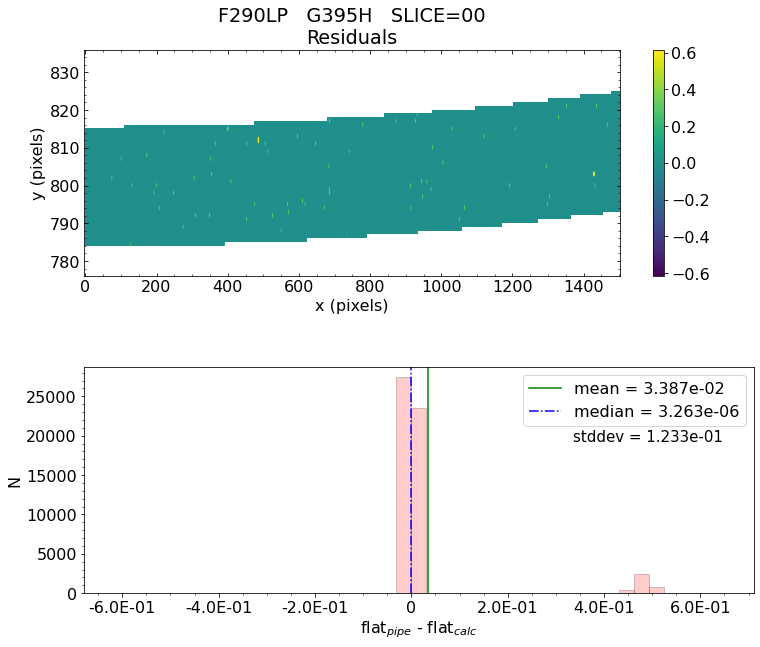

 *** Result of the test: PASSED


Working with slice: 01
 Subwindow origin:   px0=1   py0=1197
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 01

   Absolute Flat Difference  :   mean = 3.327e-02    median = 3.233e-06    stdev = 1.228e-01
    Maximum   AbsoluteFlat Difference = 6.006e-01
    Minimum   AbsoluteFlat Difference = -8.739e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


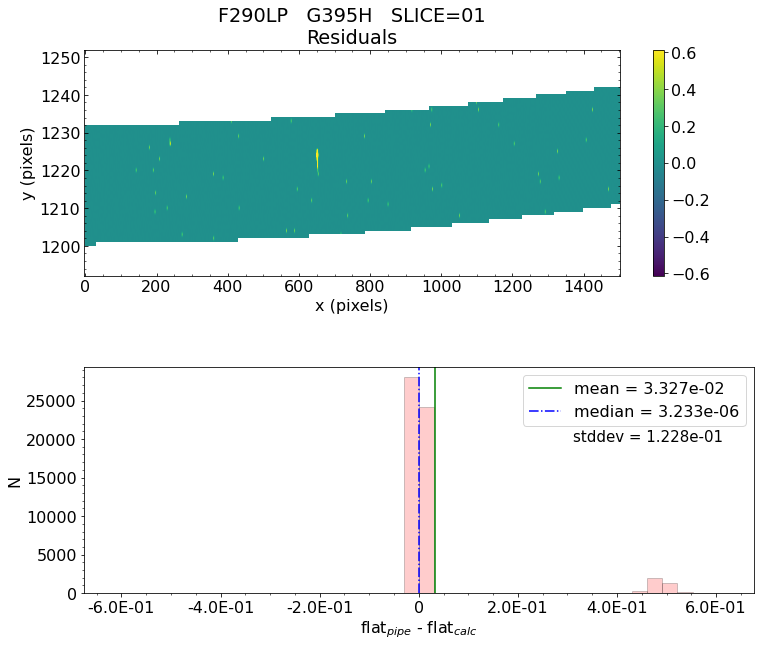

 *** Result of the test: PASSED


Working with slice: 02
 Subwindow origin:   px0=1   py0=731
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 02

   Absolute Flat Difference  :   mean = 3.396e-02    median = 3.377e-06    stdev = 1.236e-01
    Maximum   AbsoluteFlat Difference = 5.776e-01
    Minimum   AbsoluteFlat Difference = -6.725e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


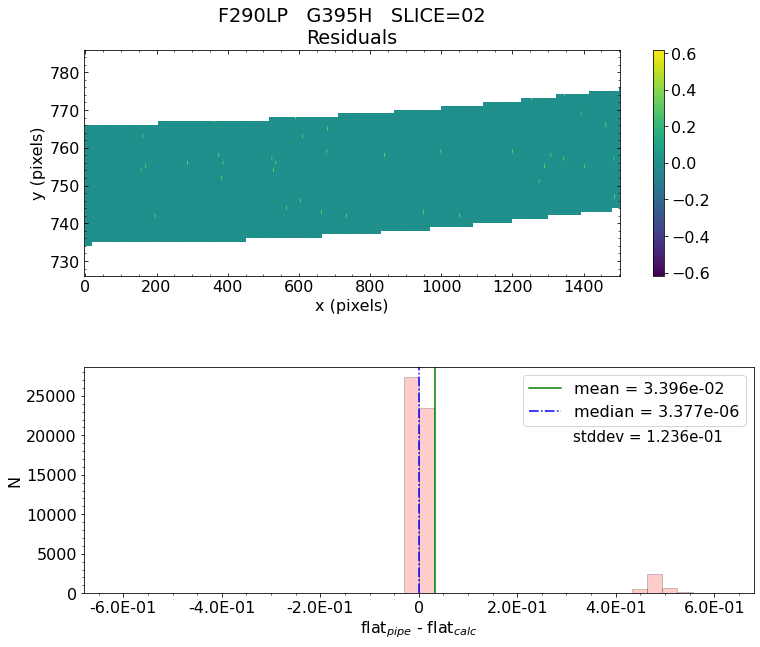

 *** Result of the test: PASSED


Working with slice: 03
 Subwindow origin:   px0=1   py0=1247
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 03

   Absolute Flat Difference  :   mean = 3.309e-02    median = 3.549e-06    stdev = 1.223e-01
    Maximum   AbsoluteFlat Difference = 5.994e-01
    Minimum   AbsoluteFlat Difference = -8.231e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


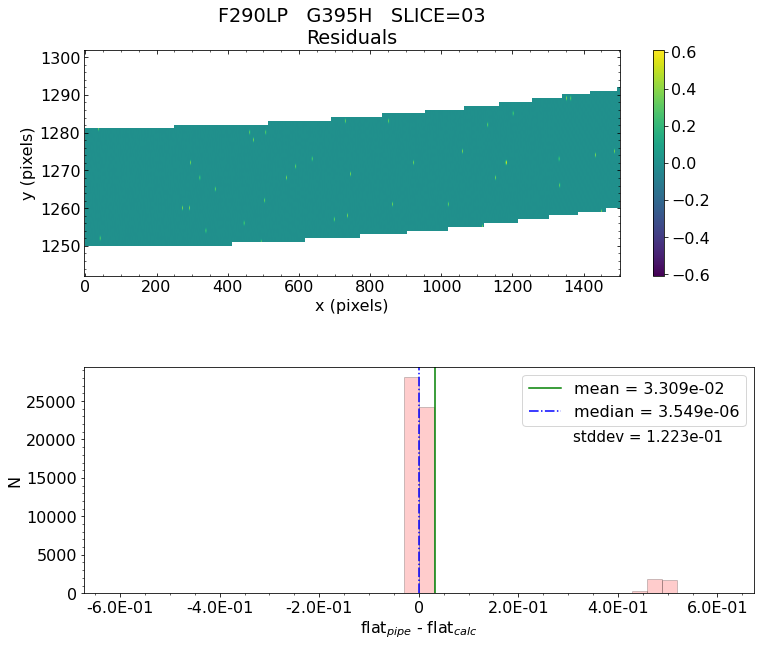

 *** Result of the test: PASSED


Working with slice: 04
 Subwindow origin:   px0=1   py0=682
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 04

   Absolute Flat Difference  :   mean = 3.392e-02    median = 3.349e-06    stdev = 1.234e-01
    Maximum   AbsoluteFlat Difference = 7.639e-01
    Minimum   AbsoluteFlat Difference = -7.885e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


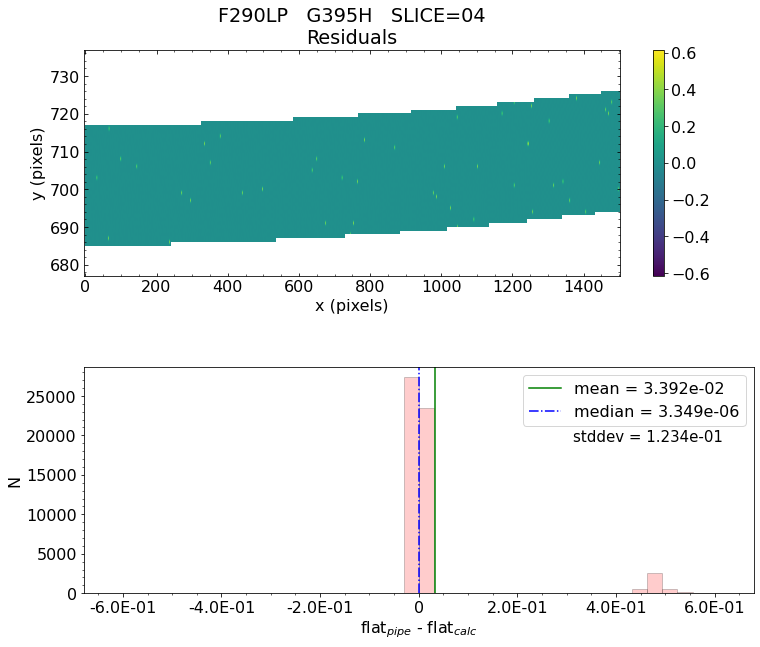

 *** Result of the test: PASSED


Working with slice: 05
 Subwindow origin:   px0=1   py0=1296
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 05

   Absolute Flat Difference  :   mean = 3.308e-02    median = 3.491e-06    stdev = 1.221e-01
    Maximum   AbsoluteFlat Difference = 5.454e-01
    Minimum   AbsoluteFlat Difference = -8.851e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 16%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


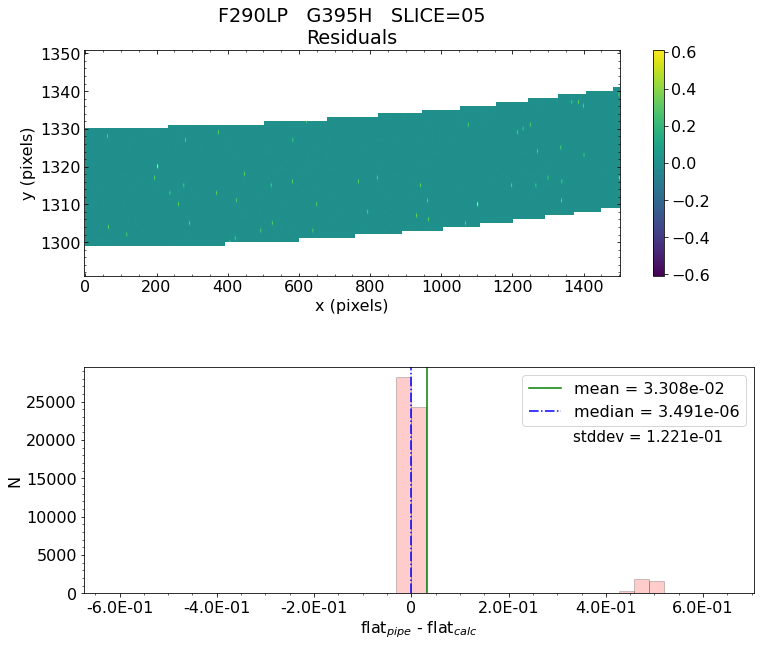

 *** Result of the test: PASSED


Working with slice: 06
 Subwindow origin:   px0=1   py0=633
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 06

   Absolute Flat Difference  :   mean = 3.373e-02    median = 3.471e-06    stdev = 1.226e-01
    Maximum   AbsoluteFlat Difference = 5.672e-01
    Minimum   AbsoluteFlat Difference = -8.686e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


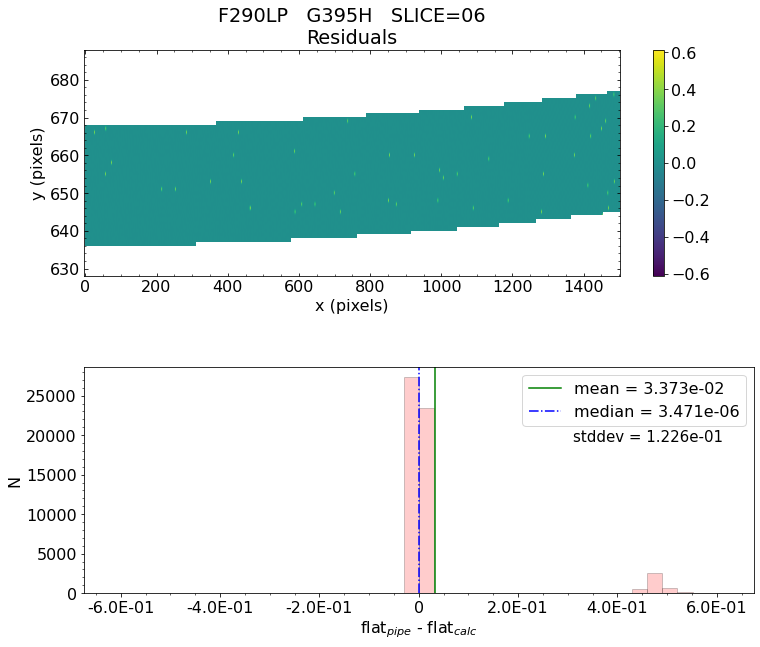

 *** Result of the test: PASSED


Working with slice: 07
 Subwindow origin:   px0=1   py0=1345
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 07

   Absolute Flat Difference  :   mean = 3.277e-02    median = 3.493e-06    stdev = 1.216e-01
    Maximum   AbsoluteFlat Difference = 5.556e-01
    Minimum   AbsoluteFlat Difference = -7.579e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


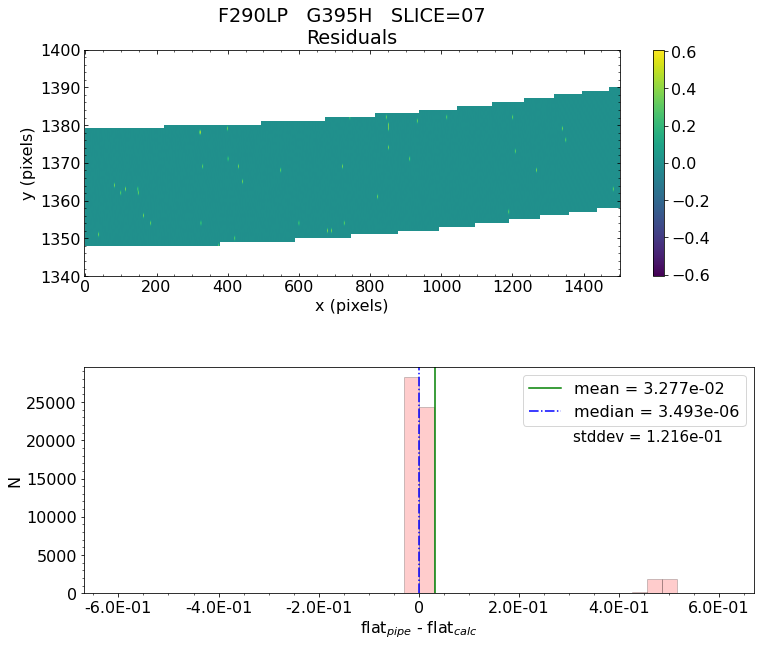

 *** Result of the test: PASSED


Working with slice: 08
 Subwindow origin:   px0=1   py0=584
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 08

   Absolute Flat Difference  :   mean = 3.362e-02    median = 3.319e-06    stdev = 1.221e-01
    Maximum   AbsoluteFlat Difference = 5.590e-01
    Minimum   AbsoluteFlat Difference = -8.838e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


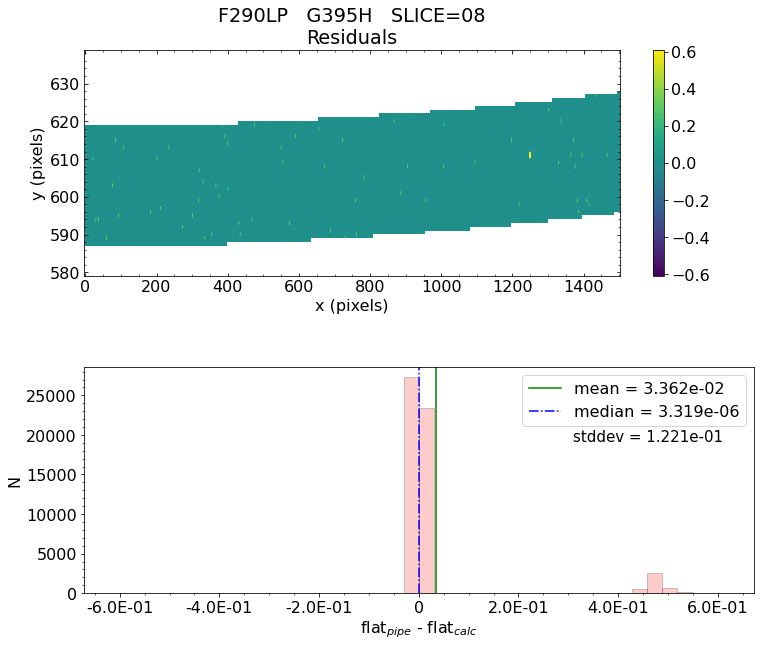

 *** Result of the test: PASSED


Working with slice: 09
 Subwindow origin:   px0=1   py0=1394
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 09

   Absolute Flat Difference  :   mean = 3.279e-02    median = 3.564e-06    stdev = 1.216e-01
    Maximum   AbsoluteFlat Difference = 5.415e-01
    Minimum   AbsoluteFlat Difference = -8.051e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


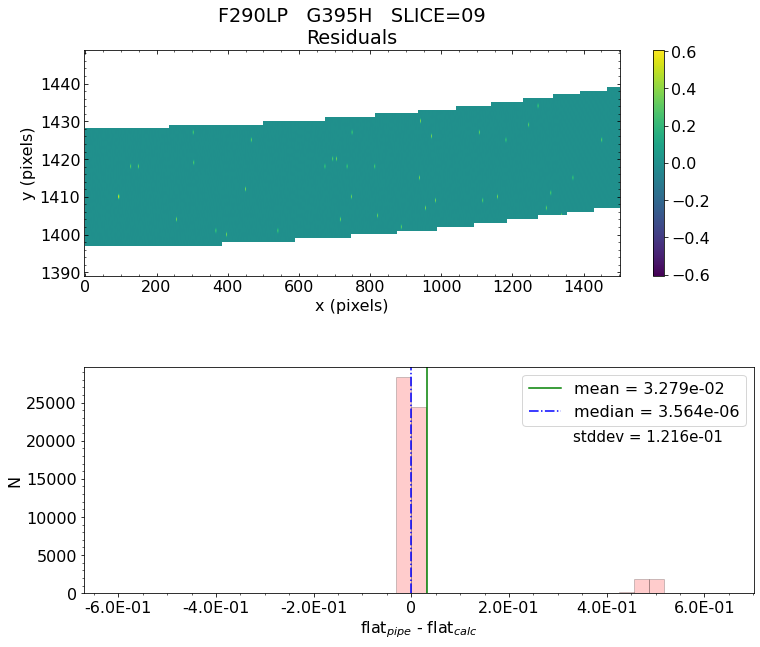

 *** Result of the test: PASSED


Working with slice: 10
 Subwindow origin:   px0=1   py0=534
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 10

   Absolute Flat Difference  :   mean = 3.392e-02    median = 3.263e-06    stdev = 1.227e-01
    Maximum   AbsoluteFlat Difference = 5.995e-01
    Minimum   AbsoluteFlat Difference = -9.347e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


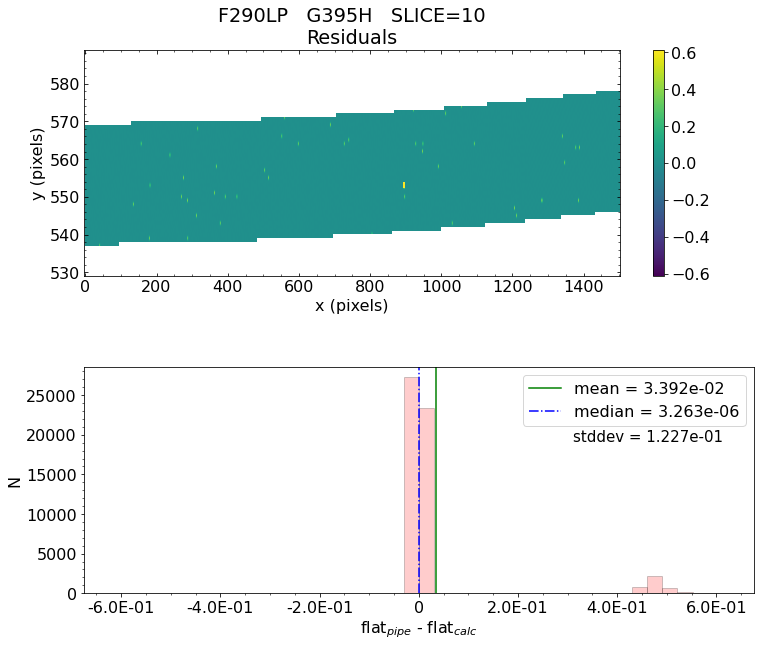

 *** Result of the test: PASSED


Working with slice: 11
 Subwindow origin:   px0=1   py0=1443
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 11

   Absolute Flat Difference  :   mean = 3.283e-02    median = 3.139e-06    stdev = 1.216e-01
    Maximum   AbsoluteFlat Difference = 6.244e-01
    Minimum   AbsoluteFlat Difference = -9.221e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


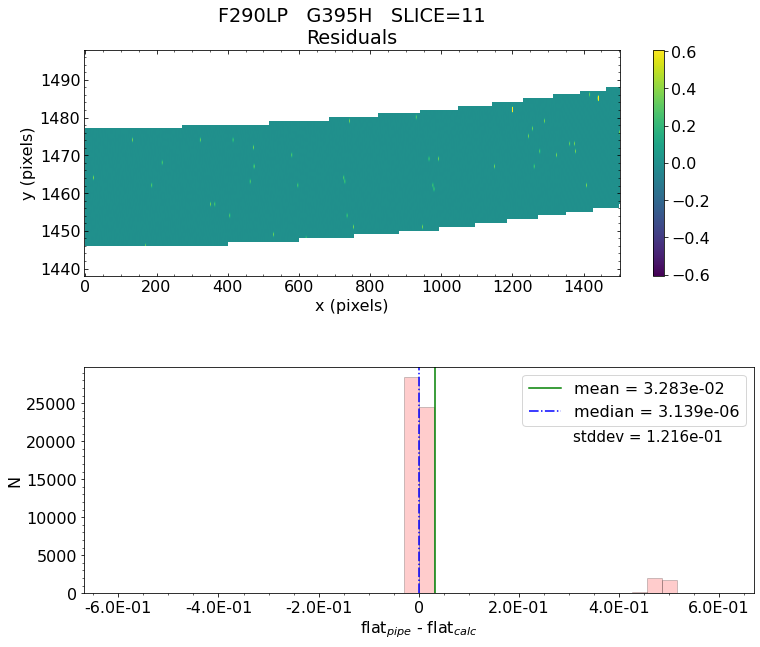

 *** Result of the test: PASSED


Working with slice: 12
 Subwindow origin:   px0=1   py0=485
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 12

   Absolute Flat Difference  :   mean = 3.422e-02    median = 3.260e-06    stdev = 1.237e-01
    Maximum   AbsoluteFlat Difference = 5.866e-01
    Minimum   AbsoluteFlat Difference = -1.459e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 16%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


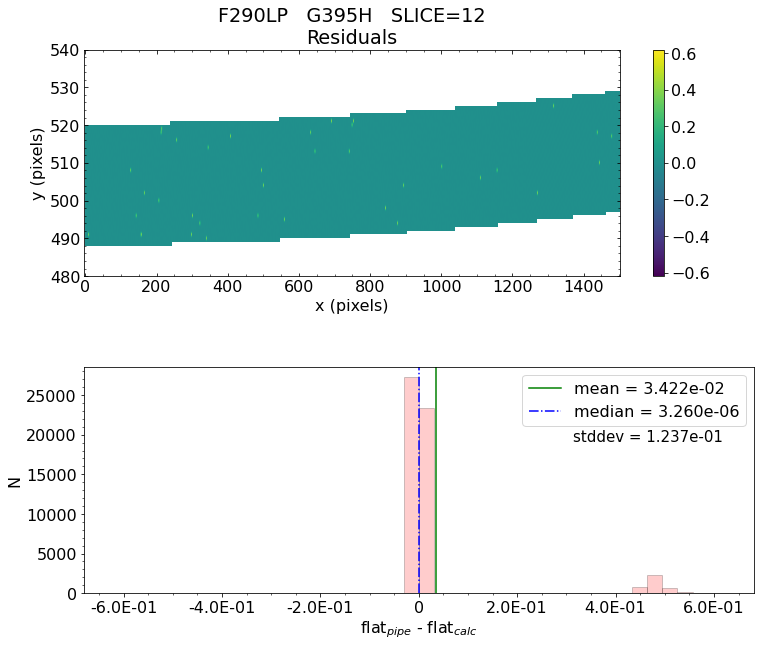

 *** Result of the test: PASSED


Working with slice: 13


 Subwindow origin:   px0=1   py0=1491
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 13

   Absolute Flat Difference  :   mean = 3.257e-02    median = 3.352e-06    stdev = 1.210e-01
    Maximum   AbsoluteFlat Difference = 5.460e-01
    Minimum   AbsoluteFlat Difference = -8.229e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


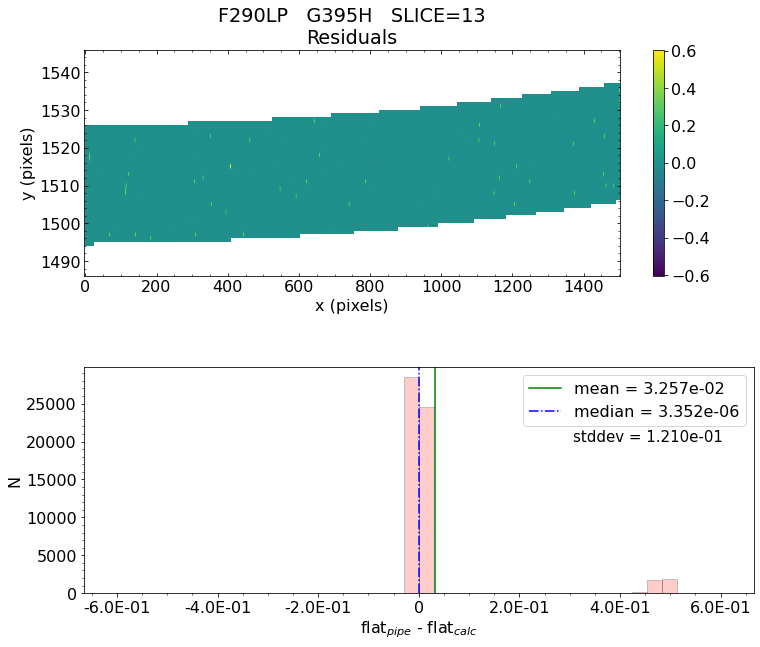

 *** Result of the test: PASSED


Working with slice: 14
 Subwindow origin:   px0=1   py0=436
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 14

   Absolute Flat Difference  :   mean = 3.427e-02    median = 3.463e-06    stdev = 1.240e-01
    Maximum   AbsoluteFlat Difference = 5.697e-01
    Minimum   AbsoluteFlat Difference = -8.729e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 16%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


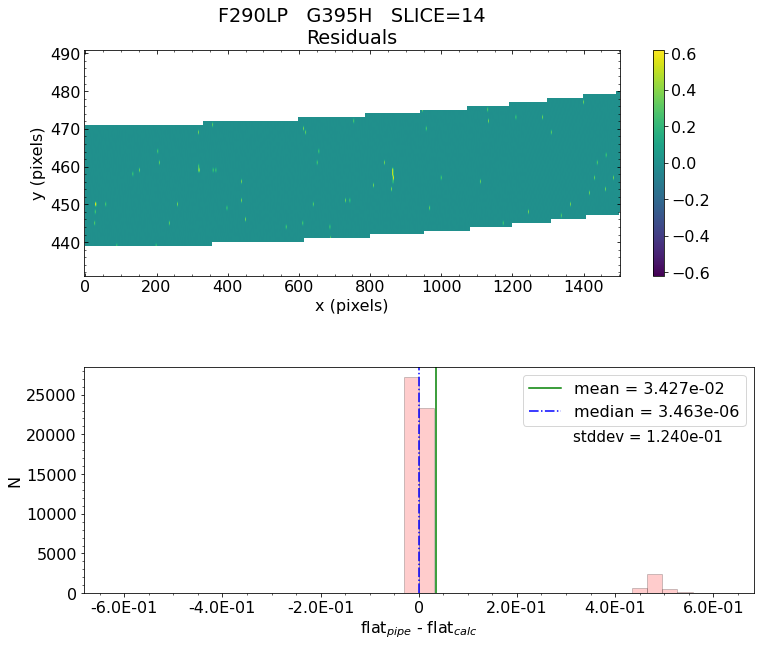

 *** Result of the test: PASSED


Working with slice: 15
 Subwindow origin:   px0=1   py0=1540
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 15

   Absolute Flat Difference  :   mean = 3.243e-02    median = 3.312e-06    stdev = 1.208e-01
    Maximum   AbsoluteFlat Difference = 5.472e-01
    Minimum   AbsoluteFlat Difference = -8.280e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 16%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


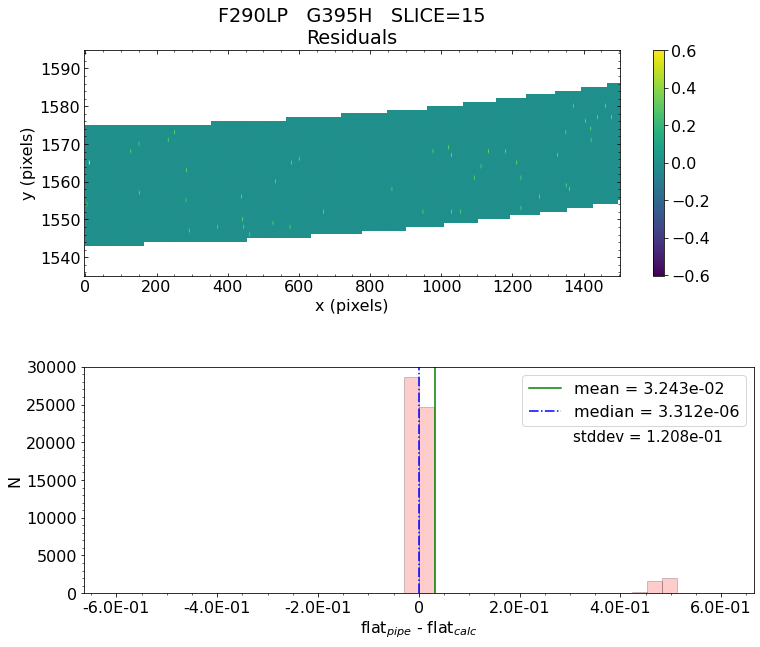

 *** Result of the test: PASSED


Working with slice: 16
 Subwindow origin:   px0=1   py0=387
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 16

   Absolute Flat Difference  :   mean = 3.436e-02    median = 3.497e-06    stdev = 1.240e-01
    Maximum   AbsoluteFlat Difference = 5.692e-01
    Minimum   AbsoluteFlat Difference = -9.005e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 16%
                            ->  3xtheshold = 8%
                            ->  5xtheshold = 7%
Making the plot for this slice...


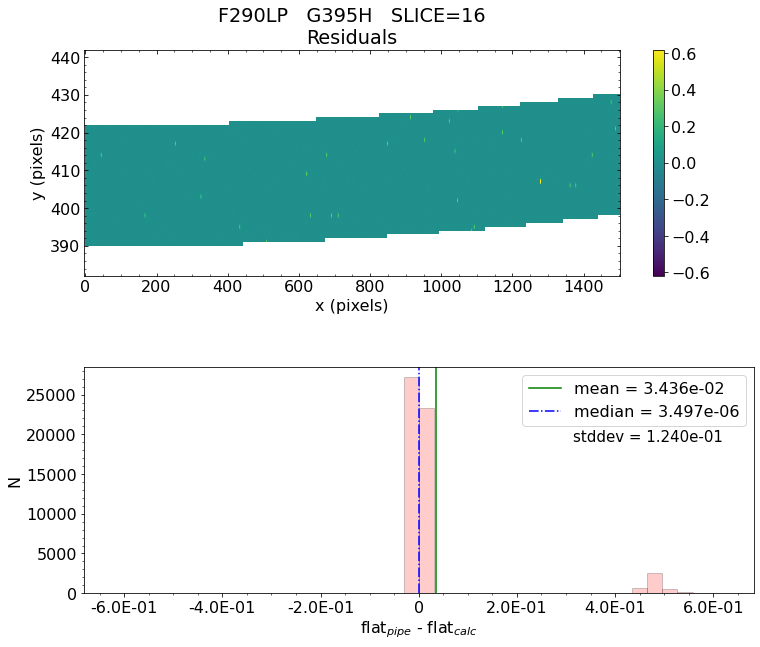

 *** Result of the test: PASSED


Working with slice: 17
 Subwindow origin:   px0=1   py0=1589
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 17

   Absolute Flat Difference  :   mean = 3.224e-02    median = 3.452e-06    stdev = 1.204e-01
    Maximum   AbsoluteFlat Difference = 5.919e-01
    Minimum   AbsoluteFlat Difference = -7.677e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


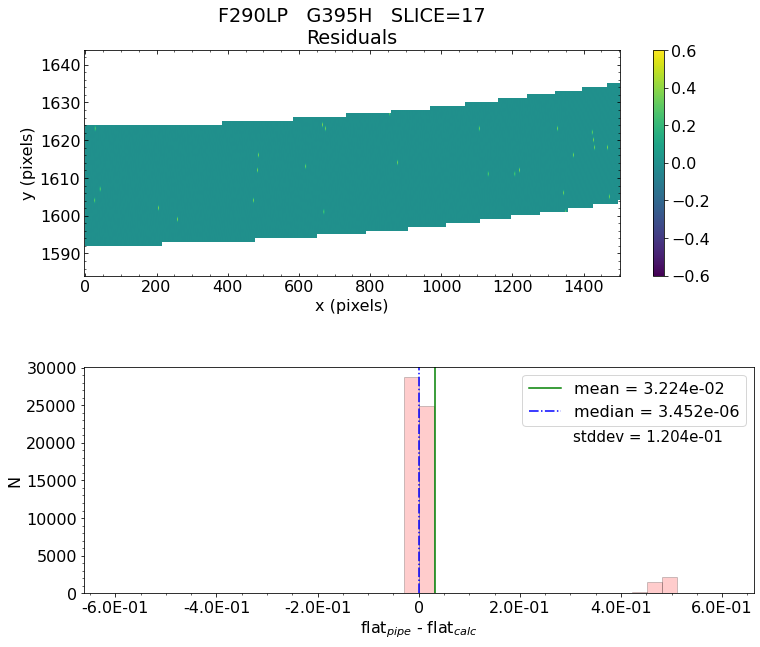

 *** Result of the test: PASSED


Working with slice: 18
 Subwindow origin:   px0=1   py0=337
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 18

   Absolute Flat Difference  :   mean = 3.430e-02    median = 3.267e-06    stdev = 1.239e-01
    Maximum   AbsoluteFlat Difference = 5.769e-01
    Minimum   AbsoluteFlat Difference = -9.155e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 16%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


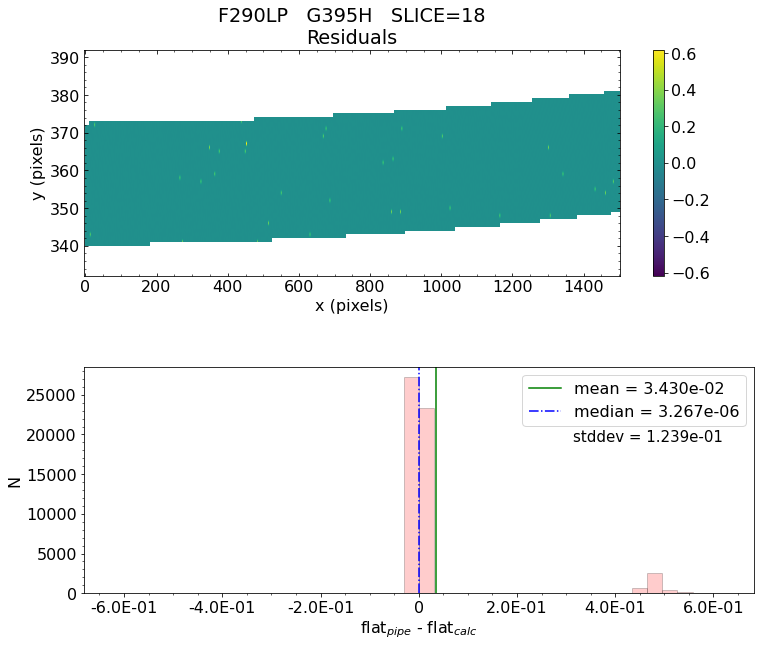

 *** Result of the test: PASSED


Working with slice: 19
 Subwindow origin:   px0=1   py0=1638
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 19

   Absolute Flat Difference  :   mean = 3.230e-02    median = 3.502e-06    stdev = 1.205e-01
    Maximum   AbsoluteFlat Difference = 6.734e-01
    Minimum   AbsoluteFlat Difference = -9.334e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


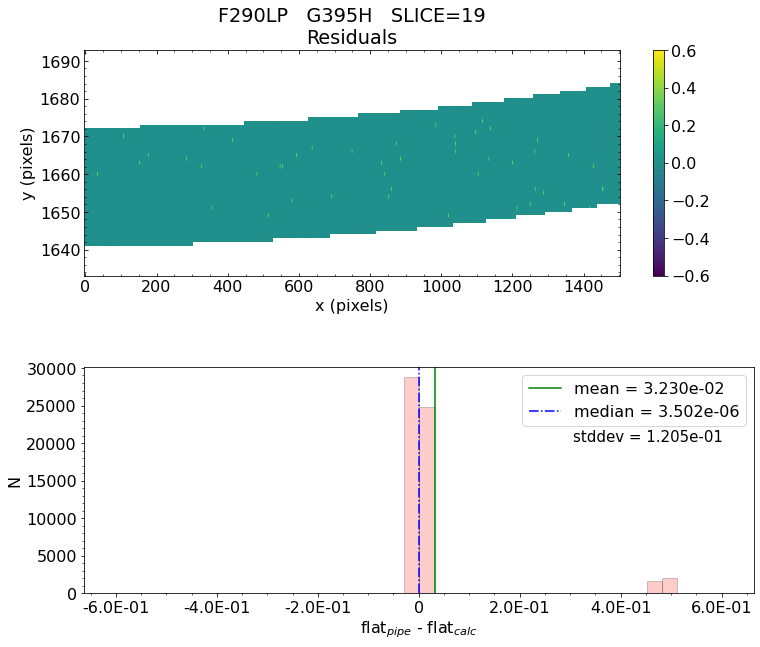

 *** Result of the test: PASSED


Working with slice: 20
 Subwindow origin:   px0=1   py0=288
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 20

   Absolute Flat Difference  :   mean = 3.461e-02    median = 3.525e-06    stdev = 1.247e-01
    Maximum   AbsoluteFlat Difference = 5.924e-01
    Minimum   AbsoluteFlat Difference = -8.683e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 16%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


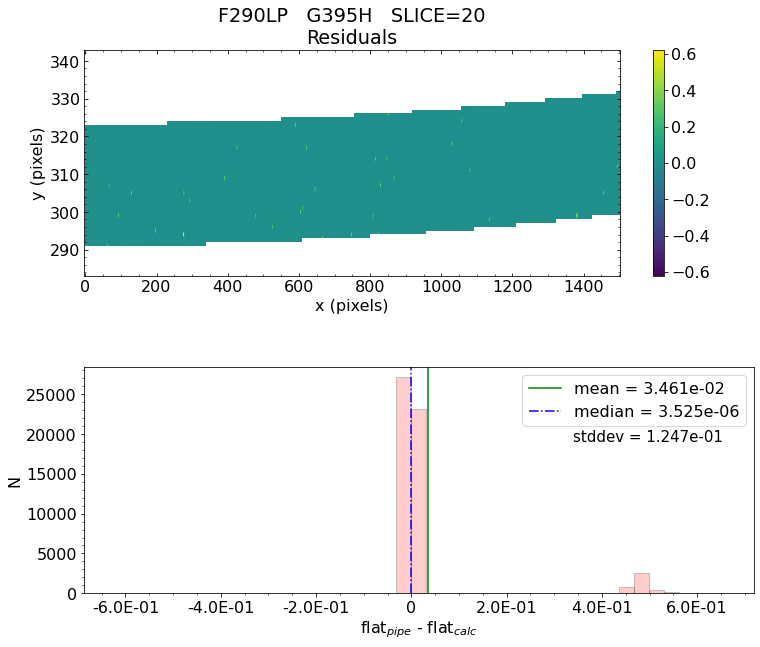

 *** Result of the test: PASSED


Working with slice: 21


 Subwindow origin:   px0=1   py0=1687
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 21

   Absolute Flat Difference  :   mean = 3.213e-02    median = 3.344e-06    stdev = 1.201e-01
    Maximum   AbsoluteFlat Difference = 5.872e-01
    Minimum   AbsoluteFlat Difference = -8.637e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


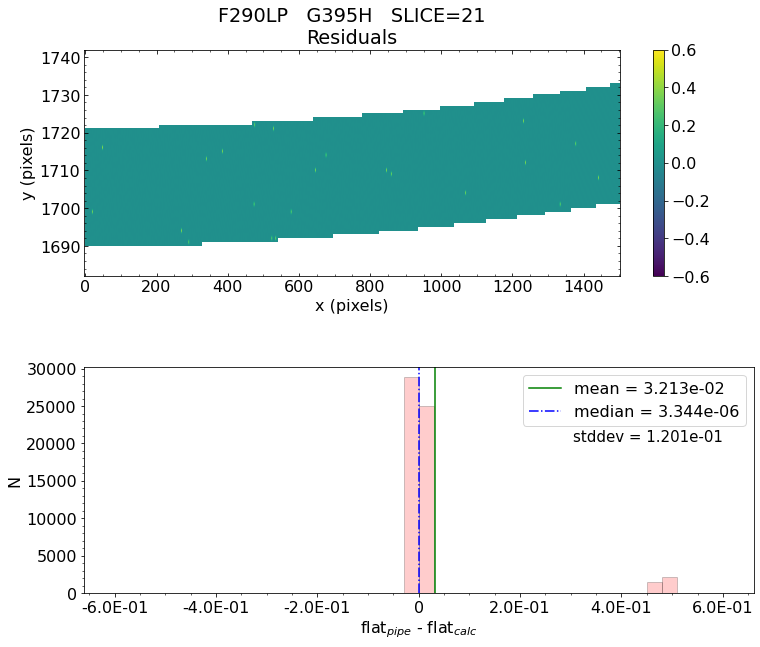

 *** Result of the test: PASSED


Working with slice: 22
 Subwindow origin:   px0=1   py0=239
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 22

   Absolute Flat Difference  :   mean = 3.501e-02    median = 3.550e-06    stdev = 1.260e-01
    Maximum   AbsoluteFlat Difference = 7.828e-01
    Minimum   AbsoluteFlat Difference = -9.306e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 8%
                            ->  5xtheshold = 7%
Making the plot for this slice...


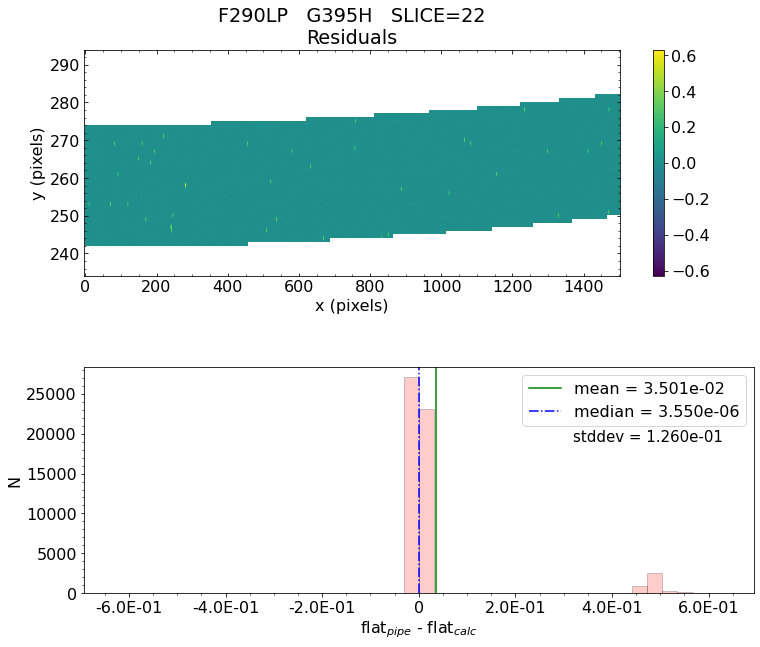

 *** Result of the test: PASSED


Working with slice: 23
 Subwindow origin:   px0=1   py0=1736
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 23

   Absolute Flat Difference  :   mean = 3.203e-02    median = 3.570e-06    stdev = 1.198e-01
    Maximum   AbsoluteFlat Difference = 5.444e-01
    Minimum   AbsoluteFlat Difference = -8.463e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


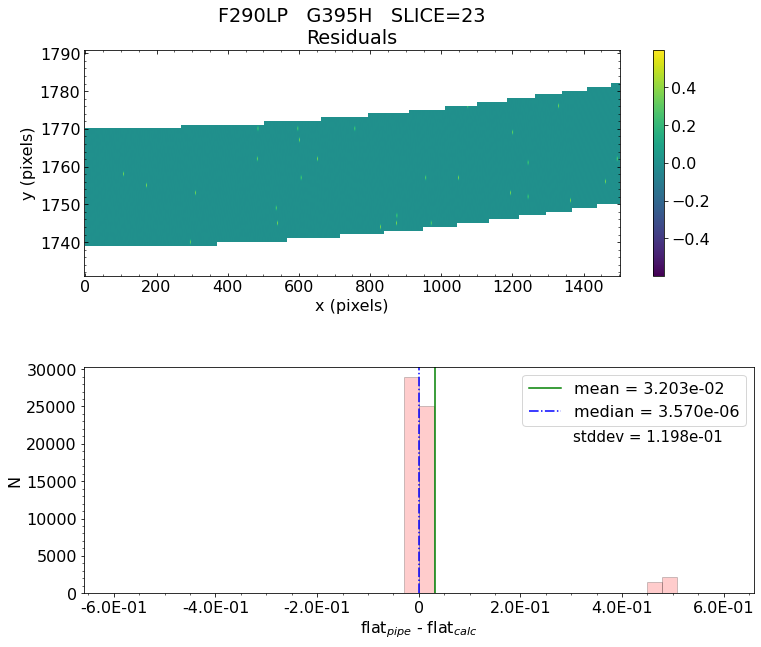

 *** Result of the test: PASSED


Working with slice: 24
 Subwindow origin:   px0=1   py0=189
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 24

   Absolute Flat Difference  :   mean = 3.503e-02    median = 3.476e-06    stdev = 1.261e-01
    Maximum   AbsoluteFlat Difference = 6.049e-01
    Minimum   AbsoluteFlat Difference = -8.911e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 8%
                            ->  5xtheshold = 7%
Making the plot for this slice...


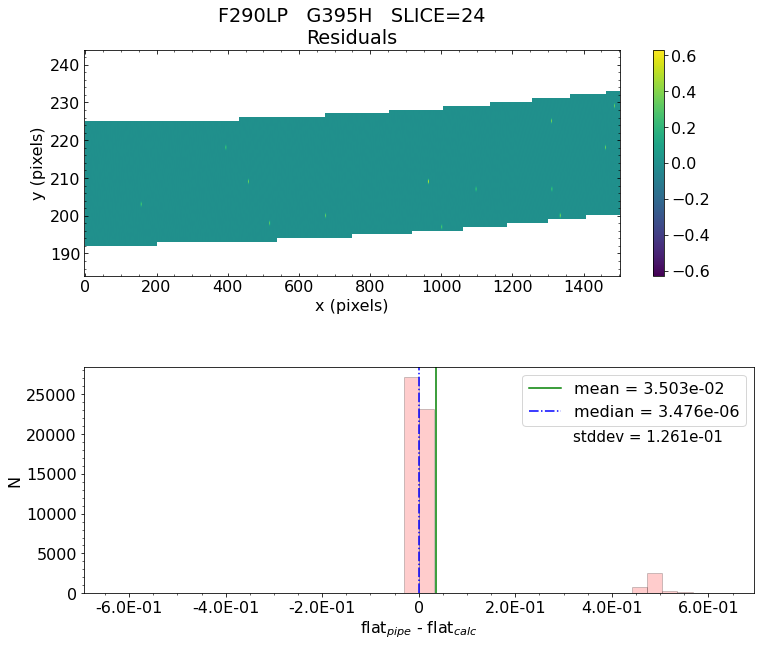

 *** Result of the test: PASSED


Working with slice: 25
 Subwindow origin:   px0=1   py0=1784
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 25

   Absolute Flat Difference  :   mean = 3.184e-02    median = 3.434e-06    stdev = 1.194e-01
    Maximum   AbsoluteFlat Difference = 5.577e-01
    Minimum   AbsoluteFlat Difference = -8.996e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


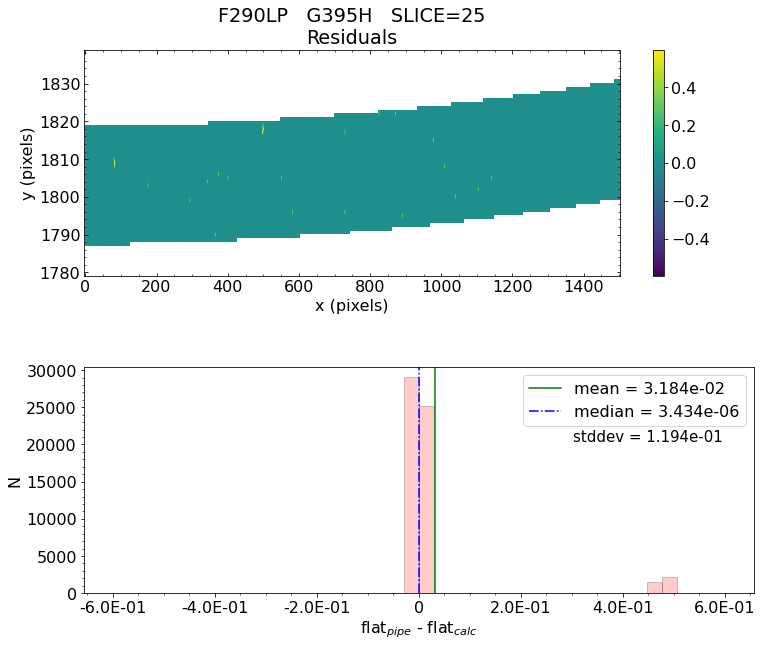

 *** Result of the test: PASSED


Working with slice: 26
 Subwindow origin:   px0=1   py0=140
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 26

   Absolute Flat Difference  :   mean = 3.556e-02    median = 3.446e-06    stdev = 1.273e-01
    Maximum   AbsoluteFlat Difference = 5.837e-01
    Minimum   AbsoluteFlat Difference = -8.995e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 8%
                            ->  5xtheshold = 7%
Making the plot for this slice...


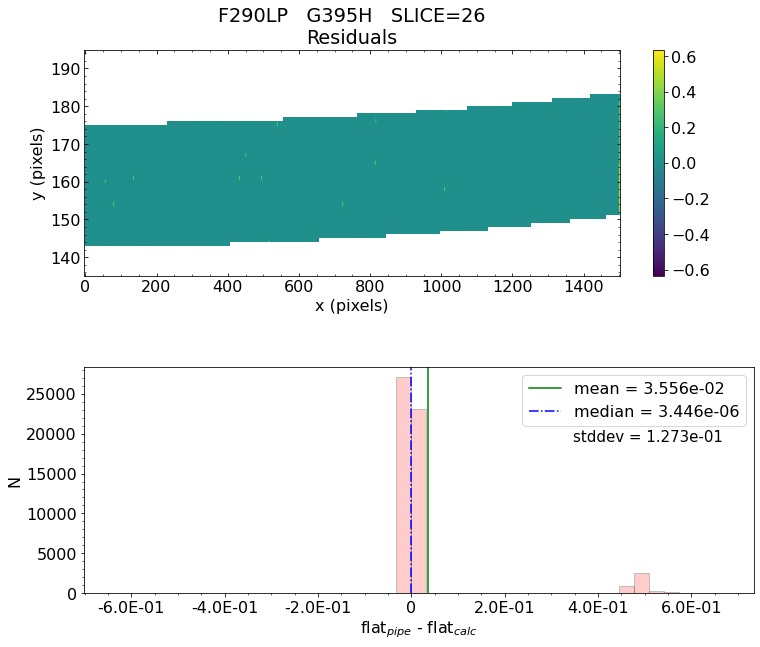

 *** Result of the test: PASSED


Working with slice: 27
 Subwindow origin:   px0=1   py0=1833
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 27

   Absolute Flat Difference  :   mean = 3.179e-02    median = 3.565e-06    stdev = 1.194e-01
    Maximum   AbsoluteFlat Difference = 8.581e-01
    Minimum   AbsoluteFlat Difference = -1.566e-03
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


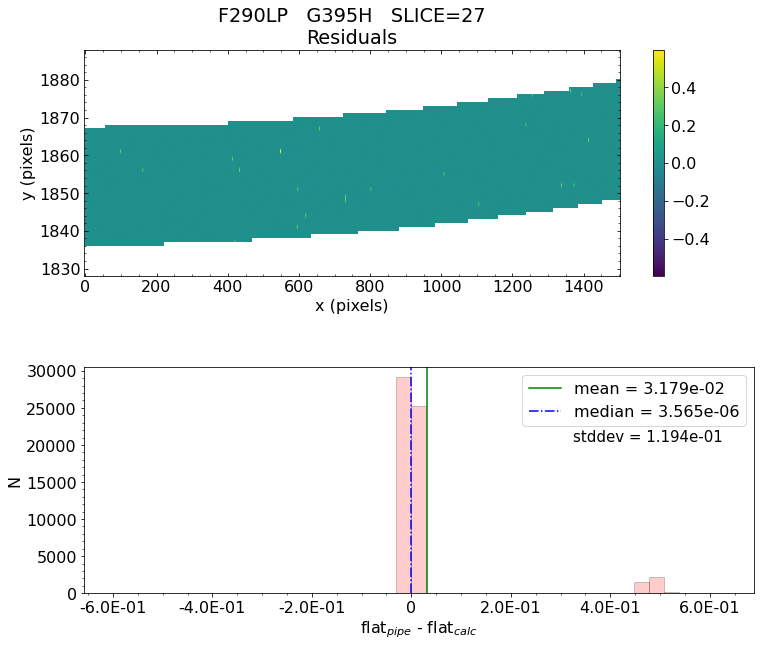

 *** Result of the test: PASSED


Working with slice: 28
 Subwindow origin:   px0=1   py0=90
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 28

   Absolute Flat Difference  :   mean = 3.509e-02    median = 2.911e-06    stdev = 1.260e-01
    Maximum   AbsoluteFlat Difference = 5.756e-01
    Minimum   AbsoluteFlat Difference = -7.690e-04
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 14%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
Making the plot for this slice...


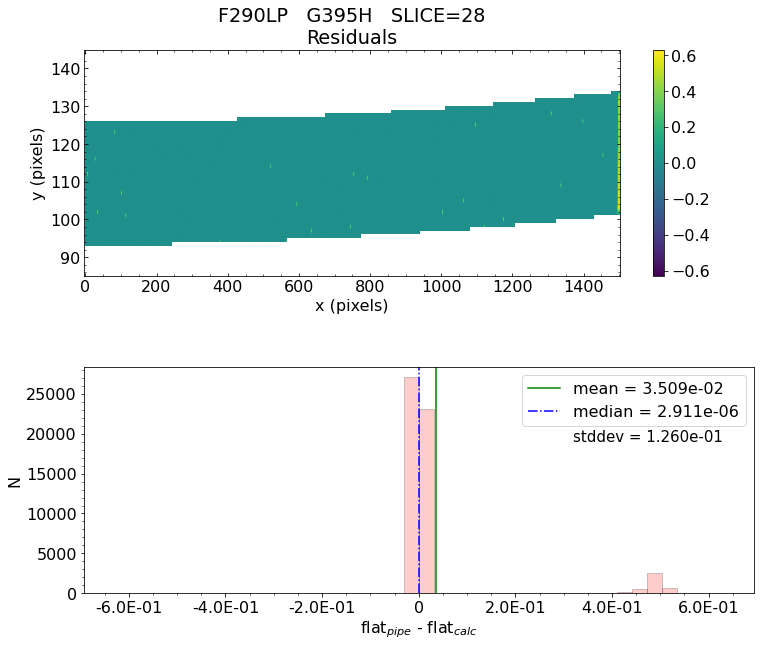

 *** Result of the test: PASSED


Working with slice: 29
 Subwindow origin:   px0=1   py0=1882
 Looping through the wavelength, this may take a little time ... 


Flat value differences for slice number: 29

   Absolute Flat Difference  :   mean = nan    median = nan    stdev = nan
    Maximum   AbsoluteFlat Difference = nan
    Minimum   AbsoluteFlat Difference = nan
    Percentage of pixels where median of absolute differences is greater than: 
                            ->  1xtheshold = 17%
                            ->  3xtheshold = 7%
                            ->  5xtheshold = 7%
 *** Result of the test: FAILED

Unable to determine mean, meadian, and std_dev for the slice29

 *** Final result for flat_field test will be reported as FAILED *** 

('* Script flattest_ifu.py script took ', '39.561210250854494 minutes to finish.')
Did flat_field validation test passed?  One or more slices FAILED flat_field test. 


Closing file:  popenfile(path='/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmpx70r3uw9/ifu_g395h_f290lp_nrs2_interpolatedflat.fits', fd=47, position=16804800, mode='r', flags=557056) 


Closing 

In [7]:
# set the D-flat path (used for all test data)
print('Getting D-Flats from Artifactory...')

dflat_nrs1 = get_bigdata('jwst_validation_notebooks',
                         'validation_data',
                         'nirspec_data', 
                         'nirspec_dflat_nrs1_f_01.03.fits')

dflat_nrs2 = get_bigdata('jwst_validation_notebooks',
                         'validation_data',
                         'nirspec_data', 
                         'nirspec_dflat_nrs2_f_01.03.fits')
print('Got D-flats')

# accepted threshold difference with respect to benchmark files
threshold_diff = 9.999e-5

# set NPTT switches for this test
writefile = False
save_figs = False
show_figs = True


# Get the data
results_dict = {}
detectors = ['nrs1', 'nrs2']
print('Starting to run pipeline and test...')
for mode_config, data_set_dict in testing_data.items():
    for det in detectors:
        print('Testing files for detector: ', det)
        data = get_artifactory_file(data_set_dict, det)
        uncal_file, sflat, fflat, msa_shutter_config = data
        print('Working with uncal_file: ', uncal_file)
        uncal_basename = os.path.basename(uncal_file)
        dflat = dflat_nrs1
        if '2' in det:
            dflat = dflat_nrs2
        
        # Run the stage 1 pipeline 
        rate_object = Detector1Pipeline.call(uncal_file)
        # Make sure the MSA shutter configuration file is set up correctly
        if msa_shutter_config is not None:
            msa_metadata = rate_object.meta.instrument.msa_metadata_file
            if msa_metadata is None or msa_metadata == 'N/A':
                rate_object.meta.instrument.msa_metadata_file = msa_shutter_config

        # Run the stage 2 pipeline steps
        try:
            pipe_object = AssignWcsStep.call(rate_object)
            skip_file = False
        except:
            print("No open slits fall on detector ", det)
            print("Skipping test for this file. \n")
            skip_file = True
            
        if not skip_file:     
            # only run MSA flagging on IFU or MOS data
            if 'ifu' in uncal_basename.lower() or 'mos' in uncal_basename.lower():
                pipe_object = MSAFlagOpenStep.call(pipe_object)
            
            # only run extract_2d on non IFU data
            if 'ifu' not in uncal_basename.lower():
                pipe_object = Extract2dStep.call(pipe_object)
                
            pipe_object = SourceTypeStep.call(pipe_object)
            pipe_object = WavecorrStep.call(pipe_object)
            flat_field_object = FlatFieldStep.call(pipe_object, save_interpolated_flat=True)

            # Run the validation test
            %matplotlib inline
            interpolated_flat = os.path.basename(uncal_file).replace('uncal', 'interpolatedflat')
            if 'fs' in uncal_file.lower():
                print('Running flat field test for FS...')
                result, result_msg, log_msgs = nptt.calwebb_spec2_pytests.auxiliary_code.flattest_fs.flattest(
                                                                                flat_field_object,
                                                                                dflat_path=dflat,
                                                                                sflat_path=sflat, 
                                                                                fflat_path=fflat,
                                                                                writefile=writefile,
                                                                                show_figs=show_figs, 
                                                                                save_figs=save_figs,
                                                                                interpolated_flat=interpolated_flat,
                                                                                threshold_diff=threshold_diff,
                                                                                debug=False)
            if 'mos' in uncal_file.lower():
                print('Running flat field test for MOS...')
                result, result_msg, log_msgs = nptt.calwebb_spec2_pytests.auxiliary_code.flattest_mos.flattest(
                                                                                flat_field_object,
                                                                                dflat_path=dflat,
                                                                                sflat_path=sflat, 
                                                                                fflat_path=fflat,
                                                                                msa_shutter_conf=msa_shutter_config,     
                                                                                writefile=writefile,
                                                                                show_figs=show_figs, 
                                                                                save_figs=save_figs,
                                                                                interpolated_flat=interpolated_flat,
                                                                                threshold_diff=threshold_diff,
                                                                                debug=False)
            if 'ifu' in uncal_file.lower():
                print('Running flat field test for IFU...')
                result, result_msg, log_msgs = nptt.calwebb_spec2_pytests.auxiliary_code.flattest_ifu.flattest(
                                                                                flat_field_object,
                                                                                dflat_path=dflat,
                                                                                sflat_path=sflat, 
                                                                                fflat_path=fflat,
                                                                                writefile=writefile,
                                                                                mk_all_slices_plt=False, 
                                                                                show_figs=show_figs, 
                                                                                save_figs=save_figs,
                                                                                interpolated_flat=interpolated_flat,
                                                                                threshold_diff=threshold_diff,
                                                                                debug=False)

        else:
            result_msg = 'skipped'

        # Did the test passed 
        print("Did flat_field validation test passed? ", result_msg, "\n\n")
        rd = {uncal_basename: result_msg}
        results_dict.update(rd)
        
        # close all open files
        psutil.Process().open_files()
        closing_files = []
        for fd in psutil.Process().open_files():
            if data_dir.name in fd.path:
                closing_files.append(fd)
        for fd in closing_files:
            try:
                print('Closing file: ', fd, '\n\n')
                open(fd.fd).close()
            except:
                print('File already closed: ', fd, '\n\n')


In [8]:
# Quickly see if the test passed 

print('These are the final results of the tests: ')
for key, val in results_dict.items():
    print(key, val)
    

These are the final results of the tests: 
fs_prism_nrs1_uncal.fits All slits PASSED flat_field test.
fs_prism_nrs2_uncal.fits All slits PASSED flat_field test.
fs_fullframe_g395h_f290lp_nrs1_uncal.fits All slits PASSED flat_field test.
fs_fullframe_g395h_f290lp_nrs2_uncal.fits All slits PASSED flat_field test.
mos_prism_nrs1_uncal.fits All slitlets PASSED flat_field test.
mos_prism_nrs2_uncal.fits skipped
mos_g140m_line1_NRS1_uncal.fits All slitlets PASSED flat_field test.
mos_g140m_line1_NRS2_uncal.fits All slitlets PASSED flat_field test.
ifu_prism_nrs1_uncal.fits All slices PASSED flat_field test.
ifu_prism_nrs2_uncal.fits skipped
ifu_g395h_f290lp_nrs1_uncal.fits One or more slices FAILED flat_field test.
ifu_g395h_f290lp_nrs2_uncal.fits One or more slices FAILED flat_field test.


/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<a id="about_ID"></a>
## About this Notebook
**Author:** Maria A. Pena-Guerrero, Staff Scientist II - Systems Science Support, NIRSpec
<br>**Updated On:** April/7/2021

[Top of Page](#title_ID)
<img style="float: right;" src="./stsci_pri_combo_mark_horizonal_white_bkgd.png" alt="stsci_pri_combo_mark_horizonal_white_bkgd" width="200px"/> 